## Germany No Export Import Scenario with 130 €/t CO2 price

In [1]:
import pypsa 
import matplotlib.pyplot as plt
plt.style.use("bmh")
import pandas as pd
from pypsa.plot import add_legend_patches
import gurobipy
import cartopy.crs as ccrs
from pypsa.optimization import optimize
import matplotlib.cm as cm
import numpy as np

pd.set_option("display.max_rows", None)  # Display all rows
pd.set_option("display.max_columns", None)  # Display all columns


## Import Network

In [2]:
n = pypsa.Network("C:\\Users\\Jeremy\\Documents\\MasterThesis\\Models\\Model_DE\\20240405_20nodes\\elec_s_20_ec_lv1.5_3h.nc")

INFO:pypsa.io:Imported network elec_s_20_ec_lv1.5_3h.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units


In [3]:
# add co2price
co2_price = 130 #€/t

for index in n.generators.index:
    emission = n.carriers.co2_emissions.filter(like= n.generators.carrier[index]) #t/MWh_th
    n.generators.at[index,'marginal_cost'] = n.generators.at[index,'marginal_cost'] + (emission * co2_price/n.generators.at[index,'efficiency']) # €/MWhel

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\3184507867.py:6: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  n.generators.at[index,'marginal_cost'] = n.generators.at[index,'marginal_cost'] + (emission * co2_price/n.generators.at[index,'efficiency']) # €/MWhel


In [4]:
for c in n.iterate_components(list(n.components.keys())[2:]):
    print("Component '{}' has {} entries".format(c.name,len(c.df)))

Component 'Bus' has 20 entries
Component 'Carrier' has 21 entries
Component 'GlobalConstraint' has 1 entries
Component 'Line' has 27 entries
Component 'LineType' has 34 entries
Component 'TransformerType' has 14 entries
Component 'Link' has 28 entries
Component 'Load' has 20 entries
Component 'Generator' has 261 entries
Component 'StorageUnit' has 65 entries


In [5]:
#remove nuclear fleet from germany
n.generators.loc[n.generators.index.str.startswith('DE') & n.generators.index.str.endswith('nuclear'), 'p_nom'] = 0


In [6]:
# set marginal cost of load shedding to 3000€/MWh
for bus in n.generators.bus:
    for index in n.generators.index:
        if not bus.endswith('H2') and index.endswith('load'):
            n.generators.loc[index, 'marginal_cost'] = 3000

#edit load shedding's unit from kW to MW
for index in n.generators.index:
    if index.endswith('load') and not index.endswith('H2 load'):
        n.generators.loc[index, 'sign'] = 1

In [48]:
#solve network
n.optimize(solver_name='gurobi')
#n.lopf(solver_name='gurobi')

INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.


Writing continuous variables.: 100%|██████████| 12/12 [00:05<00:00,  2.09it/s]
INFO:linopy.io: Writing time: 38.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-co96pmiq.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-co96pmiq.lp


Reading time = 11.89 seconds


INFO:gurobipy:Reading time = 11.89 seconds


obj: 3264863 rows, 1521502 columns, 6235954 nonzeros


INFO:gurobipy:obj: 3264863 rows, 1521502 columns, 6235954 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 3264863 rows, 1521502 columns and 6235954 nonzeros


INFO:gurobipy:Optimize a model with 3264863 rows, 1521502 columns and 6235954 nonzeros


Model fingerprint: 0x61697209


INFO:gurobipy:Model fingerprint: 0x61697209


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-02, 1e+03]


INFO:gurobipy:  Matrix range     [1e-02, 1e+03]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [1e+00, 2e+10]


INFO:gurobipy:  Bounds range     [1e+00, 2e+10]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 2121745 rows and 372364 columns (presolve time = 5s) ...


INFO:gurobipy:Presolve removed 2121745 rows and 372364 columns (presolve time = 5s) ...


Presolve removed 2121745 rows and 372364 columns


INFO:gurobipy:Presolve removed 2121745 rows and 372364 columns


Presolve time: 7.17s


INFO:gurobipy:Presolve time: 7.17s


Presolved: 1143118 rows, 1149138 columns, 3794406 nonzeros


INFO:gurobipy:Presolved: 1143118 rows, 1149138 columns, 3794406 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Elapsed ordering time = 9s


INFO:gurobipy:Elapsed ordering time = 9s


Elapsed ordering time = 10s


INFO:gurobipy:Elapsed ordering time = 10s


Ordering time: 17.41s


INFO:gurobipy:Ordering time: 17.41s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 181


INFO:gurobipy: Dense cols : 181


 AA' NZ     : 4.035e+06


INFO:gurobipy: AA' NZ     : 4.035e+06


 Factor NZ  : 2.941e+07 (roughly 1.2 GB of memory)


INFO:gurobipy: Factor NZ  : 2.941e+07 (roughly 1.2 GB of memory)


 Factor Ops : 6.354e+09 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 6.354e+09 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   6.31157124e+17 -8.63354864e+18  2.85e+10 9.06e+04  8.83e+13    30s


INFO:gurobipy:   0   6.31157124e+17 -8.63354864e+18  2.85e+10 9.06e+04  8.83e+13    30s


   1   5.51458664e+17 -3.71126918e+18  1.77e+10 3.08e+04  5.63e+13    32s


INFO:gurobipy:   1   5.51458664e+17 -3.71126918e+18  1.77e+10 3.08e+04  5.63e+13    32s


   2   4.54011429e+17 -1.88917555e+18  1.41e+10 1.23e+04  3.89e+13    35s


INFO:gurobipy:   2   4.54011429e+17 -1.88917555e+18  1.41e+10 1.23e+04  3.89e+13    35s


   3   3.43180565e+17 -1.41946105e+18  9.28e+09 7.90e+03  2.50e+13    39s


INFO:gurobipy:   3   3.43180565e+17 -1.41946105e+18  9.28e+09 7.90e+03  2.50e+13    39s


   4   2.83738437e+17 -7.56568029e+17  4.86e+09 2.98e+03  1.25e+13    42s


INFO:gurobipy:   4   2.83738437e+17 -7.56568029e+17  4.86e+09 2.98e+03  1.25e+13    42s


   5   2.26118710e+17 -2.64872401e+17  1.84e+09 7.83e+02  4.50e+12    44s


INFO:gurobipy:   5   2.26118710e+17 -2.64872401e+17  1.84e+09 7.83e+02  4.50e+12    44s


   6   1.35222323e+17 -5.53237846e+16  4.83e+08 1.16e+02  1.15e+12    46s


INFO:gurobipy:   6   1.35222323e+17 -5.53237846e+16  4.83e+08 1.16e+02  1.15e+12    46s


   7   2.28256107e+16 -8.54538102e+15  6.64e+06 2.19e+00  2.73e+10    49s


INFO:gurobipy:   7   2.28256107e+16 -8.54538102e+15  6.64e+06 2.19e+00  2.73e+10    49s


   8   2.91979562e+15 -1.32124122e+15  7.02e+05 1.29e-01  3.12e+09    52s


INFO:gurobipy:   8   2.91979562e+15 -1.32124122e+15  7.02e+05 1.29e-01  3.12e+09    52s


   9   1.61348842e+15 -8.30010086e+14  3.60e+05 6.04e-02  1.66e+09    54s


INFO:gurobipy:   9   1.61348842e+15 -8.30010086e+14  3.60e+05 6.04e-02  1.66e+09    54s


  10   1.35911604e+15 -5.59390786e+14  2.97e+05 3.24e-02  1.29e+09    57s


INFO:gurobipy:  10   1.35911604e+15 -5.59390786e+14  2.97e+05 3.24e-02  1.29e+09    57s


  11   7.75630251e+14 -3.53498737e+14  1.61e+05 1.54e-02  7.18e+08    59s


INFO:gurobipy:  11   7.75630251e+14 -3.53498737e+14  1.61e+05 1.54e-02  7.18e+08    59s


  12   6.10073702e+14 -1.38289402e+14  1.22e+05 1.48e-03  4.67e+08    62s


INFO:gurobipy:  12   6.10073702e+14 -1.38289402e+14  1.22e+05 1.48e-03  4.67e+08    62s


  13   3.97725550e+14 -6.93846975e+13  7.53e+04 6.60e-05  2.74e+08    64s


INFO:gurobipy:  13   3.97725550e+14 -6.93846975e+13  7.53e+04 6.60e-05  2.74e+08    64s


  14   1.81848850e+14 -2.93036011e+13  2.78e+04 1.28e-04  1.14e+08    68s


INFO:gurobipy:  14   1.81848850e+14 -2.93036011e+13  2.78e+04 1.28e-04  1.14e+08    68s


  15   4.63160681e+13 -1.13997956e+13  2.09e+03 2.81e-05  2.84e+07    71s


INFO:gurobipy:  15   4.63160681e+13 -1.13997956e+13  2.09e+03 2.81e-05  2.84e+07    71s


  16   1.82917956e+13 -8.31382949e+12  8.01e+02 1.94e-05  1.24e+07    73s


INFO:gurobipy:  16   1.82917956e+13 -8.31382949e+12  8.01e+02 1.94e-05  1.24e+07    73s


  17   1.10627860e+13 -6.91851544e+12  4.81e+02 1.47e-05  8.16e+06    75s


INFO:gurobipy:  17   1.10627860e+13 -6.91851544e+12  4.81e+02 1.47e-05  8.16e+06    75s


  18   7.96947901e+12 -6.30291485e+12  3.50e+02 1.20e-05  6.37e+06    77s


INFO:gurobipy:  18   7.96947901e+12 -6.30291485e+12  3.50e+02 1.20e-05  6.37e+06    77s


  19   4.58792449e+12 -4.72300730e+12  1.95e+02 8.55e-06  4.03e+06    80s


INFO:gurobipy:  19   4.58792449e+12 -4.72300730e+12  1.95e+02 8.55e-06  4.03e+06    80s


  20   2.74552537e+12 -4.49619093e+12  1.16e+02 8.15e-06  3.07e+06    83s


INFO:gurobipy:  20   2.74552537e+12 -4.49619093e+12  1.16e+02 8.15e-06  3.07e+06    83s


  21   1.62406758e+12 -3.03273530e+12  5.93e+01 5.46e-06  1.93e+06    86s


INFO:gurobipy:  21   1.62406758e+12 -3.03273530e+12  5.93e+01 5.46e-06  1.93e+06    86s


  22   1.04086591e+12 -2.06170517e+12  3.52e+01 3.76e-06  1.27e+06    90s


INFO:gurobipy:  22   1.04086591e+12 -2.06170517e+12  3.52e+01 3.76e-06  1.27e+06    90s


  23   6.41931981e+11 -1.52095841e+12  1.90e+01 2.84e-06  8.77e+05    93s


INFO:gurobipy:  23   6.41931981e+11 -1.52095841e+12  1.90e+01 2.84e-06  8.77e+05    93s


  24   4.38837530e+11 -1.01386303e+12  1.10e+01 2.00e-06  5.86e+05    96s


INFO:gurobipy:  24   4.38837530e+11 -1.01386303e+12  1.10e+01 2.00e-06  5.86e+05    96s


  25   4.29500145e+11 -9.40410895e+11  1.07e+01 1.87e-06  5.52e+05    98s


INFO:gurobipy:  25   4.29500145e+11 -9.40410895e+11  1.07e+01 1.87e-06  5.52e+05    98s


  26   3.15933489e+11 -5.91600951e+11  6.96e+00 1.20e-06  3.65e+05   100s


INFO:gurobipy:  26   3.15933489e+11 -5.91600951e+11  6.96e+00 1.20e-06  3.65e+05   100s


  27   2.43461664e+11 -3.06974439e+11  4.73e+00 6.56e-07  2.21e+05   102s


INFO:gurobipy:  27   2.43461664e+11 -3.06974439e+11  4.73e+00 6.56e-07  2.21e+05   102s


  28   1.81568049e+11 -2.01432424e+11  2.97e+00 4.63e-07  1.53e+05   106s


INFO:gurobipy:  28   1.81568049e+11 -2.01432424e+11  2.97e+00 4.63e-07  1.53e+05   106s


  29   1.47688052e+11 -3.25756298e+10  2.07e+00 1.49e-07  7.22e+04   110s


INFO:gurobipy:  29   1.47688052e+11 -3.25756298e+10  2.07e+00 1.49e-07  7.22e+04   110s


  30   1.16305615e+11  3.78568294e+09  1.33e+00 8.45e-08  4.50e+04   113s


INFO:gurobipy:  30   1.16305615e+11  3.78568294e+09  1.33e+00 8.45e-08  4.50e+04   113s


  31   1.06934615e+11  1.53041595e+10  1.12e+00 6.31e-08  3.67e+04   116s


INFO:gurobipy:  31   1.06934615e+11  1.53041595e+10  1.12e+00 6.31e-08  3.67e+04   116s


  32   1.04032349e+11  2.16699393e+10  1.06e+00 5.23e-08  3.29e+04   118s


INFO:gurobipy:  32   1.04032349e+11  2.16699393e+10  1.06e+00 5.23e-08  3.29e+04   118s


  33   9.69853961e+10  2.64807408e+10  9.03e-01 4.35e-08  2.82e+04   121s


INFO:gurobipy:  33   9.69853961e+10  2.64807408e+10  9.03e-01 4.35e-08  2.82e+04   121s


  34   8.79203368e+10  2.99054913e+10  7.18e-01 3.95e-08  2.32e+04   123s


INFO:gurobipy:  34   8.79203368e+10  2.99054913e+10  7.18e-01 3.95e-08  2.32e+04   123s


  35   8.20614197e+10  3.44994763e+10  5.99e-01 3.01e-08  1.90e+04   127s


INFO:gurobipy:  35   8.20614197e+10  3.44994763e+10  5.99e-01 3.01e-08  1.90e+04   127s


  36   7.75405160e+10  3.89908811e+10  5.05e-01 2.22e-08  1.54e+04   131s


INFO:gurobipy:  36   7.75405160e+10  3.89908811e+10  5.05e-01 2.22e-08  1.54e+04   131s


  37   7.23921699e+10  4.17940448e+10  3.99e-01 1.96e-08  1.22e+04   135s


INFO:gurobipy:  37   7.23921699e+10  4.17940448e+10  3.99e-01 1.96e-08  1.22e+04   135s


  38   6.77117200e+10  4.44347006e+10  2.98e-01 1.52e-08  9.31e+03   139s


INFO:gurobipy:  38   6.77117200e+10  4.44347006e+10  2.98e-01 1.52e-08  9.31e+03   139s


  39   6.49658757e+10  4.63008898e+10  2.39e-01 1.03e-08  7.46e+03   142s


INFO:gurobipy:  39   6.49658757e+10  4.63008898e+10  2.39e-01 1.03e-08  7.46e+03   142s


  40   6.24770146e+10  4.83234493e+10  1.85e-01 9.42e-09  5.66e+03   146s


INFO:gurobipy:  40   6.24770146e+10  4.83234493e+10  1.85e-01 9.42e-09  5.66e+03   146s


  41   6.15383370e+10  4.94934328e+10  1.66e-01 6.34e-09  4.82e+03   149s


INFO:gurobipy:  41   6.15383370e+10  4.94934328e+10  1.66e-01 6.34e-09  4.82e+03   149s


  42   5.98720565e+10  5.04034990e+10  1.32e-01 4.55e-09  3.79e+03   152s


INFO:gurobipy:  42   5.98720565e+10  5.04034990e+10  1.32e-01 4.55e-09  3.79e+03   152s


  43   5.88434754e+10  5.10195734e+10  1.10e-01 3.97e-09  3.13e+03   156s


INFO:gurobipy:  43   5.88434754e+10  5.10195734e+10  1.10e-01 3.97e-09  3.13e+03   156s


  44   5.77190189e+10  5.15753594e+10  8.67e-02 3.23e-09  2.46e+03   159s


INFO:gurobipy:  44   5.77190189e+10  5.15753594e+10  8.67e-02 3.23e-09  2.46e+03   159s


  45   5.67929840e+10  5.19043347e+10  6.71e-02 3.19e-09  1.95e+03   162s


INFO:gurobipy:  45   5.67929840e+10  5.19043347e+10  6.71e-02 3.19e-09  1.95e+03   162s


  46   5.63532644e+10  5.20774182e+10  5.81e-02 8.54e-09  1.71e+03   164s


INFO:gurobipy:  46   5.63532644e+10  5.20774182e+10  5.81e-02 8.54e-09  1.71e+03   164s


  47   5.58355045e+10  5.23522070e+10  4.72e-02 3.12e-08  1.39e+03   167s


INFO:gurobipy:  47   5.58355045e+10  5.23522070e+10  4.72e-02 3.12e-08  1.39e+03   167s


  48   5.56260213e+10  5.25602548e+10  4.31e-02 5.61e-08  1.23e+03   170s


INFO:gurobipy:  48   5.56260213e+10  5.25602548e+10  4.31e-02 5.61e-08  1.23e+03   170s


  49   5.54710674e+10  5.26135160e+10  4.00e-02 6.41e-08  1.14e+03   173s


INFO:gurobipy:  49   5.54710674e+10  5.26135160e+10  4.00e-02 6.41e-08  1.14e+03   173s


  50   5.53559062e+10  5.27013815e+10  3.76e-02 7.14e-08  1.06e+03   176s


INFO:gurobipy:  50   5.53559062e+10  5.27013815e+10  3.76e-02 7.14e-08  1.06e+03   176s


  51   5.51806220e+10  5.27552818e+10  3.37e-02 7.59e-08  9.70e+02   179s


INFO:gurobipy:  51   5.51806220e+10  5.27552818e+10  3.37e-02 7.59e-08  9.70e+02   179s


  52   5.49807490e+10  5.28632526e+10  2.97e-02 9.08e-08  8.47e+02   183s


INFO:gurobipy:  52   5.49807490e+10  5.28632526e+10  2.97e-02 9.08e-08  8.47e+02   183s


  53   5.48689410e+10  5.29293571e+10  2.73e-02 9.87e-08  7.76e+02   186s


INFO:gurobipy:  53   5.48689410e+10  5.29293571e+10  2.73e-02 9.87e-08  7.76e+02   186s


  54   5.47269476e+10  5.30280365e+10  2.43e-02 1.12e-07  6.79e+02   189s


INFO:gurobipy:  54   5.47269476e+10  5.30280365e+10  2.43e-02 1.12e-07  6.79e+02   189s


  55   5.45884440e+10  5.31069918e+10  2.15e-02 1.20e-07  5.92e+02   193s


INFO:gurobipy:  55   5.45884440e+10  5.31069918e+10  2.15e-02 1.20e-07  5.92e+02   193s


  56   5.44171176e+10  5.31676257e+10  1.79e-02 1.30e-07  5.00e+02   197s


INFO:gurobipy:  56   5.44171176e+10  5.31676257e+10  1.79e-02 1.30e-07  5.00e+02   197s


  57   5.42802549e+10  5.32359772e+10  1.50e-02 1.35e-07  4.18e+02   200s


INFO:gurobipy:  57   5.42802549e+10  5.32359772e+10  1.50e-02 1.35e-07  4.18e+02   200s


  58   5.41063097e+10  5.32603856e+10  1.15e-02 1.34e-07  3.38e+02   204s


INFO:gurobipy:  58   5.41063097e+10  5.32603856e+10  1.15e-02 1.34e-07  3.38e+02   204s


  59   5.39932143e+10  5.33052204e+10  9.18e-03 1.34e-07  2.75e+02   207s


INFO:gurobipy:  59   5.39932143e+10  5.33052204e+10  9.18e-03 1.34e-07  2.75e+02   207s


  60   5.39091711e+10  5.33312836e+10  7.47e-03 1.33e-07  2.31e+02   210s


INFO:gurobipy:  60   5.39091711e+10  5.33312836e+10  7.47e-03 1.33e-07  2.31e+02   210s


  61   5.38574914e+10  5.33410201e+10  6.42e-03 1.31e-07  2.07e+02   213s


INFO:gurobipy:  61   5.38574914e+10  5.33410201e+10  6.42e-03 1.31e-07  2.07e+02   213s


  62   5.38264688e+10  5.33653237e+10  5.78e-03 1.25e-07  1.84e+02   217s


INFO:gurobipy:  62   5.38264688e+10  5.33653237e+10  5.78e-03 1.25e-07  1.84e+02   217s


  63   5.37630379e+10  5.34016462e+10  4.49e-03 1.23e-07  1.45e+02   220s


INFO:gurobipy:  63   5.37630379e+10  5.34016462e+10  4.49e-03 1.23e-07  1.45e+02   220s


  64   5.37322524e+10  5.34193020e+10  3.87e-03 1.18e-07  1.25e+02   224s


INFO:gurobipy:  64   5.37322524e+10  5.34193020e+10  3.87e-03 1.18e-07  1.25e+02   224s


  65   5.37186713e+10  5.34322797e+10  3.59e-03 1.14e-07  1.15e+02   226s


INFO:gurobipy:  65   5.37186713e+10  5.34322797e+10  3.59e-03 1.14e-07  1.15e+02   226s


  66   5.37104631e+10  5.34393334e+10  3.43e-03 1.12e-07  1.08e+02   229s


INFO:gurobipy:  66   5.37104631e+10  5.34393334e+10  3.43e-03 1.12e-07  1.08e+02   229s


  67   5.36751064e+10  5.34568664e+10  2.73e-03 1.07e-07  8.73e+01   232s


INFO:gurobipy:  67   5.36751064e+10  5.34568664e+10  2.73e-03 1.07e-07  8.73e+01   232s


  68   5.36626366e+10  5.34678003e+10  2.48e-03 1.01e-07  7.79e+01   235s


INFO:gurobipy:  68   5.36626366e+10  5.34678003e+10  2.48e-03 1.01e-07  7.79e+01   235s


  69   5.36439509e+10  5.34785249e+10  2.11e-03 9.61e-08  6.61e+01   238s


INFO:gurobipy:  69   5.36439509e+10  5.34785249e+10  2.11e-03 9.61e-08  6.61e+01   238s


  70   5.36278603e+10  5.34831749e+10  1.80e-03 9.29e-08  5.79e+01   241s


INFO:gurobipy:  70   5.36278603e+10  5.34831749e+10  1.80e-03 9.29e-08  5.79e+01   241s


  71   5.36104318e+10  5.34926503e+10  1.46e-03 8.39e-08  4.71e+01   244s


INFO:gurobipy:  71   5.36104318e+10  5.34926503e+10  1.46e-03 8.39e-08  4.71e+01   244s


  72   5.36049844e+10  5.35038623e+10  1.35e-03 6.88e-08  4.04e+01   247s


INFO:gurobipy:  72   5.36049844e+10  5.35038623e+10  1.35e-03 6.88e-08  4.04e+01   247s


  73   5.35961792e+10  5.35067579e+10  1.18e-03 6.61e-08  3.58e+01   251s


INFO:gurobipy:  73   5.35961792e+10  5.35067579e+10  1.18e-03 6.61e-08  3.58e+01   251s


  74   5.35824492e+10  5.35108135e+10  9.19e-04 5.97e-08  2.86e+01   254s


INFO:gurobipy:  74   5.35824492e+10  5.35108135e+10  9.19e-04 5.97e-08  2.86e+01   254s


  75   5.35747358e+10  5.35144237e+10  7.71e-04 5.24e-08  2.41e+01   257s


INFO:gurobipy:  75   5.35747358e+10  5.35144237e+10  7.71e-04 5.24e-08  2.41e+01   257s


  76   5.35691941e+10  5.35177526e+10  6.65e-04 4.47e-08  2.06e+01   260s


INFO:gurobipy:  76   5.35691941e+10  5.35177526e+10  6.65e-04 4.47e-08  2.06e+01   260s


  77   5.35626827e+10  5.35209379e+10  5.40e-04 3.87e-08  1.67e+01   263s


INFO:gurobipy:  77   5.35626827e+10  5.35209379e+10  5.40e-04 3.87e-08  1.67e+01   263s


  78   5.35570911e+10  5.35231066e+10  4.34e-04 3.61e-08  1.36e+01   266s


INFO:gurobipy:  78   5.35570911e+10  5.35231066e+10  4.34e-04 3.61e-08  1.36e+01   266s


  79   5.35542979e+10  5.35241419e+10  3.89e-04 3.44e-08  1.21e+01   270s


INFO:gurobipy:  79   5.35542979e+10  5.35241419e+10  3.89e-04 3.44e-08  1.21e+01   270s


  80   5.35509802e+10  5.35257093e+10  3.85e-04 3.15e-08  1.01e+01   273s


INFO:gurobipy:  80   5.35509802e+10  5.35257093e+10  3.85e-04 3.15e-08  1.01e+01   273s


  81   5.35471903e+10  5.35271543e+10  2.50e-04 2.78e-08  8.01e+00   276s


INFO:gurobipy:  81   5.35471903e+10  5.35271543e+10  2.50e-04 2.78e-08  8.01e+00   276s


  82   5.35455600e+10  5.35287158e+10  2.19e-04 2.43e-08  6.74e+00   280s


INFO:gurobipy:  82   5.35455600e+10  5.35287158e+10  2.19e-04 2.43e-08  6.74e+00   280s


  83   5.35430624e+10  5.35299004e+10  1.74e-04 2.15e-08  5.26e+00   283s


INFO:gurobipy:  83   5.35430624e+10  5.35299004e+10  1.74e-04 2.15e-08  5.26e+00   283s


  84   5.35408063e+10  5.35306991e+10  1.34e-04 1.92e-08  4.04e+00   286s


INFO:gurobipy:  84   5.35408063e+10  5.35306991e+10  1.34e-04 1.92e-08  4.04e+00   286s


  85   5.35388751e+10  5.35314543e+10  1.43e-04 1.68e-08  2.97e+00   289s


INFO:gurobipy:  85   5.35388751e+10  5.35314543e+10  1.43e-04 1.68e-08  2.97e+00   289s


  86   5.35376069e+10  5.35321339e+10  1.89e-04 1.52e-08  2.19e+00   293s


INFO:gurobipy:  86   5.35376069e+10  5.35321339e+10  1.89e-04 1.52e-08  2.19e+00   293s


  87   5.35363642e+10  5.35324977e+10  1.34e-04 1.43e-08  1.55e+00   295s


INFO:gurobipy:  87   5.35363642e+10  5.35324977e+10  1.34e-04 1.43e-08  1.55e+00   295s


  88   5.35355949e+10  5.35328659e+10  1.77e-04 1.29e-08  1.09e+00   298s


INFO:gurobipy:  88   5.35355949e+10  5.35328659e+10  1.77e-04 1.29e-08  1.09e+00   298s


  89   5.35350122e+10  5.35330886e+10  1.11e-04 1.03e-08  7.69e-01   302s


INFO:gurobipy:  89   5.35350122e+10  5.35330886e+10  1.11e-04 1.03e-08  7.69e-01   302s


  90   5.35344997e+10  5.35331733e+10  1.51e-04 1.08e-08  5.30e-01   306s


INFO:gurobipy:  90   5.35344997e+10  5.35331733e+10  1.51e-04 1.08e-08  5.30e-01   306s


  91   5.35343985e+10  5.35333935e+10  1.35e-04 1.16e-08  4.02e-01   309s


INFO:gurobipy:  91   5.35343985e+10  5.35333935e+10  1.35e-04 1.16e-08  4.02e-01   309s


  92   5.35342500e+10  5.35334851e+10  9.55e-05 1.31e-08  3.06e-01   313s


INFO:gurobipy:  92   5.35342500e+10  5.35334851e+10  9.55e-05 1.31e-08  3.06e-01   313s


  93   5.35339605e+10  5.35335730e+10  3.64e-05 7.63e-09  1.55e-01   316s


INFO:gurobipy:  93   5.35339605e+10  5.35335730e+10  3.64e-05 7.63e-09  1.55e-01   316s


  94   5.35338792e+10  5.35336410e+10  2.26e-05 5.16e-09  9.52e-02   321s


INFO:gurobipy:  94   5.35338792e+10  5.35336410e+10  2.26e-05 5.16e-09  9.52e-02   321s


  95   5.35338569e+10  5.35336962e+10  1.89e-05 3.19e-09  6.42e-02   325s


INFO:gurobipy:  95   5.35338569e+10  5.35336962e+10  1.89e-05 3.19e-09  6.42e-02   325s


  96   5.35338125e+10  5.35337044e+10  1.15e-05 2.86e-09  4.32e-02   328s


INFO:gurobipy:  96   5.35338125e+10  5.35337044e+10  1.15e-05 2.86e-09  4.32e-02   328s


  97   5.35338104e+10  5.35337065e+10  1.12e-05 2.76e-09  4.16e-02   331s


INFO:gurobipy:  97   5.35338104e+10  5.35337065e+10  1.12e-05 2.76e-09  4.16e-02   331s


  98   5.35338011e+10  5.35337099e+10  9.63e-06 2.59e-09  3.65e-02   334s


INFO:gurobipy:  98   5.35338011e+10  5.35337099e+10  9.63e-06 2.59e-09  3.65e-02   334s


  99   5.35337951e+10  5.35337139e+10  8.68e-06 2.36e-09  3.25e-02   336s


INFO:gurobipy:  99   5.35337951e+10  5.35337139e+10  8.68e-06 2.36e-09  3.25e-02   336s


 100   5.35337853e+10  5.35337193e+10  7.06e-06 2.04e-09  2.64e-02   338s


INFO:gurobipy: 100   5.35337853e+10  5.35337193e+10  7.06e-06 2.04e-09  2.64e-02   338s


 101   5.35337804e+10  5.35337306e+10  6.30e-06 1.58e-09  1.99e-02   341s


INFO:gurobipy: 101   5.35337804e+10  5.35337306e+10  6.30e-06 1.58e-09  1.99e-02   341s


 102   5.35337627e+10  5.35337336e+10  3.48e-06 1.72e-09  1.17e-02   343s


INFO:gurobipy: 102   5.35337627e+10  5.35337336e+10  3.48e-06 1.72e-09  1.17e-02   343s


 103   5.35337597e+10  5.35337343e+10  3.00e-06 1.22e-09  1.02e-02   346s


INFO:gurobipy: 103   5.35337597e+10  5.35337343e+10  3.00e-06 1.22e-09  1.02e-02   346s


 104   5.35337572e+10  5.35337369e+10  2.59e-06 2.33e-09  8.12e-03   350s


INFO:gurobipy: 104   5.35337572e+10  5.35337369e+10  2.59e-06 2.33e-09  8.12e-03   350s


 105   5.35337495e+10  5.35337379e+10  1.42e-06 1.24e-09  4.66e-03   353s


INFO:gurobipy: 105   5.35337495e+10  5.35337379e+10  1.42e-06 1.24e-09  4.66e-03   353s


 106   5.35337475e+10  5.35337388e+10  1.10e-06 2.71e-09  3.48e-03   357s


INFO:gurobipy: 106   5.35337475e+10  5.35337388e+10  1.10e-06 2.71e-09  3.48e-03   357s


 107   5.35337437e+10  5.35337395e+10  1.86e-04 1.70e-09  1.68e-03   359s


INFO:gurobipy: 107   5.35337437e+10  5.35337395e+10  1.86e-04 1.70e-09  1.68e-03   359s


 108   5.35337422e+10  5.35337398e+10  1.08e-04 1.85e-09  9.59e-04   362s


INFO:gurobipy: 108   5.35337422e+10  5.35337398e+10  1.08e-04 1.85e-09  9.59e-04   362s


 109   5.35337417e+10  5.35337400e+10  7.86e-05 7.15e-09  6.65e-04   366s


INFO:gurobipy: 109   5.35337417e+10  5.35337400e+10  7.86e-05 7.15e-09  6.65e-04   366s


 110   5.35337405e+10  5.35337401e+10  1.80e-05 3.02e-09  1.64e-04   368s


INFO:gurobipy: 110   5.35337405e+10  5.35337401e+10  1.80e-05 3.02e-09  1.64e-04   368s


 111   5.35337402e+10  5.35337401e+10  1.35e-05 1.88e-09  5.15e-05   371s


INFO:gurobipy: 111   5.35337402e+10  5.35337401e+10  1.35e-05 1.88e-09  5.15e-05   371s


 112   5.35337402e+10  5.35337401e+10  6.87e-06 3.46e-09  1.07e-05   373s


INFO:gurobipy: 112   5.35337402e+10  5.35337401e+10  6.87e-06 3.46e-09  1.07e-05   373s


 113   5.35337401e+10  5.35337401e+10  2.17e-06 2.66e-09  1.68e-06   375s


INFO:gurobipy: 113   5.35337401e+10  5.35337401e+10  2.17e-06 2.66e-09  1.68e-06   375s


 114   5.35337401e+10  5.35337401e+10  8.82e-07 3.18e-09  5.97e-07   377s


INFO:gurobipy: 114   5.35337401e+10  5.35337401e+10  8.82e-07 3.18e-09  5.97e-07   377s


 115   5.35337401e+10  5.35337401e+10  5.19e-07 2.19e-08  3.95e-08   378s


INFO:gurobipy: 115   5.35337401e+10  5.35337401e+10  5.19e-07 2.19e-08  3.95e-08   378s


 116   5.35337401e+10  5.35337401e+10  5.49e-09 2.19e-08  6.53e-11   380s


INFO:gurobipy: 116   5.35337401e+10  5.35337401e+10  5.49e-09 2.19e-08  6.53e-11   380s


INFO:gurobipy:


Barrier solved model in 116 iterations and 380.10 seconds (111.79 work units)


INFO:gurobipy:Barrier solved model in 116 iterations and 380.10 seconds (111.79 work units)


Optimal objective 5.35337401e+10


INFO:gurobipy:Optimal objective 5.35337401e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


  559576 variables added to crossover basis                      385s


INFO:gurobipy:  559576 variables added to crossover basis                      385s


  564132 variables added to crossover basis                      390s


INFO:gurobipy:  564132 variables added to crossover basis                      390s


  566818 variables added to crossover basis                      395s


INFO:gurobipy:  566818 variables added to crossover basis                      395s


  568345 variables added to crossover basis                      400s


INFO:gurobipy:  568345 variables added to crossover basis                      400s


  569993 variables added to crossover basis                      405s


INFO:gurobipy:  569993 variables added to crossover basis                      405s


  571582 variables added to crossover basis                      410s


INFO:gurobipy:  571582 variables added to crossover basis                      410s


  572899 variables added to crossover basis                      415s


INFO:gurobipy:  572899 variables added to crossover basis                      415s


  574109 variables added to crossover basis                      420s


INFO:gurobipy:  574109 variables added to crossover basis                      420s


  575334 variables added to crossover basis                      425s


INFO:gurobipy:  575334 variables added to crossover basis                      425s


  576442 variables added to crossover basis                      430s


INFO:gurobipy:  576442 variables added to crossover basis                      430s


  577519 variables added to crossover basis                      435s


INFO:gurobipy:  577519 variables added to crossover basis                      435s


  578412 variables added to crossover basis                      440s


INFO:gurobipy:  578412 variables added to crossover basis                      440s


  579307 variables added to crossover basis                      445s


INFO:gurobipy:  579307 variables added to crossover basis                      445s


  580203 variables added to crossover basis                      450s


INFO:gurobipy:  580203 variables added to crossover basis                      450s


  580979 variables added to crossover basis                      455s


INFO:gurobipy:  580979 variables added to crossover basis                      455s


  581785 variables added to crossover basis                      460s


INFO:gurobipy:  581785 variables added to crossover basis                      460s


  582617 variables added to crossover basis                      465s


INFO:gurobipy:  582617 variables added to crossover basis                      465s


INFO:gurobipy:


  560354 DPushes remaining with DInf 0.0000000e+00               467s


INFO:gurobipy:  560354 DPushes remaining with DInf 0.0000000e+00               467s


   93302 DPushes remaining with DInf 0.0000000e+00               586s


INFO:gurobipy:   93302 DPushes remaining with DInf 0.0000000e+00               586s


   12132 DPushes remaining with DInf 0.0000000e+00               615s


INFO:gurobipy:   12132 DPushes remaining with DInf 0.0000000e+00               615s


    1486 DPushes remaining with DInf 0.0000000e+00               629s


INFO:gurobipy:    1486 DPushes remaining with DInf 0.0000000e+00               629s


     519 DPushes remaining with DInf 0.0000000e+00               631s


INFO:gurobipy:     519 DPushes remaining with DInf 0.0000000e+00               631s


     130 DPushes remaining with DInf 0.0000000e+00               640s


INFO:gurobipy:     130 DPushes remaining with DInf 0.0000000e+00               640s


       0 DPushes remaining with DInf 0.0000000e+00               644s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00               644s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


    5624 PPushes remaining with PInf 0.0000000e+00               644s


INFO:gurobipy:    5624 PPushes remaining with PInf 0.0000000e+00               644s


    3969 PPushes remaining with PInf 0.0000000e+00               655s


INFO:gurobipy:    3969 PPushes remaining with PInf 0.0000000e+00               655s


    3567 PPushes remaining with PInf 0.0000000e+00               662s


INFO:gurobipy:    3567 PPushes remaining with PInf 0.0000000e+00               662s


       0 PPushes remaining with PInf 0.0000000e+00               665s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00               665s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 2.5288307e-06    665s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 2.5288307e-06    665s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  313088    5.3533740e+10   0.000000e+00   2.514331e-06    666s


INFO:gurobipy:  313088    5.3533740e+10   0.000000e+00   2.514331e-06    666s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  313090    5.3533740e+10   0.000000e+00   6.362884e-06    671s


INFO:gurobipy:  313090    5.3533740e+10   0.000000e+00   6.362884e-06    671s


Extra simplex iterations after uncrush: 1


INFO:gurobipy:Extra simplex iterations after uncrush: 1


  313095    5.3533740e+10   0.000000e+00   0.000000e+00    676s


INFO:gurobipy:  313095    5.3533740e+10   0.000000e+00   0.000000e+00    676s


INFO:gurobipy:


Solved in 313095 iterations and 675.84 seconds (314.18 work units)


INFO:gurobipy:Solved in 313095 iterations and 675.84 seconds (314.18 work units)


Optimal objective  5.353374014e+10


INFO:gurobipy:Optimal objective  5.353374014e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 1521502 primals, 3264863 duals
Objective: 5.35e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-uppe

('ok', 'optimal')

In [49]:
def system_cost(n): #n.statistics.capex()
    stat = n.statistics()
    tsc = stat['Capital Expenditure'] + stat['Operational Expenditure']
    return tsc.droplevel(0).div(1e6) # million €/a

In [50]:
tot_cos_base=n.objective/1e9
system_cost_base = system_cost(n)
marg_price_region_base = n.buses_t.marginal_price.mean()
stat_base = n.statistics()

## Plot Network

<function matplotlib.pyplot.show(close=None, block=None)>

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


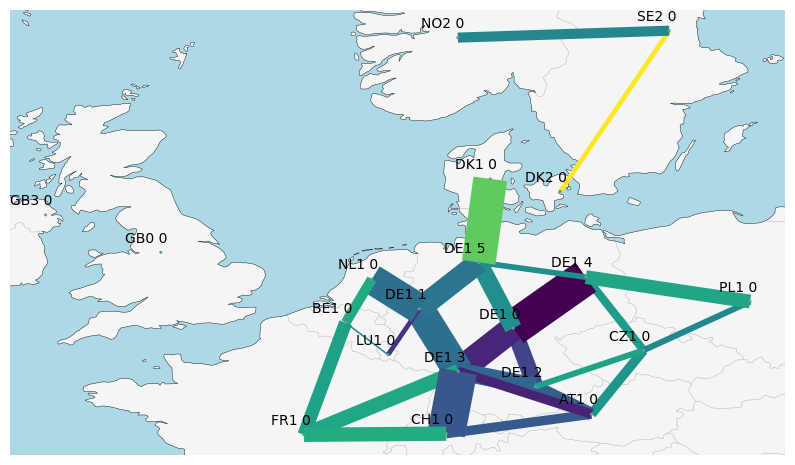

In [51]:
loading = (n.lines_t.p0.abs().mean().sort_index()/(n.lines.s_nom_opt*n.lines.s_max_pu).sort_index()).fillna(0.)

fig, ax = plt.subplots(
    figsize=(10,10),
    subplot_kw={"projection": ccrs.PlateCarree()}
)

n.plot(
    ax=ax,
    branch_components=["Line"],
    line_widths=n.lines.s_nom_opt/1e3, #GW
    line_colors=loading,
    line_cmap=plt.cm.viridis,
    color_geomap=True,
    bus_sizes=0.003
)

bus = n.buses
region = []
for index, row in bus.iterrows():
    x = row['x']
    y = row['y']
    if "H2" in index:
        pass
    else:
        region.append(index)
        ax.annotate(
        index,
        xy=(x, y),
        xytext=(5, 5),  # Adjust the position of the annotation
        textcoords="offset points",
        ha='right', va='bottom'
    )

plt.show


## Installed Capacity Map Plot

In [52]:
#color list for installed cap
tech_list = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().unstack().columns.tolist()
tech_list.remove('load')
color_cap = []

for i in range(len(tech_list)):
    for j in range(len(n.carriers.index)):
        if tech_list[i] == n.carriers.index[j]:
            color_cap.append(n.carriers.color[j])
            break  # break the inner loop once a match is found  

cap = n.generators[n.generators['carrier']!='load'].groupby(['bus', 'carrier']).p_nom_opt.sum()

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\3847545614.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  color_cap.append(n.carriers.color[j])


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


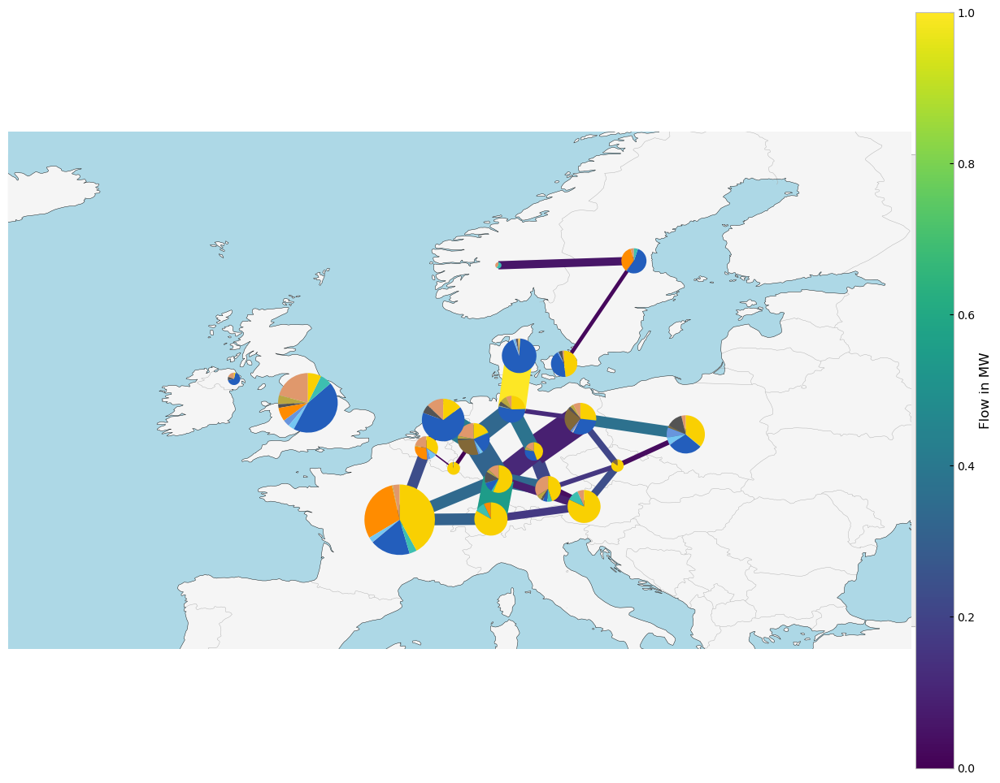

In [53]:
fig, ax = plt.subplots(
    figsize=(15,15),
    subplot_kw={"projection": ccrs.PlateCarree()}
)

collection = n.plot(
    bus_sizes=cap / 5e4,
    bus_colors = color_cap,
    margin=0.5,
    #flow="mean",
    line_widths=n.lines.s_nom_opt/1e3, #GW
    link_widths=0,
    color_geomap=True,
    line_colors=n.lines_t.p0.mean().abs(),
)
        
plt.colorbar(collection[2], fraction=0.04, pad=0.004, label="Flow in MW")
plt.show()

## Generation Map Plot

In [54]:
#color list for energy generated 
tech_list_gen_table = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().unstack().columns.tolist()
colors_gen_table = []

for i in range(len(tech_list_gen_table)):
    for j in range(len(n.carriers.index)):
        if tech_list_gen_table[i] == n.carriers.index[j]:
            colors_gen_table.append(n.carriers.color[j])
            break  # break the inner loop once a match is found 

#Adjust Load shedding's unit to MW from kW
#for column in n.generators_t.p.columns:
#    if column.endswith('load') and not column.endswith('H2 load'):
#        n.generators_t.p[column]/=1e3
        

gen = n.generators.assign(g=n.generators_t.p.mean()).groupby(["bus", "carrier"]).g.sum()

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\971004373.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_gen_table.append(n.carriers.color[j])


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


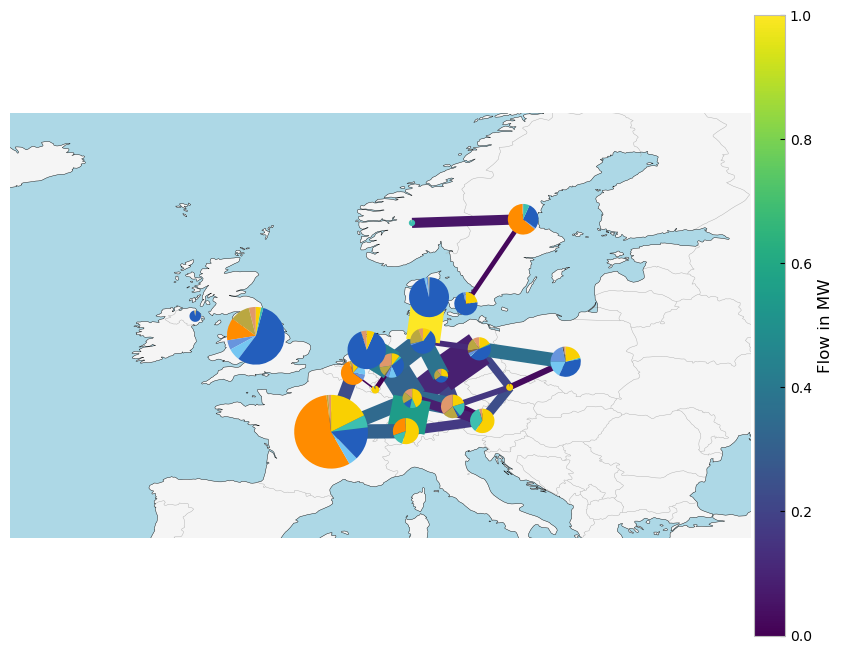

In [55]:
carriers = n.generators.carrier.unique()

plt.figure(figsize =(10,10))

collection = n.plot(
    bus_sizes=gen / 1e4,
    bus_colors = colors_gen_table,
    margin=0.5,
    #flow="mean",
    line_widths=n.lines.s_nom_opt/1e3, #GW
    link_widths=0,
    color_geomap=True,
    line_colors=n.lines_t.p0.mean().abs(),
)
plt.colorbar(collection[2], fraction=0.04, pad=0.004, label="Flow in MW")
plt.show()

## Installed Capacity

<Figure size 640x480 with 0 Axes>

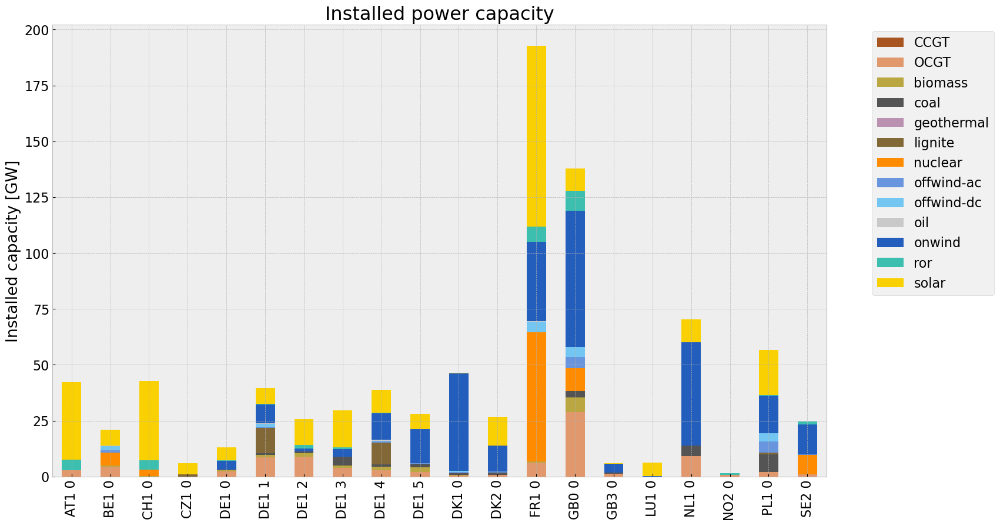

In [56]:
def inst_cap_table(n,colors):

    capacities = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
    capacities.fillna(0, inplace=True)
    gen = (capacities.unstack()/1000).drop(columns=['load'],inplace=False)
    gen.fillna(0, inplace=True)

    plt.figure()
    plt.rcParams.update({'font.size': 16})

    gen.plot.bar(figsize=(17,10),
                                stacked=True,
                                color=colors,
                                grid=True,
                                xlabel="",
                                ylabel="Installed capacity [GW]",
                                title=f"Installed power capacity"
    )
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()
    return capacities

# consolidated istalled cap without load_shedding

#capacities_base = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
#capacities_base.fillna(0, inplace=True)
#gen = (capacities_base.unstack()/1000).drop(columns=['load'],inplace=False)

capacities_base = inst_cap_table(n, color_cap)

<Figure size 640x480 with 0 Axes>

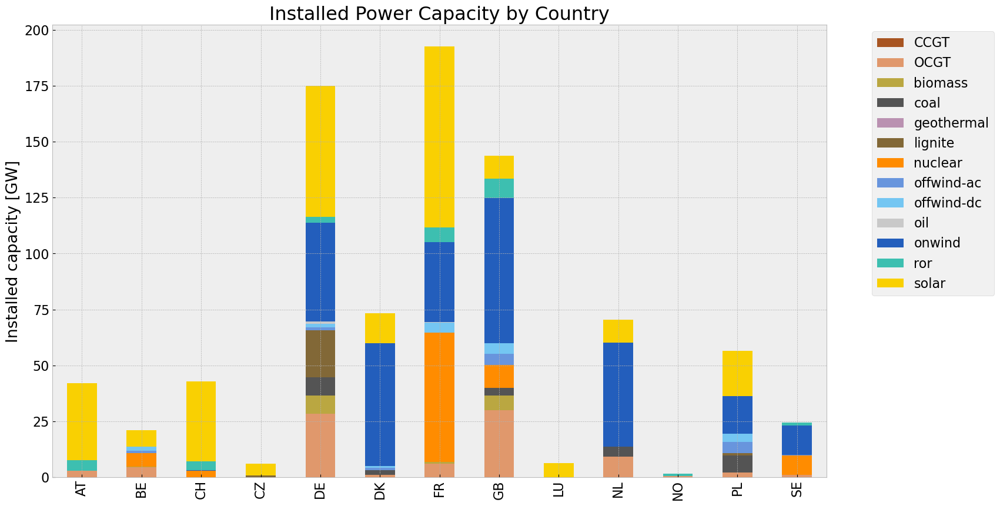

In [57]:
#aggregate installed capacities by country
def inst_cap_table_country(n,colors):

    capacities = n.generators
    capacities['country'] = capacities['bus'].str[:2]
    capacities = capacities.groupby(['country', 'carrier']).p_nom_opt.sum()
    capacities.fillna(0, inplace=True)
    gen = (capacities.unstack()/1000).drop(columns=['load'],inplace=False)
    gen.fillna(0, inplace=True)

    plt.figure()
    plt.rcParams.update({'font.size': 16})

    gen.plot.bar(figsize=(17,10),
                                stacked=True,
                                color=colors,
                                grid=True,
                                xlabel="",
                                ylabel="Installed capacity [GW]",
                                title=f"Installed Power Capacity by Country"
    )
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()
    return capacities

cap_base_country= inst_cap_table_country(n, color_cap)

## Generation

<Figure size 640x480 with 0 Axes>

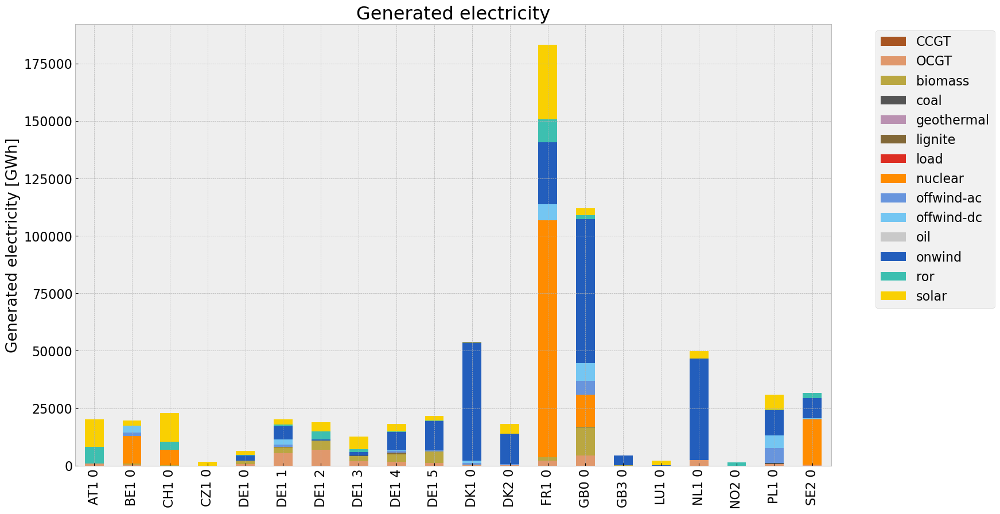

In [58]:
def gen_power_table(n, color):

    carrier = n.generators.carrier.unique()
    df_tot_generation = n.generators_t.p.sum()

    generations = pd.Series(index = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

    for r in region:
        for tech in carrier:
            key = f"{r} {tech}"
            if key in df_tot_generation.index:
                try:
                    generations.loc[r, tech] = df_tot_generation[key]
                    #print(generations.loc[r, tech])
                except KeyError:
                    print('error')
    generations.fillna(0, inplace=True)

    generations = (generations.unstack()/1000)#GWh
    #generations['load']/=1e3


    plt.figure()
    plt.rcParams.update({'font.size': 16})

    generations.plot.bar(figsize=(17,10),
                                stacked=True,
                                color=color,
                                grid=True,
                                xlabel="",
                                ylabel="Generated electricity [GWh]",
                                title=f"Generated electricity"
    )
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()
    return generations

gen_base = gen_power_table(n,colors_gen_table)

<Figure size 640x480 with 0 Axes>

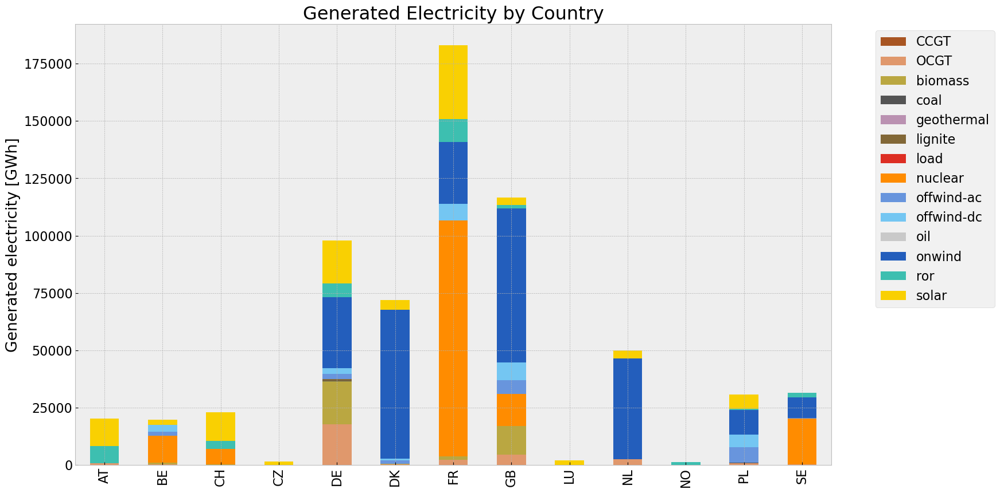

In [59]:
def gen_power_table_country(n, color):

    carrier = n.generators.carrier.unique()
    df_tot_generation = n.generators_t.p.sum()

    generations = pd.Series(index = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

    #generations = n.generators
    #generations['country'] = generations['bus'].str[:2]
    #generations = pd.Series(index = n.generators.groupby(['country', 'carrier']).p_nom_opt.sum().index)

    for r in region:
        for tech in carrier:
            key = f"{r} {tech}"
            if key in df_tot_generation.index:
                try:
                    generations.loc[r, tech] = df_tot_generation[key]
                    #print(generations.loc[r, tech])
                except KeyError:
                    print('error')
    generations.fillna(0, inplace=True)

    generations = (generations.unstack()/1000)#GWh
    generations['country'] = generations.index.str[:2]
    generations = generations.groupby(['country']).sum()   
    #generations['load']/=1e3


    plt.figure()
    plt.rcParams.update({'font.size': 16})

    generations.plot.bar(figsize=(17,10),
                                stacked=True,
                                color=color,
                                grid=True,
                                xlabel="",
                                ylabel="Generated electricity [GWh]",
                                title=f"Generated Electricity by Country"
    )
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()
    return generations

gen_base_country = gen_power_table_country(n,colors_gen_table)

## Snapshot

In [60]:
sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
tech_list_gen = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum()

#links = n.links_t.p0.groupby(n.links.carrier, axis =1).sum().drop(['DC','H2 electrolysis'], axis=1, inplace =False).head()
tech_list_gen = pd.concat([tech_list_gen, sto], axis=1).columns.tolist()

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\318663498.py:1: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\318663498.py:2: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  tech_list_gen = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum()


In [61]:
colors_gen = []

for i in range(len(tech_list_gen)):
    for j in range(len(n.carriers.index)):
        if tech_list_gen[i] == n.carriers.index[j]:
            colors_gen.append(n.carriers.color[j])
            break  # break the inner loop once a match is found  

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\4040974225.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_gen.append(n.carriers.color[j])


In [62]:
def gen_curve(n, start, end, colors,ctr):

    plt.rcParams.update({'font.size': 16})

    #import export 
    lines_ctr_bus0 = n.lines[n.lines['bus0'].str.startswith(ctr) & ~n.lines['bus1'].str.startswith(ctr)].index
    lines_ctr_bus1 = n.lines[n.lines['bus1'].str.startswith(ctr) & ~n.lines['bus0'].str.startswith(ctr)].index
    links_ctr_bus0 = n.links[n.links['bus0'].str.startswith(ctr) & ~n.links['bus1'].str.startswith(ctr)].index
    links_ctr_bus1 = n.links[n.links['bus1'].str.startswith(ctr) & ~n.links['bus0'].str.startswith(ctr)].index


    df_lines_ctr_bus0 = n.lines_t.p0[lines_ctr_bus0]
    df_lines_ctr_bus1 = n.lines_t.p1[lines_ctr_bus1]
    df_links_ctr_bus0 = n.links_t.p0[links_ctr_bus0]
    df_links_ctr_bus1 = n.links_t.p1[links_ctr_bus1]


    import_export = pd.concat([df_lines_ctr_bus0, df_lines_ctr_bus1, df_links_ctr_bus0, df_links_ctr_bus1], axis=1).sum(axis=1)*-1 #MW

    columns_gen = [col for col in  n.generators_t.p.columns if col.startswith(ctr)]
    p_country = n.generators_t.p[columns_gen]

    p_by_carrier = p_country.groupby(n.generators.carrier, axis=1).sum() #MW
    

    #add import color
    colors.append('#133337') #for Import

    #p_by_carrier['load'] /= 1e3

    #links fuel cell
    #links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)
    #links = links.drop(columns='DC', inplace=False)
    #links['H2 fuel cell']*=-1
       
    # join generator, lines, links, and storage unit
    if not n.storage_units.empty:
        col_sto = [col for col in  n.storage_units_t.p.columns if col.startswith(ctr)]
        sto_ctr = n.storage_units_t.p[col_sto]
        sto = sto_ctr.groupby(n.storage_units.carrier, axis=1).sum() #MW     
        p_by_carrier = pd.concat([p_by_carrier, sto], axis=1)
        p_by_carrier['Import'] = import_export 
        p_by_carrier = p_by_carrier.div(1e3) #GW
        
    p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')

    start_date = start
    end_date = end
    
    # Create a date range for the specified time range
    time = pd.date_range(start=start_date, end=end_date, freq='3H')
    
    fig, ax = plt.subplots(figsize=(20, 10))
    
    #p_no_H = p_by_carrier.drop(columns = 'H2 electrolysis', inplace = False)
    p_by_carrier.where(p_by_carrier>0).loc[time].plot.area(
        ax=ax,
        linewidth=0,
        color=colors,
        grid=True,

    )
    
    charge = p_by_carrier.where(p_by_carrier<0).dropna(how='all', axis=1).loc[time]
    
    
    if not charge.empty:

        charge.plot.area(
            ax=ax,
            linewidth=0,
            color=["yellowgreen", "magenta", "purple", "grey"],
            grid=True,
        )
    
    col_load = [col for col in  n.loads_t.p_set.columns if col.startswith(ctr)]
    loads_ctr = n.loads_t.p_set[col_load]
    loads = loads_ctr.sum(axis=1).div(1e3)
    loads.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
    
    loads.loc[time].plot(ax=ax, c='k',grid=True)


    plt.legend(loc=(1.05,0))
    
    ax.set_ylabel("Power [GW]")
    ax.set_title(f"Hourly electricity production")


    ax.set_ylim(-50,150)

In [63]:
#e_balance = n.statistics.energy_balance(aggregate_time=False, aggregate_bus=False).loc[:, :, "AC",:].droplevel(2)
#e_balance.to_excel('energybalance.xlsx', index=True) 


In [64]:
#tes = n.statistics.energy_balance(aggregate_time=False, aggregate_bus=False).loc[:, :, "AC", :].droplevel(2)
#tes.to_csv('energybalance.csv', index=True)

In [65]:
#n.loads_t.p_set.sum(axis=1).loc[pd.date_range(start='2013-01-08', end='2013-01-14', freq='3H')].div(1e3).plot(ax=ax, c='k',grid=True)


In [66]:
#p_by_carrier.where(p_by_carrier>0).loc[pd.date_range(start='2013-01-08', end='2013-01-14', freq='3H')].sum(axis=1)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\2572686274.py:23: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = p_country.groupby(n.generators.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\2572686274.py:40: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = sto_ctr.groupby(n.storage_units.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\2572686274.py:45: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\2572686274.py:51: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, freq='3H')
c:\Users\Jere

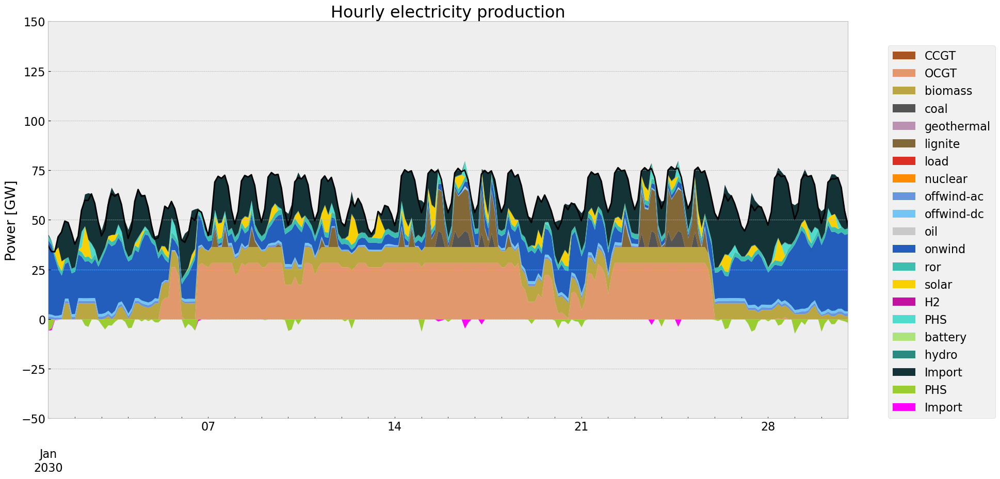

In [67]:
# winter
gen_curve(n, '2030-01-01', '2030-01-31', colors_gen,'DE')

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\2572686274.py:23: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = p_country.groupby(n.generators.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\2572686274.py:40: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = sto_ctr.groupby(n.storage_units.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\2572686274.py:45: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\2572686274.py:51: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, freq='3H')
c:\Users\Jere

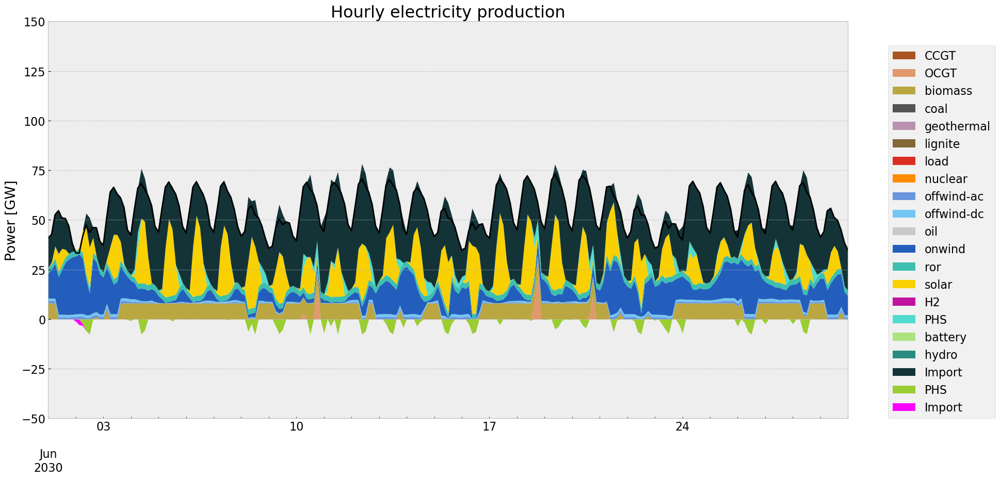

In [68]:
#summer
gen_curve(n, '2030-06-01', '2030-06-30', colors_gen,'DE')

In [69]:
def gen_curve_tot(n, start, end, colors):

    plt.rcParams.update({'font.size': 16})

    p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum() # MW
    
    # join generator, lines, links, and storage unit
    if not n.storage_units.empty:
        sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum() #MW     
        p_by_carrier = pd.concat([p_by_carrier, sto], axis=1)
        p_by_carrier = p_by_carrier.div(1e3) #GW
        
    p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')

    start_date = start
    end_date = end
    
    # Create a date range for the specified time range
    time = pd.date_range(start=start_date, end=end_date, freq='3H')
    
    fig, ax = plt.subplots(figsize=(20, 10))
    
    #p_no_H = p_by_carrier.drop(columns = 'H2 electrolysis', inplace = False)
    p_by_carrier.where(p_by_carrier>0).loc[time].plot.area(
        ax=ax,
        linewidth=0,
        color=colors,
        grid=True,

    )
    
    charge = p_by_carrier.where(p_by_carrier<0).dropna(how='all', axis=1).loc[time]
    
    
    if not charge.empty:

        charge.plot.area(
            ax=ax,
            linewidth=0,
            color=["yellowgreen", "magenta", "purple", "grey"],
            grid=True,
        )
    
    loads = n.loads_t.p_set.sum(axis=1).div(1e3)
    loads.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
    
    loads.loc[time].plot(ax=ax, c='k',grid=True)


    plt.legend(loc=(1.05,0))
    
    ax.set_ylabel("Power [GW]")
    ax.set_title(f"Hourly electricity production")


    ax.set_ylim(-50,370)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\1259656158.py:5: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum() # MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\1259656158.py:9: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\1259656158.py:13: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\1259656158.py:19: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, freq='

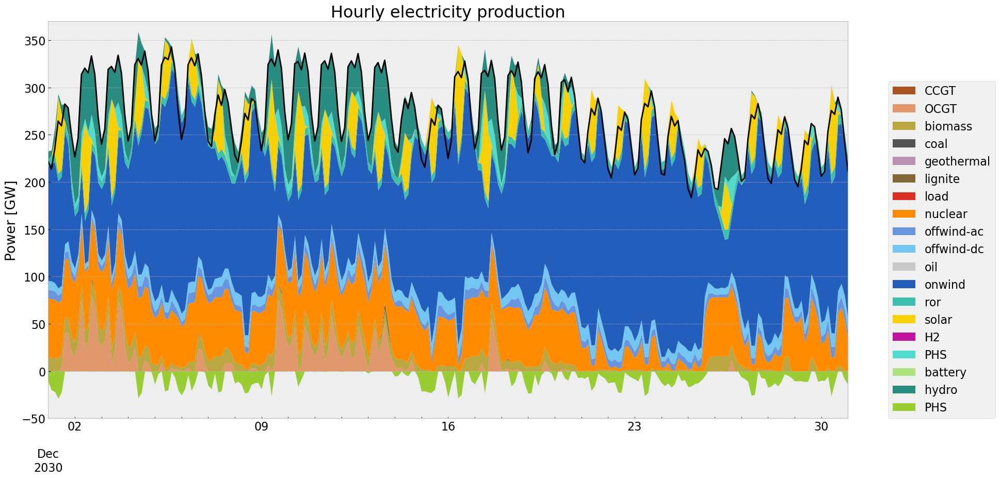

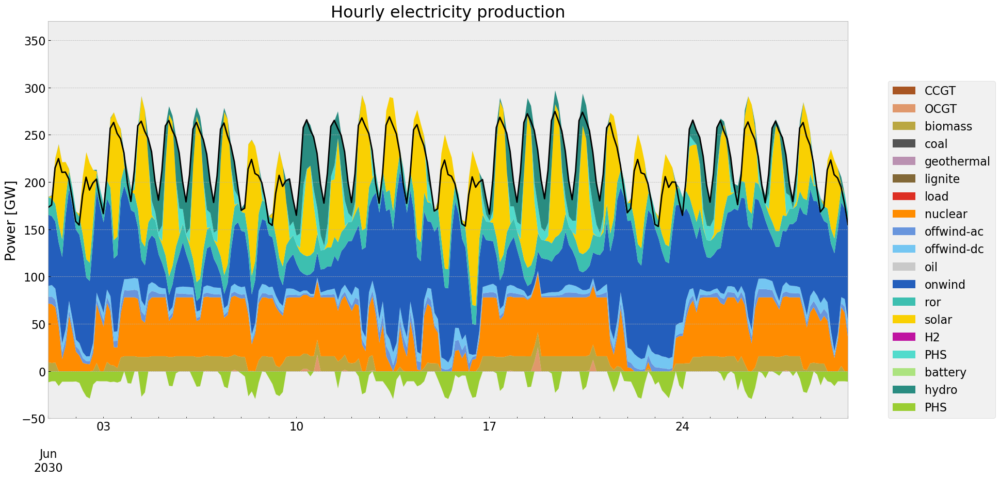

In [70]:
#generation curve all countries
#winter
gen_curve_tot(n, '2030-12-01', '2030-12-31', colors_gen)
#summer
gen_curve_tot(n, '2030-06-01', '2030-06-30', colors_gen)

## Storage

In [71]:
def inst_store_table(n):
    
    plt.rcParams.update({'font.size': 16})
    storage = n.storage_units
    storage['country'] = storage['bus'].str[:2]

    (storage.groupby(['country','carrier']).p_nom_opt.sum().unstack()/1000).plot.bar(figsize=(17,10),
                                stacked=True,
                                color=["yellowgreen","magenta","red","blue"],
                                grid=True,
                                xlabel="",
                                ylabel="Installed capacity [GW]",
                                title=f"Installed power capacities of storage systems By Country",
                                #ylim=[0,20]
    )
    store = storage.groupby(['country','carrier']).p_nom_opt.sum()/1000 #GW
    store.fillna(0, inplace=True)
    return store

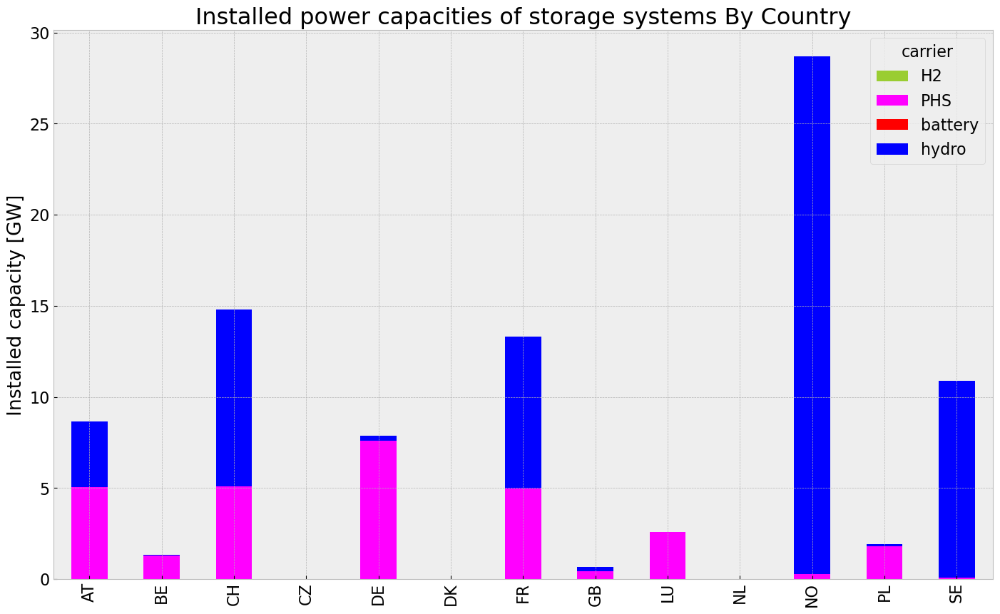

In [72]:
store_base = inst_store_table(n)

In [73]:
def state_of_charge_plot(n):
    
    soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)

    soc.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')

    plt.rcParams.update({'font.size': 16})

    fig, ax = plt.subplots(figsize=(17,10))

    soc.plot(ax=ax,
        grid=True,
        ylabel="State of charge [GWh]",
        xlabel="Time",
        title=f"State of charge of aggregated storage systems",
        linewidth=1.5,
)

plt.show(n)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\1590089999.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\1590089999.py:5: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  soc.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')


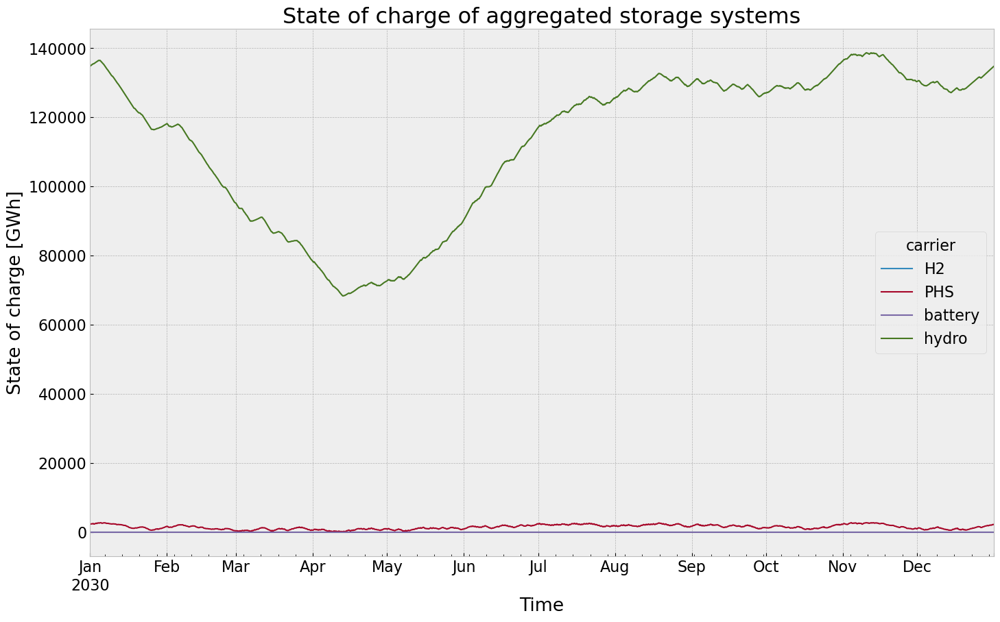

In [74]:
state_of_charge_plot(n)

## Electricity Price

In [75]:
def price_dur_curve_plot(n):

    #buses without store
    columns_to_keep =[]

    for i in n.buses_t.marginal_price.columns.tolist():
        if not i.endswith('H2'):
            columns_to_keep.append(i)
    
    price_dur_curve = pd.DataFrame()
    for region in columns_to_keep:
        price_dur_curve[region] = n.buses_t.marginal_price[region].sort_values(ascending=False).reset_index(drop=True)

    plt.rcParams.update({'font.size': 16})

    fig, ax = plt.subplots(figsize=(17,10))

    price_dur_curve.plot(ax=ax,
                    grid=True,
                    ylabel="Marginal price [€/MWh]",
                    xlabel="Time steps",
                    #title=f"Duration curves of the marginal price in the Italian regions in {year}",
                    linewidth=3,
)

plt.show()

In [76]:
#columns_to_keep =[]

#for i in n.buses_t.marginal_price.columns.tolist():
    #if not i.endswith('H2'):
        #columns_to_keep.append(i)

#buses without store
#columns_to_keep =[]

#price_dur_curve = pd.DataFrame()
#for region in columns_to_keep:
    #price_dur_curve[region] = n.buses_t.marginal_price[region].sort_values(ascending=False).reset_index(drop=True)


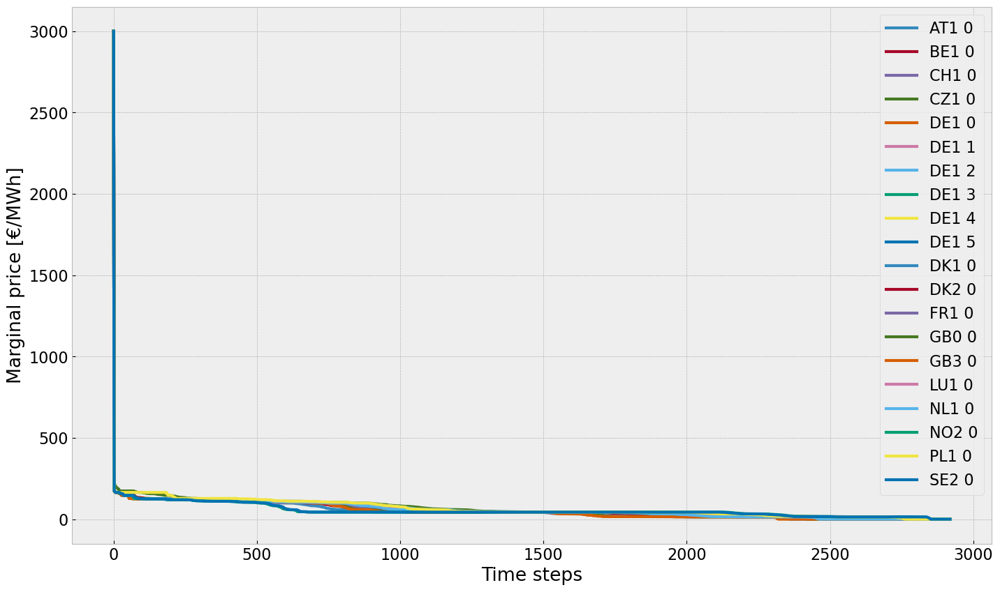

In [77]:
price_dur_curve_plot(n)

In [78]:
def price_regions_table(n):

    plt.rcParams.update({'font.size': 16})

    fig, ax = plt.subplots(figsize=(17,10))

    
    region = n.buses_t.marginal_price.mean()
    #for index, value in region.items():
    #    if index.endswith('H2'):
     #       region = region.drop(index)
    
    region.plot.bar(ax=ax,
                    grid=True,
                    ylabel="Marginal price [€/MWh]",
                    xlabel="Region",
                    title=f"Average marginal price",
                    linewidth=3,
    
    )

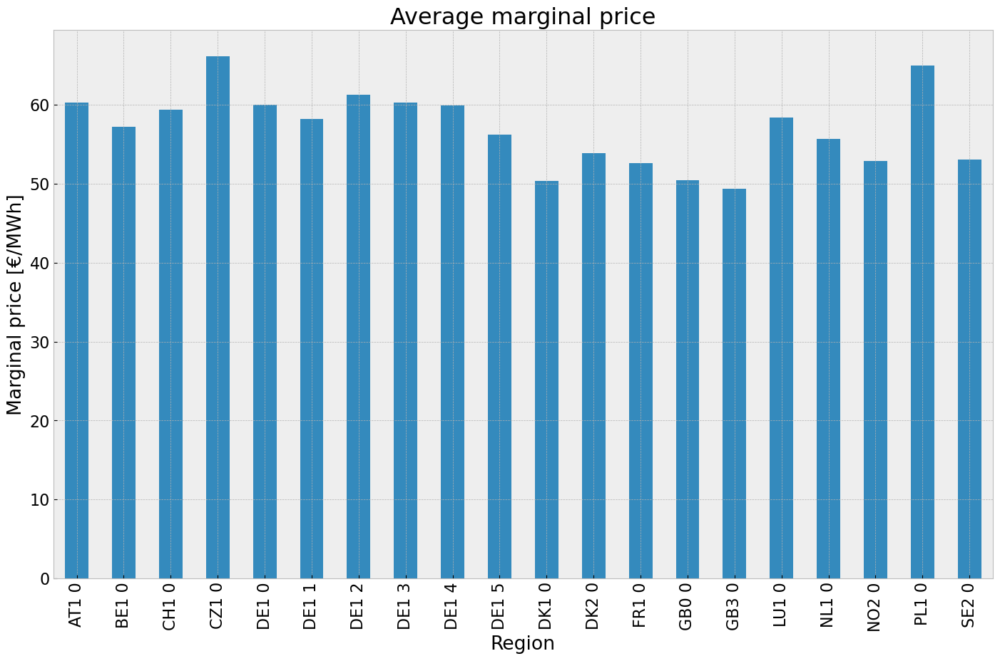

In [79]:
price_regions_table(n)

In [80]:
def price_regions(n):
    # Assuming 'n.buses_t.marginal_price' returns a DataFrame or similar structure with 'mean()' method
    mean_p = n.buses_t.marginal_price.mean()

    #hprice = mean_p.filter(like='H2')
    #eprice = mean_p.drop(hprice.index)

    # Setup figure and subplots with 1 row and 2 columns
    fig, ax = plt.subplots(subplot_kw={"projection": ccrs.PlateCarree()}, figsize=(8, 8))

    # Plot for eprice
    hb= plt.hexbin(
        n.buses.x,
        n.buses.y,
        gridsize=20,
        C=mean_p,
        cmap=plt.cm.jet,
        zorder=3,
    )

    n.plot(ax=ax, line_widths=pd.Series(0.5, n.lines.index), bus_sizes=0)  # Plot network on the second subplot
    
    cb = fig.colorbar(hb, ax=ax, location='bottom')
    cb.set_label("Mean Electricity Marginal Price (EUR/MWh)")
    fig.tight_layout()

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


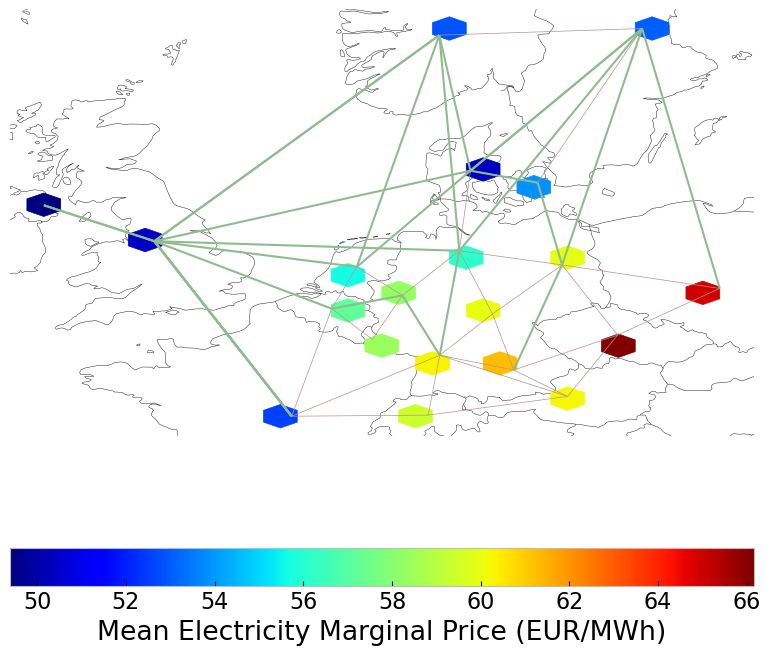

In [81]:
price_regions(n)

## Emission

In [82]:
def em_table(n):
    carrier = n.generators.carrier.unique()
    df_tot_generation = n.generators_t.p.sum()

    generations = pd.Series(index = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

    for r in region:
        for tech in carrier:
            key = f"{r} {tech}"
            if key in df_tot_generation.index:
                try:
                    generations.loc[r, tech] = df_tot_generation[key]
                    #print(generations.loc[r, tech])
                except KeyError:
                    print('error')
    generations.fillna(0, inplace=True)

    generations = (generations.unstack())#MWh

    #mean efficiency of each carrier
    eff = n.generators.groupby('carrier').efficiency.mean()

    e = generations.sum()
    emission = []

    for index in e.index:
        for index_c in n.carriers.index:
            for index_eff in eff.index:
                if index == index_c == index_eff:
                    em = n.carriers.loc[index_c,"co2_emissions"]
                    emission.append(em)

    df = e.to_frame()
    df.rename(columns={0: 'Generation in MWh'}, inplace=True)
    df['efficiency'] = eff
    df['emissions in Tonnes CO2/MWh'] = emission
    df['emissions in Tonnes CO2']= df['Generation in MWh']/df['efficiency']*df['emissions in Tonnes CO2/MWh']
    df['emissions in Tonnes CO2'].sum() 
    return df

em_base =em_table(n)
em_base

,Generation in MWh,efficiency,emissions in Tonnes CO2/MWh,emissions in Tonnes CO2
carrier,,,,
CCGT,0.000000e+00,0.580000,0.1980,0.000000e+00
OCGT,2.950103e+07,0.451621,0.1980,1.293387e+07
biomass,3.377481e+07,0.468000,0.0000,0.000000e+00
coal,7.117319e+05,0.329908,0.3361,7.250902e+05
geothermal,0.000000e+00,1.000000,0.1200,0.000000e+00
lignite,9.211707e+05,0.337285,0.4069,1.111300e+06
load,3.775349e+03,1.000000,0.0000,0.000000e+00
nuclear,1.554148e+08,0.326600,0.0000,0.000000e+00
offwind-ac,1.794435e+07,1.000000,0.0000,0.000000e+00


# No Export Import Scenario
Cut start: 01.06.2030 
Cut end: 30.11.2030



In [83]:
#copy network
n1=n.copy()

#cut transnational AC and DC lines in the cut period
cut_start=pd.to_datetime('2013-06-01 00:00:00')
cut_end = pd.to_datetime('2013-12-31 21:00:00')
reduction = 0

# find transnational AC lines and cut them
for index,row in n1.lines.iterrows():
    ctr_bus0 = row['bus0'][:2]
    ctr_bus1 = row['bus1'][:2]

    #set s_max_pu as series for transnational AC Lines
    if ctr_bus0 != ctr_bus1 and row['carrier'] == 'AC':
        n1.lines_t.s_max_pu[index] = 0.7


# find transnational DC lines
for index,row in n1.links.iterrows():
    ctr_bus0 = row['bus0'][:2]
    ctr_bus1 = row['bus1'][:2]

    #set s_max_pu as series for transnational DC Lines
    if ctr_bus0 != ctr_bus1 and row['carrier'] == 'DC':
        n1.links_t.p_max_pu[index] = 1

#cut AC lines
n1.lines_t.s_max_pu.loc[cut_start:cut_end] *= reduction

#cut DC lines
n1.links_t.p_max_pu.loc[cut_start:cut_end] *= reduction



#set the optimal capacity of generators from the base scenario as the new minimum capacity 
for index, value in n1.generators.p_nom_extendable.items():
    if value:  
        n1.generators.at[index, 'p_nom_min'] = n.generators.at[index, 'p_nom_opt']

#set the optimal capacity of storage units from the base scenario as the new minimum capacity 
for index, value in n1.storage_units.p_nom_extendable.items():
    if value:  
        n1.storage_units.at[index, 'p_nom_min'] = n.storage_units.at[index, 'p_nom_opt']

#set the optimal capacity of lines from the base scenario as the new minimum capacity 
for index, value in n1.lines.s_nom_extendable.items():
    if value:  
        n1.lines.at[index, 's_nom_min'] = n.lines.at[index, 's_nom_opt']

#set the optimal capacity of links from the base scenario as the new minimum capacity 
for index, value in n1.links.p_nom_extendable.items():
    if value:  
        n1.links.at[index, 'p_nom_min'] = n.links.at[index, 'p_nom_opt']
                        

## 1. Scenario: allow additional investment of extendable generators and storage

In [84]:
n1.optimize.create_model()

Index(['BE1 0 offwind-ac', 'FR1 0 offwind-dc', 'NL1 0 onwind',
       'PL1 0 offwind-ac', 'PL1 0 offwind-dc'],
      dtype='object', name='Generator')
Index(['24'], dtype='object', name='Line')


Linopy LP model

Variables:
----------
 * Generator-p_nom (Generator-ext)
 * Line-s_nom (Line-ext)
 * Link-p_nom (Link-ext)
 * StorageUnit-p_nom (StorageUnit-ext)
 * Generator-p (snapshot, Generator)
 * Line-s (snapshot, Line)
 * Link-p (snapshot, Link)
 * StorageUnit-p_dispatch (snapshot, StorageUnit)
 * StorageUnit-p_store (snapshot, StorageUnit)
 * StorageUnit-state_of_charge (snapshot, StorageUnit)
 * StorageUnit-spill (snapshot, StorageUnit)
 * objective_constant

Constraints:
------------
 * Generator-ext-p_nom-lower (Generator-ext)
 * Generator-ext-p_nom-upper (Generator-ext)
 * Line-ext-s_nom-lower (Line-ext)
 * Line-ext-s_nom-upper (Line-ext)
 * Link-ext-p_nom-lower (Link-ext)
 * Link-ext-p_nom-upper (Link-ext)
 * StorageUnit-ext-p_nom-lower (StorageUnit-ext)
 * StorageUnit-ext-p_nom-upper (StorageUnit-ext)
 * Generator-fix-p-lower (snapshot, Generator-fix)
 * Generator-fix-p-upper (snapshot, Generator-fix)
 * Generator-ext-p-lower (snapshot, Generator-ext)
 * Generator-ext-p-

In [85]:
#solve network
n1.optimize(solver_name='gurobi')


Index(['BE1 0 offwind-ac', 'FR1 0 offwind-dc', 'NL1 0 onwind',
       'PL1 0 offwind-ac', 'PL1 0 offwind-dc'],
      dtype='object', name='Generator')
Index(['24'], dtype='object', name='Line')
Index(['BE1 0 offwind-ac', 'FR1 0 offwind-dc', 'NL1 0 onwind',
       'PL1 0 offwind-ac', 'PL1 0 offwind-dc'],
      dtype='object', name='Generator')
Index(['24'], dtype='object', name='Line')
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 12/12 [00:05<00:00,  2.16it/s]
INFO:linopy.io: Writing time: 36.86s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-w8jqx7yk.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-w8jqx7yk.lp


Reading time = 11.85 seconds


INFO:gurobipy:Reading time = 11.85 seconds


obj: 3264863 rows, 1521502 columns, 6133234 nonzeros


INFO:gurobipy:obj: 3264863 rows, 1521502 columns, 6133234 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 3264863 rows, 1521502 columns and 6133234 nonzeros


INFO:gurobipy:Optimize a model with 3264863 rows, 1521502 columns and 6133234 nonzeros


Model fingerprint: 0xae36c10f


INFO:gurobipy:Model fingerprint: 0xae36c10f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-02, 1e+03]


INFO:gurobipy:  Matrix range     [1e-02, 1e+03]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [1e+00, 2e+10]


INFO:gurobipy:  Bounds range     [1e+00, 2e+10]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 2261323 rows and 401477 columns (presolve time = 5s) ...


INFO:gurobipy:Presolve removed 2261323 rows and 401477 columns (presolve time = 5s) ...


Presolve removed 2261323 rows and 401477 columns


INFO:gurobipy:Presolve removed 2261323 rows and 401477 columns


Presolve time: 6.20s


INFO:gurobipy:Presolve time: 6.20s


Presolved: 1003540 rows, 1120025 columns, 3369729 nonzeros


INFO:gurobipy:Presolved: 1003540 rows, 1120025 columns, 3369729 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Elapsed ordering time = 9s


INFO:gurobipy:Elapsed ordering time = 9s


Elapsed ordering time = 10s


INFO:gurobipy:Elapsed ordering time = 10s


Ordering time: 14.76s


INFO:gurobipy:Ordering time: 14.76s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 172


INFO:gurobipy: Dense cols : 172


 AA' NZ     : 3.177e+06


INFO:gurobipy: AA' NZ     : 3.177e+06


 Factor NZ  : 2.265e+07 (roughly 1.0 GB of memory)


INFO:gurobipy: Factor NZ  : 2.265e+07 (roughly 1.0 GB of memory)


 Factor Ops : 3.599e+09 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.599e+09 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   6.86406455e+17 -6.94385491e+18  3.15e+10 6.76e+04  8.21e+13    25s


INFO:gurobipy:   0   6.86406455e+17 -6.94385491e+18  3.15e+10 6.76e+04  8.21e+13    25s


   1   6.10507999e+17 -3.33367897e+18  2.74e+10 2.33e+04  5.43e+13    27s


INFO:gurobipy:   1   6.10507999e+17 -3.33367897e+18  2.74e+10 2.33e+04  5.43e+13    27s


   2   5.04080802e+17 -1.76437732e+18  2.12e+10 8.61e+03  3.70e+13    28s


INFO:gurobipy:   2   5.04080802e+17 -1.76437732e+18  2.12e+10 8.61e+03  3.70e+13    28s


   3   3.14082315e+17 -1.11486776e+18  6.22e+09 3.51e+03  1.24e+13    31s


INFO:gurobipy:   3   3.14082315e+17 -1.11486776e+18  6.22e+09 3.51e+03  1.24e+13    31s


   4   2.67268582e+17 -3.22638532e+17  2.78e+09 8.23e+02  5.06e+12    33s


INFO:gurobipy:   4   2.67268582e+17 -3.22638532e+17  2.78e+09 8.23e+02  5.06e+12    33s


   5   1.57157541e+17 -6.42159016e+16  6.55e+08 1.97e+02  1.22e+12    34s


INFO:gurobipy:   5   1.57157541e+17 -6.42159016e+16  6.55e+08 1.97e+02  1.22e+12    34s


   6   3.96169796e+16 -1.19012908e+16  3.32e+07 1.47e+01  8.03e+10    36s


INFO:gurobipy:   6   3.96169796e+16 -1.19012908e+16  3.32e+07 1.47e+01  8.03e+10    36s


   7   7.57101486e+15 -2.29211845e+15  1.59e+06 1.41e+00  6.71e+09    37s


INFO:gurobipy:   7   7.57101486e+15 -2.29211845e+15  1.59e+06 1.41e+00  6.71e+09    37s


   8   4.25914706e+15 -1.11838884e+15  8.72e+05 4.91e-01  3.48e+09    40s


INFO:gurobipy:   8   4.25914706e+15 -1.11838884e+15  8.72e+05 4.91e-01  3.48e+09    40s


   9   3.14399144e+15 -2.73197652e+14  6.34e+05 1.96e-03  2.21e+09    42s


INFO:gurobipy:   9   3.14399144e+15 -2.73197652e+14  6.34e+05 1.96e-03  2.21e+09    42s


  10   2.29390894e+15 -1.77034960e+14  4.53e+05 3.78e-05  1.55e+09    43s


INFO:gurobipy:  10   2.29390894e+15 -1.77034960e+14  4.53e+05 3.78e-05  1.55e+09    43s


  11   1.68188534e+15 -1.34348821e+14  3.27e+05 4.91e-06  1.11e+09    45s


INFO:gurobipy:  11   1.68188534e+15 -1.34348821e+14  3.27e+05 4.91e-06  1.11e+09    45s


  12   1.01552554e+15 -8.51819494e+13  1.92e+05 3.47e-05  6.46e+08    47s


INFO:gurobipy:  12   1.01552554e+15 -8.51819494e+13  1.92e+05 3.47e-05  6.46e+08    47s


  13   8.88961238e+14 -6.82346537e+13  1.67e+05 3.30e-05  5.49e+08    48s


INFO:gurobipy:  13   8.88961238e+14 -6.82346537e+13  1.67e+05 3.30e-05  5.49e+08    48s


  14   6.29931006e+14 -4.58553371e+13  1.17e+05 4.57e-05  3.75e+08    50s


INFO:gurobipy:  14   6.29931006e+14 -4.58553371e+13  1.17e+05 4.57e-05  3.75e+08    50s


  15   4.53109101e+14 -3.15862521e+13  8.55e+04 1.01e-06  2.62e+08    53s


INFO:gurobipy:  15   4.53109101e+14 -3.15862521e+13  8.55e+04 1.01e-06  2.62e+08    53s


  16   3.15912644e+14 -2.44110406e+13  5.91e+04 6.61e-06  1.79e+08    54s


INFO:gurobipy:  16   3.15912644e+14 -2.44110406e+13  5.91e+04 6.61e-06  1.79e+08    54s


  17   2.07293508e+14 -1.75371763e+13  3.81e+04 1.26e-05  1.15e+08    56s


INFO:gurobipy:  17   2.07293508e+14 -1.75371763e+13  3.81e+04 1.26e-05  1.15e+08    56s


  18   1.24305070e+14 -1.26746247e+13  2.22e+04 7.53e-05  6.78e+07    57s


INFO:gurobipy:  18   1.24305070e+14 -1.26746247e+13  2.22e+04 7.53e-05  6.78e+07    57s


  19   8.70428615e+13 -9.76321134e+12  1.53e+04 5.95e-05  4.70e+07    59s


INFO:gurobipy:  19   8.70428615e+13 -9.76321134e+12  1.53e+04 5.95e-05  4.70e+07    59s


  20   6.09497214e+13 -9.51761920e+12  1.05e+04 5.67e-05  3.38e+07    60s


INFO:gurobipy:  20   6.09497214e+13 -9.51761920e+12  1.05e+04 5.67e-05  3.38e+07    60s


  21   4.75392864e+13 -7.22472025e+12  8.22e+03 3.68e-05  2.60e+07    62s


INFO:gurobipy:  21   4.75392864e+13 -7.22472025e+12  8.22e+03 3.68e-05  2.60e+07    62s


  22   2.93580655e+13 -6.30536433e+12  5.05e+03 3.12e-05  1.67e+07    64s


INFO:gurobipy:  22   2.93580655e+13 -6.30536433e+12  5.05e+03 3.12e-05  1.67e+07    64s


  23   1.90884993e+13 -4.33581209e+12  3.33e+03 2.00e-05  1.08e+07    65s


INFO:gurobipy:  23   1.90884993e+13 -4.33581209e+12  3.33e+03 2.00e-05  1.08e+07    65s


  24   1.15420066e+13 -3.82715454e+12  1.99e+03 1.65e-05  6.99e+06    67s


INFO:gurobipy:  24   1.15420066e+13 -3.82715454e+12  1.99e+03 1.65e-05  6.99e+06    67s


  25   5.28947233e+12 -2.92568038e+12  8.81e+02 1.21e-05  3.66e+06    70s


INFO:gurobipy:  25   5.28947233e+12 -2.92568038e+12  8.81e+02 1.21e-05  3.66e+06    70s


  26   3.69355463e+12 -2.54151568e+12  6.17e+02 1.02e-05  2.74e+06    72s


INFO:gurobipy:  26   3.69355463e+12 -2.54151568e+12  6.17e+02 1.02e-05  2.74e+06    72s


  27   1.89156959e+12 -2.03294160e+12  2.68e+02 8.11e-06  1.68e+06    75s


INFO:gurobipy:  27   1.89156959e+12 -2.03294160e+12  2.68e+02 8.11e-06  1.68e+06    75s


  28   1.27559345e+12 -1.54841602e+12  1.61e+02 6.26e-06  1.20e+06    77s


INFO:gurobipy:  28   1.27559345e+12 -1.54841602e+12  1.61e+02 6.26e-06  1.20e+06    77s


  29   7.17232311e+11 -1.18942262e+12  7.60e+01 4.78e-06  7.97e+05    80s


INFO:gurobipy:  29   7.17232311e+11 -1.18942262e+12  7.60e+01 4.78e-06  7.97e+05    80s


  30   6.18310297e+11 -8.23394322e+11  6.36e+01 3.40e-06  6.02e+05    82s


INFO:gurobipy:  30   6.18310297e+11 -8.23394322e+11  6.36e+01 3.40e-06  6.02e+05    82s


  31   5.02803433e+11 -7.06409220e+11  4.97e+01 2.96e-06  5.04e+05    85s


INFO:gurobipy:  31   5.02803433e+11 -7.06409220e+11  4.97e+01 2.96e-06  5.04e+05    85s


  32   3.09203162e+11 -4.71447608e+11  2.59e+01 4.28e-06  3.24e+05    87s


INFO:gurobipy:  32   3.09203162e+11 -4.71447608e+11  2.59e+01 4.28e-06  3.24e+05    87s


  33   2.56552219e+11 -3.41717985e+11  1.97e+01 4.10e-06  2.48e+05    89s


INFO:gurobipy:  33   2.56552219e+11 -3.41717985e+11  1.97e+01 4.10e-06  2.48e+05    89s


  34   2.27106346e+11 -2.18392926e+11  1.60e+01 1.15e-06  1.85e+05    92s


INFO:gurobipy:  34   2.27106346e+11 -2.18392926e+11  1.60e+01 1.15e-06  1.85e+05    92s


  35   1.88331322e+11 -1.13354431e+11  1.13e+01 9.24e-07  1.25e+05    95s


INFO:gurobipy:  35   1.88331322e+11 -1.13354431e+11  1.13e+01 9.24e-07  1.25e+05    95s


  36   1.74497992e+11 -7.01584046e+10  9.93e+00 8.12e-07  1.01e+05    98s


INFO:gurobipy:  36   1.74497992e+11 -7.01584046e+10  9.93e+00 8.12e-07  1.01e+05    98s


  37   1.52809826e+11 -6.08226726e+09  7.65e+00 4.27e-06  6.60e+04   101s


INFO:gurobipy:  37   1.52809826e+11 -6.08226726e+09  7.65e+00 4.27e-06  6.60e+04   101s


  38   1.24034761e+11  7.82945625e+09  4.83e+00 9.02e-07  4.82e+04   104s


INFO:gurobipy:  38   1.24034761e+11  7.82945625e+09  4.83e+00 9.02e-07  4.82e+04   104s


  39   1.15173743e+11  2.97099836e+10  3.91e+00 1.72e-07  3.55e+04   107s


INFO:gurobipy:  39   1.15173743e+11  2.97099836e+10  3.91e+00 1.72e-07  3.55e+04   107s


  40   1.05808074e+11  4.26114700e+10  2.96e+00 6.14e-06  2.62e+04   110s


INFO:gurobipy:  40   1.05808074e+11  4.26114700e+10  2.96e+00 6.14e-06  2.62e+04   110s


  41   1.01083096e+11  4.80483464e+10  2.49e+00 4.75e-06  2.20e+04   112s


INFO:gurobipy:  41   1.01083096e+11  4.80483464e+10  2.49e+00 4.75e-06  2.20e+04   112s


  42   9.63952778e+10  5.56361051e+10  2.02e+00 1.68e-06  1.69e+04   115s


INFO:gurobipy:  42   9.63952778e+10  5.56361051e+10  2.02e+00 1.68e-06  1.69e+04   115s


  43   9.10717351e+10  5.99617799e+10  1.50e+00 7.00e-07  1.29e+04   117s


INFO:gurobipy:  43   9.10717351e+10  5.99617799e+10  1.50e+00 7.00e-07  1.29e+04   117s


  44   8.77801654e+10  6.36674674e+10  1.17e+00 1.69e-06  1.00e+04   120s


INFO:gurobipy:  44   8.77801654e+10  6.36674674e+10  1.17e+00 1.69e-06  1.00e+04   120s


  45   8.61124341e+10  6.47996279e+10  1.01e+00 9.98e-07  8.85e+03   123s


INFO:gurobipy:  45   8.61124341e+10  6.47996279e+10  1.01e+00 9.98e-07  8.85e+03   123s


  46   8.53608082e+10  6.56064220e+10  9.38e-01 7.75e-07  8.21e+03   125s


INFO:gurobipy:  46   8.53608082e+10  6.56064220e+10  9.38e-01 7.75e-07  8.21e+03   125s


  47   8.34868764e+10  6.75999619e+10  7.62e-01 2.85e-08  6.60e+03   127s


INFO:gurobipy:  47   8.34868764e+10  6.75999619e+10  7.62e-01 2.85e-08  6.60e+03   127s


  48   8.20169844e+10  6.85463131e+10  6.24e-01 2.47e-08  5.60e+03   130s


INFO:gurobipy:  48   8.20169844e+10  6.85463131e+10  6.24e-01 2.47e-08  5.60e+03   130s


  49   8.06682663e+10  6.97960773e+10  4.99e-01 1.95e-08  4.52e+03   133s


INFO:gurobipy:  49   8.06682663e+10  6.97960773e+10  4.99e-01 1.95e-08  4.52e+03   133s


  50   7.97861498e+10  7.08386683e+10  4.16e-01 1.64e-08  3.72e+03   135s


INFO:gurobipy:  50   7.97861498e+10  7.08386683e+10  4.16e-01 1.64e-08  3.72e+03   135s


  51   7.88732744e+10  7.13875634e+10  3.33e-01 1.84e-06  3.11e+03   138s


INFO:gurobipy:  51   7.88732744e+10  7.13875634e+10  3.33e-01 1.84e-06  3.11e+03   138s


  52   7.84415096e+10  7.22787421e+10  2.94e-01 1.85e-08  2.56e+03   140s


INFO:gurobipy:  52   7.84415096e+10  7.22787421e+10  2.94e-01 1.85e-08  2.56e+03   140s


  53   7.79354256e+10  7.29179995e+10  2.49e-01 3.68e-07  2.09e+03   143s


INFO:gurobipy:  53   7.79354256e+10  7.29179995e+10  2.49e-01 3.68e-07  2.09e+03   143s


  54   7.73228062e+10  7.31164514e+10  1.96e-01 3.70e-06  1.75e+03   146s


INFO:gurobipy:  54   7.73228062e+10  7.31164514e+10  1.96e-01 3.70e-06  1.75e+03   146s


  55   7.70237433e+10  7.35342286e+10  1.69e-01 4.26e-06  1.45e+03   148s


INFO:gurobipy:  55   7.70237433e+10  7.35342286e+10  1.69e-01 4.26e-06  1.45e+03   148s


  56   7.66397035e+10  7.38281187e+10  1.35e-01 3.00e-06  1.17e+03   151s


INFO:gurobipy:  56   7.66397035e+10  7.38281187e+10  1.35e-01 3.00e-06  1.17e+03   151s


  57   7.63033177e+10  7.41102779e+10  1.06e-01 2.80e-06  9.11e+02   154s


INFO:gurobipy:  57   7.63033177e+10  7.41102779e+10  1.06e-01 2.80e-06  9.11e+02   154s


  58   7.61596844e+10  7.42862275e+10  9.32e-02 4.86e-06  7.79e+02   156s


INFO:gurobipy:  58   7.61596844e+10  7.42862275e+10  9.32e-02 4.86e-06  7.79e+02   156s


  59   7.60043992e+10  7.43536698e+10  7.99e-02 6.57e-06  6.86e+02   159s


INFO:gurobipy:  59   7.60043992e+10  7.43536698e+10  7.99e-02 6.57e-06  6.86e+02   159s


  60   7.58480800e+10  7.44442701e+10  6.62e-02 6.05e-06  5.83e+02   161s


INFO:gurobipy:  60   7.58480800e+10  7.44442701e+10  6.62e-02 6.05e-06  5.83e+02   161s


  61   7.57447009e+10  7.45488756e+10  5.72e-02 6.16e-06  4.97e+02   164s


INFO:gurobipy:  61   7.57447009e+10  7.45488756e+10  5.72e-02 6.16e-06  4.97e+02   164s


  62   7.56421297e+10  7.46245915e+10  4.80e-02 7.26e-06  4.22e+02   166s


INFO:gurobipy:  62   7.56421297e+10  7.46245915e+10  4.80e-02 7.26e-06  4.22e+02   166s


  63   7.55422521e+10  7.46640263e+10  3.96e-02 7.54e-06  3.64e+02   169s


INFO:gurobipy:  63   7.55422521e+10  7.46640263e+10  3.96e-02 7.54e-06  3.64e+02   169s


  64   7.54951299e+10  7.47164954e+10  3.56e-02 6.94e-06  3.23e+02   171s


INFO:gurobipy:  64   7.54951299e+10  7.47164954e+10  3.56e-02 6.94e-06  3.23e+02   171s


  65   7.54292666e+10  7.47894032e+10  2.98e-02 4.90e-06  2.66e+02   174s


INFO:gurobipy:  65   7.54292666e+10  7.47894032e+10  2.98e-02 4.90e-06  2.66e+02   174s


  66   7.53686069e+10  7.48291613e+10  2.47e-02 6.53e-06  2.24e+02   176s


INFO:gurobipy:  66   7.53686069e+10  7.48291613e+10  2.47e-02 6.53e-06  2.24e+02   176s


  67   7.53093755e+10  7.48631514e+10  1.97e-02 4.16e-06  1.85e+02   179s


INFO:gurobipy:  67   7.53093755e+10  7.48631514e+10  1.97e-02 4.16e-06  1.85e+02   179s


  68   7.52778642e+10  7.48875088e+10  1.71e-02 3.40e-06  1.62e+02   182s


INFO:gurobipy:  68   7.52778642e+10  7.48875088e+10  1.71e-02 3.40e-06  1.62e+02   182s


  69   7.52507714e+10  7.48919037e+10  1.48e-02 3.34e-06  1.49e+02   184s


INFO:gurobipy:  69   7.52507714e+10  7.48919037e+10  1.48e-02 3.34e-06  1.49e+02   184s


  70   7.52223742e+10  7.49233213e+10  1.24e-02 3.81e-06  1.24e+02   187s


INFO:gurobipy:  70   7.52223742e+10  7.49233213e+10  1.24e-02 3.81e-06  1.24e+02   187s


  71   7.52106518e+10  7.49361860e+10  1.15e-02 3.25e-06  1.14e+02   189s


INFO:gurobipy:  71   7.52106518e+10  7.49361860e+10  1.15e-02 3.25e-06  1.14e+02   189s


  72   7.51898022e+10  7.49585335e+10  9.72e-03 2.31e-06  9.58e+01   192s


INFO:gurobipy:  72   7.51898022e+10  7.49585335e+10  9.72e-03 2.31e-06  9.58e+01   192s


  73   7.51765159e+10  7.49681205e+10  8.64e-03 2.59e-06  8.64e+01   194s


INFO:gurobipy:  73   7.51765159e+10  7.49681205e+10  8.64e-03 2.59e-06  8.64e+01   194s


  74   7.51640187e+10  7.49836541e+10  7.62e-03 2.25e-06  7.48e+01   197s


INFO:gurobipy:  74   7.51640187e+10  7.49836541e+10  7.62e-03 2.25e-06  7.48e+01   197s


  75   7.51503829e+10  7.49983379e+10  6.50e-03 1.24e-06  6.30e+01   200s


INFO:gurobipy:  75   7.51503829e+10  7.49983379e+10  6.50e-03 1.24e-06  6.30e+01   200s


  76   7.51345541e+10  7.50076123e+10  5.21e-03 1.20e-06  5.26e+01   202s


INFO:gurobipy:  76   7.51345541e+10  7.50076123e+10  5.21e-03 1.20e-06  5.26e+01   202s


  77   7.51216456e+10  7.50152479e+10  4.17e-03 1.18e-06  4.41e+01   205s


INFO:gurobipy:  77   7.51216456e+10  7.50152479e+10  4.17e-03 1.18e-06  4.41e+01   205s


  78   7.51139898e+10  7.50210491e+10  3.56e-03 1.23e-06  3.85e+01   207s


INFO:gurobipy:  78   7.51139898e+10  7.50210491e+10  3.56e-03 1.23e-06  3.85e+01   207s


  79   7.51120763e+10  7.50289355e+10  3.41e-03 1.31e-06  3.45e+01   210s


INFO:gurobipy:  79   7.51120763e+10  7.50289355e+10  3.41e-03 1.31e-06  3.45e+01   210s


  80   7.51064283e+10  7.50311166e+10  2.97e-03 1.42e-06  3.12e+01   212s


INFO:gurobipy:  80   7.51064283e+10  7.50311166e+10  2.97e-03 1.42e-06  3.12e+01   212s


  81   7.50988373e+10  7.50380723e+10  2.36e-03 8.28e-07  2.52e+01   215s


INFO:gurobipy:  81   7.50988373e+10  7.50380723e+10  2.36e-03 8.28e-07  2.52e+01   215s


  82   7.50919748e+10  7.50424332e+10  1.83e-03 8.30e-07  2.05e+01   217s


INFO:gurobipy:  82   7.50919748e+10  7.50424332e+10  1.83e-03 8.30e-07  2.05e+01   217s


  83   7.50862508e+10  7.50509713e+10  1.38e-03 6.90e-07  1.46e+01   220s


INFO:gurobipy:  83   7.50862508e+10  7.50509713e+10  1.38e-03 6.90e-07  1.46e+01   220s


  84   7.50817928e+10  7.50535328e+10  1.03e-03 7.06e-07  1.17e+01   223s


INFO:gurobipy:  84   7.50817928e+10  7.50535328e+10  1.03e-03 7.06e-07  1.17e+01   223s


  85   7.50803739e+10  7.50553295e+10  9.23e-04 4.02e-07  1.04e+01   224s


INFO:gurobipy:  85   7.50803739e+10  7.50553295e+10  9.23e-04 4.02e-07  1.04e+01   224s


  86   7.50774689e+10  7.50592588e+10  7.00e-04 4.92e-07  7.54e+00   227s


INFO:gurobipy:  86   7.50774689e+10  7.50592588e+10  7.00e-04 4.92e-07  7.54e+00   227s


  87   7.50753004e+10  7.50604573e+10  5.36e-04 6.11e-07  6.15e+00   230s


INFO:gurobipy:  87   7.50753004e+10  7.50604573e+10  5.36e-04 6.11e-07  6.15e+00   230s


  88   7.50735066e+10  7.50618586e+10  4.02e-04 9.09e-07  4.82e+00   232s


INFO:gurobipy:  88   7.50735066e+10  7.50618586e+10  4.02e-04 9.09e-07  4.82e+00   232s


  89   7.50719428e+10  7.50643684e+10  2.86e-04 3.28e-06  3.14e+00   234s


INFO:gurobipy:  89   7.50719428e+10  7.50643684e+10  2.86e-04 3.28e-06  3.14e+00   234s


  90   7.50710311e+10  7.50650301e+10  2.20e-04 1.21e-06  2.48e+00   236s


INFO:gurobipy:  90   7.50710311e+10  7.50650301e+10  2.20e-04 1.21e-06  2.48e+00   236s


  91   7.50702182e+10  7.50663846e+10  1.60e-04 6.71e-07  1.59e+00   239s


INFO:gurobipy:  91   7.50702182e+10  7.50663846e+10  1.60e-04 6.71e-07  1.59e+00   239s


  92   7.50693674e+10  7.50668922e+10  9.82e-05 4.47e-07  1.03e+00   242s


INFO:gurobipy:  92   7.50693674e+10  7.50668922e+10  9.82e-05 4.47e-07  1.03e+00   242s


  93   7.50688626e+10  7.50673286e+10  6.24e-05 4.54e-07  6.36e-01   244s


INFO:gurobipy:  93   7.50688626e+10  7.50673286e+10  6.24e-05 4.54e-07  6.36e-01   244s


  94   7.50686444e+10  7.50675216e+10  4.71e-05 4.17e-07  4.65e-01   246s


INFO:gurobipy:  94   7.50686444e+10  7.50675216e+10  4.71e-05 4.17e-07  4.65e-01   246s


  95   7.50684500e+10  7.50676732e+10  3.27e-05 1.37e-06  3.22e-01   248s


INFO:gurobipy:  95   7.50684500e+10  7.50676732e+10  3.27e-05 1.37e-06  3.22e-01   248s


  96   7.50684066e+10  7.50677421e+10  2.97e-05 2.43e-06  2.76e-01   250s


INFO:gurobipy:  96   7.50684066e+10  7.50677421e+10  2.97e-05 2.43e-06  2.76e-01   250s


  97   7.50683308e+10  7.50678373e+10  2.41e-05 3.74e-06  2.05e-01   251s


INFO:gurobipy:  97   7.50683308e+10  7.50678373e+10  2.41e-05 3.74e-06  2.05e-01   251s


  98   7.50682255e+10  7.50678625e+10  1.62e-05 3.14e-06  1.51e-01   253s


INFO:gurobipy:  98   7.50682255e+10  7.50678625e+10  1.62e-05 3.14e-06  1.51e-01   253s


  99   7.50681917e+10  7.50678922e+10  1.37e-05 2.43e-06  1.24e-01   254s


INFO:gurobipy:  99   7.50681917e+10  7.50678922e+10  1.37e-05 2.43e-06  1.24e-01   254s


 100   7.50681205e+10  7.50679298e+10  8.45e-06 1.58e-06  7.91e-02   256s


INFO:gurobipy: 100   7.50681205e+10  7.50679298e+10  8.45e-06 1.58e-06  7.91e-02   256s


 101   7.50680991e+10  7.50679504e+10  6.86e-06 1.15e-06  6.18e-02   258s


INFO:gurobipy: 101   7.50680991e+10  7.50679504e+10  6.86e-06 1.15e-06  6.18e-02   258s


 102   7.50680798e+10  7.50679669e+10  5.43e-06 7.90e-07  4.69e-02   260s


INFO:gurobipy: 102   7.50680798e+10  7.50679669e+10  5.43e-06 7.90e-07  4.69e-02   260s


 103   7.50680588e+10  7.50679801e+10  3.87e-06 4.92e-07  3.28e-02   262s


INFO:gurobipy: 103   7.50680588e+10  7.50679801e+10  3.87e-06 4.92e-07  3.28e-02   262s


 104   7.50680457e+10  7.50679892e+10  2.91e-06 2.98e-07  2.35e-02   264s


INFO:gurobipy: 104   7.50680457e+10  7.50679892e+10  2.91e-06 2.98e-07  2.35e-02   264s


 105   7.50680383e+10  7.50679954e+10  2.35e-06 4.18e-07  1.79e-02   266s


INFO:gurobipy: 105   7.50680383e+10  7.50679954e+10  2.35e-06 4.18e-07  1.79e-02   266s


 106   7.50680335e+10  7.50679981e+10  1.99e-06 3.41e-07  1.48e-02   268s


INFO:gurobipy: 106   7.50680335e+10  7.50679981e+10  1.99e-06 3.41e-07  1.48e-02   268s


 107   7.50680254e+10  7.50679999e+10  1.40e-06 1.83e-07  1.06e-02   270s


INFO:gurobipy: 107   7.50680254e+10  7.50679999e+10  1.40e-06 1.83e-07  1.06e-02   270s


 108   7.50680224e+10  7.50680015e+10  1.19e-06 2.03e-07  8.73e-03   272s


INFO:gurobipy: 108   7.50680224e+10  7.50680015e+10  1.19e-06 2.03e-07  8.73e-03   272s


 109   7.50680213e+10  7.50680020e+10  1.11e-06 3.34e-07  8.04e-03   274s


INFO:gurobipy: 109   7.50680213e+10  7.50680020e+10  1.11e-06 3.34e-07  8.04e-03   274s


 110   7.50680170e+10  7.50680028e+10  8.07e-07 2.06e-07  5.94e-03   275s


INFO:gurobipy: 110   7.50680170e+10  7.50680028e+10  8.07e-07 2.06e-07  5.94e-03   275s


 111   7.50680153e+10  7.50680040e+10  6.83e-07 4.31e-07  4.72e-03   277s


INFO:gurobipy: 111   7.50680153e+10  7.50680040e+10  6.83e-07 4.31e-07  4.72e-03   277s


 112   7.50680142e+10  7.50680042e+10  5.98e-07 3.66e-07  4.14e-03   279s


INFO:gurobipy: 112   7.50680142e+10  7.50680042e+10  5.98e-07 3.66e-07  4.14e-03   279s


 113   7.50680128e+10  7.50680050e+10  6.72e-06 5.66e-06  3.26e-03   281s


INFO:gurobipy: 113   7.50680128e+10  7.50680050e+10  6.72e-06 5.66e-06  3.26e-03   281s


 114   7.50680107e+10  7.50680054e+10  4.01e-06 3.07e-06  2.21e-03   283s


INFO:gurobipy: 114   7.50680107e+10  7.50680054e+10  4.01e-06 3.07e-06  2.21e-03   283s


 115   7.50680099e+10  7.50680057e+10  3.33e-06 1.58e-06  1.77e-03   285s


INFO:gurobipy: 115   7.50680099e+10  7.50680057e+10  3.33e-06 1.58e-06  1.77e-03   285s


 116   7.50680091e+10  7.50680058e+10  2.58e-06 1.10e-06  1.38e-03   288s


INFO:gurobipy: 116   7.50680091e+10  7.50680058e+10  2.58e-06 1.10e-06  1.38e-03   288s


 117   7.50680080e+10  7.50680060e+10  1.64e-06 3.87e-07  8.76e-04   290s


INFO:gurobipy: 117   7.50680080e+10  7.50680060e+10  1.64e-06 3.87e-07  8.76e-04   290s


 118   7.50680067e+10  7.50680060e+10  2.21e-05 4.77e-07  3.01e-04   292s


INFO:gurobipy: 118   7.50680067e+10  7.50680060e+10  2.21e-05 4.77e-07  3.01e-04   292s


 119   7.50680061e+10  7.50680060e+10  8.25e-06 4.36e-07  5.28e-05   294s


INFO:gurobipy: 119   7.50680061e+10  7.50680060e+10  8.25e-06 4.36e-07  5.28e-05   294s


 120   7.50680061e+10  7.50680060e+10  4.26e-05 4.07e-07  3.97e-05   296s


INFO:gurobipy: 120   7.50680061e+10  7.50680060e+10  4.26e-05 4.07e-07  3.97e-05   296s


INFO:gurobipy:


Barrier solved model in 120 iterations and 296.44 seconds (97.98 work units)


INFO:gurobipy:Barrier solved model in 120 iterations and 296.44 seconds (97.98 work units)


Optimal objective 7.50680061e+10


INFO:gurobipy:Optimal objective 7.50680061e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


  512831 DPushes remaining with DInf 0.0000000e+00               300s


INFO:gurobipy:  512831 DPushes remaining with DInf 0.0000000e+00               300s


  126362 DPushes remaining with DInf 0.0000000e+00               315s


INFO:gurobipy:  126362 DPushes remaining with DInf 0.0000000e+00               315s


   57433 DPushes remaining with DInf 0.0000000e+00               322s


INFO:gurobipy:   57433 DPushes remaining with DInf 0.0000000e+00               322s


   19503 DPushes remaining with DInf 0.0000000e+00               326s


INFO:gurobipy:   19503 DPushes remaining with DInf 0.0000000e+00               326s


   10310 DPushes remaining with DInf 0.0000000e+00               330s


INFO:gurobipy:   10310 DPushes remaining with DInf 0.0000000e+00               330s


    5402 DPushes remaining with DInf 0.0000000e+00               336s


INFO:gurobipy:    5402 DPushes remaining with DInf 0.0000000e+00               336s


    4492 DPushes remaining with DInf 0.0000000e+00               341s


INFO:gurobipy:    4492 DPushes remaining with DInf 0.0000000e+00               341s


    3582 DPushes remaining with DInf 0.0000000e+00               347s


INFO:gurobipy:    3582 DPushes remaining with DInf 0.0000000e+00               347s


    3122 DPushes remaining with DInf 0.0000000e+00               350s


INFO:gurobipy:    3122 DPushes remaining with DInf 0.0000000e+00               350s


       0 DPushes remaining with DInf 0.0000000e+00               354s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00               354s


INFO:gurobipy:


  441290 PPushes remaining with PInf 3.1104987e-01               355s


INFO:gurobipy:  441290 PPushes remaining with PInf 3.1104987e-01               355s


  129914 PPushes remaining with PInf 1.3068627e+00               369s


INFO:gurobipy:  129914 PPushes remaining with PInf 1.3068627e+00               369s


   88428 PPushes remaining with PInf 1.6200669e+00               371s


INFO:gurobipy:   88428 PPushes remaining with PInf 1.6200669e+00               371s


   47559 PPushes remaining with PInf 1.8057019e+00               375s


INFO:gurobipy:   47559 PPushes remaining with PInf 1.8057019e+00               375s


   25298 PPushes remaining with PInf 1.9435250e+00               380s


INFO:gurobipy:   25298 PPushes remaining with PInf 1.9435250e+00               380s


   18627 PPushes remaining with PInf 1.9756197e+00               386s


INFO:gurobipy:   18627 PPushes remaining with PInf 1.9756197e+00               386s


    1530 PPushes remaining with PInf 1.9349861e+00               429s


INFO:gurobipy:    1530 PPushes remaining with PInf 1.9349861e+00               429s


       0 PPushes remaining with PInf 0.0000000e+00               431s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00               431s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.9424774e+05    431s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.9424774e+05    431s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  739458    7.5068006e+10   0.000000e+00   1.942477e+05    432s


INFO:gurobipy:  739458    7.5068006e+10   0.000000e+00   1.942477e+05    432s


  739960    7.5068006e+10   0.000000e+00   3.028455e+04    437s


INFO:gurobipy:  739960    7.5068006e+10   0.000000e+00   3.028455e+04    437s


  740862    7.5068006e+10   0.000000e+00   1.648007e+01    441s


INFO:gurobipy:  740862    7.5068006e+10   0.000000e+00   1.648007e+01    441s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  742188    7.5068006e+10   0.000000e+00   1.381451e-06    445s


INFO:gurobipy:  742188    7.5068006e+10   0.000000e+00   1.381451e-06    445s


Extra simplex iterations after uncrush: 1


INFO:gurobipy:Extra simplex iterations after uncrush: 1


  742189    7.5068006e+10   0.000000e+00   0.000000e+00    447s


INFO:gurobipy:  742189    7.5068006e+10   0.000000e+00   0.000000e+00    447s


INFO:gurobipy:


Solved in 742189 iterations and 446.76 seconds (166.84 work units)


INFO:gurobipy:Solved in 742189 iterations and 446.76 seconds (166.84 work units)


Optimal objective  7.506800606e+10


INFO:gurobipy:Optimal objective  7.506800606e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 1521502 primals, 3264863 duals
Objective: 7.51e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-uppe

('ok', 'optimal')

In [86]:
tot_cos_inv=n1.objective/1e9 # billion €
system_cost_inv = system_cost(n1) #million€/a
marg_price_region_inv = n1.buses_t.marginal_price.mean()
stat_inv = n1.statistics()

## Installed Capacity

<Figure size 640x480 with 0 Axes>

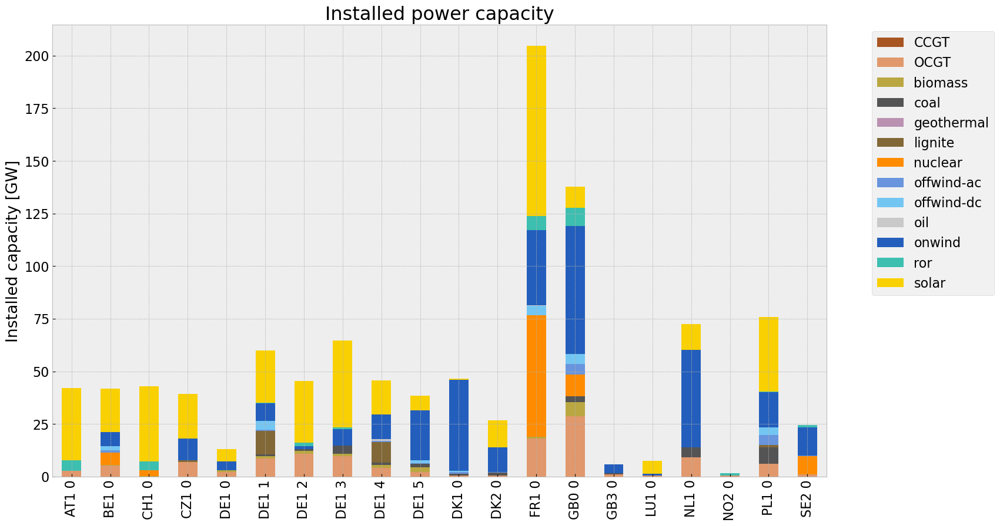

<Figure size 640x480 with 0 Axes>

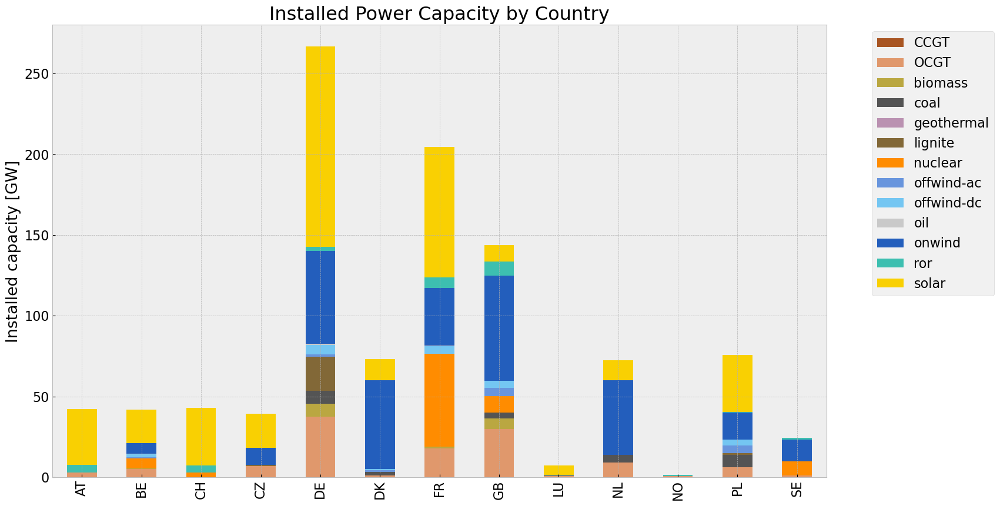

In [87]:
# consolidated istalled cap without load_shedding

#capacities_inv = n1.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
#capacities_inv.fillna(0, inplace=True)
#gen_1 = (capacities_inv.unstack()/1000).drop(columns=['load'],inplace=False)


capacities_inv = inst_cap_table(n1, color_cap)
cap_inv_country= inst_cap_table_country(n1, color_cap)


## Generation

<Figure size 640x480 with 0 Axes>

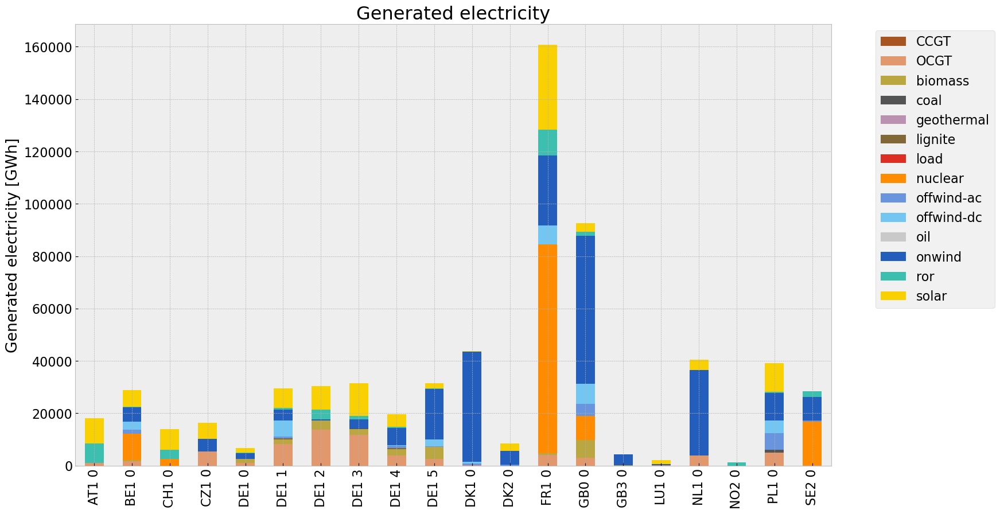

<Figure size 640x480 with 0 Axes>

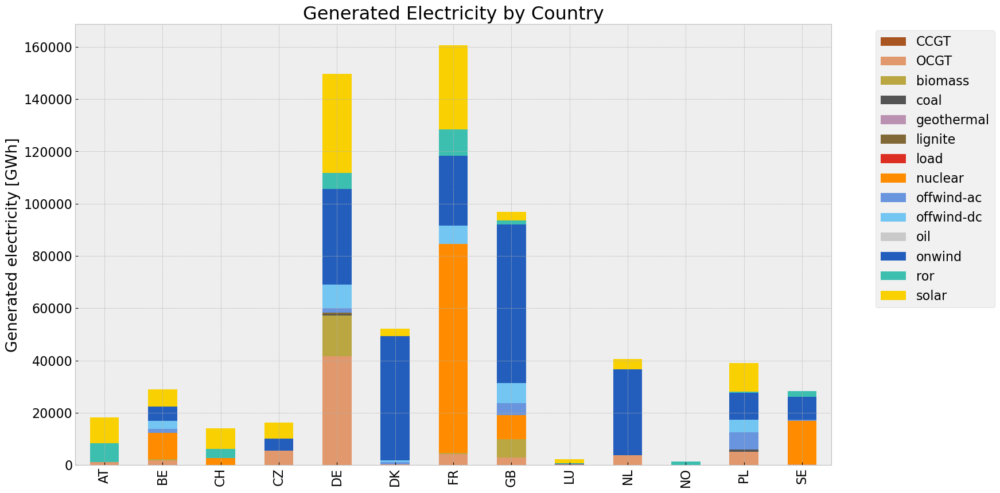

In [88]:
# consolidated generation table
#carrier = n1.generators.carrier.unique()
#df_tot_generation = n1.generators_t.p.sum()

#generations = pd.Series(index = n1.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

#for r in region:
    #for tech in carrier:
        #key = f"{r} {tech}"
        #if key in df_tot_generation.index:
            #try:
               # generations.loc[r, tech] = df_tot_generation[key]
                #print(generations.loc[r, tech])
           # except KeyError:
               # print('error')
                
#generations.fillna(0, inplace=True)
#gen_inv = generations.unstack()/1000#Gwh


gen_inv = gen_power_table(n1,colors_gen_table)
gen_inv_country = gen_power_table_country(n1,colors_gen_table)

## Snapshot

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\2572686274.py:23: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = p_country.groupby(n.generators.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\2572686274.py:40: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = sto_ctr.groupby(n.storage_units.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\2572686274.py:45: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\2572686274.py:51: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, freq='3H')
c:\Users\Jere

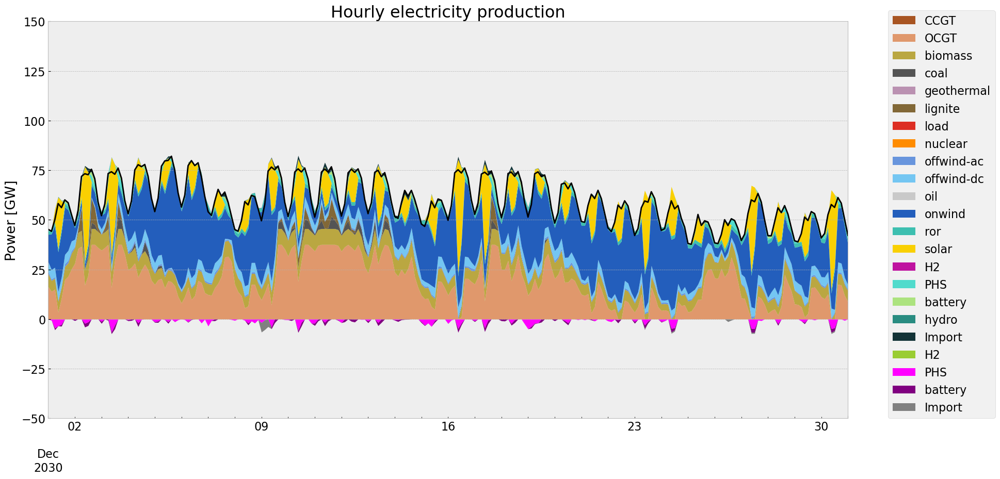

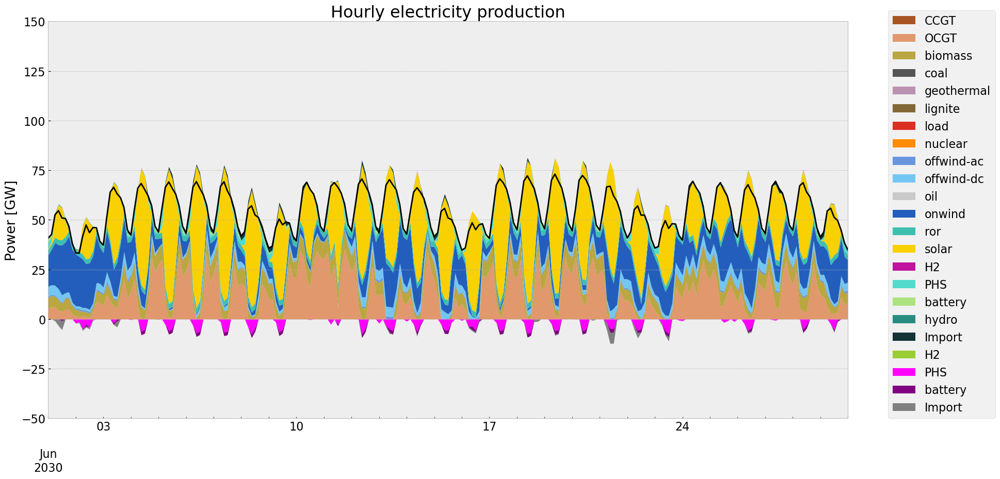

In [89]:
gen_curve(n1, '2030-12-01', '2030-12-31', colors_gen,'DE')
gen_curve(n1, '2030-06-1', '2030-06-30', colors_gen,'DE')


C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\1259656158.py:5: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum() # MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\1259656158.py:9: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\1259656158.py:13: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\1259656158.py:19: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, freq='

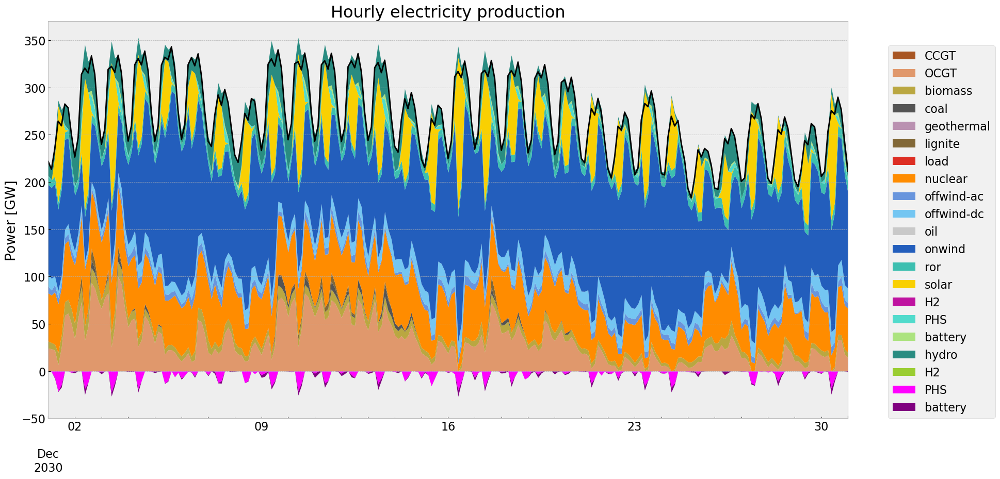

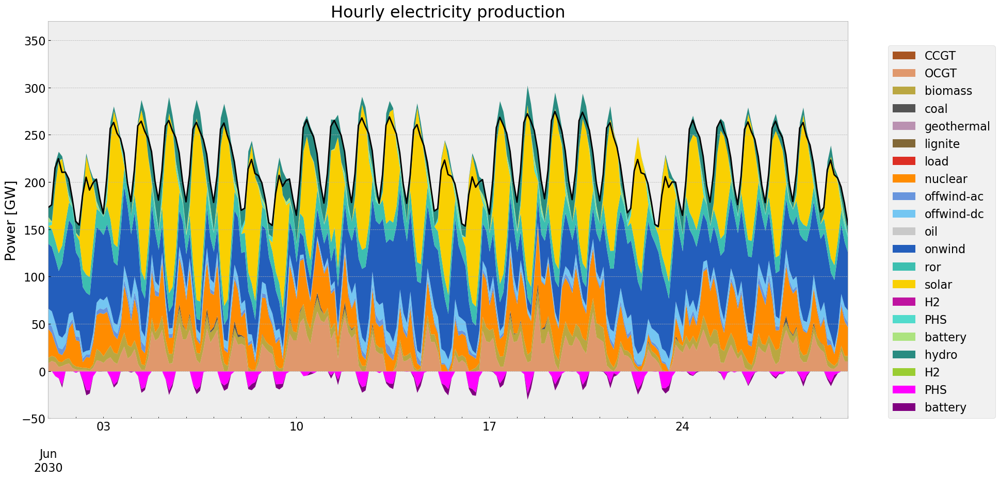

In [90]:
#generation curve all countries
#winter
gen_curve_tot(n1, '2030-12-01', '2030-12-31', colors_gen)
#summer
gen_curve_tot(n1, '2030-06-01', '2030-06-30', colors_gen)

## Storage

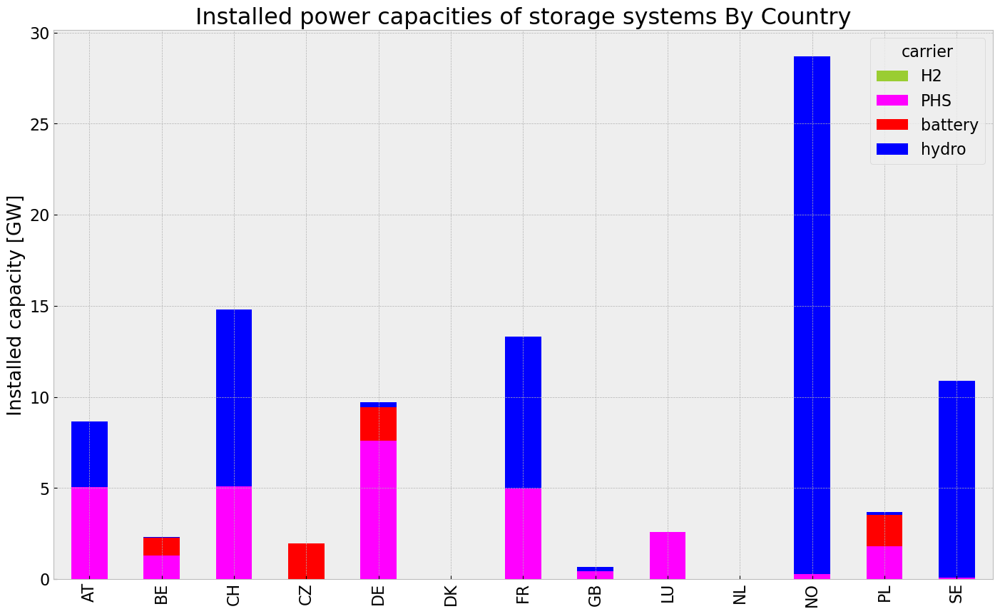

In [91]:
store_inv = inst_store_table(n1)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\1590089999.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\1590089999.py:5: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  soc.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')


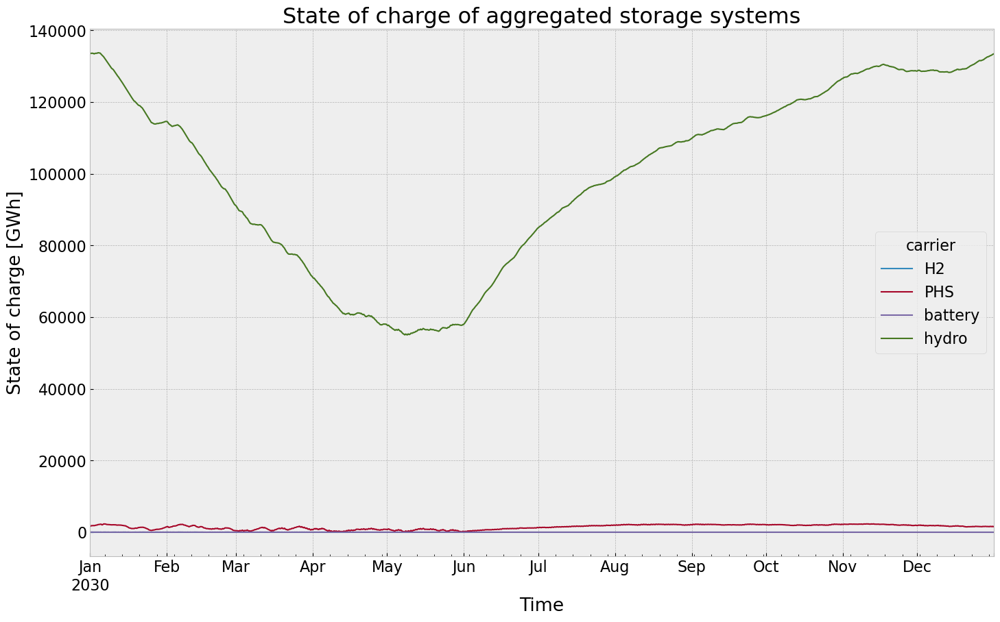

In [92]:
state_of_charge_plot(n1)


## Electricity Price


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


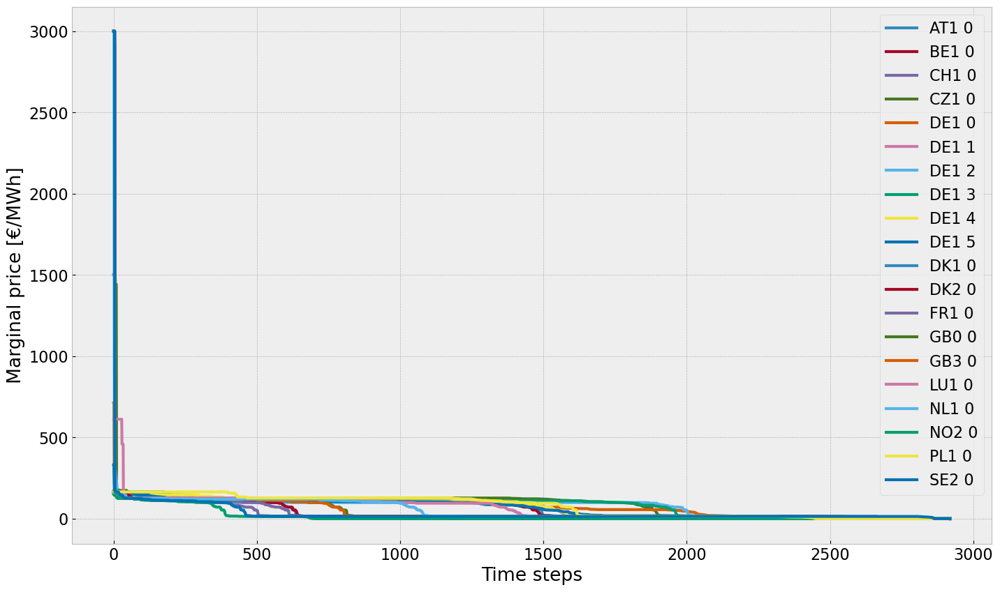

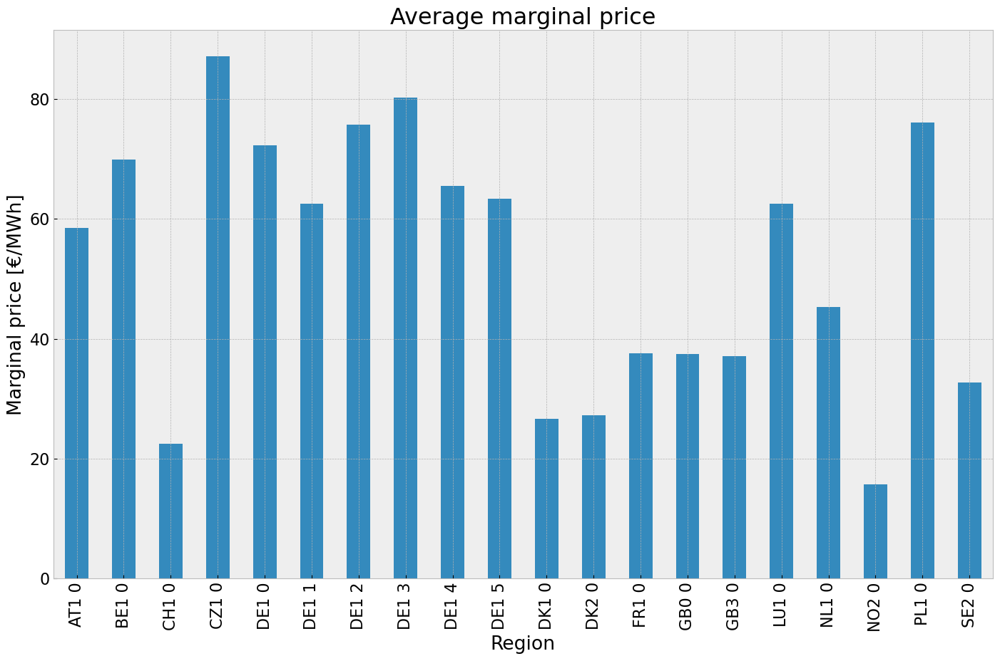

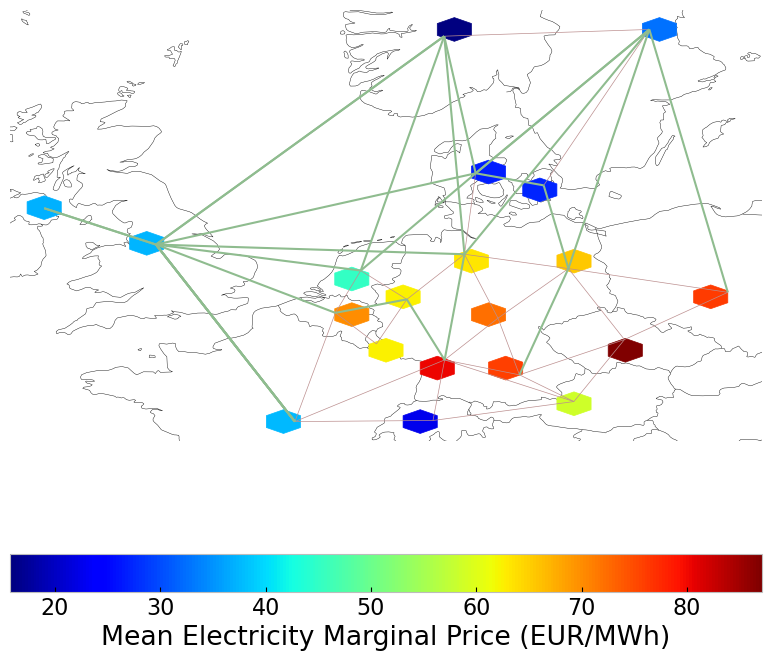

In [93]:
price_dur_curve_plot(n1)
price_regions_table(n1)
price_regions(n1)


## Emission

In [94]:
em_inv =em_table(n1)
em_inv

,Generation in MWh,efficiency,emissions in Tonnes CO2/MWh,emissions in Tonnes CO2
carrier,,,,
CCGT,0.000000e+00,0.580000,0.1980,0.000000e+00
OCGT,6.644392e+07,0.451621,0.1980,2.913040e+07
biomass,2.368564e+07,0.468000,0.0000,0.000000e+00
coal,1.371362e+06,0.329908,0.3361,1.397101e+06
geothermal,0.000000e+00,1.000000,0.1200,0.000000e+00
lignite,7.556620e+05,0.337285,0.4069,9.116300e+05
load,8.738577e+03,1.000000,0.0000,0.000000e+00
nuclear,1.185268e+08,0.326600,0.0000,0.000000e+00
offwind-ac,1.557222e+07,1.000000,0.0000,0.000000e+00


## 2. Scenario: perfect foresight with no additional investment

In [95]:
#copy network
n2=n.copy()

# find transnational AC lines and cut them
for index,row in n2.lines.iterrows():
    ctr_bus0 = row['bus0'][:2]
    ctr_bus1 = row['bus1'][:2]

    #set s_max_pu as series for transnational AC Lines
    if ctr_bus0 != ctr_bus1 and row['carrier'] == 'AC':
        n2.lines_t.s_max_pu[index] = 0.7


# find transnational DC lines
for index,row in n2.links.iterrows():
    ctr_bus0 = row['bus0'][:2]
    ctr_bus1 = row['bus1'][:2]

    #set s_max_pu as series for transnational DC Lines
    if ctr_bus0 != ctr_bus1 and row['carrier'] == 'DC':
        n2.links_t.p_max_pu[index] = 1

#cut AC lines
n2.lines_t.s_max_pu.loc[cut_start:cut_end] *= reduction

#cut DC lines
n2.links_t.p_max_pu.loc[cut_start:cut_end] *= reduction



#set the optimal capacity of generators from the base scenario as the new minimum capacity 
for index, value in n2.generators.p_nom_extendable.items():
    if value:  
        n2.generators.at[index, 'p_nom'] = n.generators.at[index, 'p_nom_opt']
        #n2.generators.at[index, 'p_nom_max'] = n.generators.at[index, 'p_nom_opt']
        n2.generators.at[index,'p_nom_extendable'] = False

#set the optimal capacity of storage units from the base scenario as the new minimum capacity 
for index, value in n2.storage_units.p_nom_extendable.items():
    if value:  
        n2.storage_units.at[index, 'p_nom'] = n.storage_units.at[index, 'p_nom_opt']
        #n2.storage_units.at[index, 'p_nom_max'] = n.storage_units.at[index, 'p_nom_opt']
        n2.storage_units.at[index,'p_nom_extendable'] = False

#set the optimal capacity of stores from the base scenario as the new minimum capacity 
for index, value in n2.stores.e_nom_extendable.items():
    if value:  
        n2.stores.at[index, 'e_nom'] = n.stores.at[index, 'e_nom_opt']
        #n2.stores.at[index, 'e_nom_max'] = n.stores.at[index, 'e_nom_opt']
        n2.stores.at[index, 'e_nom_extendable'] =False

#set the optimal capacity of lines from the base scenario as the new minimum capacity 
for index, value in n2.lines.s_nom_extendable.items():
    if value:  
        n2.lines.at[index, 's_nom'] = n.lines.at[index, 's_nom_opt']
        #n2.lines.at[index, 's_nom_max'] = n.lines.at[index, 's_nom_opt']
        n2.lines.at[index, 's_nom_extendable'] =False

#set the optimal capacity of links from the base scenario as the new minimum capacity 
for index, value in n2.links.p_nom_extendable.items():
    if value:  
        n2.links.at[index, 's_nom'] = n.links.at[index, 'p_nom_opt']
        #n2.lines.at[index, 's_nom_max'] = n.lines.at[index, 's_nom_opt']
        n2.links.at[index, 'p_nom_extendable'] =False

In [96]:
n2.optimize.create_model()

Linopy LP model

Variables:
----------
 * Generator-p (snapshot, Generator)
 * Line-s (snapshot, Line)
 * Link-p (snapshot, Link)
 * StorageUnit-p_dispatch (snapshot, StorageUnit)
 * StorageUnit-p_store (snapshot, StorageUnit)
 * StorageUnit-state_of_charge (snapshot, StorageUnit)
 * StorageUnit-spill (snapshot, StorageUnit)

Constraints:
------------
 * Generator-fix-p-lower (snapshot, Generator-fix)
 * Generator-fix-p-upper (snapshot, Generator-fix)
 * Line-fix-s-lower (snapshot, Line-fix)
 * Line-fix-s-upper (snapshot, Line-fix)
 * Link-fix-p-lower (snapshot, Link-fix)
 * Link-fix-p-upper (snapshot, Link-fix)
 * StorageUnit-fix-p_dispatch-lower (snapshot, StorageUnit-fix)
 * StorageUnit-fix-p_dispatch-upper (snapshot, StorageUnit-fix)
 * StorageUnit-fix-p_store-lower (snapshot, StorageUnit-fix)
 * StorageUnit-fix-p_store-upper (snapshot, StorageUnit-fix)
 * StorageUnit-fix-state_of_charge-lower (snapshot, StorageUnit-fix)
 * StorageUnit-fix-state_of_charge-upper (snapshot, StorageUn

In [97]:
n2.optimize(solver_name ='gurobi')
#optimize.optimize_with_rolling_horizon(n2, horizon=24, overlap=0, solver_name='gurobi')

INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.


Writing continuous variables.: 100%|██████████| 7/7 [00:05<00:00,  1.20it/s]
INFO:linopy.io: Writing time: 36.1s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-oafckzu3.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-oafckzu3.lp


Reading time = 11.39 seconds


INFO:gurobipy:Reading time = 11.39 seconds


obj: 3264560 rows, 1521320 columns, 5349440 nonzeros


INFO:gurobipy:obj: 3264560 rows, 1521320 columns, 5349440 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 3264560 rows, 1521320 columns and 5349440 nonzeros


INFO:gurobipy:Optimize a model with 3264560 rows, 1521320 columns and 5349440 nonzeros


Model fingerprint: 0x4aed528a


INFO:gurobipy:Model fingerprint: 0x4aed528a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+00, 3e+04]


INFO:gurobipy:  Bounds range     [1e+00, 3e+04]


  RHS range        [2e-01, 1e+09]


INFO:gurobipy:  RHS range        [2e-01, 1e+09]


Presolve removed 3120661 rows and 957992 columns


INFO:gurobipy:Presolve removed 3120661 rows and 957992 columns


Presolve time: 3.71s


INFO:gurobipy:Presolve time: 3.71s


Presolved: 143899 rows, 563328 columns, 890444 nonzeros


INFO:gurobipy:Presolved: 143899 rows, 563328 columns, 890444 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 1.26s


INFO:gurobipy:Ordering time: 1.26s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.271e+05


INFO:gurobipy: AA' NZ     : 3.271e+05


 Factor NZ  : 3.381e+06 (roughly 300 MB of memory)


INFO:gurobipy: Factor NZ  : 3.381e+06 (roughly 300 MB of memory)


 Factor Ops : 1.506e+08 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.506e+08 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.08416247e+13 -1.34331805e+15  8.28e+05 1.00e+03  1.97e+09     6s


INFO:gurobipy:   0   3.08416247e+13 -1.34331805e+15  8.28e+05 1.00e+03  1.97e+09     6s


   1   8.29353822e+12 -4.00960935e+13  9.54e+04 8.19e-12  1.18e+08     6s


INFO:gurobipy:   1   8.29353822e+12 -4.00960935e+13  9.54e+04 8.19e-12  1.18e+08     6s


   2   1.42114579e+12 -9.68174825e+12  5.90e+03 2.18e-11  1.35e+07     7s


INFO:gurobipy:   2   1.42114579e+12 -9.68174825e+12  5.90e+03 2.18e-11  1.35e+07     7s


   3   4.81797584e+11 -2.64226800e+12  6.18e+02 1.46e-11  3.00e+06     7s


INFO:gurobipy:   3   4.81797584e+11 -2.64226800e+12  6.18e+02 1.46e-11  3.00e+06     7s


   4   2.73944802e+11 -1.20491799e+12  1.64e+02 9.09e-12  1.35e+06     7s


INFO:gurobipy:   4   2.73944802e+11 -1.20491799e+12  1.64e+02 9.09e-12  1.35e+06     7s


   5   2.34815280e+11 -4.02508144e+11  8.11e+01 1.09e-11  5.77e+05     8s


INFO:gurobipy:   5   2.34815280e+11 -4.02508144e+11  8.11e+01 1.09e-11  5.77e+05     8s


   6   2.09143065e+11 -7.87314244e+10  3.59e+01 6.37e-12  2.58e+05     8s


INFO:gurobipy:   6   2.09143065e+11 -7.87314244e+10  3.59e+01 6.37e-12  2.58e+05     8s


   7   1.93094750e+11  5.27678967e+10  1.69e+01 5.46e-12  1.25e+05     8s


INFO:gurobipy:   7   1.93094750e+11  5.27678967e+10  1.69e+01 5.46e-12  1.25e+05     8s


   8   1.83846343e+11  1.04257904e+11  9.69e+00 5.46e-12  7.10e+04     8s


INFO:gurobipy:   8   1.83846343e+11  1.04257904e+11  9.69e+00 5.46e-12  7.10e+04     8s


   9   1.74243777e+11  1.28846139e+11  3.27e+00 5.46e-12  4.04e+04     9s


INFO:gurobipy:   9   1.74243777e+11  1.28846139e+11  3.27e+00 5.46e-12  4.04e+04     9s


  10   1.70482325e+11  1.48418556e+11  1.63e+00 3.64e-12  1.96e+04     9s


INFO:gurobipy:  10   1.70482325e+11  1.48418556e+11  1.63e+00 3.64e-12  1.96e+04     9s


  11   1.69086211e+11  1.54638597e+11  1.15e+00 2.73e-12  1.28e+04     9s


INFO:gurobipy:  11   1.69086211e+11  1.54638597e+11  1.15e+00 2.73e-12  1.28e+04     9s


  12   1.67971727e+11  1.57631394e+11  7.96e-01 2.73e-12  9.19e+03    10s


INFO:gurobipy:  12   1.67971727e+11  1.57631394e+11  7.96e-01 2.73e-12  9.19e+03    10s


  13   1.67330538e+11  1.59126029e+11  6.03e-01 2.43e-12  7.29e+03    10s


INFO:gurobipy:  13   1.67330538e+11  1.59126029e+11  6.03e-01 2.43e-12  7.29e+03    10s


  14   1.66796082e+11  1.61172431e+11  4.48e-01 2.30e-12  5.00e+03    10s


INFO:gurobipy:  14   1.66796082e+11  1.61172431e+11  4.48e-01 2.30e-12  5.00e+03    10s


  15   1.66317108e+11  1.62701294e+11  3.14e-01 2.52e-12  3.21e+03    11s


INFO:gurobipy:  15   1.66317108e+11  1.62701294e+11  3.14e-01 2.52e-12  3.21e+03    11s


  16   1.65728101e+11  1.63553567e+11  1.58e-01 3.36e-12  1.93e+03    11s


INFO:gurobipy:  16   1.65728101e+11  1.63553567e+11  1.58e-01 3.36e-12  1.93e+03    11s


  17   1.65478054e+11  1.64167833e+11  9.14e-02 2.08e-12  1.16e+03    11s


INFO:gurobipy:  17   1.65478054e+11  1.64167833e+11  9.14e-02 2.08e-12  1.16e+03    11s


  18   1.65356688e+11  1.64404365e+11  6.13e-02 2.25e-12  8.46e+02    12s


INFO:gurobipy:  18   1.65356688e+11  1.64404365e+11  6.13e-02 2.25e-12  8.46e+02    12s


  19   1.65316559e+11  1.64534169e+11  5.14e-02 2.73e-12  6.95e+02    12s


INFO:gurobipy:  19   1.65316559e+11  1.64534169e+11  5.14e-02 2.73e-12  6.95e+02    12s


  20   1.65284637e+11  1.64638244e+11  4.33e-02 3.64e-12  5.74e+02    13s


INFO:gurobipy:  20   1.65284637e+11  1.64638244e+11  4.33e-02 3.64e-12  5.74e+02    13s


  21   1.65252013e+11  1.64688055e+11  3.54e-02 3.64e-12  5.01e+02    13s


INFO:gurobipy:  21   1.65252013e+11  1.64688055e+11  3.54e-02 3.64e-12  5.01e+02    13s


  22   1.65207906e+11  1.64776854e+11  2.44e-02 3.64e-12  3.83e+02    13s


INFO:gurobipy:  22   1.65207906e+11  1.64776854e+11  2.44e-02 3.64e-12  3.83e+02    13s


  23   1.65180023e+11  1.64830815e+11  1.79e-02 2.73e-12  3.10e+02    14s


INFO:gurobipy:  23   1.65180023e+11  1.64830815e+11  1.79e-02 2.73e-12  3.10e+02    14s


  24   1.65165611e+11  1.64878927e+11  1.43e-02 3.01e-12  2.55e+02    14s


INFO:gurobipy:  24   1.65165611e+11  1.64878927e+11  1.43e-02 3.01e-12  2.55e+02    14s


  25   1.65162303e+11  1.64908423e+11  1.35e-02 3.64e-12  2.25e+02    15s


INFO:gurobipy:  25   1.65162303e+11  1.64908423e+11  1.35e-02 3.64e-12  2.25e+02    15s


  26   1.65143746e+11  1.64949820e+11  9.24e-03 3.64e-12  1.72e+02    15s


INFO:gurobipy:  26   1.65143746e+11  1.64949820e+11  9.24e-03 3.64e-12  1.72e+02    15s


  27   1.65138912e+11  1.64992491e+11  8.14e-03 2.73e-12  1.30e+02    16s


INFO:gurobipy:  27   1.65138912e+11  1.64992491e+11  8.14e-03 2.73e-12  1.30e+02    16s


  28   1.65130971e+11  1.65024819e+11  6.26e-03 2.00e-12  9.43e+01    16s


INFO:gurobipy:  28   1.65130971e+11  1.65024819e+11  6.26e-03 2.00e-12  9.43e+01    16s


  29   1.65124086e+11  1.65043248e+11  4.67e-03 6.40e-09  7.18e+01    16s


INFO:gurobipy:  29   1.65124086e+11  1.65043248e+11  4.67e-03 6.40e-09  7.18e+01    16s


  30   1.65120931e+11  1.65063060e+11  3.95e-03 5.32e-09  5.14e+01    17s


INFO:gurobipy:  30   1.65120931e+11  1.65063060e+11  3.95e-03 5.32e-09  5.14e+01    17s


  31   1.65117327e+11  1.65076408e+11  3.15e-03 1.05e-08  3.64e+01    17s


INFO:gurobipy:  31   1.65117327e+11  1.65076408e+11  3.15e-03 1.05e-08  3.64e+01    17s


  32   1.65114025e+11  1.65084107e+11  2.42e-03 8.20e-09  2.66e+01    18s


INFO:gurobipy:  32   1.65114025e+11  1.65084107e+11  2.42e-03 8.20e-09  2.66e+01    18s


  33   1.65110245e+11  1.65092668e+11  1.60e-03 5.77e-09  1.56e+01    18s


INFO:gurobipy:  33   1.65110245e+11  1.65092668e+11  1.60e-03 5.77e-09  1.56e+01    18s


  34   1.65108977e+11  1.65096592e+11  1.32e-03 4.17e-09  1.10e+01    18s


INFO:gurobipy:  34   1.65108977e+11  1.65096592e+11  1.32e-03 4.17e-09  1.10e+01    18s


  35   1.65107389e+11  1.65097409e+11  9.90e-04 4.41e-09  8.87e+00    19s


INFO:gurobipy:  35   1.65107389e+11  1.65097409e+11  9.90e-04 4.41e-09  8.87e+00    19s


  36   1.65107220e+11  1.65097878e+11  9.53e-04 4.10e-09  8.30e+00    19s


INFO:gurobipy:  36   1.65107220e+11  1.65097878e+11  9.53e-04 4.10e-09  8.30e+00    19s


  37   1.65107108e+11  1.65098106e+11  9.29e-04 3.94e-09  8.00e+00    19s


INFO:gurobipy:  37   1.65107108e+11  1.65098106e+11  9.29e-04 3.94e-09  8.00e+00    19s


  38   1.65106493e+11  1.65098849e+11  8.01e-04 3.47e-09  6.79e+00    20s


INFO:gurobipy:  38   1.65106493e+11  1.65098849e+11  8.01e-04 3.47e-09  6.79e+00    20s


  39   1.65105731e+11  1.65099782e+11  6.35e-04 2.85e-09  5.29e+00    20s


INFO:gurobipy:  39   1.65105731e+11  1.65099782e+11  6.35e-04 2.85e-09  5.29e+00    20s


  40   1.65105275e+11  1.65099876e+11  5.41e-04 2.97e-09  4.80e+00    20s


INFO:gurobipy:  40   1.65105275e+11  1.65099876e+11  5.41e-04 2.97e-09  4.80e+00    20s


  41   1.65104544e+11  1.65101108e+11  3.90e-04 1.91e-09  3.05e+00    21s


INFO:gurobipy:  41   1.65104544e+11  1.65101108e+11  3.90e-04 1.91e-09  3.05e+00    21s


  42   1.65103626e+11  1.65101982e+11  2.01e-04 9.79e-10  1.46e+00    21s


INFO:gurobipy:  42   1.65103626e+11  1.65101982e+11  2.01e-04 9.79e-10  1.46e+00    21s


  43   1.65103339e+11  1.65102307e+11  1.45e-04 5.69e-10  9.17e-01    21s


INFO:gurobipy:  43   1.65103339e+11  1.65102307e+11  1.45e-04 5.69e-10  9.17e-01    21s


  44   1.65103263e+11  1.65102372e+11  1.30e-04 5.79e-10  7.91e-01    22s


INFO:gurobipy:  44   1.65103263e+11  1.65102372e+11  1.30e-04 5.79e-10  7.91e-01    22s


  45   1.65103093e+11  1.65102438e+11  9.47e-05 4.47e-10  5.82e-01    22s


INFO:gurobipy:  45   1.65103093e+11  1.65102438e+11  9.47e-05 4.47e-10  5.82e-01    22s


  46   1.65102905e+11  1.65102492e+11  5.67e-05 4.39e-10  3.67e-01    22s


INFO:gurobipy:  46   1.65102905e+11  1.65102492e+11  5.67e-05 4.39e-10  3.67e-01    22s


  47   1.65102849e+11  1.65102524e+11  4.52e-05 3.06e-10  2.89e-01    23s


INFO:gurobipy:  47   1.65102849e+11  1.65102524e+11  4.52e-05 3.06e-10  2.89e-01    23s


  48   1.65102779e+11  1.65102541e+11  3.13e-05 3.29e-10  2.12e-01    23s


INFO:gurobipy:  48   1.65102779e+11  1.65102541e+11  3.13e-05 3.29e-10  2.12e-01    23s


  49   1.65102681e+11  1.65102594e+11  1.17e-05 8.06e-10  7.76e-02    23s


INFO:gurobipy:  49   1.65102681e+11  1.65102594e+11  1.17e-05 8.06e-10  7.76e-02    23s


  50   1.65102648e+11  1.65102607e+11  7.29e-06 7.27e-10  3.66e-02    24s


INFO:gurobipy:  50   1.65102648e+11  1.65102607e+11  7.29e-06 7.27e-10  3.66e-02    24s


  51   1.65102632e+11  1.65102615e+11  4.39e-06 6.16e-10  1.48e-02    24s


INFO:gurobipy:  51   1.65102632e+11  1.65102615e+11  4.39e-06 6.16e-10  1.48e-02    24s


  52   1.65102624e+11  1.65102618e+11  1.72e-06 3.53e-10  5.05e-03    25s


INFO:gurobipy:  52   1.65102624e+11  1.65102618e+11  1.72e-06 3.53e-10  5.05e-03    25s


  53   1.65102621e+11  1.65102619e+11  2.18e-06 1.99e-10  1.83e-03    25s


INFO:gurobipy:  53   1.65102621e+11  1.65102619e+11  2.18e-06 1.99e-10  1.83e-03    25s


  54   1.65102621e+11  1.65102620e+11  1.07e-06 1.81e-10  1.01e-03    25s


INFO:gurobipy:  54   1.65102621e+11  1.65102620e+11  1.07e-06 1.81e-10  1.01e-03    25s


  55   1.65102620e+11  1.65102620e+11  1.70e-07 1.12e-10  1.83e-04    26s


INFO:gurobipy:  55   1.65102620e+11  1.65102620e+11  1.70e-07 1.12e-10  1.83e-04    26s


  56   1.65102620e+11  1.65102620e+11  6.30e-08 2.72e-10  4.66e-05    26s


INFO:gurobipy:  56   1.65102620e+11  1.65102620e+11  6.30e-08 2.72e-10  4.66e-05    26s


  57   1.65102620e+11  1.65102620e+11  4.40e-08 3.51e-11  4.42e-06    27s


INFO:gurobipy:  57   1.65102620e+11  1.65102620e+11  4.40e-08 3.51e-11  4.42e-06    27s


  58   1.65102620e+11  1.65102620e+11  6.37e-09 3.64e-12  1.80e-08    27s


INFO:gurobipy:  58   1.65102620e+11  1.65102620e+11  6.37e-09 3.64e-12  1.80e-08    27s


  59   1.65102620e+11  1.65102620e+11  3.54e-09 5.46e-12  1.18e-10    27s


INFO:gurobipy:  59   1.65102620e+11  1.65102620e+11  3.54e-09 5.46e-12  1.18e-10    27s


INFO:gurobipy:


Barrier solved model in 59 iterations and 27.26 seconds (11.37 work units)


INFO:gurobipy:Barrier solved model in 59 iterations and 27.26 seconds (11.37 work units)


Optimal objective 1.65102620e+11


INFO:gurobipy:Optimal objective 1.65102620e+11


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


    7682 DPushes remaining with DInf 0.0000000e+00                28s


INFO:gurobipy:    7682 DPushes remaining with DInf 0.0000000e+00                28s


       0 DPushes remaining with DInf 0.0000000e+00                28s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                28s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


   25962 PPushes remaining with PInf 0.0000000e+00                28s


INFO:gurobipy:   25962 PPushes remaining with PInf 0.0000000e+00                28s


       0 PPushes remaining with PInf 0.0000000e+00                30s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                30s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 3.1026943e-09     30s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 3.1026943e-09     30s


INFO:gurobipy:


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   33647    1.6510262e+11   0.000000e+00   0.000000e+00     32s


INFO:gurobipy:   33647    1.6510262e+11   0.000000e+00   0.000000e+00     32s


INFO:gurobipy:


Solved in 33647 iterations and 32.44 seconds (13.41 work units)


INFO:gurobipy:Solved in 33647 iterations and 32.44 seconds (13.41 work units)


Optimal objective  1.651026201e+11


INFO:gurobipy:Optimal objective  1.651026201e+11
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 1521320 primals, 3264560 duals
Objective: 1.65e+11
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.


('ok', 'optimal')

In [98]:
tot_cos_noinv=n2.objective/1e9 #billion €
system_cost_noinv = system_cost(n2) #million €/a
marg_price_region_noinv = n2.buses_t.marginal_price.mean()
stat_noinv = n2.statistics()

## Installed Capacity

Since expansion is not allowed in this scenario, the installed capacity will equal to that of the base scenario.

<Figure size 640x480 with 0 Axes>

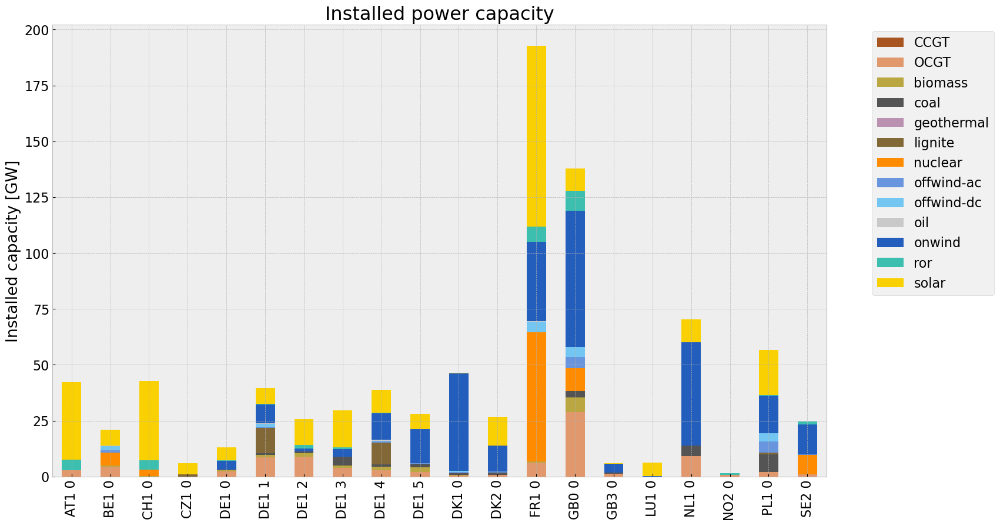

<Figure size 640x480 with 0 Axes>

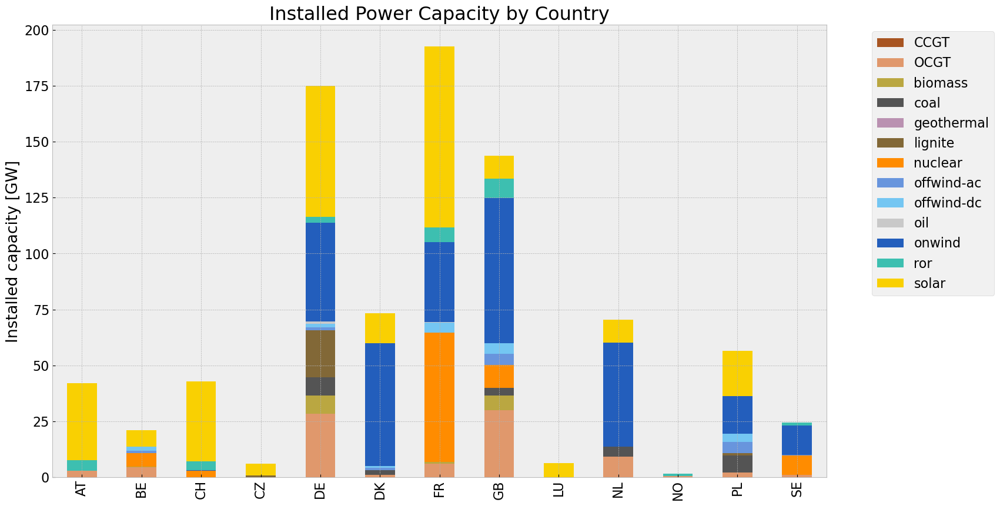

In [99]:
# consolidated istalled cap without load_shedding

#capacities_noinv = n2.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
#capacities_noinv.fillna(0, inplace=True)
#gen = (capacities_noinv.unstack()/1000).drop(columns=['load'],inplace=False)


capacities_noinv = inst_cap_table(n2, color_cap)
cap_noinv_country= inst_cap_table_country(n2, color_cap)



## Generation

<Figure size 640x480 with 0 Axes>

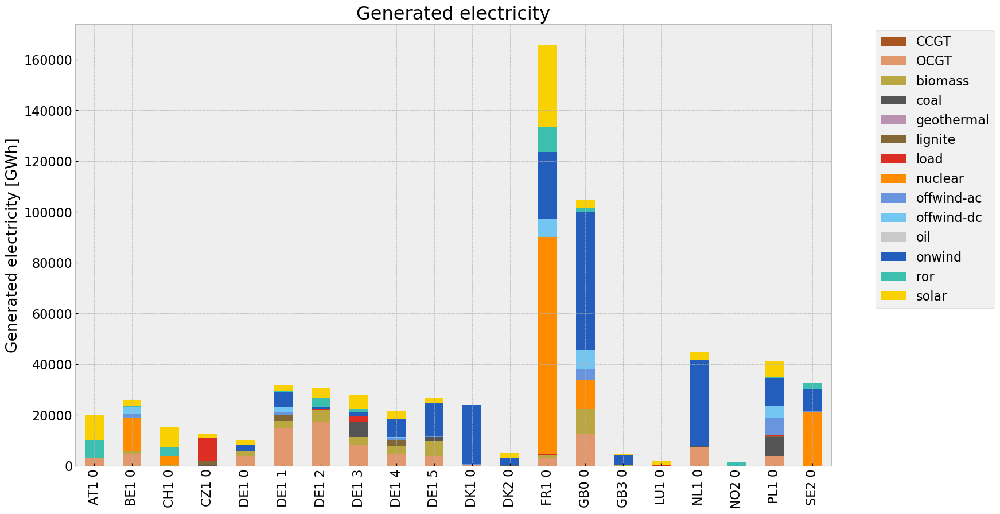

<Figure size 640x480 with 0 Axes>

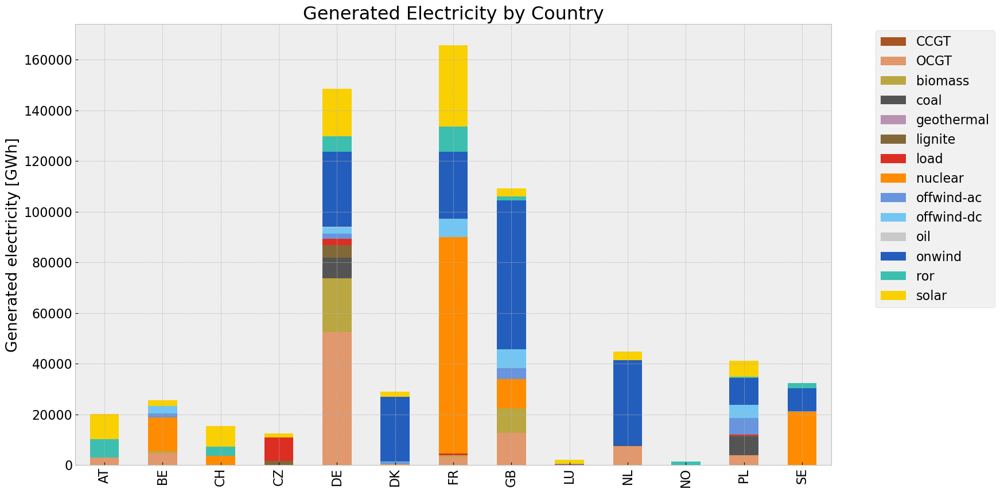

In [100]:
# consolidated generation table
#carrier = n2.generators.carrier.unique()
#df_tot_generation = n2.generators_t.p.sum()

#generations = pd.Series(index = n2.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

#for r in region:
    #for tech in carrier:
        #key = f"{r} {tech}"
        #if key in df_tot_generation.index:
            #try:
                #generations.loc[r, tech] = df_tot_generation[key]
                #print(generations.loc[r, tech])
            #except KeyError:
                #print('error')

#generations.fillna(0, inplace=True)
#gen_noinv = generations.unstack()/1000#GWh

gen_noinv= gen_power_table(n2,colors_gen_table)
gen_noinv_country = gen_power_table_country(n2,colors_gen_table)


## Snapshot

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\2796143640.py:1: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p = n2.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\2796143640.py:2: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\2572686274.py:23: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = p_country.groupby(n.generators.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\2572686274.py:40: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = sto_ctr.groupby(n.storage_units.carrier, axis=1).sum(

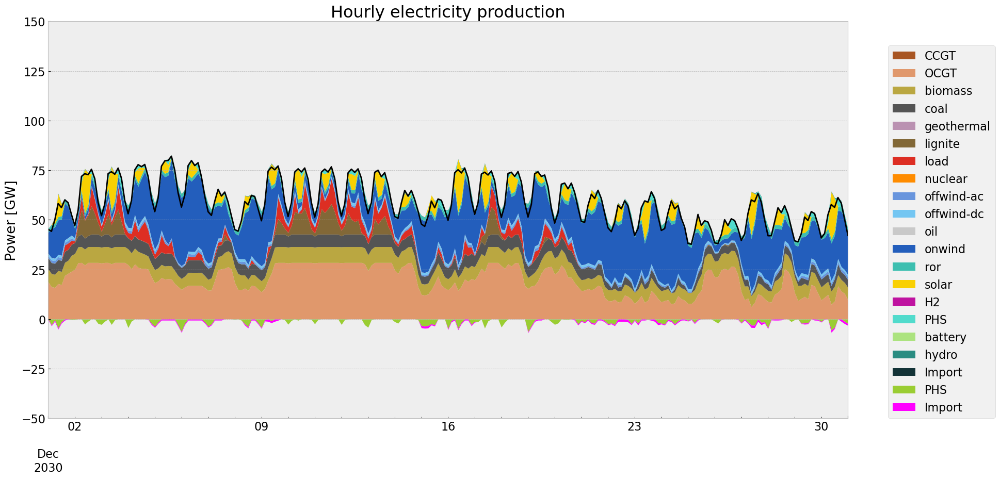

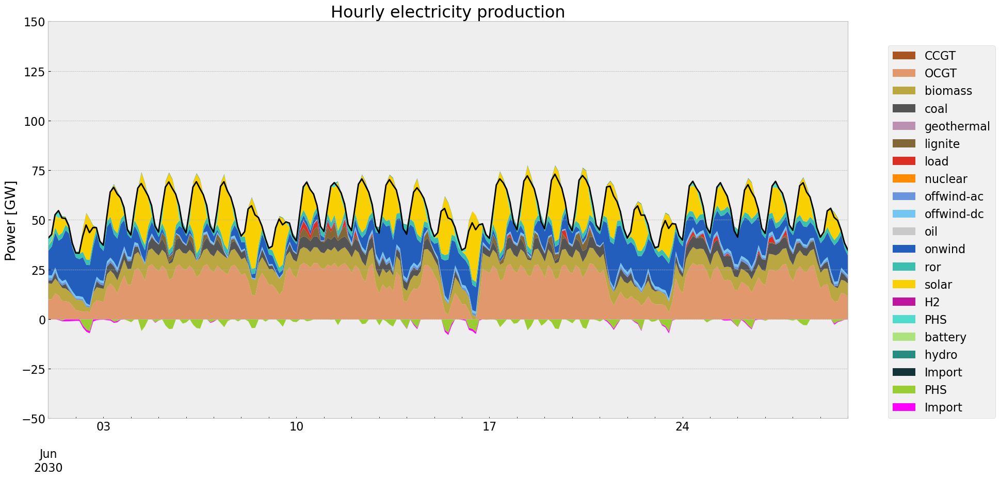

In [101]:
p = n2.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
sto = n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)    

gen_curve(n2, '2030-12-01', '2030-12-31', colors_gen,'DE')
gen_curve(n2, '2030-06-01', '2030-06-30', colors_gen,'DE')


C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\1259656158.py:5: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum() # MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\1259656158.py:9: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\1259656158.py:13: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\1259656158.py:19: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, freq='

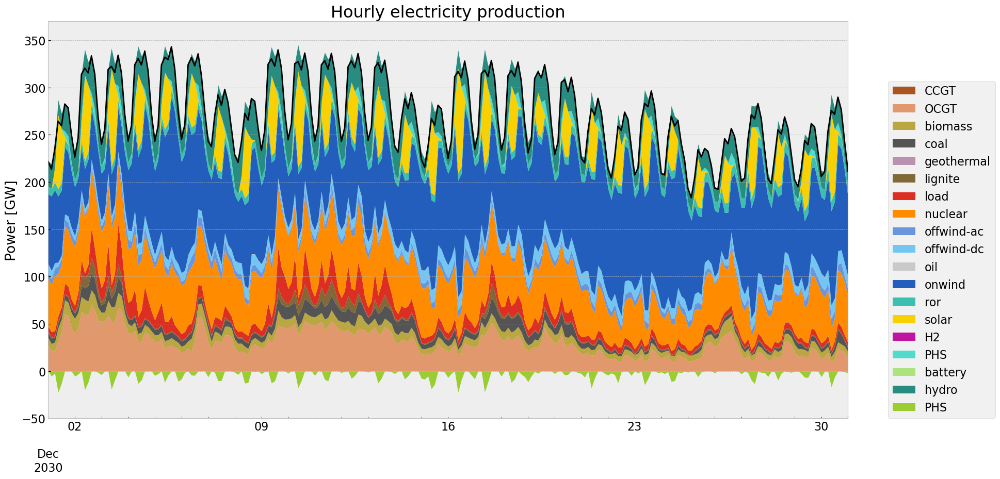

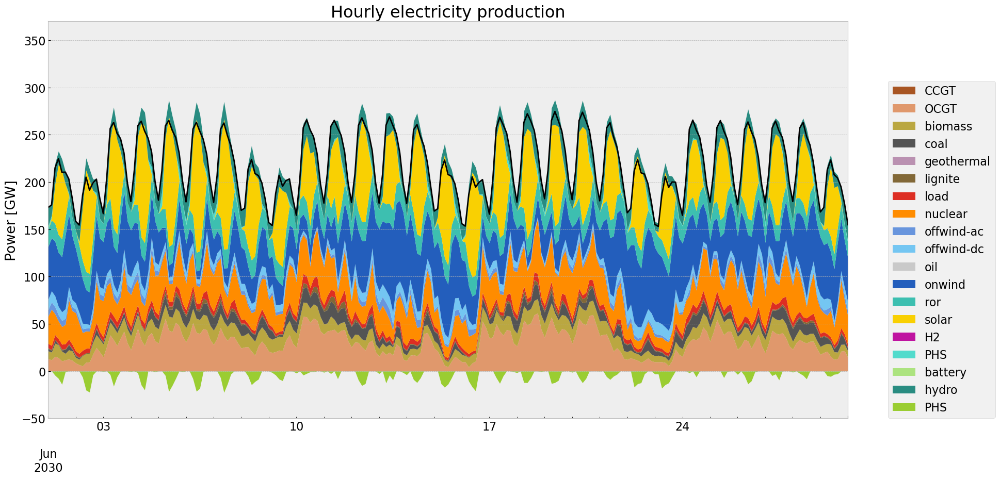

In [102]:
#generation curve all countries
#winter
gen_curve_tot(n2, '2030-12-01', '2030-12-31', colors_gen)
#summer
gen_curve_tot(n2, '2030-06-01', '2030-06-30', colors_gen)

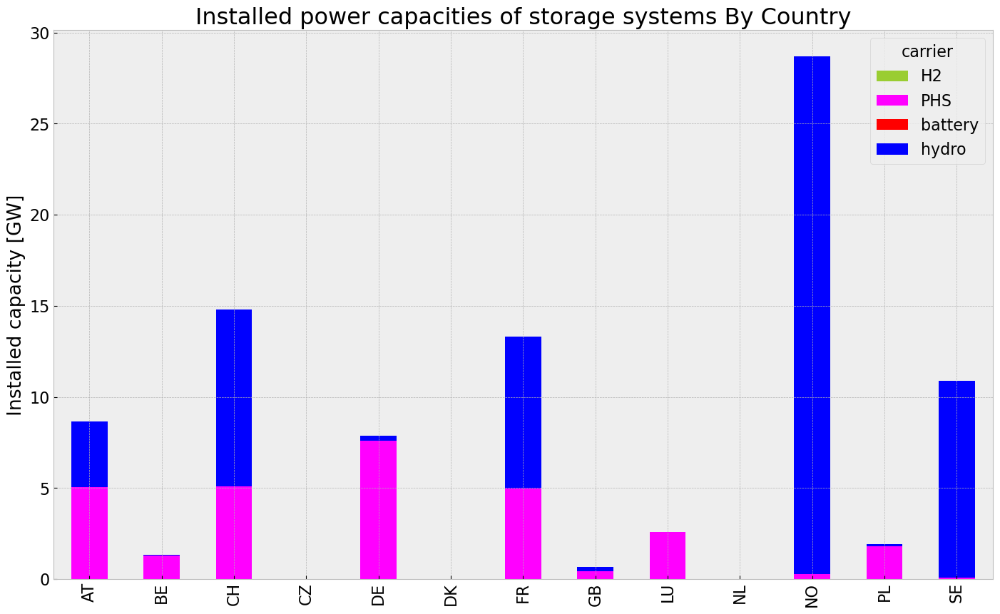

In [103]:
#storage unit capacities
store_noinv = inst_store_table(n2)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\1590089999.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\1590089999.py:5: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  soc.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\1117423567.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3).loc[pd.date_range(start="2013-01-01", end="2013-12-31",freq='3H')].plot(figsize=(20,10))
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\1117423567.py:3: FutureWarning: 'H' is deprecated and will be removed in a future v

,Generation in MWh,efficiency,emissions in Tonnes CO2/MWh,emissions in Tonnes CO2
carrier,,,,
CCGT,0.000000e+00,0.580000,0.1980,0.000000e+00
OCGT,8.743375e+07,0.451621,0.1980,3.833278e+07
biomass,3.282691e+07,0.468000,0.0000,0.000000e+00
coal,1.620197e+07,0.329908,0.3361,1.650606e+07
geothermal,0.000000e+00,1.000000,0.1200,0.000000e+00
lignite,6.934486e+06,0.337285,0.4069,8.365758e+06
load,1.300598e+07,1.000000,0.0000,0.000000e+00
nuclear,1.348011e+08,0.326600,0.0000,0.000000e+00
offwind-ac,1.522679e+07,1.000000,0.0000,0.000000e+00


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


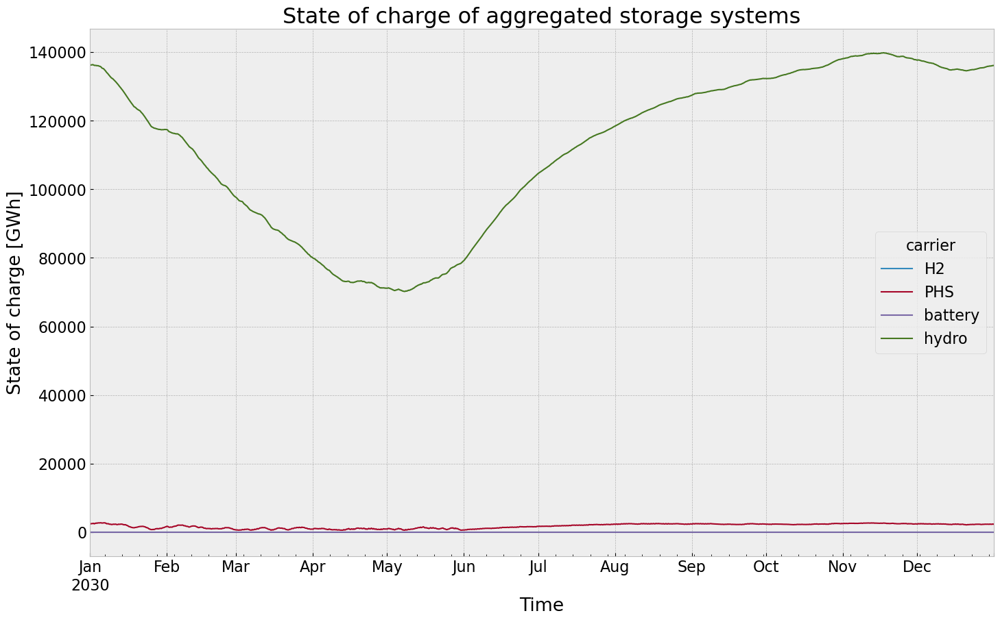

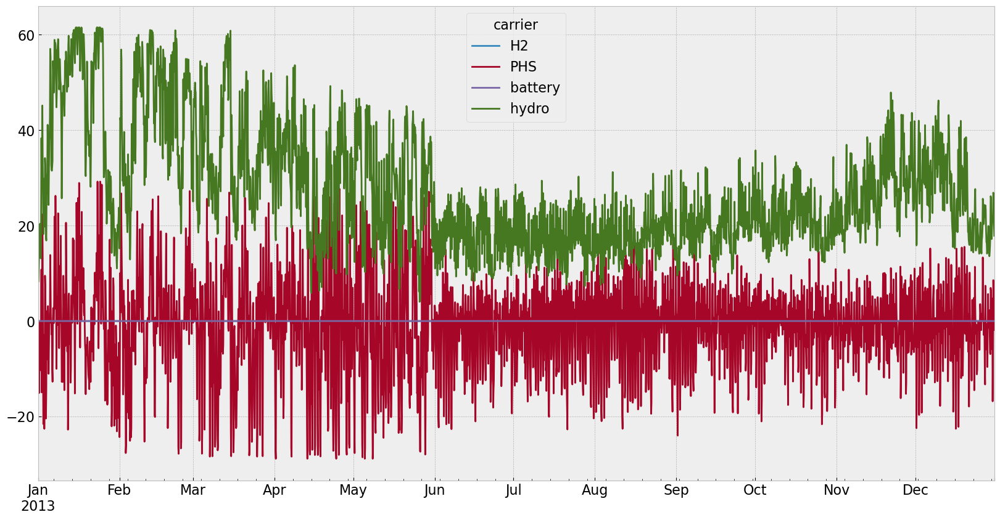

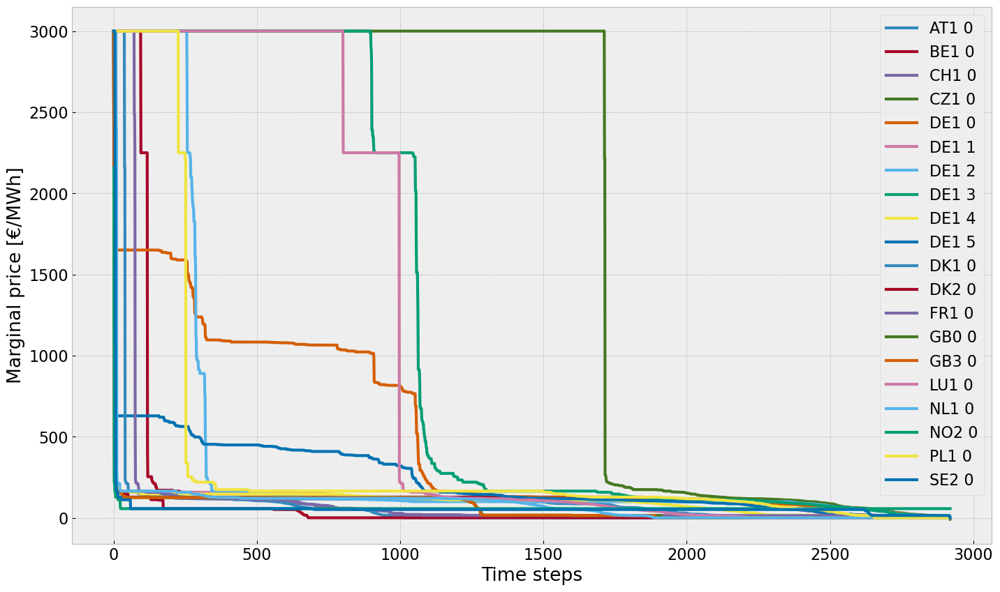

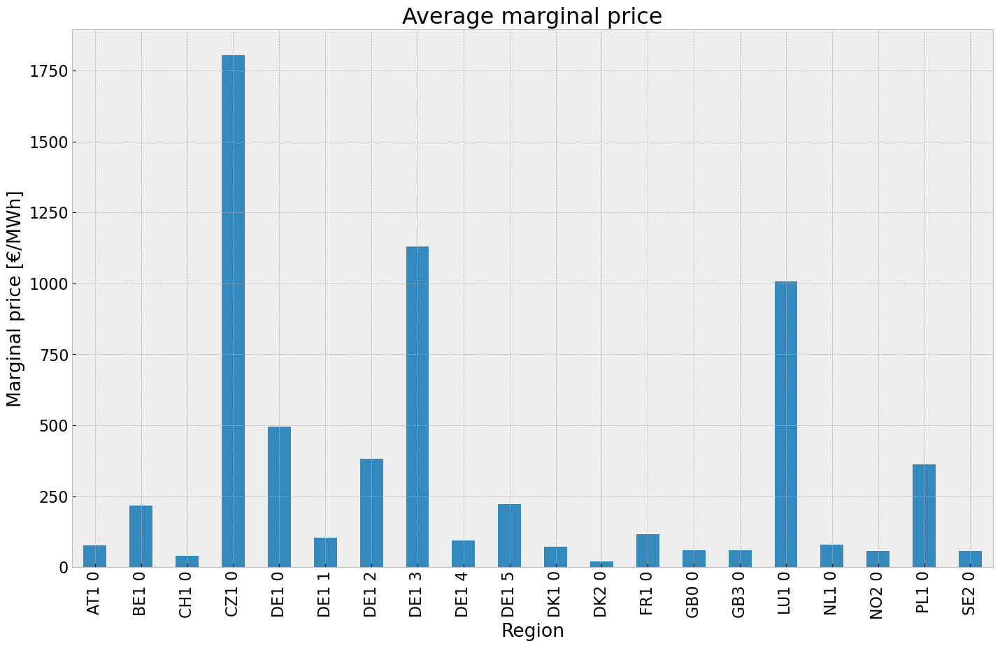

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


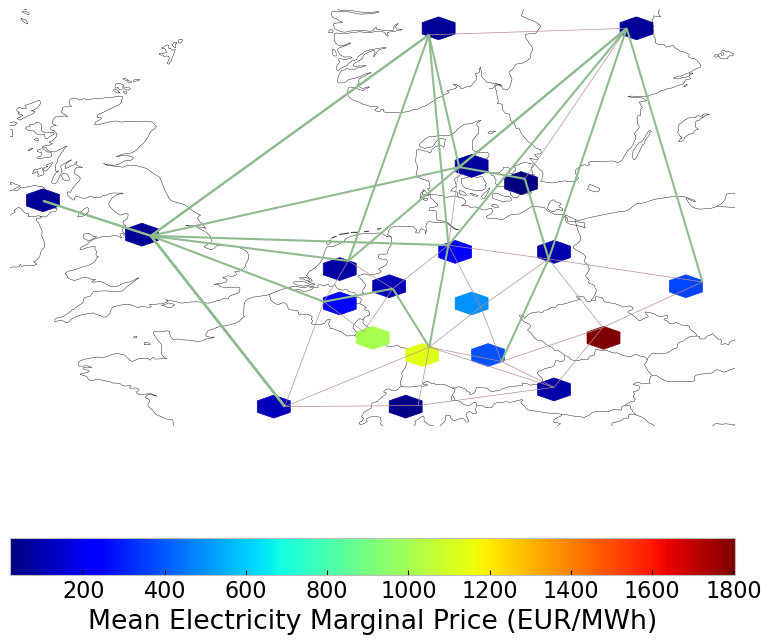

In [104]:
#state of charge
state_of_charge_plot(n2)
n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3).loc[pd.date_range(start="2013-01-01", end="2013-12-31",freq='3H')].plot(figsize=(20,10))
#price
price_dur_curve_plot(n2)
price_regions_table(n2)
price_regions(n2)
#emission
em_noinv =em_table(n2)
em_noinv

## 3. Scenario: rolling horizon foresight with no additional investment

In [105]:
n3= n2.copy()
horizon = 24
#n3.global_constraints.loc['CO2Limit','constant']= n.global_constraints.loc['CO2Limit','constant']/(len(n3.snapshots)/horizon)
n3.optimize.create_model()
optimize.optimize_with_rolling_horizon(n3, horizon=horizon, overlap=0, solver_name='gurobi')

INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-01-01 00:00:00:2013-01-03 21:00:00] (1/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 109.37it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-57wh6qxg.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-57wh6qxg.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xa8741932


INFO:gurobipy:Model fingerprint: 0xa8741932


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+01, 1e+04]


INFO:gurobipy:  Bounds range     [1e+01, 1e+04]


  RHS range        [8e-01, 1e+09]


INFO:gurobipy:  RHS range        [8e-01, 1e+09]


Presolve removed 25506 rows and 7221 columns


INFO:gurobipy:Presolve removed 25506 rows and 7221 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1326 rows, 5283 columns, 8877 nonzeros


INFO:gurobipy:Presolved: 1326 rows, 5283 columns, 8877 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.795e+03


INFO:gurobipy: AA' NZ     : 3.795e+03


 Factor NZ  : 3.810e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.810e+04 (roughly 3 MB of memory)


 Factor Ops : 2.035e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.035e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.50891553e+11 -1.57473920e+13  1.55e+05 1.14e+04  2.32e+09     0s


INFO:gurobipy:   0   3.50891553e+11 -1.57473920e+13  1.55e+05 1.14e+04  2.32e+09     0s


   1   8.79694427e+10 -4.34334971e+11  1.78e+04 8.73e-11  1.27e+08     0s


INFO:gurobipy:   1   8.79694427e+10 -4.34334971e+11  1.78e+04 8.73e-11  1.27e+08     0s


   2   1.02551934e+10 -9.33188987e+10  7.54e+02 6.55e-11  1.22e+07     0s


INFO:gurobipy:   2   1.02551934e+10 -9.33188987e+10  7.54e+02 6.55e-11  1.22e+07     0s


   3   1.86762419e+09 -1.04779441e+10  5.56e+01 1.16e-09  1.24e+06     0s


INFO:gurobipy:   3   1.86762419e+09 -1.04779441e+10  5.56e+01 1.16e-09  1.24e+06     0s


   4   6.67925998e+08 -1.82066964e+09  9.85e+00 1.89e-10  2.40e+05     0s


INFO:gurobipy:   4   6.67925998e+08 -1.82066964e+09  9.85e+00 1.89e-10  2.40e+05     0s


   5   4.65242351e+08 -6.41291176e+08  5.29e+00 7.28e-11  1.06e+05     0s


INFO:gurobipy:   5   4.65242351e+08 -6.41291176e+08  5.29e+00 7.28e-11  1.06e+05     0s


   6   3.32305041e+08 -2.28532896e+08  2.94e+00 3.27e-11  5.36e+04     0s


INFO:gurobipy:   6   3.32305041e+08 -2.28532896e+08  2.94e+00 3.27e-11  5.36e+04     0s


   7   2.33393509e+08 -5.35123769e+07  1.29e+00 2.91e-11  2.73e+04     0s


INFO:gurobipy:   7   2.33393509e+08 -5.35123769e+07  1.29e+00 2.91e-11  2.73e+04     0s


   8   2.00220604e+08  6.77047262e+07  8.36e-01 2.91e-11  1.26e+04     0s


INFO:gurobipy:   8   2.00220604e+08  6.77047262e+07  8.36e-01 2.91e-11  1.26e+04     0s


   9   1.77007134e+08  1.07510134e+08  4.47e-01 2.91e-11  6.61e+03     0s


INFO:gurobipy:   9   1.77007134e+08  1.07510134e+08  4.47e-01 2.91e-11  6.61e+03     0s


  10   1.64467950e+08  1.26512313e+08  2.28e-01 2.91e-11  3.61e+03     0s


INFO:gurobipy:  10   1.64467950e+08  1.26512313e+08  2.28e-01 2.91e-11  3.61e+03     0s


  11   1.57322422e+08  1.37288600e+08  1.12e-01 2.91e-11  1.90e+03     0s


INFO:gurobipy:  11   1.57322422e+08  1.37288600e+08  1.12e-01 2.91e-11  1.90e+03     0s


  12   1.54610808e+08  1.42180179e+08  7.61e-02 1.97e-11  1.18e+03     0s


INFO:gurobipy:  12   1.54610808e+08  1.42180179e+08  7.61e-02 1.97e-11  1.18e+03     0s


INFO:gurobipy:


Barrier performed 12 iterations in 0.12 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 12 iterations in 0.12 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1796    1.4809793e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1796    1.4809793e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1796 iterations and 0.14 seconds (0.06 work units)


INFO:gurobipy:Solved in 1796 iterations and 0.14 seconds (0.06 work units)


Optimal objective  1.480979338e+08


INFO:gurobipy:Optimal objective  1.480979338e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.48e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-01-04 00:00:00:2013-01-06 21:00:00] (2/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 106.05it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5zf2rcq8.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5zf2rcq8.lp


Reading time = 0.10 seconds


INFO:gurobipy:Reading time = 0.10 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xa2008376


INFO:gurobipy:Model fingerprint: 0xa2008376


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+01, 1e+04]


INFO:gurobipy:  Bounds range     [1e+01, 1e+04]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25490 rows and 7007 columns


INFO:gurobipy:Presolve removed 25490 rows and 7007 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1342 rows, 5497 columns, 9139 nonzeros


INFO:gurobipy:Presolved: 1342 rows, 5497 columns, 9139 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.835e+03


INFO:gurobipy: AA' NZ     : 3.835e+03


 Factor NZ  : 4.012e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.012e+04 (roughly 3 MB of memory)


 Factor Ops : 2.341e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.341e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.90055591e+11 -1.57572817e+13  1.51e+05 1.14e+04  2.24e+09     0s


INFO:gurobipy:   0   3.90055591e+11 -1.57572817e+13  1.51e+05 1.14e+04  2.24e+09     0s


   1   9.68717987e+10 -4.21352255e+11  1.61e+04 7.28e-11  1.18e+08     0s


INFO:gurobipy:   1   9.68717987e+10 -4.21352255e+11  1.61e+04 7.28e-11  1.18e+08     0s


   2   1.24401193e+10 -8.69715296e+10  6.76e+02 7.28e-11  1.12e+07     0s


INFO:gurobipy:   2   1.24401193e+10 -8.69715296e+10  6.76e+02 7.28e-11  1.12e+07     0s


   3   2.64640323e+09 -1.20387115e+10  5.86e+01 3.06e-10  1.42e+06     0s


INFO:gurobipy:   3   2.64640323e+09 -1.20387115e+10  5.86e+01 3.06e-10  1.42e+06     0s


   4   1.23475565e+09 -1.88841251e+09  1.26e+01 2.47e-10  2.92e+05     0s


INFO:gurobipy:   4   1.23475565e+09 -1.88841251e+09  1.26e+01 2.47e-10  2.92e+05     0s


   5   7.97875789e+08 -3.34787227e+08  3.94e+00 8.73e-11  1.04e+05     0s


INFO:gurobipy:   5   7.97875789e+08 -3.34787227e+08  3.94e+00 8.73e-11  1.04e+05     0s


   6   6.28897772e+08  1.47310475e+08  1.66e+00 5.82e-11  4.42e+04     0s


INFO:gurobipy:   6   6.28897772e+08  1.47310475e+08  1.66e+00 5.82e-11  4.42e+04     0s


   7   5.07186587e+08  3.50959264e+08  2.20e-01 7.28e-11  1.43e+04     0s


INFO:gurobipy:   7   5.07186587e+08  3.50959264e+08  2.20e-01 7.28e-11  1.43e+04     0s


   8   4.76029608e+08  4.30368776e+08  4.89e-02 3.21e-11  4.16e+03     0s


INFO:gurobipy:   8   4.76029608e+08  4.30368776e+08  4.89e-02 3.21e-11  4.16e+03     0s


INFO:gurobipy:


Barrier performed 8 iterations in 0.11 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 8 iterations in 0.11 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1600    4.6287437e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1600    4.6287437e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1600 iterations and 0.14 seconds (0.05 work units)


INFO:gurobipy:Solved in 1600 iterations and 0.14 seconds (0.05 work units)


Optimal objective  4.628743707e+08


INFO:gurobipy:Optimal objective  4.628743707e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 4.63e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-01-07 00:00:00:2013-01-09 21:00:00] (3/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 112.89it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-d66rkqxk.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-d66rkqxk.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x0f4a744d


INFO:gurobipy:Model fingerprint: 0x0f4a744d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+01, 1e+04]


INFO:gurobipy:  Bounds range     [1e+01, 1e+04]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25488 rows and 7027 columns


INFO:gurobipy:Presolve removed 25488 rows and 7027 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5477 columns, 9125 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5477 columns, 9125 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.43448187e+11 -1.56707190e+13  1.58e+05 1.39e+04  2.27e+09     0s


INFO:gurobipy:   0   4.43448187e+11 -1.56707190e+13  1.58e+05 1.39e+04  2.27e+09     0s


   1   1.10345947e+11 -4.20383277e+11  1.68e+04 7.28e-11  1.21e+08     0s


INFO:gurobipy:   1   1.10345947e+11 -4.20383277e+11  1.68e+04 7.28e-11  1.21e+08     0s


   2   1.87059035e+10 -8.40104351e+10  8.26e+02 5.82e-11  1.20e+07     0s


INFO:gurobipy:   2   1.87059035e+10 -8.40104351e+10  8.26e+02 5.82e-11  1.20e+07     0s


   3   6.70494683e+09 -1.24386867e+10  7.65e+01 5.24e-10  1.88e+06     0s


INFO:gurobipy:   3   6.70494683e+09 -1.24386867e+10  7.65e+01 5.24e-10  1.88e+06     0s


   4   3.06202988e+09 -2.39871478e+09  1.89e+01 2.04e-10  5.18e+05     0s


INFO:gurobipy:   4   3.06202988e+09 -2.39871478e+09  1.89e+01 2.04e-10  5.18e+05     0s


   5   2.41017665e+09  9.35198170e+06  1.00e+01 1.31e-10  2.26e+05     0s


INFO:gurobipy:   5   2.41017665e+09  9.35198170e+06  1.00e+01 1.31e-10  2.26e+05     0s


   6   2.14203466e+09  1.30128033e+09  4.42e+00 1.16e-10  7.83e+04     0s


INFO:gurobipy:   6   2.14203466e+09  1.30128033e+09  4.42e+00 1.16e-10  7.83e+04     0s


INFO:gurobipy:


Barrier performed 6 iterations in 0.09 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 6 iterations in 0.09 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1578    1.9085909e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1578    1.9085909e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1578 iterations and 0.11 seconds (0.05 work units)


INFO:gurobipy:Solved in 1578 iterations and 0.11 seconds (0.05 work units)


Optimal objective  1.908590877e+09


INFO:gurobipy:Optimal objective  1.908590877e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.91e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-01-10 00:00:00:2013-01-12 21:00:00] (4/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 109.37it/s]
INFO:linopy.io: Writing time: 0.65s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-eils90ut.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-eils90ut.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xd9456121


INFO:gurobipy:Model fingerprint: 0xd9456121


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+01, 1e+04]


INFO:gurobipy:  Bounds range     [1e+01, 1e+04]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25488 rows and 6989 columns


INFO:gurobipy:Presolve removed 25488 rows and 6989 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5515 columns, 9163 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5515 columns, 9163 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.30504222e+11 -1.56868827e+13  1.53e+05 1.44e+04  2.24e+09     0s


INFO:gurobipy:   0   4.30504222e+11 -1.56868827e+13  1.53e+05 1.44e+04  2.24e+09     0s


   1   1.08067498e+11 -4.26116279e+11  1.65e+04 8.73e-11  1.20e+08     0s


INFO:gurobipy:   1   1.08067498e+11 -4.26116279e+11  1.65e+04 8.73e-11  1.20e+08     0s


   2   1.70701854e+10 -8.46628122e+10  7.52e+02 7.28e-11  1.16e+07     0s


INFO:gurobipy:   2   1.70701854e+10 -8.46628122e+10  7.52e+02 7.28e-11  1.16e+07     0s


   3   5.08590750e+09 -1.20667190e+10  6.99e+01 3.20e-10  1.67e+06     0s


INFO:gurobipy:   3   5.08590750e+09 -1.20667190e+10  6.99e+01 3.20e-10  1.67e+06     0s


   4   2.83704637e+09 -1.87694593e+09  1.50e+01 1.31e-10  4.39e+05     0s


INFO:gurobipy:   4   2.83704637e+09 -1.87694593e+09  1.50e+01 1.31e-10  4.39e+05     0s


INFO:gurobipy:


Barrier performed 4 iterations in 0.08 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 4 iterations in 0.08 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1488    1.8338926e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1488    1.8338926e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1488 iterations and 0.10 seconds (0.04 work units)


INFO:gurobipy:Solved in 1488 iterations and 0.10 seconds (0.04 work units)


Optimal objective  1.833892600e+09


INFO:gurobipy:Optimal objective  1.833892600e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.83e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-01-13 00:00:00:2013-01-15 21:00:00] (5/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 111.10it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-99fsq089.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-99fsq089.lp


Reading time = 0.10 seconds


INFO:gurobipy:Reading time = 0.10 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x1ca22a3a


INFO:gurobipy:Model fingerprint: 0x1ca22a3a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+01, 9e+03]


INFO:gurobipy:  Bounds range     [1e+01, 9e+03]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25488 rows and 7006 columns


INFO:gurobipy:Presolve removed 25488 rows and 7006 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5498 columns, 9146 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5498 columns, 9146 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.39941145e+11 -1.55227436e+13  1.56e+05 1.39e+04  2.24e+09     0s


INFO:gurobipy:   0   4.39941145e+11 -1.55227436e+13  1.56e+05 1.39e+04  2.24e+09     0s


   1   1.13226992e+11 -4.39132295e+11  1.79e+04 7.28e-11  1.27e+08     0s


INFO:gurobipy:   1   1.13226992e+11 -4.39132295e+11  1.79e+04 7.28e-11  1.27e+08     0s


   2   1.88147391e+10 -8.61669105e+10  8.21e+02 5.82e-11  1.22e+07     0s


INFO:gurobipy:   2   1.88147391e+10 -8.61669105e+10  8.21e+02 5.82e-11  1.22e+07     0s


   3   7.51505258e+09 -1.02903000e+10  4.70e+01 9.31e-10  1.70e+06     0s


INFO:gurobipy:   3   7.51505258e+09 -1.02903000e+10  4.70e+01 9.31e-10  1.70e+06     0s


   4   4.25795212e+09 -8.87628154e+08  7.50e+00 2.62e-10  4.75e+05     0s


INFO:gurobipy:   4   4.25795212e+09 -8.87628154e+08  7.50e+00 2.62e-10  4.75e+05     0s


   5   3.82406750e+09  1.07989685e+09  4.25e+00 1.46e-10  2.52e+05     0s


INFO:gurobipy:   5   3.82406750e+09  1.07989685e+09  4.25e+00 1.46e-10  2.52e+05     0s


   6   3.59192304e+09  2.69121961e+09  2.06e+00 5.82e-11  8.27e+04     0s


INFO:gurobipy:   6   3.59192304e+09  2.69121961e+09  2.06e+00 5.82e-11  8.27e+04     0s


   7   3.41940917e+09  3.08862587e+09  4.11e-01 5.82e-11  3.02e+04     0s


INFO:gurobipy:   7   3.41940917e+09  3.08862587e+09  4.11e-01 5.82e-11  3.02e+04     0s


   8   3.36402691e+09  3.26622559e+09  5.43e-02 4.37e-11  8.91e+03     0s


INFO:gurobipy:   8   3.36402691e+09  3.26622559e+09  5.43e-02 4.37e-11  8.91e+03     0s


   9   3.34402048e+09  3.30669130e+09  5.33e-03 2.91e-11  3.40e+03     0s


INFO:gurobipy:   9   3.34402048e+09  3.30669130e+09  5.33e-03 2.91e-11  3.40e+03     0s


INFO:gurobipy:


Barrier performed 9 iterations in 0.12 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 9 iterations in 0.12 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1538    3.3376628e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1538    3.3376628e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1538 iterations and 0.14 seconds (0.05 work units)


INFO:gurobipy:Solved in 1538 iterations and 0.14 seconds (0.05 work units)


Optimal objective  3.337662815e+09


INFO:gurobipy:Optimal objective  3.337662815e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 3.34e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-01-16 00:00:00:2013-01-18 21:00:00] (6/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 118.63it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-s05ew_hy.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-s05ew_hy.lp


Reading time = 0.12 seconds


INFO:gurobipy:Reading time = 0.12 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x7752fe76


INFO:gurobipy:Model fingerprint: 0x7752fe76


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+01, 9e+03]


INFO:gurobipy:  Bounds range     [1e+01, 9e+03]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 25499 rows and 7093 columns


INFO:gurobipy:Presolve removed 25499 rows and 7093 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1333 rows, 5411 columns, 9036 nonzeros


INFO:gurobipy:Presolved: 1333 rows, 5411 columns, 9036 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.820e+03


INFO:gurobipy: AA' NZ     : 3.820e+03


 Factor NZ  : 4.027e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.027e+04 (roughly 3 MB of memory)


 Factor Ops : 2.384e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.384e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.41575445e+11 -1.55287478e+13  1.60e+05 1.55e+04  2.28e+09     0s


INFO:gurobipy:   0   4.41575445e+11 -1.55287478e+13  1.60e+05 1.55e+04  2.28e+09     0s


   1   1.13153961e+11 -4.47178748e+11  1.73e+04 7.28e-11  1.26e+08     0s


INFO:gurobipy:   1   1.13153961e+11 -4.47178748e+11  1.73e+04 7.28e-11  1.26e+08     0s


   2   2.34094404e+10 -8.41153108e+10  1.17e+03 7.28e-11  1.37e+07     0s


INFO:gurobipy:   2   2.34094404e+10 -8.41153108e+10  1.17e+03 7.28e-11  1.37e+07     0s


   3   1.12895139e+10 -7.41646448e+09  9.87e+01 7.49e-10  1.92e+06     0s


INFO:gurobipy:   3   1.12895139e+10 -7.41646448e+09  9.87e+01 7.49e-10  1.92e+06     0s


   4   7.60352063e+09  3.46288805e+09  2.56e+01 2.47e-10  4.14e+05     0s


INFO:gurobipy:   4   7.60352063e+09  3.46288805e+09  2.56e+01 2.47e-10  4.14e+05     0s


   5   6.80168262e+09  4.83817078e+09  1.13e+01 8.73e-11  1.94e+05     0s


INFO:gurobipy:   5   6.80168262e+09  4.83817078e+09  1.13e+01 8.73e-11  1.94e+05     0s


   6   6.46435812e+09  5.47630200e+09  4.90e+00 7.28e-11  9.61e+04     0s


INFO:gurobipy:   6   6.46435812e+09  5.47630200e+09  4.90e+00 7.28e-11  9.61e+04     0s


   7   6.30822335e+09  5.96878950e+09  1.87e+00 5.82e-11  3.30e+04     0s


INFO:gurobipy:   7   6.30822335e+09  5.96878950e+09  1.87e+00 5.82e-11  3.30e+04     0s


INFO:gurobipy:


Barrier performed 7 iterations in 0.10 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 7 iterations in 0.10 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1736    6.1960633e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1736    6.1960633e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1736 iterations and 0.12 seconds (0.05 work units)


INFO:gurobipy:Solved in 1736 iterations and 0.12 seconds (0.05 work units)


Optimal objective  6.196063304e+09


INFO:gurobipy:Optimal objective  6.196063304e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 6.20e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-01-19 00:00:00:2013-01-21 21:00:00] (7/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 116.66it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-kbmd_k6w.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-kbmd_k6w.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x09d21eb3


INFO:gurobipy:Model fingerprint: 0x09d21eb3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+01, 9e+03]


INFO:gurobipy:  Bounds range     [1e+01, 9e+03]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 25491 rows and 7117 columns


INFO:gurobipy:Presolve removed 25491 rows and 7117 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1341 rows, 5387 columns, 9028 nonzeros


INFO:gurobipy:Presolved: 1341 rows, 5387 columns, 9028 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.834e+03


INFO:gurobipy: AA' NZ     : 3.834e+03


 Factor NZ  : 3.986e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.986e+04 (roughly 3 MB of memory)


 Factor Ops : 2.338e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.338e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.95585171e+11 -1.57474006e+13  1.56e+05 1.19e+04  2.30e+09     0s


INFO:gurobipy:   0   3.95585171e+11 -1.57474006e+13  1.56e+05 1.19e+04  2.30e+09     0s


   1   9.67258122e+10 -4.53116808e+11  1.61e+04 7.28e-11  1.21e+08     0s


INFO:gurobipy:   1   9.67258122e+10 -4.53116808e+11  1.61e+04 7.28e-11  1.21e+08     0s


   2   1.63734550e+10 -8.58606930e+10  8.86e+02 6.55e-11  1.23e+07     0s


INFO:gurobipy:   2   1.63734550e+10 -8.58606930e+10  8.86e+02 6.55e-11  1.23e+07     0s


   3   4.69483882e+09 -1.15637265e+10  5.63e+01 3.93e-10  1.60e+06     0s


INFO:gurobipy:   3   4.69483882e+09 -1.15637265e+10  5.63e+01 3.93e-10  1.60e+06     0s


   4   3.01157868e+09 -1.61556765e+09  1.45e+01 1.75e-10  4.40e+05     0s


INFO:gurobipy:   4   3.01157868e+09 -1.61556765e+09  1.45e+01 1.75e-10  4.40e+05     0s


INFO:gurobipy:


Barrier performed 4 iterations in 0.08 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 4 iterations in 0.08 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1622    2.2382727e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1622    2.2382727e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1622 iterations and 0.10 seconds (0.04 work units)


INFO:gurobipy:Solved in 1622 iterations and 0.10 seconds (0.04 work units)


Optimal objective  2.238272688e+09


INFO:gurobipy:Optimal objective  2.238272688e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.24e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-01-22 00:00:00:2013-01-24 21:00:00] (8/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 112.90it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-gybt7zf8.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-gybt7zf8.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x2d924407


INFO:gurobipy:Model fingerprint: 0x2d924407


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+01, 9e+03]


INFO:gurobipy:  Bounds range     [1e+01, 9e+03]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25488 rows and 7086 columns


INFO:gurobipy:Presolve removed 25488 rows and 7086 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5418 columns, 9066 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5418 columns, 9066 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.52893313e+11 -1.55742179e+13  1.59e+05 1.45e+04  2.28e+09     0s


INFO:gurobipy:   0   4.52893313e+11 -1.55742179e+13  1.59e+05 1.45e+04  2.28e+09     0s


   1   1.14835182e+11 -4.32279957e+11  1.71e+04 7.28e-11  1.24e+08     0s


INFO:gurobipy:   1   1.14835182e+11 -4.32279957e+11  1.71e+04 7.28e-11  1.24e+08     0s


   2   2.27667974e+10 -7.99580273e+10  8.87e+02 5.82e-11  1.23e+07     0s


INFO:gurobipy:   2   2.27667974e+10 -7.99580273e+10  8.87e+02 5.82e-11  1.23e+07     0s


   3   1.15347306e+10 -6.57529953e+09  7.16e+01 2.62e-10  1.80e+06     0s


INFO:gurobipy:   3   1.15347306e+10 -6.57529953e+09  7.16e+01 2.62e-10  1.80e+06     0s


   4   7.89124131e+09  3.84267595e+09  1.42e+01 2.47e-10  3.90e+05     0s


INFO:gurobipy:   4   7.89124131e+09  3.84267595e+09  1.42e+01 2.47e-10  3.90e+05     0s


   5   7.09778736e+09  5.50565963e+09  5.37e+00 1.31e-10  1.52e+05     0s


INFO:gurobipy:   5   7.09778736e+09  5.50565963e+09  5.37e+00 1.31e-10  1.52e+05     0s


INFO:gurobipy:


Barrier performed 5 iterations in 0.08 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 5 iterations in 0.08 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1593    6.6645529e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1593    6.6645529e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1593 iterations and 0.10 seconds (0.05 work units)


INFO:gurobipy:Solved in 1593 iterations and 0.10 seconds (0.05 work units)


Optimal objective  6.664552864e+09


INFO:gurobipy:Optimal objective  6.664552864e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 6.66e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-01-25 00:00:00:2013-01-27 21:00:00] (9/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 104.47it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6qc9psap.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6qc9psap.lp


Reading time = 0.11 seconds


INFO:gurobipy:Reading time = 0.11 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x6fbc6789


INFO:gurobipy:Model fingerprint: 0x6fbc6789


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+01, 8e+03]


INFO:gurobipy:  Bounds range     [1e+01, 8e+03]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25511 rows and 7232 columns


INFO:gurobipy:Presolve removed 25511 rows and 7232 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1321 rows, 5272 columns, 8857 nonzeros


INFO:gurobipy:Presolved: 1321 rows, 5272 columns, 8857 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.787e+03


INFO:gurobipy: AA' NZ     : 3.787e+03


 Factor NZ  : 3.900e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.900e+04 (roughly 3 MB of memory)


 Factor Ops : 2.225e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.225e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.04335906e+11 -1.57221125e+13  1.64e+05 1.67e+04  2.37e+09     0s


INFO:gurobipy:   0   4.04335906e+11 -1.57221125e+13  1.64e+05 1.67e+04  2.37e+09     0s


   1   1.04217211e+11 -4.56110871e+11  1.89e+04 7.28e-11  1.36e+08     0s


INFO:gurobipy:   1   1.04217211e+11 -4.56110871e+11  1.89e+04 7.28e-11  1.36e+08     0s


   2   1.64225388e+10 -9.30954662e+10  9.83e+02 5.82e-11  1.36e+07     0s


INFO:gurobipy:   2   1.64225388e+10 -9.30954662e+10  9.83e+02 5.82e-11  1.36e+07     0s


   3   5.60072083e+09 -1.54641180e+10  7.37e+01 1.35e-09  2.13e+06     0s


INFO:gurobipy:   3   5.60072083e+09 -1.54641180e+10  7.37e+01 1.35e-09  2.13e+06     0s


   4   3.54325541e+09 -4.58530712e+09  1.52e+01 5.68e-10  7.88e+05     0s


INFO:gurobipy:   4   3.54325541e+09 -4.58530712e+09  1.52e+01 5.68e-10  7.88e+05     0s


   5   3.01096433e+09  3.03073514e+08  7.13e+00 1.60e-10  2.61e+05     0s


INFO:gurobipy:   5   3.01096433e+09  3.03073514e+08  7.13e+00 1.60e-10  2.61e+05     0s


   6   2.76386588e+09  1.66629383e+09  3.03e+00 1.16e-10  1.05e+05     0s


INFO:gurobipy:   6   2.76386588e+09  1.66629383e+09  3.03e+00 1.16e-10  1.05e+05     0s


INFO:gurobipy:


Barrier performed 6 iterations in 0.11 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 6 iterations in 0.11 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1602    2.4926039e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1602    2.4926039e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1602 iterations and 0.14 seconds (0.05 work units)


INFO:gurobipy:Solved in 1602 iterations and 0.14 seconds (0.05 work units)


Optimal objective  2.492603909e+09


INFO:gurobipy:Optimal objective  2.492603909e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.49e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-01-28 00:00:00:2013-01-30 21:00:00] (10/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 114.75it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xrjv9vvv.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xrjv9vvv.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xfb6dc180


INFO:gurobipy:Model fingerprint: 0xfb6dc180


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+01, 8e+03]


INFO:gurobipy:  Bounds range     [1e+01, 8e+03]


  RHS range        [1e+00, 1e+09]


INFO:gurobipy:  RHS range        [1e+00, 1e+09]


Presolve removed 25525 rows and 7331 columns


INFO:gurobipy:Presolve removed 25525 rows and 7331 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1307 rows, 5173 columns, 8712 nonzeros


INFO:gurobipy:Presolved: 1307 rows, 5173 columns, 8712 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.749e+03


INFO:gurobipy: AA' NZ     : 3.749e+03


 Factor NZ  : 3.701e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.701e+04 (roughly 3 MB of memory)


 Factor Ops : 1.914e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.914e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.56664157e+11 -1.57416506e+13  1.56e+05 1.15e+04  2.37e+09     0s


INFO:gurobipy:   0   3.56664157e+11 -1.57416506e+13  1.56e+05 1.15e+04  2.37e+09     0s


   1   7.51823253e+10 -4.51942662e+11  9.79e+03 8.73e-11  9.47e+07     0s


INFO:gurobipy:   1   7.51823253e+10 -4.51942662e+11  9.79e+03 8.73e-11  9.47e+07     0s


   2   1.42064279e+10 -6.95457922e+10  6.23e+02 7.28e-11  9.92e+06     0s


INFO:gurobipy:   2   1.42064279e+10 -6.95457922e+10  6.23e+02 7.28e-11  9.92e+06     0s


   3   2.82799970e+09 -9.06674229e+09  5.54e+01 3.06e-10  1.22e+06     0s


INFO:gurobipy:   3   2.82799970e+09 -9.06674229e+09  5.54e+01 3.06e-10  1.22e+06     0s


   4   1.55270894e+09 -1.24714884e+09  7.43e+00 1.60e-10  2.75e+05     0s


INFO:gurobipy:   4   1.55270894e+09 -1.24714884e+09  7.43e+00 1.60e-10  2.75e+05     0s


   5   1.29906974e+09 -4.46647185e+07  3.58e+00 7.28e-11  1.31e+05     0s


INFO:gurobipy:   5   1.29906974e+09 -4.46647185e+07  3.58e+00 7.28e-11  1.31e+05     0s


   6   1.16770617e+09  5.62238072e+08  2.06e+00 5.82e-11  5.91e+04     0s


INFO:gurobipy:   6   1.16770617e+09  5.62238072e+08  2.06e+00 5.82e-11  5.91e+04     0s


   7   1.04306183e+09  7.27524746e+08  7.38e-01 3.10e-11  3.07e+04     0s


INFO:gurobipy:   7   1.04306183e+09  7.27524746e+08  7.38e-01 3.10e-11  3.07e+04     0s


   8   1.00625530e+09  8.42202441e+08  4.22e-01 2.91e-11  1.59e+04     0s


INFO:gurobipy:   8   1.00625530e+09  8.42202441e+08  4.22e-01 2.91e-11  1.59e+04     0s


   9   9.81097540e+08  8.86331957e+08  2.10e-01 2.91e-11  9.20e+03     0s


INFO:gurobipy:   9   9.81097540e+08  8.86331957e+08  2.10e-01 2.91e-11  9.20e+03     0s


INFO:gurobipy:


Barrier performed 9 iterations in 0.10 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 9 iterations in 0.10 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1819    9.5217635e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1819    9.5217635e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1819 iterations and 0.12 seconds (0.06 work units)


INFO:gurobipy:Solved in 1819 iterations and 0.12 seconds (0.06 work units)


Optimal objective  9.521763489e+08


INFO:gurobipy:Optimal objective  9.521763489e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 9.52e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-01-31 00:00:00:2013-02-02 21:00:00] (11/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 104.47it/s]
INFO:linopy.io: Writing time: 0.5s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xwgpy6ub.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xwgpy6ub.lp


Reading time = 0.12 seconds


INFO:gurobipy:Reading time = 0.12 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xb9c5ca32


INFO:gurobipy:Model fingerprint: 0xb9c5ca32


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+01, 8e+03]


INFO:gurobipy:  Bounds range     [1e+01, 8e+03]


  RHS range        [7e-01, 1e+09]


INFO:gurobipy:  RHS range        [7e-01, 1e+09]


Presolve removed 25500 rows and 7069 columns


INFO:gurobipy:Presolve removed 25500 rows and 7069 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 1332 rows, 5435 columns, 9051 nonzeros


INFO:gurobipy:Presolved: 1332 rows, 5435 columns, 9051 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.813e+03


INFO:gurobipy: AA' NZ     : 3.813e+03


 Factor NZ  : 3.984e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.984e+04 (roughly 3 MB of memory)


 Factor Ops : 2.304e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.304e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.69565039e+11 -1.57474698e+13  1.49e+05 1.17e+04  2.25e+09     0s


INFO:gurobipy:   0   3.69565039e+11 -1.57474698e+13  1.49e+05 1.17e+04  2.25e+09     0s


   1   9.22346583e+10 -4.54063115e+11  1.59e+04 8.73e-11  1.20e+08     0s


INFO:gurobipy:   1   9.22346583e+10 -4.54063115e+11  1.59e+04 8.73e-11  1.20e+08     0s


   2   1.33022602e+10 -8.63894677e+10  8.30e+02 7.28e-11  1.18e+07     0s


INFO:gurobipy:   2   1.33022602e+10 -8.63894677e+10  8.30e+02 7.28e-11  1.18e+07     0s


   3   3.46933739e+09 -1.45970900e+10  6.82e+01 2.76e-10  1.77e+06     0s


INFO:gurobipy:   3   3.46933739e+09 -1.45970900e+10  6.82e+01 2.76e-10  1.77e+06     0s


   4   2.24831495e+09 -1.52281204e+09  9.11e+00 1.46e-10  3.54e+05     0s


INFO:gurobipy:   4   2.24831495e+09 -1.52281204e+09  9.11e+00 1.46e-10  3.54e+05     0s


   5   1.92055299e+09  3.83549338e+08  2.82e+00 1.02e-10  1.43e+05     0s


INFO:gurobipy:   5   1.92055299e+09  3.83549338e+08  2.82e+00 1.02e-10  1.43e+05     0s


   6   1.75426134e+09  1.15341796e+09  1.04e+00 5.82e-11  5.56e+04     0s


INFO:gurobipy:   6   1.75426134e+09  1.15341796e+09  1.04e+00 5.82e-11  5.56e+04     0s


   7   1.62751608e+09  1.41650865e+09  1.91e-01 2.91e-11  1.95e+04     0s


INFO:gurobipy:   7   1.62751608e+09  1.41650865e+09  1.91e-01 2.91e-11  1.95e+04     0s


   8   1.58923105e+09  1.51525138e+09  5.72e-02 2.91e-11  6.82e+03     0s


INFO:gurobipy:   8   1.58923105e+09  1.51525138e+09  5.72e-02 2.91e-11  6.82e+03     0s


   9   1.57779452e+09  1.55103030e+09  2.60e-02 2.91e-11  2.47e+03     0s


INFO:gurobipy:   9   1.57779452e+09  1.55103030e+09  2.60e-02 2.91e-11  2.47e+03     0s


  10   1.57177155e+09  1.55839283e+09  1.15e-02 2.06e-11  1.23e+03     0s


INFO:gurobipy:  10   1.57177155e+09  1.55839283e+09  1.15e-02 2.06e-11  1.23e+03     0s


  11   1.56954965e+09  1.56225030e+09  6.29e-03 2.91e-11  6.73e+02     0s


INFO:gurobipy:  11   1.56954965e+09  1.56225030e+09  6.29e-03 2.91e-11  6.73e+02     0s


  12   1.56833428e+09  1.56404615e+09  3.50e-03 2.15e-11  3.95e+02     0s


INFO:gurobipy:  12   1.56833428e+09  1.56404615e+09  3.50e-03 2.15e-11  3.95e+02     0s


INFO:gurobipy:


Barrier performed 12 iterations in 0.16 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 12 iterations in 0.16 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1701    1.5666726e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1701    1.5666726e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1701 iterations and 0.24 seconds (0.06 work units)


INFO:gurobipy:Solved in 1701 iterations and 0.24 seconds (0.06 work units)


Optimal objective  1.566672591e+09


INFO:gurobipy:Optimal objective  1.566672591e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.57e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-02-03 00:00:00:2013-02-05 21:00:00] (12/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 116.66it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6yhqzqx6.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6yhqzqx6.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x774752e6


INFO:gurobipy:Model fingerprint: 0x774752e6


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+01, 8e+03]


INFO:gurobipy:  Bounds range     [1e+01, 8e+03]


  RHS range        [9e-01, 1e+09]


INFO:gurobipy:  RHS range        [9e-01, 1e+09]


Presolve removed 25523 rows and 7236 columns


INFO:gurobipy:Presolve removed 25523 rows and 7236 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1309 rows, 5268 columns, 8813 nonzeros


INFO:gurobipy:Presolved: 1309 rows, 5268 columns, 8813 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.754e+03


INFO:gurobipy: AA' NZ     : 3.754e+03


 Factor NZ  : 3.635e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.635e+04 (roughly 3 MB of memory)


 Factor Ops : 1.808e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.808e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.58783747e+11 -1.57518115e+13  1.56e+05 1.14e+04  2.33e+09     0s


INFO:gurobipy:   0   3.58783747e+11 -1.57518115e+13  1.56e+05 1.14e+04  2.33e+09     0s


   1   9.21445942e+10 -4.62706204e+11  1.81e+04 7.28e-11  1.32e+08     0s


INFO:gurobipy:   1   9.21445942e+10 -4.62706204e+11  1.81e+04 7.28e-11  1.32e+08     0s


   2   1.27298559e+10 -9.11092905e+10  1.00e+03 5.82e-11  1.31e+07     0s


INFO:gurobipy:   2   1.27298559e+10 -9.11092905e+10  1.00e+03 5.82e-11  1.31e+07     0s


   3   3.21176138e+09 -1.13903473e+10  8.51e+01 1.59e-09  1.52e+06     0s


INFO:gurobipy:   3   3.21176138e+09 -1.13903473e+10  8.51e+01 1.59e-09  1.52e+06     0s


   4   2.11630865e+09 -4.88413074e+08  8.60e+00 3.64e-10  2.53e+05     0s


INFO:gurobipy:   4   2.11630865e+09 -4.88413074e+08  8.60e+00 3.64e-10  2.53e+05     0s


   5   1.94945293e+09  7.34054838e+08  4.27e+00 1.60e-10  1.17e+05     0s


INFO:gurobipy:   5   1.94945293e+09  7.34054838e+08  4.27e+00 1.60e-10  1.17e+05     0s


   6   1.83409025e+09  1.27414754e+09  2.34e+00 8.73e-11  5.38e+04     0s


INFO:gurobipy:   6   1.83409025e+09  1.27414754e+09  2.34e+00 8.73e-11  5.38e+04     0s


INFO:gurobipy:


Barrier performed 6 iterations in 0.09 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 6 iterations in 0.09 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1641    1.6570126e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1641    1.6570126e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1641 iterations and 0.11 seconds (0.05 work units)


INFO:gurobipy:Solved in 1641 iterations and 0.11 seconds (0.05 work units)


Optimal objective  1.657012611e+09


INFO:gurobipy:Optimal objective  1.657012611e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.66e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-02-06 00:00:00:2013-02-08 21:00:00] (13/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 112.90it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-yutbsglg.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-yutbsglg.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xb9dc6969


INFO:gurobipy:Model fingerprint: 0xb9dc6969


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+01, 7e+03]


INFO:gurobipy:  Bounds range     [1e+01, 7e+03]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25494 rows and 6949 columns


INFO:gurobipy:Presolve removed 25494 rows and 6949 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1338 rows, 5555 columns, 9185 nonzeros


INFO:gurobipy:Presolved: 1338 rows, 5555 columns, 9185 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.825e+03


INFO:gurobipy: AA' NZ     : 3.825e+03


 Factor NZ  : 3.961e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.961e+04 (roughly 3 MB of memory)


 Factor Ops : 2.299e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.299e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.15482969e+11 -1.55277354e+13  1.51e+05 1.27e+04  2.20e+09     0s


INFO:gurobipy:   0   4.15482969e+11 -1.55277354e+13  1.51e+05 1.27e+04  2.20e+09     0s


   1   1.06455627e+11 -4.15620416e+11  1.65e+04 5.82e-11  1.18e+08     0s


INFO:gurobipy:   1   1.06455627e+11 -4.15620416e+11  1.65e+04 5.82e-11  1.18e+08     0s


   2   1.74384199e+10 -8.17659240e+10  7.78e+02 8.00e-11  1.14e+07     0s


INFO:gurobipy:   2   1.74384199e+10 -8.17659240e+10  7.78e+02 8.00e-11  1.14e+07     0s


   3   5.58211332e+09 -9.40749648e+09  4.33e+01 9.31e-10  1.42e+06     0s


INFO:gurobipy:   3   5.58211332e+09 -9.40749648e+09  4.33e+01 9.31e-10  1.42e+06     0s


   4   3.92275623e+09  1.51396570e+08  1.53e+01 2.04e-10  3.50e+05     0s


INFO:gurobipy:   4   3.92275623e+09  1.51396570e+08  1.53e+01 2.04e-10  3.50e+05     0s


   5   3.34356241e+09  2.02207065e+09  4.36e+00 8.73e-11  1.21e+05     0s


INFO:gurobipy:   5   3.34356241e+09  2.02207065e+09  4.36e+00 8.73e-11  1.21e+05     0s


INFO:gurobipy:


Barrier performed 5 iterations in 0.09 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 5 iterations in 0.09 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1540    2.9921773e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1540    2.9921773e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1540 iterations and 0.11 seconds (0.05 work units)


INFO:gurobipy:Solved in 1540 iterations and 0.11 seconds (0.05 work units)


Optimal objective  2.992177345e+09


INFO:gurobipy:Optimal objective  2.992177345e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.99e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-02-09 00:00:00:2013-02-11 21:00:00] (14/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 30.97it/s]
INFO:linopy.io: Writing time: 0.61s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-yz4viikt.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-yz4viikt.lp


Reading time = 0.16 seconds


INFO:gurobipy:Reading time = 0.16 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xb882e8d3


INFO:gurobipy:Model fingerprint: 0xb882e8d3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+01, 7e+03]


INFO:gurobipy:  Bounds range     [1e+01, 7e+03]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 25492 rows and 6996 columns


INFO:gurobipy:Presolve removed 25492 rows and 6996 columns


Presolve time: 0.06s


INFO:gurobipy:Presolve time: 0.06s


Presolved: 1340 rows, 5508 columns, 9144 nonzeros


INFO:gurobipy:Presolved: 1340 rows, 5508 columns, 9144 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.830e+03


INFO:gurobipy: AA' NZ     : 3.830e+03


 Factor NZ  : 3.971e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.971e+04 (roughly 3 MB of memory)


 Factor Ops : 2.338e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.338e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.27123304e+11 -1.55189817e+13  1.53e+05 1.42e+04  2.22e+09     0s


INFO:gurobipy:   0   4.27123304e+11 -1.55189817e+13  1.53e+05 1.42e+04  2.22e+09     0s


   1   1.06275600e+11 -4.29250986e+11  1.65e+04 7.28e-11  1.19e+08     0s


INFO:gurobipy:   1   1.06275600e+11 -4.29250986e+11  1.65e+04 7.28e-11  1.19e+08     0s


   2   1.67786909e+10 -8.36277131e+10  8.61e+02 7.28e-11  1.19e+07     0s


INFO:gurobipy:   2   1.67786909e+10 -8.36277131e+10  8.61e+02 7.28e-11  1.19e+07     0s


   3   5.20859685e+09 -1.00660652e+10  7.43e+01 1.32e-09  1.51e+06     0s


INFO:gurobipy:   3   5.20859685e+09 -1.00660652e+10  7.43e+01 1.32e-09  1.51e+06     0s


   4   3.79888807e+09  1.93236604e+08  2.94e+01 2.91e-10  3.51e+05     0s


INFO:gurobipy:   4   3.79888807e+09  1.93236604e+08  2.94e+01 2.91e-10  3.51e+05     0s


   5   3.36255944e+09  1.66435684e+09  1.52e+01 1.46e-10  1.62e+05     0s


INFO:gurobipy:   5   3.36255944e+09  1.66435684e+09  1.52e+01 1.46e-10  1.62e+05     0s


   6   3.16223576e+09  2.30140996e+09  8.81e+00 2.47e-10  8.14e+04     0s


INFO:gurobipy:   6   3.16223576e+09  2.30140996e+09  8.81e+00 2.47e-10  8.14e+04     0s


INFO:gurobipy:


Barrier performed 6 iterations in 0.22 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 6 iterations in 0.22 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1641    2.7777915e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1641    2.7777915e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1641 iterations and 0.25 seconds (0.05 work units)


INFO:gurobipy:Solved in 1641 iterations and 0.25 seconds (0.05 work units)


Optimal objective  2.777791459e+09


INFO:gurobipy:Optimal objective  2.777791459e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.78e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-02-12 00:00:00:2013-02-14 21:00:00] (15/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 114.74it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-q8o2t90r.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-q8o2t90r.lp


Reading time = 0.10 seconds


INFO:gurobipy:Reading time = 0.10 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x1b6c9b04


INFO:gurobipy:Model fingerprint: 0x1b6c9b04


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+01, 7e+03]


INFO:gurobipy:  Bounds range     [1e+01, 7e+03]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25489 rows and 7091 columns


INFO:gurobipy:Presolve removed 25489 rows and 7091 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1343 rows, 5413 columns, 9060 nonzeros


INFO:gurobipy:Presolved: 1343 rows, 5413 columns, 9060 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.839e+03


INFO:gurobipy: AA' NZ     : 3.839e+03


 Factor NZ  : 4.126e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.126e+04 (roughly 3 MB of memory)


 Factor Ops : 2.593e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.593e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.24572733e+11 -1.55710484e+13  1.57e+05 1.35e+04  2.27e+09     0s


INFO:gurobipy:   0   4.24572733e+11 -1.55710484e+13  1.57e+05 1.35e+04  2.27e+09     0s


   1   1.11343660e+11 -4.30819437e+11  1.84e+04 6.55e-11  1.30e+08     0s


INFO:gurobipy:   1   1.11343660e+11 -4.30819437e+11  1.84e+04 6.55e-11  1.30e+08     0s


   2   2.07620164e+10 -8.67188212e+10  1.10e+03 6.55e-11  1.35e+07     0s


INFO:gurobipy:   2   2.07620164e+10 -8.67188212e+10  1.10e+03 6.55e-11  1.35e+07     0s


   3   8.93394133e+09 -9.31800342e+09  7.52e+01 1.60e-10  1.83e+06     0s


INFO:gurobipy:   3   8.93394133e+09 -9.31800342e+09  7.52e+01 1.60e-10  1.83e+06     0s


   4   5.24243964e+09  8.26988477e+08  1.39e+01 1.31e-10  4.23e+05     0s


INFO:gurobipy:   4   5.24243964e+09  8.26988477e+08  1.39e+01 1.31e-10  4.23e+05     0s


   5   4.41088236e+09  2.81350539e+09  5.36e+00 8.73e-11  1.52e+05     0s


INFO:gurobipy:   5   4.41088236e+09  2.81350539e+09  5.36e+00 8.73e-11  1.52e+05     0s


   6   4.12391020e+09  3.45474797e+09  2.68e+00 5.82e-11  6.35e+04     0s


INFO:gurobipy:   6   4.12391020e+09  3.45474797e+09  2.68e+00 5.82e-11  6.35e+04     0s


   7   3.93832098e+09  3.70184393e+09  9.85e-01 4.37e-11  2.24e+04     0s


INFO:gurobipy:   7   3.93832098e+09  3.70184393e+09  9.85e-01 4.37e-11  2.24e+04     0s


   8   3.84538251e+09  3.78653128e+09  2.07e-01 5.82e-11  5.53e+03     0s


INFO:gurobipy:   8   3.84538251e+09  3.78653128e+09  2.07e-01 5.82e-11  5.53e+03     0s


   9   3.82910588e+09  3.80346263e+09  6.94e-02 2.91e-11  2.39e+03     0s


INFO:gurobipy:   9   3.82910588e+09  3.80346263e+09  6.94e-02 2.91e-11  2.39e+03     0s


  10   3.82766245e+09  3.80822289e+09  5.83e-02 1.76e-11  1.81e+03     0s


INFO:gurobipy:  10   3.82766245e+09  3.80822289e+09  5.83e-02 1.76e-11  1.81e+03     0s


INFO:gurobipy:


Barrier performed 10 iterations in 0.13 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 10 iterations in 0.13 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1742    3.8184822e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1742    3.8184822e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1742 iterations and 0.16 seconds (0.06 work units)


INFO:gurobipy:Solved in 1742 iterations and 0.16 seconds (0.06 work units)


Optimal objective  3.818482240e+09


INFO:gurobipy:Optimal objective  3.818482240e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 3.82e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-02-15 00:00:00:2013-02-17 21:00:00] (16/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 114.74it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-oouj4sj6.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-oouj4sj6.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xe80edbac


INFO:gurobipy:Model fingerprint: 0xe80edbac


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+01, 7e+03]


INFO:gurobipy:  Bounds range     [1e+01, 7e+03]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 25488 rows and 7067 columns


INFO:gurobipy:Presolve removed 25488 rows and 7067 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5437 columns, 9085 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5437 columns, 9085 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.29324378e+11 -1.55338348e+13  1.54e+05 1.42e+04  2.24e+09     0s


INFO:gurobipy:   0   4.29324378e+11 -1.55338348e+13  1.54e+05 1.42e+04  2.24e+09     0s


   1   1.09015870e+11 -4.39260617e+11  1.70e+04 8.73e-11  1.23e+08     0s


INFO:gurobipy:   1   1.09015870e+11 -4.39260617e+11  1.70e+04 8.73e-11  1.23e+08     0s


   2   1.77457396e+10 -8.30155880e+10  7.98e+02 1.02e-10  1.18e+07     0s


INFO:gurobipy:   2   1.77457396e+10 -8.30155880e+10  7.98e+02 1.02e-10  1.18e+07     0s


   3   6.44344113e+09 -9.86528306e+09  5.61e+01 1.06e-09  1.60e+06     0s


INFO:gurobipy:   3   6.44344113e+09 -9.86528306e+09  5.61e+01 1.06e-09  1.60e+06     0s


   4   3.63819019e+09 -8.64229959e+08  1.37e+01 3.78e-10  4.27e+05     0s


INFO:gurobipy:   4   3.63819019e+09 -8.64229959e+08  1.37e+01 3.78e-10  4.27e+05     0s


   5   3.17966004e+09  1.36062544e+09  3.16e+00 1.75e-10  1.69e+05     0s


INFO:gurobipy:   5   3.17966004e+09  1.36062544e+09  3.16e+00 1.75e-10  1.69e+05     0s


   6   3.04051684e+09  2.43242905e+09  8.97e-01 8.73e-11  5.62e+04     0s


INFO:gurobipy:   6   3.04051684e+09  2.43242905e+09  8.97e-01 8.73e-11  5.62e+04     0s


   7   2.97314509e+09  2.69622431e+09  2.21e-01 2.91e-11  2.55e+04     0s


INFO:gurobipy:   7   2.97314509e+09  2.69622431e+09  2.21e-01 2.91e-11  2.55e+04     0s


   8   2.92582249e+09  2.85695488e+09  1.38e-02 3.56e-11  6.34e+03     0s


INFO:gurobipy:   8   2.92582249e+09  2.85695488e+09  1.38e-02 3.56e-11  6.34e+03     0s


INFO:gurobipy:


Barrier performed 8 iterations in 0.11 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 8 iterations in 0.11 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1583    2.9057030e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1583    2.9057030e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1583 iterations and 0.13 seconds (0.04 work units)


INFO:gurobipy:Solved in 1583 iterations and 0.13 seconds (0.04 work units)


Optimal objective  2.905702989e+09


INFO:gurobipy:Optimal objective  2.905702989e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.91e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-02-18 00:00:00:2013-02-20 21:00:00] (17/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 114.75it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cwrwi7nt.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cwrwi7nt.lp


Reading time = 0.10 seconds


INFO:gurobipy:Reading time = 0.10 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x810c9151


INFO:gurobipy:Model fingerprint: 0x810c9151


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+01, 6e+03]


INFO:gurobipy:  Bounds range     [1e+01, 6e+03]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25488 rows and 7029 columns


INFO:gurobipy:Presolve removed 25488 rows and 7029 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5475 columns, 9123 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5475 columns, 9123 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.14719550e+11 -1.57482142e+13  1.55e+05 1.43e+04  2.27e+09     0s


INFO:gurobipy:   0   4.14719550e+11 -1.57482142e+13  1.55e+05 1.43e+04  2.27e+09     0s


   1   1.03871743e+11 -4.26157414e+11  1.66e+04 5.82e-11  1.21e+08     0s


INFO:gurobipy:   1   1.03871743e+11 -4.26157414e+11  1.66e+04 5.82e-11  1.21e+08     0s


   2   1.72903991e+10 -8.53758782e+10  8.40e+02 5.82e-11  1.21e+07     0s


INFO:gurobipy:   2   1.72903991e+10 -8.53758782e+10  8.40e+02 5.82e-11  1.21e+07     0s


   3   5.85679612e+09 -1.10641087e+10  9.43e+01 1.18e-09  1.70e+06     0s


INFO:gurobipy:   3   5.85679612e+09 -1.10641087e+10  9.43e+01 1.18e-09  1.70e+06     0s


   4   3.61382444e+09 -6.87342185e+07  1.03e+01 2.33e-10  3.44e+05     0s


INFO:gurobipy:   4   3.61382444e+09 -6.87342185e+07  1.03e+01 2.33e-10  3.44e+05     0s


   5   3.21999863e+09  1.44386975e+09  3.78e+00 1.31e-10  1.64e+05     0s


INFO:gurobipy:   5   3.21999863e+09  1.44386975e+09  3.78e+00 1.31e-10  1.64e+05     0s


   6   3.04122667e+09  2.35819463e+09  1.41e+00 5.82e-11  6.28e+04     0s


INFO:gurobipy:   6   3.04122667e+09  2.35819463e+09  1.41e+00 5.82e-11  6.28e+04     0s


INFO:gurobipy:


Barrier performed 6 iterations in 0.09 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 6 iterations in 0.09 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1657    2.8370938e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1657    2.8370938e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1657 iterations and 0.11 seconds (0.05 work units)


INFO:gurobipy:Solved in 1657 iterations and 0.11 seconds (0.05 work units)


Optimal objective  2.837093843e+09


INFO:gurobipy:Optimal objective  2.837093843e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.84e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-02-21 00:00:00:2013-02-23 21:00:00] (18/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 111.11it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-a_i4ceey.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-a_i4ceey.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x821ec2d2


INFO:gurobipy:Model fingerprint: 0x821ec2d2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+01, 6e+03]


INFO:gurobipy:  Bounds range     [1e+01, 6e+03]


  RHS range        [8e-01, 1e+09]


INFO:gurobipy:  RHS range        [8e-01, 1e+09]


Presolve removed 25488 rows and 6920 columns


INFO:gurobipy:Presolve removed 25488 rows and 6920 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5584 columns, 9232 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5584 columns, 9232 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.05872357e+11 -1.56249615e+13  1.49e+05 1.52e+04  2.19e+09     0s


INFO:gurobipy:   0   4.05872357e+11 -1.56249615e+13  1.49e+05 1.52e+04  2.19e+09     0s


   1   1.04239415e+11 -4.27633792e+11  1.69e+04 7.28e-11  1.21e+08     0s


INFO:gurobipy:   1   1.04239415e+11 -4.27633792e+11  1.69e+04 7.28e-11  1.21e+08     0s


   2   1.64428574e+10 -8.57687369e+10  8.51e+02 7.28e-11  1.19e+07     0s


INFO:gurobipy:   2   1.64428574e+10 -8.57687369e+10  8.51e+02 7.28e-11  1.19e+07     0s


   3   5.96931247e+09 -1.08848100e+10  7.75e+01 3.35e-10  1.63e+06     0s


INFO:gurobipy:   3   5.96931247e+09 -1.08848100e+10  7.75e+01 3.35e-10  1.63e+06     0s


   4   4.10587684e+09  3.57096263e+08  2.47e+01 2.33e-10  3.53e+05     0s


INFO:gurobipy:   4   4.10587684e+09  3.57096263e+08  2.47e+01 2.33e-10  3.53e+05     0s


   5   3.56848573e+09  2.06721672e+09  9.58e+00 1.46e-10  1.39e+05     0s


INFO:gurobipy:   5   3.56848573e+09  2.06721672e+09  9.58e+00 1.46e-10  1.39e+05     0s


   6   3.35280063e+09  2.72018435e+09  4.62e+00 1.02e-10  5.79e+04     0s


INFO:gurobipy:   6   3.35280063e+09  2.72018435e+09  4.62e+00 1.02e-10  5.79e+04     0s


INFO:gurobipy:


Barrier performed 6 iterations in 0.09 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 6 iterations in 0.09 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1630    3.0625010e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1630    3.0625010e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1630 iterations and 0.12 seconds (0.05 work units)


INFO:gurobipy:Solved in 1630 iterations and 0.12 seconds (0.05 work units)


Optimal objective  3.062500999e+09


INFO:gurobipy:Optimal objective  3.062500999e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 3.06e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-02-24 00:00:00:2013-02-26 21:00:00] (19/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 114.75it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3mvl71tz.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3mvl71tz.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x82f3fe99


INFO:gurobipy:Model fingerprint: 0x82f3fe99


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+01, 6e+03]


INFO:gurobipy:  Bounds range     [1e+01, 6e+03]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 25488 rows and 7010 columns


INFO:gurobipy:Presolve removed 25488 rows and 7010 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 1344 rows, 5494 columns, 9142 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5494 columns, 9142 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.12508152e+11 -1.57401640e+13  1.54e+05 1.38e+04  2.26e+09     0s


INFO:gurobipy:   0   4.12508152e+11 -1.57401640e+13  1.54e+05 1.38e+04  2.26e+09     0s


   1   1.02981174e+11 -4.27138798e+11  1.70e+04 7.28e-11  1.22e+08     0s


INFO:gurobipy:   1   1.02981174e+11 -4.27138798e+11  1.70e+04 7.28e-11  1.22e+08     0s


   2   1.65996572e+10 -8.58277939e+10  8.87e+02 5.82e-11  1.22e+07     0s


INFO:gurobipy:   2   1.65996572e+10 -8.58277939e+10  8.87e+02 5.82e-11  1.22e+07     0s


   3   5.22299358e+09 -1.14489134e+10  5.52e+01 4.07e-10  1.61e+06     0s


INFO:gurobipy:   3   5.22299358e+09 -1.14489134e+10  5.52e+01 4.07e-10  1.61e+06     0s


INFO:gurobipy:


Barrier performed 3 iterations in 0.08 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 3 iterations in 0.08 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1488    2.3242082e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1488    2.3242082e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1488 iterations and 0.10 seconds (0.04 work units)


INFO:gurobipy:Solved in 1488 iterations and 0.10 seconds (0.04 work units)


Optimal objective  2.324208194e+09


INFO:gurobipy:Optimal objective  2.324208194e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.32e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-02-27 00:00:00:2013-03-01 21:00:00] (20/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 118.63it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-56d83qo3.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-56d83qo3.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x0eae931f


INFO:gurobipy:Model fingerprint: 0x0eae931f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+01, 7e+03]


INFO:gurobipy:  Bounds range     [1e+01, 7e+03]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 25488 rows and 6985 columns


INFO:gurobipy:Presolve removed 25488 rows and 6985 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1344 rows, 5519 columns, 9167 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5519 columns, 9167 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.27631704e+11 -1.57036645e+13  1.53e+05 1.55e+04  2.24e+09     0s


INFO:gurobipy:   0   4.27631704e+11 -1.57036645e+13  1.53e+05 1.55e+04  2.24e+09     0s


   1   1.09319700e+11 -4.23236147e+11  1.71e+04 7.28e-11  1.23e+08     0s


INFO:gurobipy:   1   1.09319700e+11 -4.23236147e+11  1.71e+04 7.28e-11  1.23e+08     0s


   2   1.79536444e+10 -8.43572009e+10  8.08e+02 5.82e-11  1.19e+07     0s


INFO:gurobipy:   2   1.79536444e+10 -8.43572009e+10  8.08e+02 5.82e-11  1.19e+07     0s


   3   6.10292274e+09 -1.09989640e+10  7.77e+01 4.66e-10  1.68e+06     0s


INFO:gurobipy:   3   6.10292274e+09 -1.09989640e+10  7.77e+01 4.66e-10  1.68e+06     0s


   4   2.67816134e+09 -2.02174295e+09  1.28e+01 1.89e-10  4.38e+05     0s


INFO:gurobipy:   4   2.67816134e+09 -2.02174295e+09  1.28e+01 1.89e-10  4.38e+05     0s


   5   2.43625412e+09  1.01343986e+09  5.24e+00 8.73e-11  1.31e+05     0s


INFO:gurobipy:   5   2.43625412e+09  1.01343986e+09  5.24e+00 8.73e-11  1.31e+05     0s


   6   2.23890488e+09  1.70875597e+09  1.19e+00 5.82e-11  4.84e+04     0s


INFO:gurobipy:   6   2.23890488e+09  1.70875597e+09  1.19e+00 5.82e-11  4.84e+04     0s


   7   2.17242270e+09  1.94363709e+09  3.32e-01 5.82e-11  2.08e+04     0s


INFO:gurobipy:   7   2.17242270e+09  1.94363709e+09  3.32e-01 5.82e-11  2.08e+04     0s


   8   2.12495620e+09  2.06541884e+09  3.41e-02 5.09e-11  5.40e+03     0s


INFO:gurobipy:   8   2.12495620e+09  2.06541884e+09  3.41e-02 5.09e-11  5.40e+03     0s


   9   2.11430570e+09  2.09009735e+09  9.20e-03 4.37e-11  2.19e+03     0s


INFO:gurobipy:   9   2.11430570e+09  2.09009735e+09  9.20e-03 4.37e-11  2.19e+03     0s


INFO:gurobipy:


Barrier performed 9 iterations in 0.21 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 9 iterations in 0.21 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1441    2.1090337e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1441    2.1090337e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1441 iterations and 0.23 seconds (0.04 work units)


INFO:gurobipy:Solved in 1441 iterations and 0.23 seconds (0.04 work units)


Optimal objective  2.109033725e+09


INFO:gurobipy:Optimal objective  2.109033725e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.11e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-03-02 00:00:00:2013-03-04 21:00:00] (21/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 109.37it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lbndq6c5.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lbndq6c5.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xcbd70547


INFO:gurobipy:Model fingerprint: 0xcbd70547


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+01, 6e+03]


INFO:gurobipy:  Bounds range     [1e+01, 6e+03]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25488 rows and 6995 columns


INFO:gurobipy:Presolve removed 25488 rows and 6995 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5509 columns, 9157 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5509 columns, 9157 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.06689223e+11 -1.57310656e+13  1.52e+05 1.61e+04  2.24e+09     0s


INFO:gurobipy:   0   4.06689223e+11 -1.57310656e+13  1.52e+05 1.61e+04  2.24e+09     0s


   1   1.01280533e+11 -4.28517829e+11  1.71e+04 7.28e-11  1.23e+08     0s


INFO:gurobipy:   1   1.01280533e+11 -4.28517829e+11  1.71e+04 7.28e-11  1.23e+08     0s


   2   1.35451101e+10 -8.87341278e+10  7.44e+02 7.28e-11  1.17e+07     0s


INFO:gurobipy:   2   1.35451101e+10 -8.87341278e+10  7.44e+02 7.28e-11  1.17e+07     0s


   3   3.84983800e+09 -1.18269938e+10  7.79e+01 1.25e-09  1.54e+06     0s


INFO:gurobipy:   3   3.84983800e+09 -1.18269938e+10  7.79e+01 1.25e-09  1.54e+06     0s


   4   2.16655778e+09 -1.37507692e+09  7.82e+00 3.35e-10  3.27e+05     0s


INFO:gurobipy:   4   2.16655778e+09 -1.37507692e+09  7.82e+00 3.35e-10  3.27e+05     0s


   5   1.82470714e+09  6.24360997e+08  2.26e+00 1.89e-10  1.10e+05     0s


INFO:gurobipy:   5   1.82470714e+09  6.24360997e+08  2.26e+00 1.89e-10  1.10e+05     0s


   6   1.69189122e+09  1.20739106e+09  9.80e-01 1.16e-10  4.42e+04     0s


INFO:gurobipy:   6   1.69189122e+09  1.20739106e+09  9.80e-01 1.16e-10  4.42e+04     0s


   7   1.57923030e+09  1.39408056e+09  1.95e-01 5.82e-11  1.68e+04     0s


INFO:gurobipy:   7   1.57923030e+09  1.39408056e+09  1.95e-01 5.82e-11  1.68e+04     0s


INFO:gurobipy:


Barrier performed 7 iterations in 0.09 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 7 iterations in 0.09 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1714    1.5215616e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1714    1.5215616e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1714 iterations and 0.12 seconds (0.05 work units)


INFO:gurobipy:Solved in 1714 iterations and 0.12 seconds (0.05 work units)


Optimal objective  1.521561606e+09


INFO:gurobipy:Optimal objective  1.521561606e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.52e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-03-05 00:00:00:2013-03-07 21:00:00] (22/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 112.89it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lcgriskw.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lcgriskw.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x58fc6646


INFO:gurobipy:Model fingerprint: 0x58fc6646


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+01, 6e+03]


INFO:gurobipy:  Bounds range     [1e+01, 6e+03]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25489 rows and 6979 columns


INFO:gurobipy:Presolve removed 25489 rows and 6979 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1343 rows, 5525 columns, 9172 nonzeros


INFO:gurobipy:Presolved: 1343 rows, 5525 columns, 9172 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.839e+03


INFO:gurobipy: AA' NZ     : 3.839e+03


 Factor NZ  : 4.249e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.249e+04 (roughly 3 MB of memory)


 Factor Ops : 2.617e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.617e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.89080077e+11 -1.57161457e+13  1.47e+05 1.52e+04  2.21e+09     0s


INFO:gurobipy:   0   3.89080077e+11 -1.57161457e+13  1.47e+05 1.52e+04  2.21e+09     0s


   1   9.92175225e+10 -4.23733486e+11  1.66e+04 7.28e-11  1.20e+08     0s


INFO:gurobipy:   1   9.92175225e+10 -4.23733486e+11  1.66e+04 7.28e-11  1.20e+08     0s


   2   1.51711740e+10 -8.65822641e+10  8.83e+02 5.82e-11  1.20e+07     0s


INFO:gurobipy:   2   1.51711740e+10 -8.65822641e+10  8.83e+02 5.82e-11  1.20e+07     0s


   3   4.12380064e+09 -1.24677653e+10  7.49e+01 9.90e-10  1.62e+06     0s


INFO:gurobipy:   3   4.12380064e+09 -1.24677653e+10  7.49e+01 9.90e-10  1.62e+06     0s


   4   2.92430232e+09 -8.46726050e+08  1.26e+01 1.60e-10  3.50e+05     0s


INFO:gurobipy:   4   2.92430232e+09 -8.46726050e+08  1.26e+01 1.60e-10  3.50e+05     0s


   5   2.51415476e+09  9.07783677e+08  3.72e+00 1.02e-10  1.47e+05     0s


INFO:gurobipy:   5   2.51415476e+09  9.07783677e+08  3.72e+00 1.02e-10  1.47e+05     0s


   6   2.33754244e+09  1.76415433e+09  1.18e+00 1.16e-10  5.22e+04     0s


INFO:gurobipy:   6   2.33754244e+09  1.76415433e+09  1.18e+00 1.16e-10  5.22e+04     0s


INFO:gurobipy:


Barrier performed 6 iterations in 0.09 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 6 iterations in 0.09 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1647    2.1529886e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1647    2.1529886e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1647 iterations and 0.11 seconds (0.05 work units)


INFO:gurobipy:Solved in 1647 iterations and 0.11 seconds (0.05 work units)


Optimal objective  2.152988610e+09


INFO:gurobipy:Optimal objective  2.152988610e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.15e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-03-08 00:00:00:2013-03-10 21:00:00] (23/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 111.10it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2ends3ym.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2ends3ym.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xd4fc1d20


INFO:gurobipy:Model fingerprint: 0xd4fc1d20


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+01, 6e+03]


INFO:gurobipy:  Bounds range     [1e+01, 6e+03]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25498 rows and 7138 columns


INFO:gurobipy:Presolve removed 25498 rows and 7138 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1334 rows, 5366 columns, 8984 nonzeros


INFO:gurobipy:Presolved: 1334 rows, 5366 columns, 8984 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.815e+03


INFO:gurobipy: AA' NZ     : 3.815e+03


 Factor NZ  : 4.017e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.017e+04 (roughly 3 MB of memory)


 Factor Ops : 2.378e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.378e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.48953815e+11 -1.57315398e+13  1.48e+05 1.14e+04  2.27e+09     0s


INFO:gurobipy:   0   3.48953815e+11 -1.57315398e+13  1.48e+05 1.14e+04  2.27e+09     0s


   1   8.88678076e+10 -4.52040295e+11  1.69e+04 8.73e-11  1.26e+08     0s


INFO:gurobipy:   1   8.88678076e+10 -4.52040295e+11  1.69e+04 8.73e-11  1.26e+08     0s


   2   1.21835904e+10 -9.22393967e+10  9.31e+02 7.28e-11  1.28e+07     0s


INFO:gurobipy:   2   1.21835904e+10 -9.22393967e+10  9.31e+02 7.28e-11  1.28e+07     0s


   3   3.29759990e+09 -1.07798009e+10  6.18e+01 5.09e-10  1.41e+06     0s


INFO:gurobipy:   3   3.29759990e+09 -1.07798009e+10  6.18e+01 5.09e-10  1.41e+06     0s


   4   2.46583613e+09  1.16371954e+08  4.94e+00 2.47e-10  2.22e+05     0s


INFO:gurobipy:   4   2.46583613e+09  1.16371954e+08  4.94e+00 2.47e-10  2.22e+05     0s


   5   2.26922864e+09  1.36366335e+09  2.13e+00 8.73e-11  8.51e+04     0s


INFO:gurobipy:   5   2.26922864e+09  1.36366335e+09  2.13e+00 8.73e-11  8.51e+04     0s


   6   2.13891797e+09  1.72361510e+09  9.94e-01 4.37e-11  3.89e+04     0s


INFO:gurobipy:   6   2.13891797e+09  1.72361510e+09  9.94e-01 4.37e-11  3.89e+04     0s


   7   2.07291264e+09  1.84446347e+09  5.17e-01 2.91e-11  2.14e+04     0s


INFO:gurobipy:   7   2.07291264e+09  1.84446347e+09  5.17e-01 2.91e-11  2.14e+04     0s


   8   2.05001759e+09  1.90308081e+09  3.69e-01 2.91e-11  1.38e+04     0s


INFO:gurobipy:   8   2.05001759e+09  1.90308081e+09  3.69e-01 2.91e-11  1.38e+04     0s


   9   2.04477312e+09  1.92339323e+09  3.32e-01 2.91e-11  1.14e+04     0s


INFO:gurobipy:   9   2.04477312e+09  1.92339323e+09  3.32e-01 2.91e-11  1.14e+04     0s


INFO:gurobipy:


Barrier performed 9 iterations in 0.10 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 9 iterations in 0.10 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1848    1.9959315e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1848    1.9959315e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1848 iterations and 0.13 seconds (0.06 work units)


INFO:gurobipy:Solved in 1848 iterations and 0.13 seconds (0.06 work units)


Optimal objective  1.995931499e+09


INFO:gurobipy:Optimal objective  1.995931499e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.00e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-03-11 00:00:00:2013-03-13 21:00:00] (24/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 104.47it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_u51cbay.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_u51cbay.lp


Reading time = 0.11 seconds


INFO:gurobipy:Reading time = 0.11 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x8078fa09


INFO:gurobipy:Model fingerprint: 0x8078fa09


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+01, 6e+03]


INFO:gurobipy:  Bounds range     [1e+01, 6e+03]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25488 rows and 7013 columns


INFO:gurobipy:Presolve removed 25488 rows and 7013 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5491 columns, 9139 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5491 columns, 9139 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.03822896e+11 -1.57446572e+13  1.51e+05 1.38e+04  2.24e+09     0s


INFO:gurobipy:   0   4.03822896e+11 -1.57446572e+13  1.51e+05 1.38e+04  2.24e+09     0s


   1   1.01280402e+11 -4.28131893e+11  1.61e+04 7.28e-11  1.19e+08     0s


INFO:gurobipy:   1   1.01280402e+11 -4.28131893e+11  1.61e+04 7.28e-11  1.19e+08     0s


   2   1.77998291e+10 -8.35822556e+10  8.98e+02 7.28e-11  1.21e+07     0s


INFO:gurobipy:   2   1.77998291e+10 -8.35822556e+10  8.98e+02 7.28e-11  1.21e+07     0s


   3   6.48545785e+09 -8.98037127e+09  4.57e+01 4.80e-10  1.49e+06     0s


INFO:gurobipy:   3   6.48545785e+09 -8.98037127e+09  4.57e+01 4.80e-10  1.49e+06     0s


   4   4.38002454e+09  8.39137247e+08  1.18e+01 2.18e-10  3.31e+05     0s


INFO:gurobipy:   4   4.38002454e+09  8.39137247e+08  1.18e+01 2.18e-10  3.31e+05     0s


   5   3.99140256e+09  2.27718276e+09  4.43e+00 1.16e-10  1.58e+05     0s


INFO:gurobipy:   5   3.99140256e+09  2.27718276e+09  4.43e+00 1.16e-10  1.58e+05     0s


   6   3.80968448e+09  3.17005056e+09  1.53e+00 5.82e-11  5.87e+04     0s


INFO:gurobipy:   6   3.80968448e+09  3.17005056e+09  1.53e+00 5.82e-11  5.87e+04     0s


   7   3.70147530e+09  3.44026551e+09  3.79e-01 5.82e-11  2.39e+04     0s


INFO:gurobipy:   7   3.70147530e+09  3.44026551e+09  3.79e-01 5.82e-11  2.39e+04     0s


INFO:gurobipy:


Barrier performed 7 iterations in 0.11 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 7 iterations in 0.11 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1667    3.6240462e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1667    3.6240462e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1667 iterations and 0.14 seconds (0.05 work units)


INFO:gurobipy:Solved in 1667 iterations and 0.14 seconds (0.05 work units)


Optimal objective  3.624046199e+09


INFO:gurobipy:Optimal objective  3.624046199e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 3.62e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-03-14 00:00:00:2013-03-16 21:00:00] (25/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 111.10it/s]
INFO:linopy.io: Writing time: 0.45s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6bp4epvw.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6bp4epvw.lp


Reading time = 0.10 seconds


INFO:gurobipy:Reading time = 0.10 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xc213c1cf


INFO:gurobipy:Model fingerprint: 0xc213c1cf


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+01, 5e+03]


INFO:gurobipy:  Bounds range     [1e+01, 5e+03]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25488 rows and 7048 columns


INFO:gurobipy:Presolve removed 25488 rows and 7048 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5456 columns, 9104 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5456 columns, 9104 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   4.05626995e+11 -1.57264263e+13  1.53e+05 1.40e+04  2.26e+09     0s


INFO:gurobipy:   0   4.05626995e+11 -1.57264263e+13  1.53e+05 1.40e+04  2.26e+09     0s


   1   1.03456673e+11 -4.32614965e+11  1.79e+04 7.28e-11  1.27e+08     0s


INFO:gurobipy:   1   1.03456673e+11 -4.32614965e+11  1.79e+04 7.28e-11  1.27e+08     0s


   2   1.66498336e+10 -8.90601101e+10  1.05e+03 5.82e-11  1.31e+07     0s


INFO:gurobipy:   2   1.66498336e+10 -8.90601101e+10  1.05e+03 5.82e-11  1.31e+07     0s


   3   5.94201642e+09 -1.15944876e+10  6.86e+01 6.84e-10  1.73e+06     0s


INFO:gurobipy:   3   5.94201642e+09 -1.15944876e+10  6.86e+01 6.84e-10  1.73e+06     0s


INFO:gurobipy:


Barrier performed 3 iterations in 0.08 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 3 iterations in 0.08 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1586    3.4756957e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1586    3.4756957e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1586 iterations and 0.10 seconds (0.04 work units)


INFO:gurobipy:Solved in 1586 iterations and 0.10 seconds (0.04 work units)


Optimal objective  3.475695698e+09


INFO:gurobipy:Optimal objective  3.475695698e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 3.48e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-03-17 00:00:00:2013-03-19 21:00:00] (26/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 107.68it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-p_7epsb2.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-p_7epsb2.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xef112bf7


INFO:gurobipy:Model fingerprint: 0xef112bf7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+01, 5e+03]


INFO:gurobipy:  Bounds range     [1e+01, 5e+03]


  RHS range        [9e-01, 1e+09]


INFO:gurobipy:  RHS range        [9e-01, 1e+09]


Presolve removed 25488 rows and 7058 columns


INFO:gurobipy:Presolve removed 25488 rows and 7058 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5446 columns, 9094 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5446 columns, 9094 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.73617169e+11 -1.57329795e+13  1.49e+05 1.20e+04  2.26e+09     0s


INFO:gurobipy:   0   3.73617169e+11 -1.57329795e+13  1.49e+05 1.20e+04  2.26e+09     0s


   1   9.07077366e+10 -4.27086846e+11  1.55e+04 7.28e-11  1.16e+08     0s


INFO:gurobipy:   1   9.07077366e+10 -4.27086846e+11  1.55e+04 7.28e-11  1.16e+08     0s


   2   1.38892422e+10 -8.54281333e+10  8.56e+02 5.82e-11  1.19e+07     0s


INFO:gurobipy:   2   1.38892422e+10 -8.54281333e+10  8.56e+02 5.82e-11  1.19e+07     0s


   3   4.00264701e+09 -1.06236353e+10  6.23e+01 1.64e-09  1.44e+06     0s


INFO:gurobipy:   3   4.00264701e+09 -1.06236353e+10  6.23e+01 1.64e-09  1.44e+06     0s


   4   2.86112918e+09  2.56995248e+08  5.18e+00 2.76e-10  2.42e+05     0s


INFO:gurobipy:   4   2.86112918e+09  2.56995248e+08  5.18e+00 2.76e-10  2.42e+05     0s


INFO:gurobipy:


Barrier performed 4 iterations in 0.08 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 4 iterations in 0.08 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1581    2.3301193e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1581    2.3301193e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1581 iterations and 0.10 seconds (0.04 work units)


INFO:gurobipy:Solved in 1581 iterations and 0.10 seconds (0.04 work units)


Optimal objective  2.330119255e+09


INFO:gurobipy:Optimal objective  2.330119255e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.33e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-03-20 00:00:00:2013-03-22 21:00:00] (27/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 109.37it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zm7o2s32.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zm7o2s32.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x85737c59


INFO:gurobipy:Model fingerprint: 0x85737c59


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+01, 5e+03]


INFO:gurobipy:  Bounds range     [1e+01, 5e+03]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25507 rows and 7150 columns


INFO:gurobipy:Presolve removed 25507 rows and 7150 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1325 rows, 5354 columns, 8947 nonzeros


INFO:gurobipy:Presolved: 1325 rows, 5354 columns, 8947 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.794e+03


INFO:gurobipy: AA' NZ     : 3.794e+03


 Factor NZ  : 3.845e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.845e+04 (roughly 3 MB of memory)


 Factor Ops : 2.126e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.126e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.80888920e+11 -1.57103997e+13  1.54e+05 1.22e+04  2.29e+09     0s


INFO:gurobipy:   0   3.80888920e+11 -1.57103997e+13  1.54e+05 1.22e+04  2.29e+09     0s


   1   9.69475062e+10 -4.50577384e+11  1.69e+04 7.28e-11  1.25e+08     0s


INFO:gurobipy:   1   9.69475062e+10 -4.50577384e+11  1.69e+04 7.28e-11  1.25e+08     0s


   2   1.58410656e+10 -8.88043153e+10  9.70e+02 7.28e-11  1.29e+07     0s


INFO:gurobipy:   2   1.58410656e+10 -8.88043153e+10  9.70e+02 7.28e-11  1.29e+07     0s


   3   5.28593261e+09 -1.08650142e+10  8.54e+01 9.31e-10  1.65e+06     0s


INFO:gurobipy:   3   5.28593261e+09 -1.08650142e+10  8.54e+01 9.31e-10  1.65e+06     0s


   4   3.56562479e+09  4.53084085e+08  4.51e+00 3.93e-10  2.94e+05     0s


INFO:gurobipy:   4   3.56562479e+09  4.53084085e+08  4.51e+00 3.93e-10  2.94e+05     0s


   5   3.30934384e+09  2.12073003e+09  1.60e+00 1.16e-10  1.12e+05     0s


INFO:gurobipy:   5   3.30934384e+09  2.12073003e+09  1.60e+00 1.16e-10  1.12e+05     0s


INFO:gurobipy:


Barrier performed 5 iterations in 0.09 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 5 iterations in 0.09 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1706    2.9792603e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1706    2.9792603e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1706 iterations and 0.11 seconds (0.05 work units)


INFO:gurobipy:Solved in 1706 iterations and 0.11 seconds (0.05 work units)


Optimal objective  2.979260266e+09


INFO:gurobipy:Optimal objective  2.979260266e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.98e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-03-23 00:00:00:2013-03-25 21:00:00] (28/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 102.94it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-daabqq7y.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-daabqq7y.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x555a6912


INFO:gurobipy:Model fingerprint: 0x555a6912


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+01, 5e+03]


INFO:gurobipy:  Bounds range     [1e+01, 5e+03]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 25520 rows and 7155 columns


INFO:gurobipy:Presolve removed 25520 rows and 7155 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1312 rows, 5349 columns, 8901 nonzeros


INFO:gurobipy:Presolved: 1312 rows, 5349 columns, 8901 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.760e+03


INFO:gurobipy: AA' NZ     : 3.760e+03


 Factor NZ  : 3.724e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.724e+04 (roughly 3 MB of memory)


 Factor Ops : 2.000e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.000e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.62268470e+11 -1.57740844e+13  1.52e+05 1.10e+04  2.29e+09     0s


INFO:gurobipy:   0   3.62268470e+11 -1.57740844e+13  1.52e+05 1.10e+04  2.29e+09     0s


   1   8.90374818e+10 -4.42461783e+11  1.53e+04 7.28e-11  1.17e+08     0s


INFO:gurobipy:   1   8.90374818e+10 -4.42461783e+11  1.53e+04 7.28e-11  1.17e+08     0s


   2   1.30059604e+10 -8.58591223e+10  8.88e+02 7.28e-11  1.21e+07     0s


INFO:gurobipy:   2   1.30059604e+10 -8.58591223e+10  8.88e+02 7.28e-11  1.21e+07     0s


   3   3.81767384e+09 -1.12604581e+10  6.68e+01 1.31e-09  1.51e+06     0s


INFO:gurobipy:   3   3.81767384e+09 -1.12604581e+10  6.68e+01 1.31e-09  1.51e+06     0s


   4   2.95146702e+09  3.32222958e+08  6.91e+00 4.51e-10  2.49e+05     0s


INFO:gurobipy:   4   2.95146702e+09  3.32222958e+08  6.91e+00 4.51e-10  2.49e+05     0s


   5   2.74924369e+09  1.60332598e+09  3.28e+00 1.75e-10  1.08e+05     0s


INFO:gurobipy:   5   2.74924369e+09  1.60332598e+09  3.28e+00 1.75e-10  1.08e+05     0s


   6   2.62465553e+09  2.10940673e+09  1.61e+00 5.82e-11  4.86e+04     0s


INFO:gurobipy:   6   2.62465553e+09  2.10940673e+09  1.61e+00 5.82e-11  4.86e+04     0s


   7   2.53533940e+09  2.26816023e+09  6.38e-01 2.91e-11  2.51e+04     0s


INFO:gurobipy:   7   2.53533940e+09  2.26816023e+09  6.38e-01 2.91e-11  2.51e+04     0s


   8   2.50653242e+09  2.34843021e+09  3.56e-01 2.91e-11  1.49e+04     0s


INFO:gurobipy:   8   2.50653242e+09  2.34843021e+09  3.56e-01 2.91e-11  1.49e+04     0s


INFO:gurobipy:


Barrier performed 8 iterations in 0.10 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 8 iterations in 0.10 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1804    2.4664125e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1804    2.4664125e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1804 iterations and 0.12 seconds (0.06 work units)


INFO:gurobipy:Solved in 1804 iterations and 0.12 seconds (0.06 work units)


Optimal objective  2.466412460e+09


INFO:gurobipy:Optimal objective  2.466412460e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.47e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-03-26 00:00:00:2013-03-28 21:00:00] (29/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 112.90it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sb3qo9_2.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sb3qo9_2.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x4705e84e


INFO:gurobipy:Model fingerprint: 0x4705e84e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [9e+00, 5e+03]


INFO:gurobipy:  Bounds range     [9e+00, 5e+03]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25488 rows and 6932 columns


INFO:gurobipy:Presolve removed 25488 rows and 6932 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5572 columns, 9220 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5572 columns, 9220 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.93047532e+11 -1.55514814e+13  1.49e+05 1.37e+04  2.18e+09     0s


INFO:gurobipy:   0   3.93047532e+11 -1.55514814e+13  1.49e+05 1.37e+04  2.18e+09     0s


   1   9.79188694e+10 -4.14765263e+11  1.59e+04 7.28e-11  1.15e+08     0s


INFO:gurobipy:   1   9.79188694e+10 -4.14765263e+11  1.59e+04 7.28e-11  1.15e+08     0s


   2   1.52691630e+10 -8.34871832e+10  7.88e+02 5.82e-11  1.14e+07     0s


INFO:gurobipy:   2   1.52691630e+10 -8.34871832e+10  7.88e+02 5.82e-11  1.14e+07     0s


   3   4.72888261e+09 -9.67700655e+09  5.31e+01 8.00e-10  1.37e+06     0s


INFO:gurobipy:   3   4.72888261e+09 -9.67700655e+09  5.31e+01 8.00e-10  1.37e+06     0s


   4   3.44672919e+09  9.43200573e+08  2.09e+00 5.53e-10  2.26e+05     0s


INFO:gurobipy:   4   3.44672919e+09  9.43200573e+08  2.09e+00 5.53e-10  2.26e+05     0s


   5   3.24615665e+09  2.04892731e+09  9.17e-01 2.18e-10  1.08e+05     0s


INFO:gurobipy:   5   3.24615665e+09  2.04892731e+09  9.17e-01 2.18e-10  1.08e+05     0s


INFO:gurobipy:


Barrier performed 5 iterations in 0.09 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 5 iterations in 0.09 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1515    2.9476952e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1515    2.9476952e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1515 iterations and 0.11 seconds (0.05 work units)


INFO:gurobipy:Solved in 1515 iterations and 0.11 seconds (0.05 work units)


Optimal objective  2.947695182e+09


INFO:gurobipy:Optimal objective  2.947695182e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.95e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-03-29 00:00:00:2013-03-31 21:00:00] (30/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 111.10it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tcf872f_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tcf872f_.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x5e283d3f


INFO:gurobipy:Model fingerprint: 0x5e283d3f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [9e+00, 5e+03]


INFO:gurobipy:  Bounds range     [9e+00, 5e+03]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25488 rows and 6895 columns


INFO:gurobipy:Presolve removed 25488 rows and 6895 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5609 columns, 9257 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5609 columns, 9257 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.94387899e+11 -1.55446167e+13  1.45e+05 1.40e+04  2.15e+09     0s


INFO:gurobipy:   0   3.94387899e+11 -1.55446167e+13  1.45e+05 1.40e+04  2.15e+09     0s


   1   9.84192213e+10 -4.00808058e+11  1.56e+04 7.28e-11  1.12e+08     0s


INFO:gurobipy:   1   9.84192213e+10 -4.00808058e+11  1.56e+04 7.28e-11  1.12e+08     0s


   2   1.31292755e+10 -8.03361924e+10  6.63e+02 6.55e-11  1.05e+07     0s


INFO:gurobipy:   2   1.31292755e+10 -8.03361924e+10  6.63e+02 6.55e-11  1.05e+07     0s


   3   3.86497393e+09 -9.24805660e+09  5.27e+01 2.42e-09  1.25e+06     0s


INFO:gurobipy:   3   3.86497393e+09 -9.24805660e+09  5.27e+01 2.42e-09  1.25e+06     0s


   4   2.70370518e+09 -2.58067741e+08  4.73e+00 3.93e-10  2.67e+05     0s


INFO:gurobipy:   4   2.70370518e+09 -2.58067741e+08  4.73e+00 3.93e-10  2.67e+05     0s


   5   2.50713097e+09  1.15414775e+09  1.54e+00 1.60e-10  1.21e+05     0s


INFO:gurobipy:   5   2.50713097e+09  1.15414775e+09  1.54e+00 1.60e-10  1.21e+05     0s


INFO:gurobipy:


Barrier performed 5 iterations in 0.09 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 5 iterations in 0.09 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1554    2.2188900e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1554    2.2188900e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1554 iterations and 0.11 seconds (0.05 work units)


INFO:gurobipy:Solved in 1554 iterations and 0.11 seconds (0.05 work units)


Optimal objective  2.218889984e+09


INFO:gurobipy:Optimal objective  2.218889984e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.22e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-04-01 00:00:00:2013-04-03 21:00:00] (31/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 42.94it/s]
INFO:linopy.io: Writing time: 0.54s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-s6gp6rwe.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-s6gp6rwe.lp


Reading time = 0.16 seconds


INFO:gurobipy:Reading time = 0.16 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xa94f5065


INFO:gurobipy:Model fingerprint: 0xa94f5065


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [9e+00, 6e+03]


INFO:gurobipy:  Bounds range     [9e+00, 6e+03]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 25488 rows and 6936 columns


INFO:gurobipy:Presolve removed 25488 rows and 6936 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 1344 rows, 5568 columns, 9216 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5568 columns, 9216 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.72580738e+11 -1.55640688e+13  1.44e+05 1.06e+04  2.16e+09     0s


INFO:gurobipy:   0   3.72580738e+11 -1.55640688e+13  1.44e+05 1.06e+04  2.16e+09     0s


   1   9.31239921e+10 -4.35795082e+11  1.55e+04 7.28e-11  1.15e+08     0s


INFO:gurobipy:   1   9.31239921e+10 -4.35795082e+11  1.55e+04 7.28e-11  1.15e+08     0s


   2   1.30851904e+10 -8.43360026e+10  7.13e+02 7.28e-11  1.10e+07     0s


INFO:gurobipy:   2   1.30851904e+10 -8.43360026e+10  7.13e+02 7.28e-11  1.10e+07     0s


   3   3.87794646e+09 -1.00720421e+10  4.57e+01 1.86e-09  1.32e+06     0s


INFO:gurobipy:   3   3.87794646e+09 -1.00720421e+10  4.57e+01 1.86e-09  1.32e+06     0s


   4   2.81431239e+09  3.83009358e+08  3.75e+00 4.07e-10  2.21e+05     0s


INFO:gurobipy:   4   2.81431239e+09  3.83009358e+08  3.75e+00 4.07e-10  2.21e+05     0s


   5   2.60417792e+09  1.49992669e+09  1.59e+00 1.60e-10  9.98e+04     0s


INFO:gurobipy:   5   2.60417792e+09  1.49992669e+09  1.59e+00 1.60e-10  9.98e+04     0s


   6   2.46816544e+09  1.98451187e+09  7.15e-01 8.73e-11  4.36e+04     0s


INFO:gurobipy:   6   2.46816544e+09  1.98451187e+09  7.15e-01 8.73e-11  4.36e+04     0s


   7   2.34973574e+09  2.17808485e+09  1.77e-01 5.82e-11  1.55e+04     0s


INFO:gurobipy:   7   2.34973574e+09  2.17808485e+09  1.77e-01 5.82e-11  1.55e+04     0s


INFO:gurobipy:


Barrier performed 7 iterations in 0.13 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 7 iterations in 0.13 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1559    2.2851477e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1559    2.2851477e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1559 iterations and 0.15 seconds (0.05 work units)


INFO:gurobipy:Solved in 1559 iterations and 0.15 seconds (0.05 work units)


Optimal objective  2.285147660e+09


INFO:gurobipy:Optimal objective  2.285147660e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.29e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-04-04 00:00:00:2013-04-06 21:00:00] (32/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 107.68it/s]
INFO:linopy.io: Writing time: 0.48s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-892nhkrp.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-892nhkrp.lp


Reading time = 0.10 seconds


INFO:gurobipy:Reading time = 0.10 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xa7822b59


INFO:gurobipy:Model fingerprint: 0xa7822b59


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [9e+00, 6e+03]


INFO:gurobipy:  Bounds range     [9e+00, 6e+03]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25488 rows and 6916 columns


INFO:gurobipy:Presolve removed 25488 rows and 6916 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 1344 rows, 5588 columns, 9236 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5588 columns, 9236 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.92597773e+11 -1.56970526e+13  1.44e+05 1.52e+04  2.17e+09     0s


INFO:gurobipy:   0   3.92597773e+11 -1.56970526e+13  1.44e+05 1.52e+04  2.17e+09     0s


   1   9.91430011e+10 -4.14093682e+11  1.63e+04 8.73e-11  1.17e+08     0s


INFO:gurobipy:   1   9.91430011e+10 -4.14093682e+11  1.63e+04 8.73e-11  1.17e+08     0s


   2   1.44833056e+10 -8.35133227e+10  7.78e+02 5.82e-11  1.13e+07     0s


INFO:gurobipy:   2   1.44833056e+10 -8.35133227e+10  7.78e+02 5.82e-11  1.13e+07     0s


   3   4.07161841e+09 -9.65761627e+09  4.24e+01 6.98e-10  1.29e+06     0s


INFO:gurobipy:   3   4.07161841e+09 -9.65761627e+09  4.24e+01 6.98e-10  1.29e+06     0s


   4   2.93360810e+09  7.25281783e+08  3.02e+00 2.91e-10  1.99e+05     0s


INFO:gurobipy:   4   2.93360810e+09  7.25281783e+08  3.02e+00 2.91e-10  1.99e+05     0s


   5   2.73199235e+09  1.90277768e+09  1.33e+00 1.02e-10  7.46e+04     0s


INFO:gurobipy:   5   2.73199235e+09  1.90277768e+09  1.33e+00 1.02e-10  7.46e+04     0s


   6   2.59698695e+09  2.18510157e+09  6.21e-01 4.37e-11  3.70e+04     0s


INFO:gurobipy:   6   2.59698695e+09  2.18510157e+09  6.21e-01 4.37e-11  3.70e+04     0s


   7   2.46833146e+09  2.34124761e+09  9.23e-02 3.27e-11  1.14e+04     0s


INFO:gurobipy:   7   2.46833146e+09  2.34124761e+09  9.23e-02 3.27e-11  1.14e+04     0s


   8   2.44236750e+09  2.39109729e+09  3.46e-02 2.91e-11  4.59e+03     0s


INFO:gurobipy:   8   2.44236750e+09  2.39109729e+09  3.46e-02 2.91e-11  4.59e+03     0s


INFO:gurobipy:


Barrier performed 8 iterations in 0.14 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 8 iterations in 0.14 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1514    2.4219621e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1514    2.4219621e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1514 iterations and 0.17 seconds (0.05 work units)


INFO:gurobipy:Solved in 1514 iterations and 0.17 seconds (0.05 work units)


Optimal objective  2.421962065e+09


INFO:gurobipy:Optimal objective  2.421962065e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.42e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-04-07 00:00:00:2013-04-09 21:00:00] (33/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 99.99it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dr3g_nqw.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dr3g_nqw.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x99d26fff


INFO:gurobipy:Model fingerprint: 0x99d26fff


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [9e+00, 5e+03]


INFO:gurobipy:  Bounds range     [9e+00, 5e+03]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 25489 rows and 6949 columns


INFO:gurobipy:Presolve removed 25489 rows and 6949 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1343 rows, 5555 columns, 9202 nonzeros


INFO:gurobipy:Presolved: 1343 rows, 5555 columns, 9202 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.839e+03


INFO:gurobipy: AA' NZ     : 3.839e+03


 Factor NZ  : 4.300e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.300e+04 (roughly 3 MB of memory)


 Factor Ops : 2.756e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.756e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.84168895e+11 -1.57586987e+13  1.46e+05 1.48e+04  2.20e+09     0s


INFO:gurobipy:   0   3.84168895e+11 -1.57586987e+13  1.46e+05 1.48e+04  2.20e+09     0s


   1   9.60412018e+10 -4.42325689e+11  1.57e+04 7.28e-11  1.17e+08     0s


INFO:gurobipy:   1   9.60412018e+10 -4.42325689e+11  1.57e+04 7.28e-11  1.17e+08     0s


   2   1.39611889e+10 -8.58374047e+10  7.71e+02 7.28e-11  1.15e+07     0s


INFO:gurobipy:   2   1.39611889e+10 -8.58374047e+10  7.71e+02 7.28e-11  1.15e+07     0s


   3   4.07728476e+09 -1.01464942e+10  5.08e+01 4.07e-10  1.36e+06     0s


INFO:gurobipy:   3   4.07728476e+09 -1.01464942e+10  5.08e+01 4.07e-10  1.36e+06     0s


   4   2.91965954e+09  4.39521410e+08  3.43e+00 3.49e-10  2.25e+05     0s


INFO:gurobipy:   4   2.91965954e+09  4.39521410e+08  3.43e+00 3.49e-10  2.25e+05     0s


   5   2.79435061e+09  1.48654853e+09  2.19e+00 1.46e-10  1.19e+05     0s


INFO:gurobipy:   5   2.79435061e+09  1.48654853e+09  2.19e+00 1.46e-10  1.19e+05     0s


INFO:gurobipy:


Barrier performed 5 iterations in 0.09 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 5 iterations in 0.09 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1582    2.3975208e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1582    2.3975208e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1582 iterations and 0.11 seconds (0.05 work units)


INFO:gurobipy:Solved in 1582 iterations and 0.11 seconds (0.05 work units)


Optimal objective  2.397520806e+09


INFO:gurobipy:Optimal objective  2.397520806e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.40e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-04-10 00:00:00:2013-04-12 21:00:00] (34/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 94.59it/s]
INFO:linopy.io: Writing time: 0.45s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-fv9ml6db.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-fv9ml6db.lp


Reading time = 0.11 seconds


INFO:gurobipy:Reading time = 0.11 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x6671bd07


INFO:gurobipy:Model fingerprint: 0x6671bd07


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [9e+00, 6e+03]


INFO:gurobipy:  Bounds range     [9e+00, 6e+03]


  RHS range        [2e-01, 1e+09]


INFO:gurobipy:  RHS range        [2e-01, 1e+09]


Presolve removed 25488 rows and 6932 columns


INFO:gurobipy:Presolve removed 25488 rows and 6932 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5572 columns, 9220 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5572 columns, 9220 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.83876607e+11 -1.57119953e+13  1.45e+05 1.38e+04  2.18e+09     0s


INFO:gurobipy:   0   3.83876607e+11 -1.57119953e+13  1.45e+05 1.38e+04  2.18e+09     0s


   1   9.47538771e+10 -4.13999973e+11  1.55e+04 7.28e-11  1.13e+08     0s


INFO:gurobipy:   1   9.47538771e+10 -4.13999973e+11  1.55e+04 7.28e-11  1.13e+08     0s


   2   1.41496777e+10 -8.07515324e+10  8.09e+02 7.28e-11  1.11e+07     0s


INFO:gurobipy:   2   1.41496777e+10 -8.07515324e+10  8.09e+02 7.28e-11  1.11e+07     0s


   3   4.08801087e+09 -8.56573727e+09  4.99e+01 5.82e-10  1.21e+06     0s


INFO:gurobipy:   3   4.08801087e+09 -8.56573727e+09  4.99e+01 5.82e-10  1.21e+06     0s


   4   3.03209583e+09  6.68908358e+08  2.83e+00 3.49e-10  2.14e+05     0s


INFO:gurobipy:   4   3.03209583e+09  6.68908358e+08  2.83e+00 3.49e-10  2.14e+05     0s


   5   2.85765832e+09  1.74544767e+09  1.29e+00 1.46e-10  1.00e+05     0s


INFO:gurobipy:   5   2.85765832e+09  1.74544767e+09  1.29e+00 1.46e-10  1.00e+05     0s


   6   2.72768485e+09  2.25461636e+09  5.92e-01 4.37e-11  4.26e+04     0s


INFO:gurobipy:   6   2.72768485e+09  2.25461636e+09  5.92e-01 4.37e-11  4.26e+04     0s


   7   2.61562942e+09  2.43344047e+09  1.90e-01 2.91e-11  1.64e+04     0s


INFO:gurobipy:   7   2.61562942e+09  2.43344047e+09  1.90e-01 2.91e-11  1.64e+04     0s


   8   2.56671627e+09  2.49770214e+09  6.01e-02 2.91e-11  6.20e+03     0s


INFO:gurobipy:   8   2.56671627e+09  2.49770214e+09  6.01e-02 2.91e-11  6.20e+03     0s


   9   2.55560166e+09  2.51876803e+09  3.65e-02 2.91e-11  3.31e+03     0s


INFO:gurobipy:   9   2.55560166e+09  2.51876803e+09  3.65e-02 2.91e-11  3.31e+03     0s


  10   2.54408754e+09  2.52934393e+09  1.33e-02 2.91e-11  1.33e+03     0s


INFO:gurobipy:  10   2.54408754e+09  2.52934393e+09  1.33e-02 2.91e-11  1.33e+03     0s


INFO:gurobipy:


Barrier performed 10 iterations in 0.14 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 10 iterations in 0.14 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1560    2.5370520e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1560    2.5370520e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1560 iterations and 0.16 seconds (0.05 work units)


INFO:gurobipy:Solved in 1560 iterations and 0.16 seconds (0.05 work units)


Optimal objective  2.537051977e+09


INFO:gurobipy:Optimal objective  2.537051977e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.54e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-04-13 00:00:00:2013-04-15 21:00:00] (35/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 111.10it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-v8iv3ywn.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-v8iv3ywn.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xef366041


INFO:gurobipy:Model fingerprint: 0xef366041


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [8e+00, 7e+03]


INFO:gurobipy:  Bounds range     [8e+00, 7e+03]


  RHS range        [1e+00, 1e+09]


INFO:gurobipy:  RHS range        [1e+00, 1e+09]


Presolve removed 25518 rows and 7081 columns


INFO:gurobipy:Presolve removed 25518 rows and 7081 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1314 rows, 5423 columns, 8981 nonzeros


INFO:gurobipy:Presolved: 1314 rows, 5423 columns, 8981 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.765e+03


INFO:gurobipy: AA' NZ     : 3.765e+03


 Factor NZ  : 3.859e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.859e+04 (roughly 3 MB of memory)


 Factor Ops : 2.186e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.186e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.62258671e+11 -1.57359343e+13  1.48e+05 1.13e+04  2.24e+09     0s


INFO:gurobipy:   0   3.62258671e+11 -1.57359343e+13  1.48e+05 1.13e+04  2.24e+09     0s


   1   8.93042985e+10 -4.52084903e+11  1.57e+04 7.28e-11  1.19e+08     0s


INFO:gurobipy:   1   8.93042985e+10 -4.52084903e+11  1.57e+04 7.28e-11  1.19e+08     0s


   2   1.01357286e+10 -8.53215643e+10  7.25e+02 6.55e-11  1.11e+07     0s


INFO:gurobipy:   2   1.01357286e+10 -8.53215643e+10  7.25e+02 6.55e-11  1.11e+07     0s


   3   2.55735557e+09 -1.17884057e+10  6.11e+01 1.40e-09  1.41e+06     0s


INFO:gurobipy:   3   2.55735557e+09 -1.17884057e+10  6.11e+01 1.40e-09  1.41e+06     0s


   4   1.55388029e+09 -1.00877416e+09  7.88e+00 2.62e-10  2.41e+05     0s


INFO:gurobipy:   4   1.55388029e+09 -1.00877416e+09  7.88e+00 2.62e-10  2.41e+05     0s


INFO:gurobipy:


Barrier performed 4 iterations in 0.09 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 4 iterations in 0.09 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1560    1.0122181e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1560    1.0122181e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1560 iterations and 0.11 seconds (0.05 work units)


INFO:gurobipy:Solved in 1560 iterations and 0.11 seconds (0.05 work units)


Optimal objective  1.012218119e+09


INFO:gurobipy:Optimal objective  1.012218119e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.01e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-04-16 00:00:00:2013-04-18 21:00:00] (36/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 109.37it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-evjzwihl.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-evjzwihl.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x8bde1ddf


INFO:gurobipy:Model fingerprint: 0x8bde1ddf


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [8e+00, 8e+03]


INFO:gurobipy:  Bounds range     [8e+00, 8e+03]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25523 rows and 7231 columns


INFO:gurobipy:Presolve removed 25523 rows and 7231 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1309 rows, 5273 columns, 8813 nonzeros


INFO:gurobipy:Presolved: 1309 rows, 5273 columns, 8813 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.750e+03


INFO:gurobipy: AA' NZ     : 3.750e+03


 Factor NZ  : 3.692e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.692e+04 (roughly 3 MB of memory)


 Factor Ops : 1.944e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.944e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.42812903e+11 -1.57776694e+13  1.52e+05 1.14e+04  2.31e+09     0s


INFO:gurobipy:   0   3.42812903e+11 -1.57776694e+13  1.52e+05 1.14e+04  2.31e+09     0s


   1   7.92379899e+10 -4.64940220e+11  1.36e+04 7.28e-11  1.11e+08     0s


INFO:gurobipy:   1   7.92379899e+10 -4.64940220e+11  1.36e+04 7.28e-11  1.11e+08     0s


   2   1.04538909e+10 -8.09698311e+10  6.81e+02 7.28e-11  1.07e+07     0s


INFO:gurobipy:   2   1.04538909e+10 -8.09698311e+10  6.81e+02 7.28e-11  1.07e+07     0s


   3   2.10794982e+09 -1.64014161e+10  5.80e+01 3.93e-10  1.84e+06     0s


INFO:gurobipy:   3   2.10794982e+09 -1.64014161e+10  5.80e+01 3.93e-10  1.84e+06     0s


   4   1.00554999e+09 -2.04180649e+09  7.93e+00 1.75e-10  2.93e+05     0s


INFO:gurobipy:   4   1.00554999e+09 -2.04180649e+09  7.93e+00 1.75e-10  2.93e+05     0s


   5   7.14485245e+08 -4.78424279e+08  3.06e+00 5.09e-11  1.14e+05     0s


INFO:gurobipy:   5   7.14485245e+08 -4.78424279e+08  3.06e+00 5.09e-11  1.14e+05     0s


INFO:gurobipy:


Barrier performed 5 iterations in 0.09 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 5 iterations in 0.09 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1601    4.2637678e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1601    4.2637678e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1601 iterations and 0.11 seconds (0.05 work units)


INFO:gurobipy:Solved in 1601 iterations and 0.11 seconds (0.05 work units)


Optimal objective  4.263767824e+08


INFO:gurobipy:Optimal objective  4.263767824e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 4.26e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-04-19 00:00:00:2013-04-21 21:00:00] (37/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 114.74it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-y13rsqdd.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-y13rsqdd.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x69909ad9


INFO:gurobipy:Model fingerprint: 0x69909ad9


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [8e+00, 8e+03]


INFO:gurobipy:  Bounds range     [8e+00, 8e+03]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25494 rows and 6971 columns


INFO:gurobipy:Presolve removed 25494 rows and 6971 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1338 rows, 5533 columns, 9163 nonzeros


INFO:gurobipy:Presolved: 1338 rows, 5533 columns, 9163 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.825e+03


INFO:gurobipy: AA' NZ     : 3.825e+03


 Factor NZ  : 3.935e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.935e+04 (roughly 3 MB of memory)


 Factor Ops : 2.191e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.191e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.73593942e+11 -1.57238068e+13  1.45e+05 1.32e+04  2.20e+09     0s


INFO:gurobipy:   0   3.73593942e+11 -1.57238068e+13  1.45e+05 1.32e+04  2.20e+09     0s


   1   9.09794212e+10 -4.23553924e+11  1.56e+04 7.28e-11  1.14e+08     0s


INFO:gurobipy:   1   9.09794212e+10 -4.23553924e+11  1.56e+04 7.28e-11  1.14e+08     0s


   2   9.76797254e+09 -8.24124675e+10  6.44e+02 5.82e-11  1.03e+07     0s


INFO:gurobipy:   2   9.76797254e+09 -8.24124675e+10  6.44e+02 5.82e-11  1.03e+07     0s


   3   1.89684497e+09 -1.29254486e+10  4.46e+01 4.37e-10  1.40e+06     0s


INFO:gurobipy:   3   1.89684497e+09 -1.29254486e+10  4.46e+01 4.37e-10  1.40e+06     0s


   4   7.23685485e+08 -1.88692407e+09  4.51e+00 1.02e-10  2.38e+05     0s


INFO:gurobipy:   4   7.23685485e+08 -1.88692407e+09  4.51e+00 1.02e-10  2.38e+05     0s


   5   4.51520550e+08 -6.85290148e+08  1.67e+00 5.82e-11  1.03e+05     0s


INFO:gurobipy:   5   4.51520550e+08 -6.85290148e+08  1.67e+00 5.82e-11  1.03e+05     0s


   6   3.02612601e+08 -1.44336072e+08  6.52e-01 4.37e-11  4.05e+04     0s


INFO:gurobipy:   6   3.02612601e+08 -1.44336072e+08  6.52e-01 4.37e-11  4.05e+04     0s


   7   2.27322923e+08  5.32573055e+07  2.84e-01 2.91e-11  1.58e+04     0s


INFO:gurobipy:   7   2.27322923e+08  5.32573055e+07  2.84e-01 2.91e-11  1.58e+04     0s


   8   1.89607882e+08  1.23695136e+08  1.09e-01 2.91e-11  5.96e+03     0s


INFO:gurobipy:   8   1.89607882e+08  1.23695136e+08  1.09e-01 2.91e-11  5.96e+03     0s


INFO:gurobipy:


Barrier performed 8 iterations in 0.11 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 8 iterations in 0.11 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1607    1.6181052e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1607    1.6181052e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1607 iterations and 0.14 seconds (0.06 work units)


INFO:gurobipy:Solved in 1607 iterations and 0.14 seconds (0.06 work units)


Optimal objective  1.618105160e+08


INFO:gurobipy:Optimal objective  1.618105160e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.62e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-04-22 00:00:00:2013-04-24 21:00:00] (38/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 112.89it/s]
INFO:linopy.io: Writing time: 0.75s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-yjtlb__x.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-yjtlb__x.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x0a835b47


INFO:gurobipy:Model fingerprint: 0x0a835b47


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [7e+00, 7e+03]


INFO:gurobipy:  Bounds range     [7e+00, 7e+03]


  RHS range        [2e-01, 1e+09]


INFO:gurobipy:  RHS range        [2e-01, 1e+09]


Presolve removed 25502 rows and 7085 columns


INFO:gurobipy:Presolve removed 25502 rows and 7085 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1330 rows, 5419 columns, 9025 nonzeros


INFO:gurobipy:Presolved: 1330 rows, 5419 columns, 9025 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.805e+03


INFO:gurobipy: AA' NZ     : 3.805e+03


 Factor NZ  : 3.992e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.992e+04 (roughly 3 MB of memory)


 Factor Ops : 2.326e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.326e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.62428256e+11 -1.57848110e+13  1.48e+05 1.48e+04  2.25e+09     0s


INFO:gurobipy:   0   3.62428256e+11 -1.57848110e+13  1.48e+05 1.48e+04  2.25e+09     0s


   1   9.02976542e+10 -4.32941774e+11  1.66e+04 7.28e-11  1.21e+08     0s


INFO:gurobipy:   1   9.02976542e+10 -4.32941774e+11  1.66e+04 7.28e-11  1.21e+08     0s


   2   1.02151141e+10 -8.99267504e+10  6.79e+02 5.82e-11  1.14e+07     0s


INFO:gurobipy:   2   1.02151141e+10 -8.99267504e+10  6.79e+02 5.82e-11  1.14e+07     0s


   3   2.00619161e+09 -1.62082861e+10  4.47e+01 5.24e-10  1.75e+06     0s


INFO:gurobipy:   3   2.00619161e+09 -1.62082861e+10  4.47e+01 5.24e-10  1.75e+06     0s


   4   9.41673248e+08 -2.27944458e+09  6.49e+00 1.89e-10  3.00e+05     0s


INFO:gurobipy:   4   9.41673248e+08 -2.27944458e+09  6.49e+00 1.89e-10  3.00e+05     0s


   5   6.48161871e+08 -4.93297156e+08  1.79e+00 5.82e-11  1.06e+05     0s


INFO:gurobipy:   5   6.48161871e+08 -4.93297156e+08  1.79e+00 5.82e-11  1.06e+05     0s


   6   4.96829892e+08  2.95255962e+07  7.37e-01 3.12e-11  4.32e+04     0s


INFO:gurobipy:   6   4.96829892e+08  2.95255962e+07  7.37e-01 3.12e-11  4.32e+04     0s


   7   4.05501369e+08  2.07185649e+08  2.21e-01 2.72e-11  1.83e+04     0s


INFO:gurobipy:   7   4.05501369e+08  2.07185649e+08  2.21e-01 2.72e-11  1.83e+04     0s


INFO:gurobipy:


Barrier performed 7 iterations in 0.10 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 7 iterations in 0.10 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1634    3.4535282e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1634    3.4535282e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1634 iterations and 0.12 seconds (0.05 work units)


INFO:gurobipy:Solved in 1634 iterations and 0.12 seconds (0.05 work units)


Optimal objective  3.453528155e+08


INFO:gurobipy:Optimal objective  3.453528155e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 3.45e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-04-25 00:00:00:2013-04-27 21:00:00] (39/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 107.68it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-llk4uo3e.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-llk4uo3e.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x92b87d1e


INFO:gurobipy:Model fingerprint: 0x92b87d1e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [7e+00, 8e+03]


INFO:gurobipy:  Bounds range     [7e+00, 8e+03]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25488 rows and 6868 columns


INFO:gurobipy:Presolve removed 25488 rows and 6868 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5636 columns, 9284 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5636 columns, 9284 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.84382294e+11 -1.55674713e+13  1.43e+05 1.59e+04  2.14e+09     0s


INFO:gurobipy:   0   3.84382294e+11 -1.55674713e+13  1.43e+05 1.59e+04  2.14e+09     0s


   1   9.68951269e+10 -4.38407661e+11  1.62e+04 8.00e-11  1.18e+08     0s


INFO:gurobipy:   1   9.68951269e+10 -4.38407661e+11  1.62e+04 8.00e-11  1.18e+08     0s


   2   1.10622432e+10 -8.53239108e+10  6.42e+02 7.28e-11  1.06e+07     0s


INFO:gurobipy:   2   1.10622432e+10 -8.53239108e+10  6.42e+02 7.28e-11  1.06e+07     0s


   3   2.70923646e+09 -1.11696714e+10  4.94e+01 1.25e-09  1.30e+06     0s


INFO:gurobipy:   3   2.70923646e+09 -1.11696714e+10  4.94e+01 1.25e-09  1.30e+06     0s


   4   1.75544401e+09 -1.14744619e+09  6.24e+00 2.47e-10  2.61e+05     0s


INFO:gurobipy:   4   1.75544401e+09 -1.14744619e+09  6.24e+00 2.47e-10  2.61e+05     0s


   5   1.49025981e+09  3.65422912e+08  2.21e+00 8.73e-11  1.01e+05     0s


INFO:gurobipy:   5   1.49025981e+09  3.65422912e+08  2.21e+00 8.73e-11  1.01e+05     0s


   6   1.33039166e+09  8.69478874e+08  8.83e-01 4.37e-11  4.11e+04     0s


INFO:gurobipy:   6   1.33039166e+09  8.69478874e+08  8.83e-01 4.37e-11  4.11e+04     0s


INFO:gurobipy:


Barrier performed 6 iterations in 0.09 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 6 iterations in 0.09 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1518    1.1564728e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1518    1.1564728e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1518 iterations and 0.11 seconds (0.05 work units)


INFO:gurobipy:Solved in 1518 iterations and 0.11 seconds (0.05 work units)


Optimal objective  1.156472837e+09


INFO:gurobipy:Optimal objective  1.156472837e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.16e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-04-28 00:00:00:2013-04-30 21:00:00] (40/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 118.63it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-rq5vwruu.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-rq5vwruu.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xb5d3c38f


INFO:gurobipy:Model fingerprint: 0xb5d3c38f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [7e+00, 1e+04]


INFO:gurobipy:  Bounds range     [7e+00, 1e+04]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25516 rows and 7115 columns


INFO:gurobipy:Presolve removed 25516 rows and 7115 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1316 rows, 5389 columns, 8953 nonzeros


INFO:gurobipy:Presolved: 1316 rows, 5389 columns, 8953 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.770e+03


INFO:gurobipy: AA' NZ     : 3.770e+03


 Factor NZ  : 3.978e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.978e+04 (roughly 3 MB of memory)


 Factor Ops : 2.323e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.323e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.63984172e+11 -1.57337805e+13  1.48e+05 1.21e+04  2.25e+09     0s


INFO:gurobipy:   0   3.63984172e+11 -1.57337805e+13  1.48e+05 1.21e+04  2.25e+09     0s


   1   8.73656032e+10 -4.23349168e+11  1.51e+04 8.73e-11  1.13e+08     0s


INFO:gurobipy:   1   8.73656032e+10 -4.23349168e+11  1.51e+04 8.73e-11  1.13e+08     0s


   2   1.03387977e+10 -8.23773056e+10  6.95e+02 7.28e-11  1.08e+07     0s


INFO:gurobipy:   2   1.03387977e+10 -8.23773056e+10  6.95e+02 7.28e-11  1.08e+07     0s


   3   2.13686135e+09 -1.24759171e+10  4.55e+01 2.33e-10  1.42e+06     0s


INFO:gurobipy:   3   2.13686135e+09 -1.24759171e+10  4.55e+01 2.33e-10  1.42e+06     0s


   4   1.06412155e+09 -1.42953716e+09  5.72e+00 1.60e-10  2.34e+05     0s


INFO:gurobipy:   4   1.06412155e+09 -1.42953716e+09  5.72e+00 1.60e-10  2.34e+05     0s


   5   7.97203113e+08 -1.23851881e+08  1.90e+00 5.82e-11  8.59e+04     0s


INFO:gurobipy:   5   7.97203113e+08 -1.23851881e+08  1.90e+00 5.82e-11  8.59e+04     0s


   6   6.57845076e+08  2.60333121e+08  7.79e-01 2.76e-11  3.70e+04     0s


INFO:gurobipy:   6   6.57845076e+08  2.60333121e+08  7.79e-01 2.76e-11  3.70e+04     0s


   7   5.61825450e+08  3.84926681e+08  1.97e-01 2.42e-11  1.64e+04     0s


INFO:gurobipy:   7   5.61825450e+08  3.84926681e+08  1.97e-01 2.42e-11  1.64e+04     0s


   8   5.36908364e+08  4.62882785e+08  8.72e-02 3.05e-11  6.87e+03     0s


INFO:gurobipy:   8   5.36908364e+08  4.62882785e+08  8.72e-02 3.05e-11  6.87e+03     0s


   9   5.24669771e+08  4.87760710e+08  4.10e-02 1.61e-11  3.43e+03     0s


INFO:gurobipy:   9   5.24669771e+08  4.87760710e+08  4.10e-02 1.61e-11  3.43e+03     0s


INFO:gurobipy:


Barrier performed 9 iterations in 0.11 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 9 iterations in 0.11 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1685    5.1291350e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1685    5.1291350e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1685 iterations and 0.13 seconds (0.06 work units)


INFO:gurobipy:Solved in 1685 iterations and 0.13 seconds (0.06 work units)


Optimal objective  5.129135027e+08


INFO:gurobipy:Optimal objective  5.129135027e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 5.13e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-05-01 00:00:00:2013-05-03 21:00:00] (41/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 106.06it/s]
INFO:linopy.io: Writing time: 0.48s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ks1t7mic.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ks1t7mic.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x6814ba39


INFO:gurobipy:Model fingerprint: 0x6814ba39


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [7e+00, 1e+04]


INFO:gurobipy:  Bounds range     [7e+00, 1e+04]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25490 rows and 6873 columns


INFO:gurobipy:Presolve removed 25490 rows and 6873 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1342 rows, 5631 columns, 9273 nonzeros


INFO:gurobipy:Presolved: 1342 rows, 5631 columns, 9273 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.835e+03


INFO:gurobipy: AA' NZ     : 3.835e+03


 Factor NZ  : 4.321e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.321e+04 (roughly 3 MB of memory)


 Factor Ops : 2.786e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.786e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.80829745e+11 -1.55524413e+13  1.43e+05 1.38e+04  2.14e+09     0s


INFO:gurobipy:   0   3.80829745e+11 -1.55524413e+13  1.43e+05 1.38e+04  2.14e+09     0s


   1   9.60974112e+10 -4.43361310e+11  1.63e+04 8.00e-11  1.18e+08     0s


INFO:gurobipy:   1   9.60974112e+10 -4.43361310e+11  1.63e+04 8.00e-11  1.18e+08     0s


   2   1.07870071e+10 -8.39153355e+10  6.84e+02 5.82e-11  1.06e+07     0s


INFO:gurobipy:   2   1.07870071e+10 -8.39153355e+10  6.84e+02 5.82e-11  1.06e+07     0s


   3   2.53605431e+09 -1.10087448e+10  5.35e+01 2.91e-10  1.28e+06     0s


INFO:gurobipy:   3   2.53605431e+09 -1.10087448e+10  5.35e+01 2.91e-10  1.28e+06     0s


   4   1.48776384e+09 -1.06157946e+09  7.39e+00 8.73e-11  2.31e+05     0s


INFO:gurobipy:   4   1.48776384e+09 -1.06157946e+09  7.39e+00 8.73e-11  2.31e+05     0s


   5   1.21096217e+09  1.40504485e+08  3.22e+00 8.73e-11  9.62e+04     0s


INFO:gurobipy:   5   1.21096217e+09  1.40504485e+08  3.22e+00 8.73e-11  9.62e+04     0s


   6   1.03266517e+09  6.32317711e+08  1.23e+00 7.28e-11  3.59e+04     0s


INFO:gurobipy:   6   1.03266517e+09  6.32317711e+08  1.23e+00 7.28e-11  3.59e+04     0s


   7   9.32143922e+08  7.87103272e+08  4.42e-01 2.91e-11  1.30e+04     0s


INFO:gurobipy:   7   9.32143922e+08  7.87103272e+08  4.42e-01 2.91e-11  1.30e+04     0s


   8   8.84501757e+08  8.49417039e+08  1.01e-01 3.35e-11  3.13e+03     0s


INFO:gurobipy:   8   8.84501757e+08  8.49417039e+08  1.01e-01 3.35e-11  3.13e+03     0s


INFO:gurobipy:


Barrier performed 8 iterations in 0.10 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 8 iterations in 0.10 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1627    8.6641529e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1627    8.6641529e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1627 iterations and 0.13 seconds (0.06 work units)


INFO:gurobipy:Solved in 1627 iterations and 0.13 seconds (0.06 work units)


Optimal objective  8.664152858e+08


INFO:gurobipy:Optimal objective  8.664152858e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 8.66e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-05-04 00:00:00:2013-05-06 21:00:00] (42/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 114.74it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-78oljp19.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-78oljp19.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x8b14523b


INFO:gurobipy:Model fingerprint: 0x8b14523b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [6e+00, 1e+04]


INFO:gurobipy:  Bounds range     [6e+00, 1e+04]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 25492 rows and 6956 columns


INFO:gurobipy:Presolve removed 25492 rows and 6956 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1340 rows, 5548 columns, 9184 nonzeros


INFO:gurobipy:Presolved: 1340 rows, 5548 columns, 9184 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.830e+03


INFO:gurobipy: AA' NZ     : 3.830e+03


 Factor NZ  : 4.116e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.116e+04 (roughly 3 MB of memory)


 Factor Ops : 2.590e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.590e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.70807446e+11 -1.57323615e+13  1.45e+05 1.38e+04  2.19e+09     0s


INFO:gurobipy:   0   3.70807446e+11 -1.57323615e+13  1.45e+05 1.38e+04  2.19e+09     0s


   1   9.05051027e+10 -4.24048207e+11  1.56e+04 8.73e-11  1.14e+08     0s


INFO:gurobipy:   1   9.05051027e+10 -4.24048207e+11  1.56e+04 8.73e-11  1.14e+08     0s


   2   9.51084819e+09 -8.37719621e+10  6.54e+02 5.82e-11  1.05e+07     0s


INFO:gurobipy:   2   9.51084819e+09 -8.37719621e+10  6.54e+02 5.82e-11  1.05e+07     0s


   3   2.10382196e+09 -1.19391069e+10  5.03e+01 8.15e-10  1.34e+06     0s


INFO:gurobipy:   3   2.10382196e+09 -1.19391069e+10  5.03e+01 8.15e-10  1.34e+06     0s


   4   8.34144099e+08 -1.49811631e+09  2.78e+00 1.02e-10  2.12e+05     0s


INFO:gurobipy:   4   8.34144099e+08 -1.49811631e+09  2.78e+00 1.02e-10  2.12e+05     0s


   5   6.26366586e+08 -3.01471561e+08  1.20e+00 3.27e-11  8.40e+04     0s


INFO:gurobipy:   5   6.26366586e+08 -3.01471561e+08  1.20e+00 3.27e-11  8.40e+04     0s


INFO:gurobipy:


Barrier performed 5 iterations in 0.09 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 5 iterations in 0.09 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1583    3.3412333e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1583    3.3412333e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1583 iterations and 0.11 seconds (0.05 work units)


INFO:gurobipy:Solved in 1583 iterations and 0.11 seconds (0.05 work units)


Optimal objective  3.341233309e+08


INFO:gurobipy:Optimal objective  3.341233309e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 3.34e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-05-07 00:00:00:2013-05-09 21:00:00] (43/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 111.10it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vfq6v6xv.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vfq6v6xv.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x3fbec316


INFO:gurobipy:Model fingerprint: 0x3fbec316


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [6e+00, 1e+04]


INFO:gurobipy:  Bounds range     [6e+00, 1e+04]


  RHS range        [1e+00, 1e+09]


INFO:gurobipy:  RHS range        [1e+00, 1e+09]


Presolve removed 25494 rows and 6934 columns


INFO:gurobipy:Presolve removed 25494 rows and 6934 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1338 rows, 5570 columns, 9204 nonzeros


INFO:gurobipy:Presolved: 1338 rows, 5570 columns, 9204 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.828e+03


INFO:gurobipy: AA' NZ     : 3.828e+03


 Factor NZ  : 4.027e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.027e+04 (roughly 3 MB of memory)


 Factor Ops : 2.306e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.306e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.69967916e+11 -1.57311977e+13  1.45e+05 1.31e+04  2.19e+09     0s


INFO:gurobipy:   0   3.69967916e+11 -1.57311977e+13  1.45e+05 1.31e+04  2.19e+09     0s


   1   9.22900429e+10 -4.41708715e+11  1.63e+04 7.28e-11  1.19e+08     0s


INFO:gurobipy:   1   9.22900429e+10 -4.41708715e+11  1.63e+04 7.28e-11  1.19e+08     0s


   2   9.23638011e+09 -8.59535183e+10  5.70e+02 7.28e-11  1.03e+07     0s


INFO:gurobipy:   2   9.23638011e+09 -8.59535183e+10  5.70e+02 7.28e-11  1.03e+07     0s


   3   1.79107007e+09 -1.07092067e+10  4.33e+01 1.31e-10  1.18e+06     0s


INFO:gurobipy:   3   1.79107007e+09 -1.07092067e+10  4.33e+01 1.31e-10  1.18e+06     0s


   4   6.26080118e+08 -1.71494389e+09  3.53e+00 1.60e-10  2.12e+05     0s


INFO:gurobipy:   4   6.26080118e+08 -1.71494389e+09  3.53e+00 1.60e-10  2.12e+05     0s


   5   4.30787342e+08 -6.31265028e+08  1.57e+00 5.82e-11  9.57e+04     0s


INFO:gurobipy:   5   4.30787342e+08 -6.31265028e+08  1.57e+00 5.82e-11  9.57e+04     0s


   6   2.76539605e+08 -1.74467944e+08  5.97e-01 2.91e-11  4.05e+04     0s


INFO:gurobipy:   6   2.76539605e+08 -1.74467944e+08  5.97e-01 2.91e-11  4.05e+04     0s


   7   1.73030077e+08 -2.37755401e+07  1.13e-01 3.00e-11  1.77e+04     0s


INFO:gurobipy:   7   1.73030077e+08 -2.37755401e+07  1.13e-01 3.00e-11  1.77e+04     0s


INFO:gurobipy:


Barrier performed 7 iterations in 0.10 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 7 iterations in 0.10 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1564    1.1793743e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1564    1.1793743e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1564 iterations and 0.12 seconds (0.05 work units)


INFO:gurobipy:Solved in 1564 iterations and 0.12 seconds (0.05 work units)


Optimal objective  1.179374297e+08


INFO:gurobipy:Optimal objective  1.179374297e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.18e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-05-10 00:00:00:2013-05-12 21:00:00] (44/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 70.70it/s]
INFO:linopy.io: Writing time: 0.49s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5ccmjcsn.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5ccmjcsn.lp


Reading time = 0.11 seconds


INFO:gurobipy:Reading time = 0.11 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xb21ef2c0


INFO:gurobipy:Model fingerprint: 0xb21ef2c0


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [6e+00, 1e+04]


INFO:gurobipy:  Bounds range     [6e+00, 1e+04]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25496 rows and 6996 columns


INFO:gurobipy:Presolve removed 25496 rows and 6996 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1336 rows, 5508 columns, 9132 nonzeros


INFO:gurobipy:Presolved: 1336 rows, 5508 columns, 9132 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.820e+03


INFO:gurobipy: AA' NZ     : 3.820e+03


 Factor NZ  : 3.889e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.889e+04 (roughly 3 MB of memory)


 Factor Ops : 2.119e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.119e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.46908460e+11 -1.57432172e+13  1.46e+05 1.28e+04  2.21e+09     0s


INFO:gurobipy:   0   3.46908460e+11 -1.57432172e+13  1.46e+05 1.28e+04  2.21e+09     0s


   1   8.48916949e+10 -4.58270448e+11  1.59e+04 7.28e-11  1.19e+08     0s


INFO:gurobipy:   1   8.48916949e+10 -4.58270448e+11  1.59e+04 7.28e-11  1.19e+08     0s


   2   7.14986791e+09 -7.76347855e+10  5.05e+02 8.73e-11  9.28e+06     0s


INFO:gurobipy:   2   7.14986791e+09 -7.76347855e+10  5.05e+02 8.73e-11  9.28e+06     0s


   3   1.00607491e+09 -7.71931266e+09  3.40e+01 1.46e-10  8.32e+05     0s


INFO:gurobipy:   3   1.00607491e+09 -7.71931266e+09  3.40e+01 1.46e-10  8.32e+05     0s


   4   4.02761235e+08 -1.15222754e+09  5.31e+00 8.00e-11  1.43e+05     0s


INFO:gurobipy:   4   4.02761235e+08 -1.15222754e+09  5.31e+00 8.00e-11  1.43e+05     0s


   5   2.48729176e+08 -5.74771482e+08  2.79e+00 4.37e-11  7.53e+04     0s


INFO:gurobipy:   5   2.48729176e+08 -5.74771482e+08  2.79e+00 4.37e-11  7.53e+04     0s


   6   1.37065535e+08 -3.32934279e+08  1.35e+00 2.91e-11  4.28e+04     0s


INFO:gurobipy:   6   1.37065535e+08 -3.32934279e+08  1.35e+00 2.91e-11  4.28e+04     0s


   7   9.54772159e+07 -1.66289822e+08  8.57e-01 1.61e-11  2.38e+04     0s


INFO:gurobipy:   7   9.54772159e+07 -1.66289822e+08  8.57e-01 1.61e-11  2.38e+04     0s


INFO:gurobipy:


Barrier performed 7 iterations in 0.10 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 7 iterations in 0.10 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1626    1.7472447e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1626    1.7472447e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1626 iterations and 0.12 seconds (0.05 work units)


INFO:gurobipy:Solved in 1626 iterations and 0.12 seconds (0.05 work units)


Optimal objective  1.747244747e+07


INFO:gurobipy:Optimal objective  1.747244747e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.75e+07
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-05-13 00:00:00:2013-05-15 21:00:00] (45/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 112.89it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5vvxyvua.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5vvxyvua.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x1ba76f2b


INFO:gurobipy:Model fingerprint: 0x1ba76f2b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [6e+00, 1e+04]


INFO:gurobipy:  Bounds range     [6e+00, 1e+04]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 25508 rows and 7014 columns


INFO:gurobipy:Presolve removed 25508 rows and 7014 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1324 rows, 5490 columns, 9078 nonzeros


INFO:gurobipy:Presolved: 1324 rows, 5490 columns, 9078 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.790e+03


INFO:gurobipy: AA' NZ     : 3.790e+03


 Factor NZ  : 3.967e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.967e+04 (roughly 3 MB of memory)


 Factor Ops : 2.269e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.269e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.53419821e+11 -1.57962672e+13  1.47e+05 1.29e+04  2.23e+09     0s


INFO:gurobipy:   0   3.53419821e+11 -1.57962672e+13  1.47e+05 1.29e+04  2.23e+09     0s


   1   8.47221711e+10 -4.35704999e+11  1.45e+04 7.28e-11  1.11e+08     0s


INFO:gurobipy:   1   8.47221711e+10 -4.35704999e+11  1.45e+04 7.28e-11  1.11e+08     0s


   2   8.39869535e+09 -8.31944269e+10  4.72e+02 7.28e-11  9.80e+06     0s


INFO:gurobipy:   2   8.39869535e+09 -8.31944269e+10  4.72e+02 7.28e-11  9.80e+06     0s


   3   1.20027121e+09 -9.57986827e+09  3.55e+01 3.06e-10  1.02e+06     0s


INFO:gurobipy:   3   1.20027121e+09 -9.57986827e+09  3.55e+01 3.06e-10  1.02e+06     0s


   4   4.55002463e+08 -1.78918441e+09  2.92e+00 8.00e-11  2.06e+05     0s


INFO:gurobipy:   4   4.55002463e+08 -1.78918441e+09  2.92e+00 8.00e-11  2.06e+05     0s


   5   2.82016433e+08 -6.91386904e+08  1.15e+00 2.91e-11  8.89e+04     0s


INFO:gurobipy:   5   2.82016433e+08 -6.91386904e+08  1.15e+00 2.91e-11  8.89e+04     0s


   6   1.73827674e+08 -3.24502328e+08  5.95e-01 1.50e-11  4.54e+04     0s


INFO:gurobipy:   6   1.73827674e+08 -3.24502328e+08  5.95e-01 1.50e-11  4.54e+04     0s


   7   1.06872085e+08 -1.38435695e+08  2.65e-01 1.50e-11  2.24e+04     0s


INFO:gurobipy:   7   1.06872085e+08 -1.38435695e+08  2.65e-01 1.50e-11  2.24e+04     0s


INFO:gurobipy:


Barrier performed 7 iterations in 0.09 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 7 iterations in 0.09 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1668    4.7126398e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1668    4.7126398e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1668 iterations and 0.11 seconds (0.05 work units)


INFO:gurobipy:Solved in 1668 iterations and 0.11 seconds (0.05 work units)


Optimal objective  4.712639794e+07


INFO:gurobipy:Optimal objective  4.712639794e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 4.71e+07
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-05-16 00:00:00:2013-05-18 21:00:00] (46/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 104.47it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-h_7r0uqz.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-h_7r0uqz.lp


Reading time = 0.10 seconds


INFO:gurobipy:Reading time = 0.10 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x8aef1ec7


INFO:gurobipy:Model fingerprint: 0x8aef1ec7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [6e+00, 1e+04]


INFO:gurobipy:  Bounds range     [6e+00, 1e+04]


  RHS range        [1e+00, 1e+09]


INFO:gurobipy:  RHS range        [1e+00, 1e+09]


Presolve removed 25488 rows and 6918 columns


INFO:gurobipy:Presolve removed 25488 rows and 6918 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5586 columns, 9234 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5586 columns, 9234 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.75763904e+11 -1.57471352e+13  1.45e+05 1.39e+04  2.18e+09     0s


INFO:gurobipy:   0   3.75763904e+11 -1.57471352e+13  1.45e+05 1.39e+04  2.18e+09     0s


   1   9.05703449e+10 -4.28205558e+11  1.56e+04 7.28e-11  1.14e+08     0s


INFO:gurobipy:   1   9.05703449e+10 -4.28205558e+11  1.56e+04 7.28e-11  1.14e+08     0s


   2   8.07109876e+09 -8.68729500e+10  4.68e+02 7.28e-11  9.96e+06     0s


INFO:gurobipy:   2   8.07109876e+09 -8.68729500e+10  4.68e+02 7.28e-11  9.96e+06     0s


   3   1.15859555e+09 -9.30749300e+09  3.31e+01 1.07e-09  9.74e+05     0s


INFO:gurobipy:   3   1.15859555e+09 -9.30749300e+09  3.31e+01 1.07e-09  9.74e+05     0s


   4   5.52286989e+08 -1.22794268e+09  8.61e-01 1.35e-10  1.60e+05     0s


INFO:gurobipy:   4   5.52286989e+08 -1.22794268e+09  8.61e-01 1.35e-10  1.60e+05     0s


   5   3.55159624e+08 -4.36887670e+08  3.55e-01 5.46e-11  7.10e+04     0s


INFO:gurobipy:   5   3.55159624e+08 -4.36887670e+08  3.55e-01 5.46e-11  7.10e+04     0s


   6   2.56512171e+08 -1.10874685e+08  1.71e-01 2.00e-11  3.29e+04     0s


INFO:gurobipy:   6   2.56512171e+08 -1.10874685e+08  1.71e-01 2.00e-11  3.29e+04     0s


   7   1.72910133e+08  2.24650945e+07  4.88e-02 1.51e-11  1.35e+04     0s


INFO:gurobipy:   7   1.72910133e+08  2.24650945e+07  4.88e-02 1.51e-11  1.35e+04     0s


INFO:gurobipy:


Barrier performed 7 iterations in 0.11 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 7 iterations in 0.11 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1609    1.2498229e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1609    1.2498229e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1609 iterations and 0.13 seconds (0.05 work units)


INFO:gurobipy:Solved in 1609 iterations and 0.13 seconds (0.05 work units)


Optimal objective  1.249822870e+08


INFO:gurobipy:Optimal objective  1.249822870e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.25e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-05-19 00:00:00:2013-05-21 21:00:00] (47/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 112.89it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ea3sruk0.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ea3sruk0.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x4be15dc4


INFO:gurobipy:Model fingerprint: 0x4be15dc4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [6e+00, 2e+04]


INFO:gurobipy:  Bounds range     [6e+00, 2e+04]


  RHS range        [2e-01, 1e+09]


INFO:gurobipy:  RHS range        [2e-01, 1e+09]


Presolve removed 25488 rows and 6806 columns


INFO:gurobipy:Presolve removed 25488 rows and 6806 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5698 columns, 9346 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5698 columns, 9346 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.01s


INFO:gurobipy:Ordering time: 0.01s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.93792668e+11 -1.55602813e+13  1.44e+05 1.33e+04  2.12e+09     0s


INFO:gurobipy:   0   3.93792668e+11 -1.55602813e+13  1.44e+05 1.33e+04  2.12e+09     0s


   1   9.71809880e+10 -4.25241849e+11  1.61e+04 7.28e-11  1.15e+08     0s


INFO:gurobipy:   1   9.71809880e+10 -4.25241849e+11  1.61e+04 7.28e-11  1.15e+08     0s


   2   7.61664637e+09 -8.20331078e+10  4.84e+02 5.82e-11  9.38e+06     0s


INFO:gurobipy:   2   7.61664637e+09 -8.20331078e+10  4.84e+02 5.82e-11  9.38e+06     0s


   3   1.09190035e+09 -7.88192065e+09  3.08e+01 6.98e-10  8.23e+05     0s


INFO:gurobipy:   3   1.09190035e+09 -7.88192065e+09  3.08e+01 6.98e-10  8.23e+05     0s


   4   5.51293428e+08 -1.71706249e+09  2.45e+00 1.20e-10  2.00e+05     0s


INFO:gurobipy:   4   5.51293428e+08 -1.71706249e+09  2.45e+00 1.20e-10  2.00e+05     0s


   5   3.69630547e+08 -4.27149724e+08  9.70e-01 4.00e-11  7.01e+04     0s


INFO:gurobipy:   5   3.69630547e+08 -4.27149724e+08  9.70e-01 4.00e-11  7.01e+04     0s


   6   2.79386420e+08 -1.41737342e+08  5.56e-01 1.89e-11  3.70e+04     0s


INFO:gurobipy:   6   2.79386420e+08 -1.41737342e+08  5.56e-01 1.89e-11  3.70e+04     0s


   7   1.78818659e+08  6.91550590e+06  1.61e-01 1.74e-11  1.51e+04     0s


INFO:gurobipy:   7   1.78818659e+08  6.91550590e+06  1.61e-01 1.74e-11  1.51e+04     0s


   8   1.41941911e+08  8.59778438e+07  5.46e-02 1.82e-11  4.91e+03     0s


INFO:gurobipy:   8   1.41941911e+08  8.59778438e+07  5.46e-02 1.82e-11  4.91e+03     0s


   9   1.30975688e+08  1.03684841e+08  2.95e-02 2.48e-11  2.40e+03     0s


INFO:gurobipy:   9   1.30975688e+08  1.03684841e+08  2.95e-02 2.48e-11  2.40e+03     0s


  10   1.25449125e+08  1.08791856e+08  1.71e-02 2.00e-11  1.46e+03     0s


INFO:gurobipy:  10   1.25449125e+08  1.08791856e+08  1.71e-02 2.00e-11  1.46e+03     0s


  11   1.21581726e+08  1.11579551e+08  8.90e-03 2.03e-11  8.78e+02     0s


INFO:gurobipy:  11   1.21581726e+08  1.11579551e+08  8.90e-03 2.03e-11  8.78e+02     0s


INFO:gurobipy:


Barrier performed 11 iterations in 0.11 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 11 iterations in 0.11 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1751    1.1707202e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1751    1.1707202e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1751 iterations and 0.13 seconds (0.06 work units)


INFO:gurobipy:Solved in 1751 iterations and 0.13 seconds (0.06 work units)


Optimal objective  1.170720162e+08


INFO:gurobipy:Optimal objective  1.170720162e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.17e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-05-22 00:00:00:2013-05-24 21:00:00] (48/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 89.74it/s]
INFO:linopy.io: Writing time: 0.5s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-e4qw1inl.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-e4qw1inl.lp


Reading time = 0.12 seconds


INFO:gurobipy:Reading time = 0.12 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x38c0aa74


INFO:gurobipy:Model fingerprint: 0x38c0aa74


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [6e+00, 2e+04]


INFO:gurobipy:  Bounds range     [6e+00, 2e+04]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25502 rows and 7030 columns


INFO:gurobipy:Presolve removed 25502 rows and 7030 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1330 rows, 5474 columns, 9080 nonzeros


INFO:gurobipy:Presolved: 1330 rows, 5474 columns, 9080 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.805e+03


INFO:gurobipy: AA' NZ     : 3.805e+03


 Factor NZ  : 3.975e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 3.975e+04 (roughly 3 MB of memory)


 Factor Ops : 2.336e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.336e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.68315096e+11 -1.57439888e+13  1.47e+05 1.29e+04  2.22e+09     0s


INFO:gurobipy:   0   3.68315096e+11 -1.57439888e+13  1.47e+05 1.29e+04  2.22e+09     0s


   1   9.24920833e+10 -4.59227080e+11  1.66e+04 7.28e-11  1.23e+08     0s


INFO:gurobipy:   1   9.24920833e+10 -4.59227080e+11  1.66e+04 7.28e-11  1.23e+08     0s


   2   8.63627747e+09 -8.55213957e+10  5.26e+02 5.82e-11  1.03e+07     0s


INFO:gurobipy:   2   8.63627747e+09 -8.55213957e+10  5.26e+02 5.82e-11  1.03e+07     0s


   3   1.19152928e+09 -1.03883792e+10  3.96e+01 3.35e-10  1.11e+06     0s


INFO:gurobipy:   3   1.19152928e+09 -1.03883792e+10  3.96e+01 3.35e-10  1.11e+06     0s


   4   5.88306512e+08 -1.34352782e+09  3.08e+00 5.82e-11  1.78e+05     0s


INFO:gurobipy:   4   5.88306512e+08 -1.34352782e+09  3.08e+00 5.82e-11  1.78e+05     0s


   5   4.09049336e+08 -4.01807975e+08  1.43e+00 2.91e-11  7.43e+04     0s


INFO:gurobipy:   5   4.09049336e+08 -4.01807975e+08  1.43e+00 2.91e-11  7.43e+04     0s


   6   2.50685813e+08 -9.55577504e+07  5.62e-01 1.88e-11  3.17e+04     0s


INFO:gurobipy:   6   2.50685813e+08 -9.55577504e+07  5.62e-01 1.88e-11  3.17e+04     0s


   7   1.64480024e+08  1.83885819e+07  2.01e-01 2.05e-11  1.34e+04     0s


INFO:gurobipy:   7   1.64480024e+08  1.83885819e+07  2.01e-01 2.05e-11  1.34e+04     0s


   8   1.18130716e+08  7.52229206e+07  3.15e-02 2.71e-11  3.92e+03     0s


INFO:gurobipy:   8   1.18130716e+08  7.52229206e+07  3.15e-02 2.71e-11  3.92e+03     0s


   9   1.11195036e+08  9.75774041e+07  1.55e-02 1.54e-11  1.24e+03     0s


INFO:gurobipy:   9   1.11195036e+08  9.75774041e+07  1.55e-02 1.54e-11  1.24e+03     0s


  10   1.07257639e+08  1.01109757e+08  7.21e-03 1.97e-11  5.62e+02     0s


INFO:gurobipy:  10   1.07257639e+08  1.01109757e+08  7.21e-03 1.97e-11  5.62e+02     0s


  11   1.05735144e+08  1.02526692e+08  4.08e-03 2.33e-11  2.93e+02     0s


INFO:gurobipy:  11   1.05735144e+08  1.02526692e+08  4.08e-03 2.33e-11  2.93e+02     0s


  12   1.04514471e+08  1.03086538e+08  1.61e-03 1.21e-11  1.30e+02     0s


INFO:gurobipy:  12   1.04514471e+08  1.03086538e+08  1.61e-03 1.21e-11  1.30e+02     0s


  13   1.04036132e+08  1.03518966e+08  6.60e-04 1.44e-11  4.72e+01     0s


INFO:gurobipy:  13   1.04036132e+08  1.03518966e+08  6.60e-04 1.44e-11  4.72e+01     0s


INFO:gurobipy:


Barrier performed 13 iterations in 0.17 seconds (0.04 work units)


INFO:gurobipy:Barrier performed 13 iterations in 0.17 seconds (0.04 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1662    1.0368375e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1662    1.0368375e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1662 iterations and 0.20 seconds (0.06 work units)


INFO:gurobipy:Solved in 1662 iterations and 0.20 seconds (0.06 work units)


Optimal objective  1.036837480e+08


INFO:gurobipy:Optimal objective  1.036837480e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.04e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-05-25 00:00:00:2013-05-27 21:00:00] (49/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 109.37it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-p86lg212.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-p86lg212.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x3f8d5129


INFO:gurobipy:Model fingerprint: 0x3f8d5129


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [5e+00, 2e+04]


INFO:gurobipy:  Bounds range     [5e+00, 2e+04]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25500 rows and 6940 columns


INFO:gurobipy:Presolve removed 25500 rows and 6940 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1332 rows, 5564 columns, 9176 nonzeros


INFO:gurobipy:Presolved: 1332 rows, 5564 columns, 9176 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.810e+03


INFO:gurobipy: AA' NZ     : 3.810e+03


 Factor NZ  : 4.108e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.108e+04 (roughly 3 MB of memory)


 Factor Ops : 2.501e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.501e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.67426207e+11 -1.58052977e+13  1.46e+05 1.10e+04  2.21e+09     0s


INFO:gurobipy:   0   3.67426207e+11 -1.58052977e+13  1.46e+05 1.10e+04  2.21e+09     0s


   1   8.87257760e+10 -4.33321725e+11  1.55e+04 7.28e-11  1.15e+08     0s


INFO:gurobipy:   1   8.87257760e+10 -4.33321725e+11  1.55e+04 7.28e-11  1.15e+08     0s


   2   7.23613328e+09 -8.59218198e+10  5.57e+02 7.28e-11  1.01e+07     0s


INFO:gurobipy:   2   7.23613328e+09 -8.59218198e+10  5.57e+02 7.28e-11  1.01e+07     0s


   3   1.02037337e+09 -1.00456518e+10  3.95e+01 3.35e-10  1.04e+06     0s


INFO:gurobipy:   3   1.02037337e+09 -1.00456518e+10  3.95e+01 3.35e-10  1.04e+06     0s


INFO:gurobipy:


Barrier performed 3 iterations in 0.08 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 3 iterations in 0.08 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1460    6.2995528e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1460    6.2995528e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1460 iterations and 0.10 seconds (0.04 work units)


INFO:gurobipy:Solved in 1460 iterations and 0.10 seconds (0.04 work units)


Optimal objective  6.299552788e+07


INFO:gurobipy:Optimal objective  6.299552788e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 6.30e+07
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-05-28 00:00:00:2013-05-30 21:00:00] (50/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 112.89it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_b619he3.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_b619he3.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x720d4927


INFO:gurobipy:Model fingerprint: 0x720d4927


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [5e+00, 2e+04]


INFO:gurobipy:  Bounds range     [5e+00, 2e+04]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25488 rows and 6876 columns


INFO:gurobipy:Presolve removed 25488 rows and 6876 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1344 rows, 5628 columns, 9276 nonzeros


INFO:gurobipy:Presolved: 1344 rows, 5628 columns, 9276 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 3.840e+03


INFO:gurobipy: AA' NZ     : 3.840e+03


 Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 4.231e+04 (roughly 3 MB of memory)


 Factor Ops : 2.631e+06 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.631e+06 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.80282374e+11 -1.57747080e+13  1.45e+05 1.15e+04  2.18e+09     0s


INFO:gurobipy:   0   3.80282374e+11 -1.57747080e+13  1.45e+05 1.15e+04  2.18e+09     0s


   1   9.08546263e+10 -4.30620652e+11  1.47e+04 7.28e-11  1.10e+08     0s


INFO:gurobipy:   1   9.08546263e+10 -4.30620652e+11  1.47e+04 7.28e-11  1.10e+08     0s


   2   8.33436176e+09 -8.52443164e+10  4.73e+02 5.82e-11  9.79e+06     0s


INFO:gurobipy:   2   8.33436176e+09 -8.52443164e+10  4.73e+02 5.82e-11  9.79e+06     0s


   3   1.14224712e+09 -8.60462419e+09  3.38e+01 1.21e-09  9.04e+05     0s


INFO:gurobipy:   3   1.14224712e+09 -8.60462419e+09  3.38e+01 1.21e-09  9.04e+05     0s


   4   5.41590855e+08 -2.18178484e+09  1.30e+00 3.20e-10  2.43e+05     0s


INFO:gurobipy:   4   5.41590855e+08 -2.18178484e+09  1.30e+00 3.20e-10  2.43e+05     0s


   5   3.94993037e+08 -5.60427761e+08  4.26e-01 8.37e-11  8.50e+04     0s


INFO:gurobipy:   5   3.94993037e+08 -5.60427761e+08  4.26e-01 8.37e-11  8.50e+04     0s


   6   2.85753011e+08 -1.68203534e+08  2.11e-01 3.37e-11  4.03e+04     0s


INFO:gurobipy:   6   2.85753011e+08 -1.68203534e+08  2.11e-01 3.37e-11  4.03e+04     0s


   7   1.70479116e+08 -1.04160712e+06  4.66e-02 1.47e-11  1.52e+04     0s


INFO:gurobipy:   7   1.70479116e+08 -1.04160712e+06  4.66e-02 1.47e-11  1.52e+04     0s


   8   1.37496890e+08  7.52873283e+07  1.70e-02 1.33e-11  5.53e+03     0s


INFO:gurobipy:   8   1.37496890e+08  7.52873283e+07  1.70e-02 1.33e-11  5.53e+03     0s


   9   1.24883806e+08  9.75507688e+07  7.85e-03 1.53e-11  2.43e+03     0s


INFO:gurobipy:   9   1.24883806e+08  9.75507688e+07  7.85e-03 1.53e-11  2.43e+03     0s


INFO:gurobipy:


Barrier performed 9 iterations in 0.10 seconds (0.03 work units)


INFO:gurobipy:Barrier performed 9 iterations in 0.10 seconds (0.03 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1625    1.1314745e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1625    1.1314745e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1625 iterations and 0.13 seconds (0.06 work units)


INFO:gurobipy:Solved in 1625 iterations and 0.13 seconds (0.06 work units)


Optimal objective  1.131474458e+08


INFO:gurobipy:Optimal objective  1.131474458e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.13e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-05-31 00:00:00:2013-06-02 21:00:00] (51/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 118.63it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mdgejzt6.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mdgejzt6.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x6b052522


INFO:gurobipy:Model fingerprint: 0x6b052522


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [5e+00, 3e+04]


INFO:gurobipy:  Bounds range     [5e+00, 3e+04]


  RHS range        [1e+00, 1e+09]


INFO:gurobipy:  RHS range        [1e+00, 1e+09]


Presolve removed 25666 rows and 7841 columns


INFO:gurobipy:Presolve removed 25666 rows and 7841 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1166 rows, 4663 columns, 7239 nonzeros


INFO:gurobipy:Presolved: 1166 rows, 4663 columns, 7239 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 2.544e+03


INFO:gurobipy: AA' NZ     : 2.544e+03


 Factor NZ  : 2.308e+04 (roughly 3 MB of memory)


INFO:gurobipy: Factor NZ  : 2.308e+04 (roughly 3 MB of memory)


 Factor Ops : 7.197e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 7.197e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.31009035e+11 -1.55996116e+13  1.79e+05 1.28e+04  2.62e+09     0s


INFO:gurobipy:   0   3.31009035e+11 -1.55996116e+13  1.79e+05 1.28e+04  2.62e+09     0s


INFO:gurobipy:


Barrier performed 0 iterations in 0.06 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.06 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1108    8.1896411e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1108    8.1896411e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1108 iterations and 0.08 seconds (0.03 work units)


INFO:gurobipy:Solved in 1108 iterations and 0.08 seconds (0.03 work units)


Optimal objective  8.189641134e+08


INFO:gurobipy:Optimal objective  8.189641134e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 8.19e+08
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-06-03 00:00:00:2013-06-05 21:00:00] (52/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 81.39it/s]
INFO:linopy.io: Writing time: 0.61s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1rt0lx54.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1rt0lx54.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x9ae15312


INFO:gurobipy:Model fingerprint: 0x9ae15312


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [5e+00, 3e+04]


INFO:gurobipy:  Bounds range     [5e+00, 3e+04]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 25743 rows and 8388 columns


INFO:gurobipy:Presolve removed 25743 rows and 8388 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1089 rows, 4116 columns, 6189 nonzeros


INFO:gurobipy:Presolved: 1089 rows, 4116 columns, 6189 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.925e+03


INFO:gurobipy: AA' NZ     : 1.925e+03


 Factor NZ  : 1.754e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.754e+04 (roughly 2 MB of memory)


 Factor Ops : 3.444e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.444e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1004    1.7085059e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1004    1.7085059e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1004 iterations and 0.07 seconds (0.03 work units)


INFO:gurobipy:Solved in 1004 iterations and 0.07 seconds (0.03 work units)


Optimal objective  1.708505909e+09


INFO:gurobipy:Optimal objective  1.708505909e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.71e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-06-06 00:00:00:2013-06-08 21:00:00] (53/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 114.74it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ccst8yht.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ccst8yht.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x37c098ac


INFO:gurobipy:Model fingerprint: 0x37c098ac


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [4e+00, 3e+04]


INFO:gurobipy:  Bounds range     [4e+00, 3e+04]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25743 rows and 8362 columns


INFO:gurobipy:Presolve removed 25743 rows and 8362 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1089 rows, 4142 columns, 6220 nonzeros


INFO:gurobipy:Presolved: 1089 rows, 4142 columns, 6220 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.927e+03


INFO:gurobipy: AA' NZ     : 1.927e+03


 Factor NZ  : 1.738e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.738e+04 (roughly 2 MB of memory)


 Factor Ops : 3.349e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.349e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


     992    1.6188120e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     992    1.6188120e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 992 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 992 iterations and 0.07 seconds (0.02 work units)


Optimal objective  1.618812005e+09


INFO:gurobipy:Optimal objective  1.618812005e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.62e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-06-09 00:00:00:2013-06-11 21:00:00] (54/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 112.89it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5daz5mio.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5daz5mio.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x2c0824e1


INFO:gurobipy:Model fingerprint: 0x2c0824e1


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [4e+00, 3e+04]


INFO:gurobipy:  Bounds range     [4e+00, 3e+04]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 25734 rows and 8285 columns


INFO:gurobipy:Presolve removed 25734 rows and 8285 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1098 rows, 4219 columns, 6321 nonzeros


INFO:gurobipy:Presolved: 1098 rows, 4219 columns, 6321 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.947e+03


INFO:gurobipy: AA' NZ     : 1.947e+03


 Factor NZ  : 1.797e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.797e+04 (roughly 2 MB of memory)


 Factor Ops : 3.590e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.590e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


     872    1.8825878e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     872    1.8825878e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 872 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 872 iterations and 0.07 seconds (0.02 work units)


Optimal objective  1.882587816e+09


INFO:gurobipy:Optimal objective  1.882587816e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.88e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-06-12 00:00:00:2013-06-14 21:00:00] (55/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 118.64it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-b0vq85h_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-b0vq85h_.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x7fc4f497


INFO:gurobipy:Model fingerprint: 0x7fc4f497


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [4e+00, 3e+04]


INFO:gurobipy:  Bounds range     [4e+00, 3e+04]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25760 rows and 8479 columns


INFO:gurobipy:Presolve removed 25760 rows and 8479 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1072 rows, 4025 columns, 6055 nonzeros


INFO:gurobipy:Presolved: 1072 rows, 4025 columns, 6055 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.888e+03


INFO:gurobipy: AA' NZ     : 1.888e+03


 Factor NZ  : 1.644e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.644e+04 (roughly 2 MB of memory)


 Factor Ops : 2.993e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.993e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


     930    1.4756665e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     930    1.4756665e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 930 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 930 iterations and 0.07 seconds (0.02 work units)


Optimal objective  1.475666521e+09


INFO:gurobipy:Optimal objective  1.475666521e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.48e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-06-15 00:00:00:2013-06-17 21:00:00] (56/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 111.10it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xuumswqx.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xuumswqx.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x1a492cda


INFO:gurobipy:Model fingerprint: 0x1a492cda


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [4e+00, 3e+04]


INFO:gurobipy:  Bounds range     [4e+00, 3e+04]


  RHS range        [2e-01, 1e+09]


INFO:gurobipy:  RHS range        [2e-01, 1e+09]


Presolve removed 25760 rows and 8465 columns


INFO:gurobipy:Presolve removed 25760 rows and 8465 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1072 rows, 4039 columns, 6056 nonzeros


INFO:gurobipy:Presolved: 1072 rows, 4039 columns, 6056 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.880e+03


INFO:gurobipy: AA' NZ     : 1.880e+03


 Factor NZ  : 1.651e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.651e+04 (roughly 2 MB of memory)


 Factor Ops : 3.103e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.103e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


     877    1.2147218e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     877    1.2147218e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 877 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 877 iterations and 0.07 seconds (0.02 work units)


Optimal objective  1.214721837e+09


INFO:gurobipy:Optimal objective  1.214721837e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.21e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-06-18 00:00:00:2013-06-20 21:00:00] (57/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 104.47it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-q4vkzeu8.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-q4vkzeu8.lp


Reading time = 0.10 seconds


INFO:gurobipy:Reading time = 0.10 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xc6584447


INFO:gurobipy:Model fingerprint: 0xc6584447


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [4e+00, 2e+04]


INFO:gurobipy:  Bounds range     [4e+00, 2e+04]


  RHS range        [2e-01, 1e+09]


INFO:gurobipy:  RHS range        [2e-01, 1e+09]


Presolve removed 25736 rows and 8379 columns


INFO:gurobipy:Presolve removed 25736 rows and 8379 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1096 rows, 4125 columns, 6214 nonzeros


INFO:gurobipy:Presolved: 1096 rows, 4125 columns, 6214 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.940e+03


INFO:gurobipy: AA' NZ     : 1.940e+03


 Factor NZ  : 1.777e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.777e+04 (roughly 2 MB of memory)


 Factor Ops : 3.487e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.487e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


     956    1.8208994e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     956    1.8208994e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 956 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 956 iterations and 0.07 seconds (0.02 work units)


Optimal objective  1.820899393e+09


INFO:gurobipy:Optimal objective  1.820899393e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.82e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-06-21 00:00:00:2013-06-23 21:00:00] (58/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 111.10it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_sn558na.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_sn558na.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xf2206c6a


INFO:gurobipy:Model fingerprint: 0xf2206c6a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [4e+00, 2e+04]


INFO:gurobipy:  Bounds range     [4e+00, 2e+04]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25776 rows and 8448 columns


INFO:gurobipy:Presolve removed 25776 rows and 8448 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1056 rows, 4056 columns, 6037 nonzeros


INFO:gurobipy:Presolved: 1056 rows, 4056 columns, 6037 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.849e+03


INFO:gurobipy: AA' NZ     : 1.849e+03


 Factor NZ  : 1.610e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.610e+04 (roughly 2 MB of memory)


 Factor Ops : 2.955e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.955e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1040    1.1790728e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1040    1.1790728e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1040 iterations and 0.07 seconds (0.03 work units)


INFO:gurobipy:Solved in 1040 iterations and 0.07 seconds (0.03 work units)


Optimal objective  1.179072799e+09


INFO:gurobipy:Optimal objective  1.179072799e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.18e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-06-24 00:00:00:2013-06-26 21:00:00] (59/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 116.66it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-uhrl0dn2.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-uhrl0dn2.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x11d39e47


INFO:gurobipy:Model fingerprint: 0x11d39e47


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [4e+00, 2e+04]


INFO:gurobipy:  Bounds range     [4e+00, 2e+04]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25746 rows and 8377 columns


INFO:gurobipy:Presolve removed 25746 rows and 8377 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1086 rows, 4127 columns, 6180 nonzeros


INFO:gurobipy:Presolved: 1086 rows, 4127 columns, 6180 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.913e+03


INFO:gurobipy: AA' NZ     : 1.913e+03


 Factor NZ  : 1.691e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.691e+04 (roughly 2 MB of memory)


 Factor Ops : 3.223e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.223e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


     949    1.8140595e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     949    1.8140595e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 949 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 949 iterations and 0.07 seconds (0.02 work units)


Optimal objective  1.814059546e+09


INFO:gurobipy:Optimal objective  1.814059546e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.81e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-06-27 00:00:00:2013-06-29 21:00:00] (60/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 112.89it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-r7piqnc3.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-r7piqnc3.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x7b11a540


INFO:gurobipy:Model fingerprint: 0x7b11a540


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [4e+00, 2e+04]


INFO:gurobipy:  Bounds range     [4e+00, 2e+04]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25754 rows and 8411 columns


INFO:gurobipy:Presolve removed 25754 rows and 8411 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1078 rows, 4093 columns, 6125 nonzeros


INFO:gurobipy:Presolved: 1078 rows, 4093 columns, 6125 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.894e+03


INFO:gurobipy: AA' NZ     : 1.894e+03


 Factor NZ  : 1.655e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.655e+04 (roughly 2 MB of memory)


 Factor Ops : 3.016e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.016e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.01 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.01 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1020    1.5552076e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1020    1.5552076e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1020 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 1020 iterations and 0.07 seconds (0.02 work units)


Optimal objective  1.555207552e+09


INFO:gurobipy:Optimal objective  1.555207552e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.56e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-06-30 00:00:00:2013-07-02 21:00:00] (61/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 114.74it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4ubjfyp4.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4ubjfyp4.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x3808e5bf


INFO:gurobipy:Model fingerprint: 0x3808e5bf


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [4e+00, 2e+04]


INFO:gurobipy:  Bounds range     [4e+00, 2e+04]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25764 rows and 8468 columns


INFO:gurobipy:Presolve removed 25764 rows and 8468 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1068 rows, 4036 columns, 6044 nonzeros


INFO:gurobipy:Presolved: 1068 rows, 4036 columns, 6044 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.875e+03


INFO:gurobipy: AA' NZ     : 1.875e+03


 Factor NZ  : 1.644e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.644e+04 (roughly 2 MB of memory)


 Factor Ops : 3.088e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.088e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


     924    1.2805014e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     924    1.2805014e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 924 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 924 iterations and 0.07 seconds (0.02 work units)


Optimal objective  1.280501354e+09


INFO:gurobipy:Optimal objective  1.280501354e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.28e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-07-03 00:00:00:2013-07-05 21:00:00] (62/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 102.93it/s]
INFO:linopy.io: Writing time: 0.44s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5sxe3a87.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5sxe3a87.lp


Reading time = 0.10 seconds


INFO:gurobipy:Reading time = 0.10 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xcda3131e


INFO:gurobipy:Model fingerprint: 0xcda3131e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [4e+00, 2e+04]


INFO:gurobipy:  Bounds range     [4e+00, 2e+04]


  RHS range        [2e-01, 1e+09]


INFO:gurobipy:  RHS range        [2e-01, 1e+09]


Presolve removed 25749 rows and 8390 columns


INFO:gurobipy:Presolve removed 25749 rows and 8390 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1083 rows, 4114 columns, 6170 nonzeros


INFO:gurobipy:Presolved: 1083 rows, 4114 columns, 6170 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.913e+03


INFO:gurobipy: AA' NZ     : 1.913e+03


 Factor NZ  : 1.705e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.705e+04 (roughly 2 MB of memory)


 Factor Ops : 3.207e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.207e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.06 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.06 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1031    1.7086857e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1031    1.7086857e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1031 iterations and 0.08 seconds (0.02 work units)


INFO:gurobipy:Solved in 1031 iterations and 0.08 seconds (0.02 work units)


Optimal objective  1.708685747e+09


INFO:gurobipy:Optimal objective  1.708685747e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.71e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-07-06 00:00:00:2013-07-08 21:00:00] (63/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 111.10it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-h_hfoz5c.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-h_hfoz5c.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x86041b4a


INFO:gurobipy:Model fingerprint: 0x86041b4a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [4e+00, 2e+04]


INFO:gurobipy:  Bounds range     [4e+00, 2e+04]


  RHS range        [2e-01, 1e+09]


INFO:gurobipy:  RHS range        [2e-01, 1e+09]


Presolve removed 25743 rows and 8356 columns


INFO:gurobipy:Presolve removed 25743 rows and 8356 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 1089 rows, 4148 columns, 6212 nonzeros


INFO:gurobipy:Presolved: 1089 rows, 4148 columns, 6212 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.920e+03


INFO:gurobipy: AA' NZ     : 1.920e+03


 Factor NZ  : 1.745e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.745e+04 (roughly 2 MB of memory)


 Factor Ops : 3.384e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.384e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.01 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.01 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


     975    1.1518750e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     975    1.1518750e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 975 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 975 iterations and 0.07 seconds (0.02 work units)


Optimal objective  1.151875031e+09


INFO:gurobipy:Optimal objective  1.151875031e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.15e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-07-09 00:00:00:2013-07-11 21:00:00] (64/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 107.69it/s]
INFO:linopy.io: Writing time: 0.48s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-fqy8w5yy.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-fqy8w5yy.lp


Reading time = 0.10 seconds


INFO:gurobipy:Reading time = 0.10 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x7c1575db


INFO:gurobipy:Model fingerprint: 0x7c1575db


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [3e+00, 2e+04]


INFO:gurobipy:  Bounds range     [3e+00, 2e+04]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25745 rows and 8366 columns


INFO:gurobipy:Presolve removed 25745 rows and 8366 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1087 rows, 4138 columns, 6211 nonzeros


INFO:gurobipy:Presolved: 1087 rows, 4138 columns, 6211 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.924e+03


INFO:gurobipy: AA' NZ     : 1.924e+03


 Factor NZ  : 1.722e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.722e+04 (roughly 2 MB of memory)


 Factor Ops : 3.269e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.269e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1136    1.5307594e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1136    1.5307594e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1136 iterations and 0.08 seconds (0.03 work units)


INFO:gurobipy:Solved in 1136 iterations and 0.08 seconds (0.03 work units)


Optimal objective  1.530759418e+09


INFO:gurobipy:Optimal objective  1.530759418e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.53e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-07-12 00:00:00:2013-07-14 21:00:00] (65/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 114.74it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-enelwif2.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-enelwif2.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x093a46c2


INFO:gurobipy:Model fingerprint: 0x093a46c2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [3e+00, 2e+04]


INFO:gurobipy:  Bounds range     [3e+00, 2e+04]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 25736 rows and 8374 columns


INFO:gurobipy:Presolve removed 25736 rows and 8374 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1096 rows, 4130 columns, 6204 nonzeros


INFO:gurobipy:Presolved: 1096 rows, 4130 columns, 6204 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.931e+03


INFO:gurobipy: AA' NZ     : 1.931e+03


 Factor NZ  : 1.752e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.752e+04 (roughly 2 MB of memory)


 Factor Ops : 3.360e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.360e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.01 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.01 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1069    1.1977119e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1069    1.1977119e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1069 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 1069 iterations and 0.07 seconds (0.02 work units)


Optimal objective  1.197711910e+09


INFO:gurobipy:Optimal objective  1.197711910e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.20e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-07-15 00:00:00:2013-07-17 21:00:00] (66/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 111.10it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bij6f0gb.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bij6f0gb.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x39d13843


INFO:gurobipy:Model fingerprint: 0x39d13843


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [3e+00, 2e+04]


INFO:gurobipy:  Bounds range     [3e+00, 2e+04]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25743 rows and 8412 columns


INFO:gurobipy:Presolve removed 25743 rows and 8412 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1089 rows, 4092 columns, 6165 nonzeros


INFO:gurobipy:Presolved: 1089 rows, 4092 columns, 6165 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.929e+03


INFO:gurobipy: AA' NZ     : 1.929e+03


 Factor NZ  : 1.700e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.700e+04 (roughly 2 MB of memory)


 Factor Ops : 3.280e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.280e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1095    1.4789779e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1095    1.4789779e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1095 iterations and 0.07 seconds (0.03 work units)


INFO:gurobipy:Solved in 1095 iterations and 0.07 seconds (0.03 work units)


Optimal objective  1.478977888e+09


INFO:gurobipy:Optimal objective  1.478977888e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.48e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-07-18 00:00:00:2013-07-20 21:00:00] (67/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 114.74it/s]
INFO:linopy.io: Writing time: 0.45s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-f0x5dlov.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-f0x5dlov.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xa7c401b5


INFO:gurobipy:Model fingerprint: 0xa7c401b5


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [3e+00, 2e+04]


INFO:gurobipy:  Bounds range     [3e+00, 2e+04]


  RHS range        [2e-01, 1e+09]


INFO:gurobipy:  RHS range        [2e-01, 1e+09]


Presolve removed 25735 rows and 8354 columns


INFO:gurobipy:Presolve removed 25735 rows and 8354 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1097 rows, 4150 columns, 6241 nonzeros


INFO:gurobipy:Presolved: 1097 rows, 4150 columns, 6241 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.942e+03


INFO:gurobipy: AA' NZ     : 1.942e+03


 Factor NZ  : 1.785e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.785e+04 (roughly 2 MB of memory)


 Factor Ops : 3.577e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.577e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1091    1.2605225e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1091    1.2605225e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1091 iterations and 0.07 seconds (0.03 work units)


INFO:gurobipy:Solved in 1091 iterations and 0.07 seconds (0.03 work units)


Optimal objective  1.260522474e+09


INFO:gurobipy:Optimal objective  1.260522474e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.26e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-07-21 00:00:00:2013-07-23 21:00:00] (68/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 111.10it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_oqlzj90.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_oqlzj90.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x495e60fe


INFO:gurobipy:Model fingerprint: 0x495e60fe


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [3e+00, 2e+04]


INFO:gurobipy:  Bounds range     [3e+00, 2e+04]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25728 rows and 8341 columns


INFO:gurobipy:Presolve removed 25728 rows and 8341 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1104 rows, 4163 columns, 6279 nonzeros


INFO:gurobipy:Presolved: 1104 rows, 4163 columns, 6279 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.962e+03


INFO:gurobipy: AA' NZ     : 1.962e+03


 Factor NZ  : 1.851e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.851e+04 (roughly 2 MB of memory)


 Factor Ops : 3.865e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.865e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1103    1.3631407e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1103    1.3631407e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1103 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 1103 iterations and 0.07 seconds (0.02 work units)


Optimal objective  1.363140739e+09


INFO:gurobipy:Optimal objective  1.363140739e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.36e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-07-24 00:00:00:2013-07-26 21:00:00] (69/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 111.10it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-a3ssbqdy.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-a3ssbqdy.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xc12e0bc6


INFO:gurobipy:Model fingerprint: 0xc12e0bc6


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [3e+00, 2e+04]


INFO:gurobipy:  Bounds range     [3e+00, 2e+04]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25730 rows and 8361 columns


INFO:gurobipy:Presolve removed 25730 rows and 8361 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1102 rows, 4143 columns, 6249 nonzeros


INFO:gurobipy:Presolved: 1102 rows, 4143 columns, 6249 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.954e+03


INFO:gurobipy: AA' NZ     : 1.954e+03


 Factor NZ  : 1.856e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.856e+04 (roughly 2 MB of memory)


 Factor Ops : 3.880e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.880e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1071    2.1924861e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1071    2.1924861e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1071 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 1071 iterations and 0.07 seconds (0.02 work units)


Optimal objective  2.192486116e+09


INFO:gurobipy:Optimal objective  2.192486116e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.19e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-07-27 00:00:00:2013-07-29 21:00:00] (70/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 111.10it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-47jbcgfi.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-47jbcgfi.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x7ef73aef


INFO:gurobipy:Model fingerprint: 0x7ef73aef


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [3e+00, 2e+04]


INFO:gurobipy:  Bounds range     [3e+00, 2e+04]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 25737 rows and 8303 columns


INFO:gurobipy:Presolve removed 25737 rows and 8303 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1095 rows, 4201 columns, 6293 nonzeros


INFO:gurobipy:Presolved: 1095 rows, 4201 columns, 6293 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.939e+03


INFO:gurobipy: AA' NZ     : 1.939e+03


 Factor NZ  : 1.811e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.811e+04 (roughly 2 MB of memory)


 Factor Ops : 3.613e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.613e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.07 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.07 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1099    1.4264219e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1099    1.4264219e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1099 iterations and 0.10 seconds (0.02 work units)


INFO:gurobipy:Solved in 1099 iterations and 0.10 seconds (0.02 work units)


Optimal objective  1.426421858e+09


INFO:gurobipy:Optimal objective  1.426421858e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.43e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-07-30 00:00:00:2013-08-01 21:00:00] (71/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 111.10it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0wnzxi1u.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0wnzxi1u.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x5ad34b84


INFO:gurobipy:Model fingerprint: 0x5ad34b84


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [3e+00, 2e+04]


INFO:gurobipy:  Bounds range     [3e+00, 2e+04]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25750 rows and 8360 columns


INFO:gurobipy:Presolve removed 25750 rows and 8360 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 1082 rows, 4144 columns, 6219 nonzeros


INFO:gurobipy:Presolved: 1082 rows, 4144 columns, 6219 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.922e+03


INFO:gurobipy: AA' NZ     : 1.922e+03


 Factor NZ  : 1.768e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.768e+04 (roughly 2 MB of memory)


 Factor Ops : 3.535e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.535e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.01 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.01 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1102    1.4147571e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1102    1.4147571e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1102 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 1102 iterations and 0.07 seconds (0.02 work units)


Optimal objective  1.414757131e+09


INFO:gurobipy:Optimal objective  1.414757131e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.41e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-08-02 00:00:00:2013-08-04 21:00:00] (72/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 111.11it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-kazjd725.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-kazjd725.lp


Reading time = 0.14 seconds


INFO:gurobipy:Reading time = 0.14 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x44c493fe


INFO:gurobipy:Model fingerprint: 0x44c493fe


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [3e+00, 2e+04]


INFO:gurobipy:  Bounds range     [3e+00, 2e+04]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25773 rows and 8530 columns


INFO:gurobipy:Presolve removed 25773 rows and 8530 columns


Presolve time: 0.06s


INFO:gurobipy:Presolve time: 0.06s


Presolved: 1059 rows, 3974 columns, 5952 nonzeros


INFO:gurobipy:Presolved: 1059 rows, 3974 columns, 5952 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.851e+03


INFO:gurobipy: AA' NZ     : 1.851e+03


 Factor NZ  : 1.628e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.628e+04 (roughly 2 MB of memory)


 Factor Ops : 3.059e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.059e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.08 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.08 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1055    1.1371839e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1055    1.1371839e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1055 iterations and 0.10 seconds (0.02 work units)


INFO:gurobipy:Solved in 1055 iterations and 0.10 seconds (0.02 work units)


Optimal objective  1.137183916e+09


INFO:gurobipy:Optimal objective  1.137183916e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.14e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-08-05 00:00:00:2013-08-07 21:00:00] (73/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 120.68it/s]
INFO:linopy.io: Writing time: 0.6s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-q5dnr9if.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-q5dnr9if.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x8c47255c


INFO:gurobipy:Model fingerprint: 0x8c47255c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [2e+00, 2e+04]


INFO:gurobipy:  Bounds range     [2e+00, 2e+04]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25753 rows and 8453 columns


INFO:gurobipy:Presolve removed 25753 rows and 8453 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1079 rows, 4051 columns, 6104 nonzeros


INFO:gurobipy:Presolved: 1079 rows, 4051 columns, 6104 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.908e+03


INFO:gurobipy: AA' NZ     : 1.908e+03


 Factor NZ  : 1.719e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.719e+04 (roughly 2 MB of memory)


 Factor Ops : 3.322e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.322e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.01 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.01 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1082    1.7071844e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1082    1.7071844e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1082 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 1082 iterations and 0.07 seconds (0.02 work units)


Optimal objective  1.707184409e+09


INFO:gurobipy:Optimal objective  1.707184409e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.71e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-08-08 00:00:00:2013-08-10 21:00:00] (74/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 111.10it/s]
INFO:linopy.io: Writing time: 0.62s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-m3ah3dne.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-m3ah3dne.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x246ea661


INFO:gurobipy:Model fingerprint: 0x246ea661


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [2e+00, 2e+04]


INFO:gurobipy:  Bounds range     [2e+00, 2e+04]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 25746 rows and 8376 columns


INFO:gurobipy:Presolve removed 25746 rows and 8376 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1086 rows, 4128 columns, 6187 nonzeros


INFO:gurobipy:Presolved: 1086 rows, 4128 columns, 6187 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.917e+03


INFO:gurobipy: AA' NZ     : 1.917e+03


 Factor NZ  : 1.728e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.728e+04 (roughly 2 MB of memory)


 Factor Ops : 3.303e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.303e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.01 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.01 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1116    1.6537012e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1116    1.6537012e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1116 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 1116 iterations and 0.07 seconds (0.02 work units)


Optimal objective  1.653701183e+09


INFO:gurobipy:Optimal objective  1.653701183e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.65e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-08-11 00:00:00:2013-08-13 21:00:00] (75/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 114.75it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-s1iz5keo.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-s1iz5keo.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xc26c0e72


INFO:gurobipy:Model fingerprint: 0xc26c0e72


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [2e+00, 2e+04]


INFO:gurobipy:  Bounds range     [2e+00, 2e+04]


  RHS range        [7e-01, 1e+09]


INFO:gurobipy:  RHS range        [7e-01, 1e+09]


Presolve removed 25755 rows and 8448 columns


INFO:gurobipy:Presolve removed 25755 rows and 8448 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1077 rows, 4056 columns, 6092 nonzeros


INFO:gurobipy:Presolved: 1077 rows, 4056 columns, 6092 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.898e+03


INFO:gurobipy: AA' NZ     : 1.898e+03


 Factor NZ  : 1.694e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.694e+04 (roughly 2 MB of memory)


 Factor Ops : 3.211e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.211e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.01 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.01 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1115    1.2868575e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1115    1.2868575e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1115 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 1115 iterations and 0.07 seconds (0.02 work units)


Optimal objective  1.286857521e+09


INFO:gurobipy:Optimal objective  1.286857521e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.29e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-08-14 00:00:00:2013-08-16 21:00:00] (76/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 111.10it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-e4t8vi4h.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-e4t8vi4h.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x81fd290c


INFO:gurobipy:Model fingerprint: 0x81fd290c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [2e+00, 2e+04]


INFO:gurobipy:  Bounds range     [2e+00, 2e+04]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25754 rows and 8481 columns


INFO:gurobipy:Presolve removed 25754 rows and 8481 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1078 rows, 4023 columns, 6056 nonzeros


INFO:gurobipy:Presolved: 1078 rows, 4023 columns, 6056 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.897e+03


INFO:gurobipy: AA' NZ     : 1.897e+03


 Factor NZ  : 1.704e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.704e+04 (roughly 2 MB of memory)


 Factor Ops : 3.270e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.270e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1148    1.4267722e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1148    1.4267722e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1148 iterations and 0.08 seconds (0.03 work units)


INFO:gurobipy:Solved in 1148 iterations and 0.08 seconds (0.03 work units)


Optimal objective  1.426772158e+09


INFO:gurobipy:Optimal objective  1.426772158e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.43e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-08-17 00:00:00:2013-08-19 21:00:00] (77/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 112.89it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dg290ekn.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dg290ekn.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xa7299e85


INFO:gurobipy:Model fingerprint: 0xa7299e85


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [2e+00, 2e+04]


INFO:gurobipy:  Bounds range     [2e+00, 2e+04]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25772 rows and 8505 columns


INFO:gurobipy:Presolve removed 25772 rows and 8505 columns


Presolve time: 0.06s


INFO:gurobipy:Presolve time: 0.06s


Presolved: 1060 rows, 3999 columns, 5983 nonzeros


INFO:gurobipy:Presolved: 1060 rows, 3999 columns, 5983 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.856e+03


INFO:gurobipy: AA' NZ     : 1.856e+03


 Factor NZ  : 1.673e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.673e+04 (roughly 2 MB of memory)


 Factor Ops : 3.227e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.227e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.09 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.09 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1119    1.3858121e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1119    1.3858121e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1119 iterations and 0.12 seconds (0.03 work units)


INFO:gurobipy:Solved in 1119 iterations and 0.12 seconds (0.03 work units)


Optimal objective  1.385812092e+09


INFO:gurobipy:Optimal objective  1.385812092e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.39e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-08-20 00:00:00:2013-08-22 21:00:00] (78/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 112.89it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-60hzja08.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-60hzja08.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x4f0cb80b


INFO:gurobipy:Model fingerprint: 0x4f0cb80b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [2e+00, 2e+04]


INFO:gurobipy:  Bounds range     [2e+00, 2e+04]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25740 rows and 8420 columns


INFO:gurobipy:Presolve removed 25740 rows and 8420 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1092 rows, 4084 columns, 6161 nonzeros


INFO:gurobipy:Presolved: 1092 rows, 4084 columns, 6161 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.932e+03


INFO:gurobipy: AA' NZ     : 1.932e+03


 Factor NZ  : 1.748e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.748e+04 (roughly 2 MB of memory)


 Factor Ops : 3.429e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.429e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1108    1.9872870e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1108    1.9872870e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1108 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 1108 iterations and 0.07 seconds (0.02 work units)


Optimal objective  1.987286985e+09


INFO:gurobipy:Optimal objective  1.987286985e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.99e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-08-23 00:00:00:2013-08-25 21:00:00] (79/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 104.47it/s]
INFO:linopy.io: Writing time: 0.46s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_8ldj0kj.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_8ldj0kj.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xd9efd067


INFO:gurobipy:Model fingerprint: 0xd9efd067


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [2e+00, 2e+04]


INFO:gurobipy:  Bounds range     [2e+00, 2e+04]


  RHS range        [9e-01, 1e+09]


INFO:gurobipy:  RHS range        [9e-01, 1e+09]


Presolve removed 25743 rows and 8371 columns


INFO:gurobipy:Presolve removed 25743 rows and 8371 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1089 rows, 4133 columns, 6198 nonzeros


INFO:gurobipy:Presolved: 1089 rows, 4133 columns, 6198 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.921e+03


INFO:gurobipy: AA' NZ     : 1.921e+03


 Factor NZ  : 1.715e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.715e+04 (roughly 2 MB of memory)


 Factor Ops : 3.221e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.221e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1172    1.3427605e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1172    1.3427605e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1172 iterations and 0.08 seconds (0.03 work units)


INFO:gurobipy:Solved in 1172 iterations and 0.08 seconds (0.03 work units)


Optimal objective  1.342760523e+09


INFO:gurobipy:Optimal objective  1.342760523e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.34e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-08-26 00:00:00:2013-08-28 21:00:00] (80/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 120.68it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ezhvapv1.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ezhvapv1.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x661d10cd


INFO:gurobipy:Model fingerprint: 0x661d10cd


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [2e+00, 2e+04]


INFO:gurobipy:  Bounds range     [2e+00, 2e+04]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25740 rows and 8383 columns


INFO:gurobipy:Presolve removed 25740 rows and 8383 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1092 rows, 4121 columns, 6210 nonzeros


INFO:gurobipy:Presolved: 1092 rows, 4121 columns, 6210 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.935e+03


INFO:gurobipy: AA' NZ     : 1.935e+03


 Factor NZ  : 1.796e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.796e+04 (roughly 2 MB of memory)


 Factor Ops : 3.602e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.602e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.01 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.01 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1135    2.2675714e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1135    2.2675714e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1135 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 1135 iterations and 0.07 seconds (0.02 work units)


Optimal objective  2.267571423e+09


INFO:gurobipy:Optimal objective  2.267571423e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.27e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-08-29 00:00:00:2013-08-31 21:00:00] (81/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 112.90it/s]
INFO:linopy.io: Writing time: 0.59s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0jlshvwg.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0jlshvwg.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x61585711


INFO:gurobipy:Model fingerprint: 0x61585711


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [2e+00, 2e+04]


INFO:gurobipy:  Bounds range     [2e+00, 2e+04]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 25764 rows and 8533 columns


INFO:gurobipy:Presolve removed 25764 rows and 8533 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1068 rows, 3971 columns, 5975 nonzeros


INFO:gurobipy:Presolved: 1068 rows, 3971 columns, 5975 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.872e+03


INFO:gurobipy: AA' NZ     : 1.872e+03


 Factor NZ  : 1.646e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.646e+04 (roughly 2 MB of memory)


 Factor Ops : 2.997e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.997e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1056    1.6392473e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1056    1.6392473e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1056 iterations and 0.08 seconds (0.02 work units)


INFO:gurobipy:Solved in 1056 iterations and 0.08 seconds (0.02 work units)


Optimal objective  1.639247306e+09


INFO:gurobipy:Optimal objective  1.639247306e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.64e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-09-01 00:00:00:2013-09-03 21:00:00] (82/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 112.89it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-uiqgfmax.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-uiqgfmax.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xfca28823


INFO:gurobipy:Model fingerprint: 0xfca28823


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [2e+00, 2e+04]


INFO:gurobipy:  Bounds range     [2e+00, 2e+04]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 25779 rows and 8610 columns


INFO:gurobipy:Presolve removed 25779 rows and 8610 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1053 rows, 3894 columns, 5867 nonzeros


INFO:gurobipy:Presolved: 1053 rows, 3894 columns, 5867 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.846e+03


INFO:gurobipy: AA' NZ     : 1.846e+03


 Factor NZ  : 1.623e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.623e+04 (roughly 2 MB of memory)


 Factor Ops : 3.058e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.058e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1093    1.4461729e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1093    1.4461729e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1093 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 1093 iterations and 0.07 seconds (0.02 work units)


Optimal objective  1.446172881e+09


INFO:gurobipy:Optimal objective  1.446172881e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.45e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-09-04 00:00:00:2013-09-06 21:00:00] (83/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 107.68it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6ihaujrc.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6ihaujrc.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x1e64056c


INFO:gurobipy:Model fingerprint: 0x1e64056c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [2e+00, 2e+04]


INFO:gurobipy:  Bounds range     [2e+00, 2e+04]


  RHS range        [2e-01, 1e+09]


INFO:gurobipy:  RHS range        [2e-01, 1e+09]


Presolve removed 25746 rows and 8473 columns


INFO:gurobipy:Presolve removed 25746 rows and 8473 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1086 rows, 4031 columns, 6094 nonzeros


INFO:gurobipy:Presolved: 1086 rows, 4031 columns, 6094 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.919e+03


INFO:gurobipy: AA' NZ     : 1.919e+03


 Factor NZ  : 1.746e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.746e+04 (roughly 2 MB of memory)


 Factor Ops : 3.377e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.377e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.01 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.01 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1125    1.9727412e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1125    1.9727412e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1125 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 1125 iterations and 0.07 seconds (0.02 work units)


Optimal objective  1.972741155e+09


INFO:gurobipy:Optimal objective  1.972741155e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.97e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-09-07 00:00:00:2013-09-09 21:00:00] (84/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 111.10it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1mor3v05.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1mor3v05.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x94b89168


INFO:gurobipy:Model fingerprint: 0x94b89168


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [2e+00, 2e+04]


INFO:gurobipy:  Bounds range     [2e+00, 2e+04]


  RHS range        [7e-01, 1e+09]


INFO:gurobipy:  RHS range        [7e-01, 1e+09]


Presolve removed 25736 rows and 8381 columns


INFO:gurobipy:Presolve removed 25736 rows and 8381 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1096 rows, 4123 columns, 6191 nonzeros


INFO:gurobipy:Presolved: 1096 rows, 4123 columns, 6191 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.927e+03


INFO:gurobipy: AA' NZ     : 1.927e+03


 Factor NZ  : 1.729e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.729e+04 (roughly 2 MB of memory)


 Factor Ops : 3.302e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.302e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.07 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.07 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1115    1.6126326e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1115    1.6126326e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1115 iterations and 0.09 seconds (0.02 work units)


INFO:gurobipy:Solved in 1115 iterations and 0.09 seconds (0.02 work units)


Optimal objective  1.612632557e+09


INFO:gurobipy:Optimal objective  1.612632557e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.61e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-09-10 00:00:00:2013-09-12 21:00:00] (85/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 109.37it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-402g20u1.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-402g20u1.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x6f354f7a


INFO:gurobipy:Model fingerprint: 0x6f354f7a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [2e+00, 2e+04]


INFO:gurobipy:  Bounds range     [2e+00, 2e+04]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 25747 rows and 8429 columns


INFO:gurobipy:Presolve removed 25747 rows and 8429 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1085 rows, 4075 columns, 6132 nonzeros


INFO:gurobipy:Presolved: 1085 rows, 4075 columns, 6132 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.912e+03


INFO:gurobipy: AA' NZ     : 1.912e+03


 Factor NZ  : 1.744e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.744e+04 (roughly 2 MB of memory)


 Factor Ops : 3.399e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.399e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1103    2.8798648e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1103    2.8798648e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1103 iterations and 0.07 seconds (0.03 work units)


INFO:gurobipy:Solved in 1103 iterations and 0.07 seconds (0.03 work units)


Optimal objective  2.879864778e+09


INFO:gurobipy:Optimal objective  2.879864778e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.88e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-09-13 00:00:00:2013-09-15 21:00:00] (86/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 104.48it/s]
INFO:linopy.io: Writing time: 0.47s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-rk12d_hq.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-rk12d_hq.lp


Reading time = 0.10 seconds


INFO:gurobipy:Reading time = 0.10 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x09c62bea


INFO:gurobipy:Model fingerprint: 0x09c62bea


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [2e+00, 2e+04]


INFO:gurobipy:  Bounds range     [2e+00, 2e+04]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25761 rows and 8485 columns


INFO:gurobipy:Presolve removed 25761 rows and 8485 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1071 rows, 4019 columns, 6035 nonzeros


INFO:gurobipy:Presolved: 1071 rows, 4019 columns, 6035 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.880e+03


INFO:gurobipy: AA' NZ     : 1.880e+03


 Factor NZ  : 1.686e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.686e+04 (roughly 2 MB of memory)


 Factor Ops : 3.188e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.188e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.06 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.06 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1065    1.8006630e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1065    1.8006630e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1065 iterations and 0.08 seconds (0.03 work units)


INFO:gurobipy:Solved in 1065 iterations and 0.08 seconds (0.03 work units)


Optimal objective  1.800663044e+09


INFO:gurobipy:Optimal objective  1.800663044e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.80e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-09-16 00:00:00:2013-09-18 21:00:00] (87/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 114.75it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mnnpvt76.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mnnpvt76.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xac0d3d43


INFO:gurobipy:Model fingerprint: 0xac0d3d43


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [2e+00, 2e+04]


INFO:gurobipy:  Bounds range     [2e+00, 2e+04]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25771 rows and 8534 columns


INFO:gurobipy:Presolve removed 25771 rows and 8534 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1061 rows, 3970 columns, 5971 nonzeros


INFO:gurobipy:Presolved: 1061 rows, 3970 columns, 5971 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.866e+03


INFO:gurobipy: AA' NZ     : 1.866e+03


 Factor NZ  : 1.683e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.683e+04 (roughly 2 MB of memory)


 Factor Ops : 3.254e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.254e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1100    2.3824966e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1100    2.3824966e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1100 iterations and 0.08 seconds (0.03 work units)


INFO:gurobipy:Solved in 1100 iterations and 0.08 seconds (0.03 work units)


Optimal objective  2.382496644e+09


INFO:gurobipy:Optimal objective  2.382496644e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.38e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-09-19 00:00:00:2013-09-21 21:00:00] (88/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 111.10it/s]
INFO:linopy.io: Writing time: 0.46s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0qmk03_f.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0qmk03_f.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x61bf1a97


INFO:gurobipy:Model fingerprint: 0x61bf1a97


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [2e+00, 2e+04]


INFO:gurobipy:  Bounds range     [2e+00, 2e+04]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 25728 rows and 8337 columns


INFO:gurobipy:Presolve removed 25728 rows and 8337 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1104 rows, 4167 columns, 6284 nonzeros


INFO:gurobipy:Presolved: 1104 rows, 4167 columns, 6284 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.960e+03


INFO:gurobipy: AA' NZ     : 1.960e+03


 Factor NZ  : 1.832e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.832e+04 (roughly 2 MB of memory)


 Factor Ops : 3.892e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.892e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.06 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.06 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1119    2.1946376e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1119    2.1946376e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1119 iterations and 0.08 seconds (0.03 work units)


INFO:gurobipy:Solved in 1119 iterations and 0.08 seconds (0.03 work units)


Optimal objective  2.194637643e+09


INFO:gurobipy:Optimal objective  2.194637643e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.19e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-09-22 00:00:00:2013-09-24 21:00:00] (89/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 116.66it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jf3phr11.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jf3phr11.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xabc55168


INFO:gurobipy:Model fingerprint: 0xabc55168


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [2e+00, 2e+04]


INFO:gurobipy:  Bounds range     [2e+00, 2e+04]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 25742 rows and 8475 columns


INFO:gurobipy:Presolve removed 25742 rows and 8475 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1090 rows, 4029 columns, 6081 nonzeros


INFO:gurobipy:Presolved: 1090 rows, 4029 columns, 6081 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.914e+03


INFO:gurobipy: AA' NZ     : 1.914e+03


 Factor NZ  : 1.682e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.682e+04 (roughly 2 MB of memory)


 Factor Ops : 3.027e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.027e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1126    1.9627876e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1126    1.9627876e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1126 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 1126 iterations and 0.07 seconds (0.02 work units)


Optimal objective  1.962787589e+09


INFO:gurobipy:Optimal objective  1.962787589e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.96e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-09-25 00:00:00:2013-09-27 21:00:00] (90/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 116.66it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1mjnznn4.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1mjnznn4.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xad9df3b7


INFO:gurobipy:Model fingerprint: 0xad9df3b7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+00, 2e+04]


INFO:gurobipy:  Bounds range     [1e+00, 2e+04]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25730 rows and 8348 columns


INFO:gurobipy:Presolve removed 25730 rows and 8348 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1102 rows, 4156 columns, 6253 nonzeros


INFO:gurobipy:Presolved: 1102 rows, 4156 columns, 6253 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.947e+03


INFO:gurobipy: AA' NZ     : 1.947e+03


 Factor NZ  : 1.800e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.800e+04 (roughly 2 MB of memory)


 Factor Ops : 3.580e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.580e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1125    2.7791282e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1125    2.7791282e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1125 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 1125 iterations and 0.07 seconds (0.02 work units)


Optimal objective  2.779128248e+09


INFO:gurobipy:Optimal objective  2.779128248e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.78e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-09-28 00:00:00:2013-09-30 21:00:00] (91/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 112.89it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5dc3lxsh.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5dc3lxsh.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x6c5997a2


INFO:gurobipy:Model fingerprint: 0x6c5997a2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+00, 2e+04]


INFO:gurobipy:  Bounds range     [1e+00, 2e+04]


  RHS range        [2e-01, 1e+09]


INFO:gurobipy:  RHS range        [2e-01, 1e+09]


Presolve removed 25759 rows and 8489 columns


INFO:gurobipy:Presolve removed 25759 rows and 8489 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1073 rows, 4015 columns, 6051 nonzeros


INFO:gurobipy:Presolved: 1073 rows, 4015 columns, 6051 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.892e+03


INFO:gurobipy: AA' NZ     : 1.892e+03


 Factor NZ  : 1.640e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.640e+04 (roughly 2 MB of memory)


 Factor Ops : 3.051e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.051e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1136    1.4920043e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1136    1.4920043e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1136 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 1136 iterations and 0.07 seconds (0.02 work units)


Optimal objective  1.492004334e+09


INFO:gurobipy:Optimal objective  1.492004334e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.49e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-10-01 00:00:00:2013-10-03 21:00:00] (92/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 116.66it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-urja13ix.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-urja13ix.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x6751d6a8


INFO:gurobipy:Model fingerprint: 0x6751d6a8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+00, 1e+04]


INFO:gurobipy:  Bounds range     [1e+00, 1e+04]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 25779 rows and 8604 columns


INFO:gurobipy:Presolve removed 25779 rows and 8604 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1053 rows, 3900 columns, 5879 nonzeros


INFO:gurobipy:Presolved: 1053 rows, 3900 columns, 5879 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.847e+03


INFO:gurobipy: AA' NZ     : 1.847e+03


 Factor NZ  : 1.621e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.621e+04 (roughly 2 MB of memory)


 Factor Ops : 2.949e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.949e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.01 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.01 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1150    1.7187944e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1150    1.7187944e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1150 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 1150 iterations and 0.07 seconds (0.02 work units)


Optimal objective  1.718794397e+09


INFO:gurobipy:Optimal objective  1.718794397e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.72e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-10-04 00:00:00:2013-10-06 21:00:00] (93/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 107.68it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_g3idqsy.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_g3idqsy.lp


Reading time = 0.13 seconds


INFO:gurobipy:Reading time = 0.13 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xf9c0fc3d


INFO:gurobipy:Model fingerprint: 0xf9c0fc3d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+00, 2e+04]


INFO:gurobipy:  Bounds range     [1e+00, 2e+04]


  RHS range        [9e-01, 1e+09]


INFO:gurobipy:  RHS range        [9e-01, 1e+09]


Presolve removed 25745 rows and 8387 columns


INFO:gurobipy:Presolve removed 25745 rows and 8387 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1087 rows, 4117 columns, 6172 nonzeros


INFO:gurobipy:Presolved: 1087 rows, 4117 columns, 6172 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.913e+03


INFO:gurobipy: AA' NZ     : 1.913e+03


 Factor NZ  : 1.709e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.709e+04 (roughly 2 MB of memory)


 Factor Ops : 3.240e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.240e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.06 seconds (0.01 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.06 seconds (0.01 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1158    1.8042470e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1158    1.8042470e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1158 iterations and 0.08 seconds (0.02 work units)


INFO:gurobipy:Solved in 1158 iterations and 0.08 seconds (0.02 work units)


Optimal objective  1.804247031e+09


INFO:gurobipy:Optimal objective  1.804247031e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.80e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-10-07 00:00:00:2013-10-09 21:00:00] (94/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 116.66it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1pg8_01e.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1pg8_01e.lp


Reading time = 0.10 seconds


INFO:gurobipy:Reading time = 0.10 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x77c4b7a2


INFO:gurobipy:Model fingerprint: 0x77c4b7a2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+00, 2e+04]


INFO:gurobipy:  Bounds range     [1e+00, 2e+04]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 25756 rows and 8485 columns


INFO:gurobipy:Presolve removed 25756 rows and 8485 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1076 rows, 4019 columns, 6044 nonzeros


INFO:gurobipy:Presolved: 1076 rows, 4019 columns, 6044 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.890e+03


INFO:gurobipy: AA' NZ     : 1.890e+03


 Factor NZ  : 1.660e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.660e+04 (roughly 2 MB of memory)


 Factor Ops : 3.075e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.075e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1035    2.9252238e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1035    2.9252238e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1035 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 1035 iterations and 0.07 seconds (0.02 work units)


Optimal objective  2.925223823e+09


INFO:gurobipy:Optimal objective  2.925223823e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.93e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-10-10 00:00:00:2013-10-12 21:00:00] (95/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 95.89it/s]
INFO:linopy.io: Writing time: 0.45s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-rdkv1jjp.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-rdkv1jjp.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x2c491d07


INFO:gurobipy:Model fingerprint: 0x2c491d07


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+00, 2e+04]


INFO:gurobipy:  Bounds range     [1e+00, 2e+04]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 25743 rows and 8419 columns


INFO:gurobipy:Presolve removed 25743 rows and 8419 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1089 rows, 4085 columns, 6143 nonzeros


INFO:gurobipy:Presolved: 1089 rows, 4085 columns, 6143 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.915e+03


INFO:gurobipy: AA' NZ     : 1.915e+03


 Factor NZ  : 1.708e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.708e+04 (roughly 2 MB of memory)


 Factor Ops : 3.217e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.217e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1092    2.6077838e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1092    2.6077838e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1092 iterations and 0.07 seconds (0.03 work units)


INFO:gurobipy:Solved in 1092 iterations and 0.07 seconds (0.03 work units)


Optimal objective  2.607783754e+09


INFO:gurobipy:Optimal objective  2.607783754e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.61e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-10-13 00:00:00:2013-10-15 21:00:00] (96/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 114.75it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0vn92cfg.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0vn92cfg.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x977c1408


INFO:gurobipy:Model fingerprint: 0x977c1408


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+00, 2e+04]


INFO:gurobipy:  Bounds range     [1e+00, 2e+04]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25750 rows and 8399 columns


INFO:gurobipy:Presolve removed 25750 rows and 8399 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1082 rows, 4105 columns, 6153 nonzeros


INFO:gurobipy:Presolved: 1082 rows, 4105 columns, 6153 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.904e+03


INFO:gurobipy: AA' NZ     : 1.904e+03


 Factor NZ  : 1.707e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.707e+04 (roughly 2 MB of memory)


 Factor Ops : 3.257e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.257e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1098    2.5246266e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1098    2.5246266e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1098 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 1098 iterations and 0.07 seconds (0.02 work units)


Optimal objective  2.524626647e+09


INFO:gurobipy:Optimal objective  2.524626647e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.52e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-10-16 00:00:00:2013-10-18 21:00:00] (97/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 102.93it/s]
INFO:linopy.io: Writing time: 0.58s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-rgrhlkpe.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-rgrhlkpe.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xed39cc02


INFO:gurobipy:Model fingerprint: 0xed39cc02


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [2e+00, 2e+04]


INFO:gurobipy:  Bounds range     [2e+00, 2e+04]


  RHS range        [2e-01, 1e+09]


INFO:gurobipy:  RHS range        [2e-01, 1e+09]


Presolve removed 25752 rows and 8499 columns


INFO:gurobipy:Presolve removed 25752 rows and 8499 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1080 rows, 4005 columns, 6046 nonzeros


INFO:gurobipy:Presolved: 1080 rows, 4005 columns, 6046 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.901e+03


INFO:gurobipy: AA' NZ     : 1.901e+03


 Factor NZ  : 1.693e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.693e+04 (roughly 2 MB of memory)


 Factor Ops : 3.251e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.251e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.01 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.01 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1111    2.8583861e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1111    2.8583861e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1111 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 1111 iterations and 0.07 seconds (0.02 work units)


Optimal objective  2.858386133e+09


INFO:gurobipy:Optimal objective  2.858386133e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.86e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-10-19 00:00:00:2013-10-21 21:00:00] (98/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 111.10it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8dsaulko.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8dsaulko.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xd96c7969


INFO:gurobipy:Model fingerprint: 0xd96c7969


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+00, 2e+04]


INFO:gurobipy:  Bounds range     [1e+00, 2e+04]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25761 rows and 8486 columns


INFO:gurobipy:Presolve removed 25761 rows and 8486 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1071 rows, 4018 columns, 6040 nonzeros


INFO:gurobipy:Presolved: 1071 rows, 4018 columns, 6040 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.882e+03


INFO:gurobipy: AA' NZ     : 1.882e+03


 Factor NZ  : 1.636e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.636e+04 (roughly 2 MB of memory)


 Factor Ops : 3.021e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.021e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.01 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.01 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1161    1.6078575e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1161    1.6078575e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1161 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 1161 iterations and 0.07 seconds (0.02 work units)


Optimal objective  1.607857526e+09


INFO:gurobipy:Optimal objective  1.607857526e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.61e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-10-22 00:00:00:2013-10-24 21:00:00] (99/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 111.10it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zqgousk2.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zqgousk2.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x78de5c00


INFO:gurobipy:Model fingerprint: 0x78de5c00


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [1e+00, 2e+04]


INFO:gurobipy:  Bounds range     [1e+00, 2e+04]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25774 rows and 8587 columns


INFO:gurobipy:Presolve removed 25774 rows and 8587 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1058 rows, 3917 columns, 5908 nonzeros


INFO:gurobipy:Presolved: 1058 rows, 3917 columns, 5908 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.858e+03


INFO:gurobipy: AA' NZ     : 1.858e+03


 Factor NZ  : 1.628e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.628e+04 (roughly 2 MB of memory)


 Factor Ops : 3.065e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.065e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.01 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.01 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1154    2.2834793e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1154    2.2834793e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1154 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 1154 iterations and 0.07 seconds (0.02 work units)


Optimal objective  2.283479317e+09


INFO:gurobipy:Optimal objective  2.283479317e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.28e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-10-25 00:00:00:2013-10-27 21:00:00] (100/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 109.37it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ly989xxy.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ly989xxy.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x09ca5d70


INFO:gurobipy:Model fingerprint: 0x09ca5d70


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [2e+00, 2e+04]


INFO:gurobipy:  Bounds range     [2e+00, 2e+04]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25788 rows and 8610 columns


INFO:gurobipy:Presolve removed 25788 rows and 8610 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1044 rows, 3894 columns, 5850 nonzeros


INFO:gurobipy:Presolved: 1044 rows, 3894 columns, 5850 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.828e+03


INFO:gurobipy: AA' NZ     : 1.828e+03


 Factor NZ  : 1.583e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.583e+04 (roughly 2 MB of memory)


 Factor Ops : 2.945e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.945e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1157    1.6014391e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1157    1.6014391e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1157 iterations and 0.07 seconds (0.03 work units)


INFO:gurobipy:Solved in 1157 iterations and 0.07 seconds (0.03 work units)


Optimal objective  1.601439138e+09


INFO:gurobipy:Optimal objective  1.601439138e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.60e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-10-28 00:00:00:2013-10-30 21:00:00] (101/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 112.90it/s]
INFO:linopy.io: Writing time: 0.53s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-uiukh9em.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-uiukh9em.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xd623bc56


INFO:gurobipy:Model fingerprint: 0xd623bc56


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [2e+00, 2e+04]


INFO:gurobipy:  Bounds range     [2e+00, 2e+04]


  RHS range        [1e+00, 1e+09]


INFO:gurobipy:  RHS range        [1e+00, 1e+09]


Presolve removed 25775 rows and 8608 columns


INFO:gurobipy:Presolve removed 25775 rows and 8608 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1057 rows, 3896 columns, 5886 nonzeros


INFO:gurobipy:Presolved: 1057 rows, 3896 columns, 5886 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.855e+03


INFO:gurobipy: AA' NZ     : 1.855e+03


 Factor NZ  : 1.614e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.614e+04 (roughly 2 MB of memory)


 Factor Ops : 3.031e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.031e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1145    1.9782215e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1145    1.9782215e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1145 iterations and 0.07 seconds (0.03 work units)


INFO:gurobipy:Solved in 1145 iterations and 0.07 seconds (0.03 work units)


Optimal objective  1.978221453e+09


INFO:gurobipy:Optimal objective  1.978221453e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.98e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-10-31 00:00:00:2013-11-02 21:00:00] (102/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 111.10it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-75pcjsmv.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-75pcjsmv.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x15c9c25d


INFO:gurobipy:Model fingerprint: 0x15c9c25d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [2e+00, 2e+04]


INFO:gurobipy:  Bounds range     [2e+00, 2e+04]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25770 rows and 8579 columns


INFO:gurobipy:Presolve removed 25770 rows and 8579 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1062 rows, 3925 columns, 5923 nonzeros


INFO:gurobipy:Presolved: 1062 rows, 3925 columns, 5923 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.863e+03


INFO:gurobipy: AA' NZ     : 1.863e+03


 Factor NZ  : 1.654e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.654e+04 (roughly 2 MB of memory)


 Factor Ops : 3.178e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.178e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1113    1.8439625e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1113    1.8439625e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1113 iterations and 0.07 seconds (0.03 work units)


INFO:gurobipy:Solved in 1113 iterations and 0.07 seconds (0.03 work units)


Optimal objective  1.843962514e+09


INFO:gurobipy:Optimal objective  1.843962514e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.84e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-11-03 00:00:00:2013-11-05 21:00:00] (103/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 111.10it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-x3ufzr73.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-x3ufzr73.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xf12ef247


INFO:gurobipy:Model fingerprint: 0xf12ef247


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [3e+00, 2e+04]


INFO:gurobipy:  Bounds range     [3e+00, 2e+04]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25768 rows and 8514 columns


INFO:gurobipy:Presolve removed 25768 rows and 8514 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1064 rows, 3990 columns, 5999 nonzeros


INFO:gurobipy:Presolved: 1064 rows, 3990 columns, 5999 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.870e+03


INFO:gurobipy: AA' NZ     : 1.870e+03


 Factor NZ  : 1.648e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.648e+04 (roughly 2 MB of memory)


 Factor Ops : 3.110e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.110e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.01 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.01 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1073    1.9817263e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1073    1.9817263e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1073 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 1073 iterations and 0.07 seconds (0.02 work units)


Optimal objective  1.981726277e+09


INFO:gurobipy:Optimal objective  1.981726277e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.98e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-11-06 00:00:00:2013-11-08 21:00:00] (104/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 112.89it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xtfiztsx.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xtfiztsx.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x234c844c


INFO:gurobipy:Model fingerprint: 0x234c844c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [4e+00, 2e+04]


INFO:gurobipy:  Bounds range     [4e+00, 2e+04]


  RHS range        [7e-01, 1e+09]


INFO:gurobipy:  RHS range        [7e-01, 1e+09]


Presolve removed 25764 rows and 8547 columns


INFO:gurobipy:Presolve removed 25764 rows and 8547 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1068 rows, 3957 columns, 5966 nonzeros


INFO:gurobipy:Presolved: 1068 rows, 3957 columns, 5966 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.877e+03


INFO:gurobipy: AA' NZ     : 1.877e+03


 Factor NZ  : 1.679e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.679e+04 (roughly 2 MB of memory)


 Factor Ops : 3.134e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.134e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.01 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.01 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1127    2.8611630e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1127    2.8611630e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1127 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 1127 iterations and 0.07 seconds (0.02 work units)


Optimal objective  2.861163001e+09


INFO:gurobipy:Optimal objective  2.861163001e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.86e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-11-09 00:00:00:2013-11-11 21:00:00] (105/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 111.10it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-h1akmy06.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-h1akmy06.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x391b6894


INFO:gurobipy:Model fingerprint: 0x391b6894


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [6e+00, 2e+04]


INFO:gurobipy:  Bounds range     [6e+00, 2e+04]


  RHS range        [1e+00, 1e+09]


INFO:gurobipy:  RHS range        [1e+00, 1e+09]


Presolve removed 25756 rows and 8486 columns


INFO:gurobipy:Presolve removed 25756 rows and 8486 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1076 rows, 4018 columns, 6051 nonzeros


INFO:gurobipy:Presolved: 1076 rows, 4018 columns, 6051 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.891e+03


INFO:gurobipy: AA' NZ     : 1.891e+03


 Factor NZ  : 1.681e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.681e+04 (roughly 2 MB of memory)


 Factor Ops : 3.133e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.133e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.01 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.01 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1135    2.1043113e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1135    2.1043113e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1135 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 1135 iterations and 0.07 seconds (0.02 work units)


Optimal objective  2.104311315e+09


INFO:gurobipy:Optimal objective  2.104311315e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.10e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-11-12 00:00:00:2013-11-14 21:00:00] (106/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 111.10it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0et7xq44.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0et7xq44.lp


Reading time = 0.19 seconds


INFO:gurobipy:Reading time = 0.19 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x6b96df28


INFO:gurobipy:Model fingerprint: 0x6b96df28


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [5e+00, 2e+04]


INFO:gurobipy:  Bounds range     [5e+00, 2e+04]


  RHS range        [7e-01, 1e+09]


INFO:gurobipy:  RHS range        [7e-01, 1e+09]


Presolve removed 25768 rows and 8561 columns


INFO:gurobipy:Presolve removed 25768 rows and 8561 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 1064 rows, 3943 columns, 5935 nonzeros


INFO:gurobipy:Presolved: 1064 rows, 3943 columns, 5935 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier performed 0 iterations in 0.13 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.13 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1089    3.4823277e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1089    3.4823277e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1089 iterations and 0.17 seconds (0.02 work units)


INFO:gurobipy:Solved in 1089 iterations and 0.17 seconds (0.02 work units)


Optimal objective  3.482327712e+09


INFO:gurobipy:Optimal objective  3.482327712e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 3.48e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-11-15 00:00:00:2013-11-17 21:00:00] (107/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 114.75it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wxdz2lik.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wxdz2lik.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x9b3ca6db


INFO:gurobipy:Model fingerprint: 0x9b3ca6db


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [4e+00, 2e+04]


INFO:gurobipy:  Bounds range     [4e+00, 2e+04]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25742 rows and 8378 columns


INFO:gurobipy:Presolve removed 25742 rows and 8378 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1090 rows, 4126 columns, 6170 nonzeros


INFO:gurobipy:Presolved: 1090 rows, 4126 columns, 6170 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.910e+03


INFO:gurobipy: AA' NZ     : 1.910e+03


 Factor NZ  : 1.669e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.669e+04 (roughly 2 MB of memory)


 Factor Ops : 3.104e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.104e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.01 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.01 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1135    3.0114525e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1135    3.0114525e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1135 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 1135 iterations and 0.07 seconds (0.02 work units)


Optimal objective  3.011452484e+09


INFO:gurobipy:Optimal objective  3.011452484e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 3.01e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-11-18 00:00:00:2013-11-20 21:00:00] (108/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 106.05it/s]
INFO:linopy.io: Writing time: 0.55s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9fm6dg_j.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9fm6dg_j.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x80336d75


INFO:gurobipy:Model fingerprint: 0x80336d75


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [4e+00, 2e+04]


INFO:gurobipy:  Bounds range     [4e+00, 2e+04]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25769 rows and 8583 columns


INFO:gurobipy:Presolve removed 25769 rows and 8583 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1063 rows, 3921 columns, 5896 nonzeros


INFO:gurobipy:Presolved: 1063 rows, 3921 columns, 5896 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.852e+03


INFO:gurobipy: AA' NZ     : 1.852e+03


 Factor NZ  : 1.614e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.614e+04 (roughly 2 MB of memory)


 Factor Ops : 2.926e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.926e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.06 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.06 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1116    4.3080462e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1116    4.3080462e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1116 iterations and 0.08 seconds (0.02 work units)


INFO:gurobipy:Solved in 1116 iterations and 0.08 seconds (0.02 work units)


Optimal objective  4.308046163e+09


INFO:gurobipy:Optimal objective  4.308046163e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 4.31e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-11-21 00:00:00:2013-11-23 21:00:00] (109/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 109.36it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ot992qlc.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ot992qlc.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xaadd745e


INFO:gurobipy:Model fingerprint: 0xaadd745e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [4e+00, 2e+04]


INFO:gurobipy:  Bounds range     [4e+00, 2e+04]


  RHS range        [3e-01, 1e+09]


INFO:gurobipy:  RHS range        [3e-01, 1e+09]


Presolve removed 25750 rows and 8408 columns


INFO:gurobipy:Presolve removed 25750 rows and 8408 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1082 rows, 4096 columns, 6119 nonzeros


INFO:gurobipy:Presolved: 1082 rows, 4096 columns, 6119 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.891e+03


INFO:gurobipy: AA' NZ     : 1.891e+03


 Factor NZ  : 1.683e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.683e+04 (roughly 2 MB of memory)


 Factor Ops : 3.094e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.094e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.06 seconds (0.01 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.06 seconds (0.01 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1135    4.6237068e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1135    4.6237068e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1135 iterations and 0.08 seconds (0.02 work units)


INFO:gurobipy:Solved in 1135 iterations and 0.08 seconds (0.02 work units)


Optimal objective  4.623706781e+09


INFO:gurobipy:Optimal objective  4.623706781e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 4.62e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-11-24 00:00:00:2013-11-26 21:00:00] (110/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 112.89it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mhob7wbn.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mhob7wbn.lp


Reading time = 0.11 seconds


INFO:gurobipy:Reading time = 0.11 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x11f2cb52


INFO:gurobipy:Model fingerprint: 0x11f2cb52


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [5e+00, 1e+04]


INFO:gurobipy:  Bounds range     [5e+00, 1e+04]


  RHS range        [6e-01, 1e+09]


INFO:gurobipy:  RHS range        [6e-01, 1e+09]


Presolve removed 25748 rows and 8444 columns


INFO:gurobipy:Presolve removed 25748 rows and 8444 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 1084 rows, 4060 columns, 6117 nonzeros


INFO:gurobipy:Presolved: 1084 rows, 4060 columns, 6117 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.913e+03


INFO:gurobipy: AA' NZ     : 1.913e+03


 Factor NZ  : 1.702e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.702e+04 (roughly 2 MB of memory)


 Factor Ops : 3.213e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.213e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.07 seconds (0.01 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.07 seconds (0.01 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1146    3.9101137e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1146    3.9101137e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1146 iterations and 0.09 seconds (0.02 work units)


INFO:gurobipy:Solved in 1146 iterations and 0.09 seconds (0.02 work units)


Optimal objective  3.910113706e+09


INFO:gurobipy:Optimal objective  3.910113706e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 3.91e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-11-27 00:00:00:2013-11-29 21:00:00] (111/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 111.10it/s]
INFO:linopy.io: Writing time: 0.42s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-y2vm0uyo.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-y2vm0uyo.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x94ed4dd8


INFO:gurobipy:Model fingerprint: 0x94ed4dd8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [5e+00, 2e+04]


INFO:gurobipy:  Bounds range     [5e+00, 2e+04]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25779 rows and 8633 columns


INFO:gurobipy:Presolve removed 25779 rows and 8633 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1053 rows, 3871 columns, 5820 nonzeros


INFO:gurobipy:Presolved: 1053 rows, 3871 columns, 5820 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.835e+03


INFO:gurobipy: AA' NZ     : 1.835e+03


 Factor NZ  : 1.607e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.607e+04 (roughly 2 MB of memory)


 Factor Ops : 3.025e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.025e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1157    6.3584799e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1157    6.3584799e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1157 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 1157 iterations and 0.07 seconds (0.02 work units)


Optimal objective  6.358479914e+09


INFO:gurobipy:Optimal objective  6.358479914e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 6.36e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-11-30 00:00:00:2013-12-02 21:00:00] (112/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 83.33it/s]
INFO:linopy.io: Writing time: 0.45s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dyx9pf2k.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dyx9pf2k.lp


Reading time = 0.10 seconds


INFO:gurobipy:Reading time = 0.10 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x088b3212


INFO:gurobipy:Model fingerprint: 0x088b3212


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [5e+00, 2e+04]


INFO:gurobipy:  Bounds range     [5e+00, 2e+04]


  RHS range        [1e+00, 1e+09]


INFO:gurobipy:  RHS range        [1e+00, 1e+09]


Presolve removed 25745 rows and 8415 columns


INFO:gurobipy:Presolve removed 25745 rows and 8415 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1087 rows, 4089 columns, 6136 nonzeros


INFO:gurobipy:Presolved: 1087 rows, 4089 columns, 6136 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.910e+03


INFO:gurobipy: AA' NZ     : 1.910e+03


 Factor NZ  : 1.708e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.708e+04 (roughly 2 MB of memory)


 Factor Ops : 3.171e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.171e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1137    3.0647183e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1137    3.0647183e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1137 iterations and 0.08 seconds (0.02 work units)


INFO:gurobipy:Solved in 1137 iterations and 0.08 seconds (0.02 work units)


Optimal objective  3.064718272e+09


INFO:gurobipy:Optimal objective  3.064718272e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 3.06e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-12-03 00:00:00:2013-12-05 21:00:00] (113/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 112.90it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-n3p4n2xd.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-n3p4n2xd.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x07668c5f


INFO:gurobipy:Model fingerprint: 0x07668c5f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [5e+00, 2e+04]


INFO:gurobipy:  Bounds range     [5e+00, 2e+04]


  RHS range        [8e-01, 1e+09]


INFO:gurobipy:  RHS range        [8e-01, 1e+09]


Presolve removed 25784 rows and 8641 columns


INFO:gurobipy:Presolve removed 25784 rows and 8641 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1048 rows, 3863 columns, 5811 nonzeros


INFO:gurobipy:Presolved: 1048 rows, 3863 columns, 5811 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.828e+03


INFO:gurobipy: AA' NZ     : 1.828e+03


 Factor NZ  : 1.602e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.602e+04 (roughly 2 MB of memory)


 Factor Ops : 3.030e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.030e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1126    6.0190736e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1126    6.0190736e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1126 iterations and 0.08 seconds (0.02 work units)


INFO:gurobipy:Solved in 1126 iterations and 0.08 seconds (0.02 work units)


Optimal objective  6.019073586e+09


INFO:gurobipy:Optimal objective  6.019073586e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 6.02e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-12-06 00:00:00:2013-12-08 21:00:00] (114/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 98.59it/s]
INFO:linopy.io: Writing time: 0.65s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zj7dutmo.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zj7dutmo.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x0649bdf1


INFO:gurobipy:Model fingerprint: 0x0649bdf1


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [5e+00, 1e+04]


INFO:gurobipy:  Bounds range     [5e+00, 1e+04]


  RHS range        [8e-01, 1e+09]


INFO:gurobipy:  RHS range        [8e-01, 1e+09]


Presolve removed 25774 rows and 8593 columns


INFO:gurobipy:Presolve removed 25774 rows and 8593 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1058 rows, 3911 columns, 5903 nonzeros


INFO:gurobipy:Presolved: 1058 rows, 3911 columns, 5903 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.858e+03


INFO:gurobipy: AA' NZ     : 1.858e+03


 Factor NZ  : 1.641e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.641e+04 (roughly 2 MB of memory)


 Factor Ops : 3.172e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.172e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.43393385e+11 -1.54129773e+13  2.02e+05 1.33e+04  3.05e+09     0s


INFO:gurobipy:   0   3.43393385e+11 -1.54129773e+13  2.02e+05 1.33e+04  3.05e+09     0s


INFO:gurobipy:


Barrier performed 0 iterations in 0.07 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.07 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1208    3.4774270e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1208    3.4774270e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1208 iterations and 0.09 seconds (0.03 work units)


INFO:gurobipy:Solved in 1208 iterations and 0.09 seconds (0.03 work units)


Optimal objective  3.477426996e+09


INFO:gurobipy:Optimal objective  3.477426996e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 3.48e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-12-09 00:00:00:2013-12-11 21:00:00] (115/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 114.75it/s]
INFO:linopy.io: Writing time: 0.43s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tnluq_ny.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tnluq_ny.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xf45b2b1c


INFO:gurobipy:Model fingerprint: 0xf45b2b1c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [5e+00, 2e+04]


INFO:gurobipy:  Bounds range     [5e+00, 2e+04]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25783 rows and 8715 columns


INFO:gurobipy:Presolve removed 25783 rows and 8715 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1049 rows, 3789 columns, 5720 nonzeros


INFO:gurobipy:Presolved: 1049 rows, 3789 columns, 5720 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.820e+03


INFO:gurobipy: AA' NZ     : 1.820e+03


 Factor NZ  : 1.573e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.573e+04 (roughly 2 MB of memory)


 Factor Ops : 2.799e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.799e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.01 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.01 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1103    6.9099478e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1103    6.9099478e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1103 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 1103 iterations and 0.07 seconds (0.02 work units)


Optimal objective  6.909947844e+09


INFO:gurobipy:Optimal objective  6.909947844e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 6.91e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-12-12 00:00:00:2013-12-14 21:00:00] (116/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 111.11it/s]
INFO:linopy.io: Writing time: 0.47s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-v7qbcsog.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-v7qbcsog.lp


Reading time = 0.10 seconds


INFO:gurobipy:Reading time = 0.10 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xef207365


INFO:gurobipy:Model fingerprint: 0xef207365


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [5e+00, 2e+04]


INFO:gurobipy:  Bounds range     [5e+00, 2e+04]


  RHS range        [7e-01, 1e+09]


INFO:gurobipy:  RHS range        [7e-01, 1e+09]


Presolve removed 25794 rows and 8665 columns


INFO:gurobipy:Presolve removed 25794 rows and 8665 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1038 rows, 3839 columns, 5753 nonzeros


INFO:gurobipy:Presolved: 1038 rows, 3839 columns, 5753 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.801e+03


INFO:gurobipy: AA' NZ     : 1.801e+03


 Factor NZ  : 1.566e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.566e+04 (roughly 2 MB of memory)


 Factor Ops : 2.847e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.847e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1081    5.2288134e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1081    5.2288134e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1081 iterations and 0.07 seconds (0.02 work units)


INFO:gurobipy:Solved in 1081 iterations and 0.07 seconds (0.02 work units)


Optimal objective  5.228813359e+09


INFO:gurobipy:Optimal objective  5.228813359e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 5.23e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-12-15 00:00:00:2013-12-17 21:00:00] (117/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 112.89it/s]
INFO:linopy.io: Writing time: 0.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-st23wmup.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-st23wmup.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x84dbf93e


INFO:gurobipy:Model fingerprint: 0x84dbf93e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [5e+00, 2e+04]


INFO:gurobipy:  Bounds range     [5e+00, 2e+04]


  RHS range        [8e-01, 1e+09]


INFO:gurobipy:  RHS range        [8e-01, 1e+09]


Presolve removed 25777 rows and 8612 columns


INFO:gurobipy:Presolve removed 25777 rows and 8612 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1055 rows, 3892 columns, 5873 nonzeros


INFO:gurobipy:Presolved: 1055 rows, 3892 columns, 5873 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.850e+03


INFO:gurobipy: AA' NZ     : 1.850e+03


 Factor NZ  : 1.619e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.619e+04 (roughly 2 MB of memory)


 Factor Ops : 3.044e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.044e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1175    2.5539736e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1175    2.5539736e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1175 iterations and 0.07 seconds (0.03 work units)


INFO:gurobipy:Solved in 1175 iterations and 0.07 seconds (0.03 work units)


Optimal objective  2.553973609e+09


INFO:gurobipy:Optimal objective  2.553973609e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 2.55e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-12-18 00:00:00:2013-12-20 21:00:00] (118/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 107.69it/s]
INFO:linopy.io: Writing time: 0.47s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-w6mn4_xh.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-w6mn4_xh.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xe6c64230


INFO:gurobipy:Model fingerprint: 0xe6c64230


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [5e+00, 2e+04]


INFO:gurobipy:  Bounds range     [5e+00, 2e+04]


  RHS range        [5e-01, 1e+09]


INFO:gurobipy:  RHS range        [5e-01, 1e+09]


Presolve removed 25805 rows and 8720 columns


INFO:gurobipy:Presolve removed 25805 rows and 8720 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1027 rows, 3784 columns, 5692 nonzeros


INFO:gurobipy:Presolved: 1027 rows, 3784 columns, 5692 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.791e+03


INFO:gurobipy: AA' NZ     : 1.791e+03


 Factor NZ  : 1.534e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.534e+04 (roughly 2 MB of memory)


 Factor Ops : 2.788e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.788e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1125    3.8317955e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1125    3.8317955e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1125 iterations and 0.08 seconds (0.03 work units)


INFO:gurobipy:Solved in 1125 iterations and 0.08 seconds (0.03 work units)


Optimal objective  3.831795545e+09


INFO:gurobipy:Optimal objective  3.831795545e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 3.83e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-12-21 00:00:00:2013-12-23 21:00:00] (119/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 112.89it/s]
INFO:linopy.io: Writing time: 0.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-t5nlexwp.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-t5nlexwp.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xeb6ab052


INFO:gurobipy:Model fingerprint: 0xeb6ab052


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [5e+00, 1e+04]


INFO:gurobipy:  Bounds range     [5e+00, 1e+04]


  RHS range        [9e-01, 1e+09]


INFO:gurobipy:  RHS range        [9e-01, 1e+09]


Presolve removed 25800 rows and 8689 columns


INFO:gurobipy:Presolve removed 25800 rows and 8689 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1032 rows, 3815 columns, 5737 nonzeros


INFO:gurobipy:Presolved: 1032 rows, 3815 columns, 5737 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.801e+03


INFO:gurobipy: AA' NZ     : 1.801e+03


 Factor NZ  : 1.584e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.584e+04 (roughly 2 MB of memory)


 Factor Ops : 3.010e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.010e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1112    1.7006836e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1112    1.7006836e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1112 iterations and 0.07 seconds (0.03 work units)


INFO:gurobipy:Solved in 1112 iterations and 0.07 seconds (0.03 work units)


Optimal objective  1.700683650e+09


INFO:gurobipy:Optimal objective  1.700683650e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.70e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-12-24 00:00:00:2013-12-26 21:00:00] (120/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 118.64it/s]
INFO:linopy.io: Writing time: 0.44s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0voy_pmx.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0voy_pmx.lp


Reading time = 0.09 seconds


INFO:gurobipy:Reading time = 0.09 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0xa581dc37


INFO:gurobipy:Model fingerprint: 0xa581dc37


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [6e+00, 1e+04]


INFO:gurobipy:  Bounds range     [6e+00, 1e+04]


  RHS range        [4e-01, 1e+09]


INFO:gurobipy:  RHS range        [4e-01, 1e+09]


Presolve removed 25778 rows and 8582 columns


INFO:gurobipy:Presolve removed 25778 rows and 8582 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1054 rows, 3922 columns, 5893 nonzeros


INFO:gurobipy:Presolved: 1054 rows, 3922 columns, 5893 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.844e+03


INFO:gurobipy: AA' NZ     : 1.844e+03


 Factor NZ  : 1.603e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.603e+04 (roughly 2 MB of memory)


 Factor Ops : 2.926e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.926e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1102    1.3627004e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1102    1.3627004e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1102 iterations and 0.07 seconds (0.03 work units)


INFO:gurobipy:Solved in 1102 iterations and 0.07 seconds (0.03 work units)


Optimal objective  1.362700413e+09


INFO:gurobipy:Optimal objective  1.362700413e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.36e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-12-27 00:00:00:2013-12-29 21:00:00] (121/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 7/7 [00:00<00:00, 109.36it/s]
INFO:linopy.io: Writing time: 0.51s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-27wm_ryl.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-27wm_ryl.lp


Reading time = 0.10 seconds


INFO:gurobipy:Reading time = 0.10 seconds


obj: 26832 rows, 12504 columns, 43968 nonzeros


INFO:gurobipy:obj: 26832 rows, 12504 columns, 43968 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


INFO:gurobipy:Optimize a model with 26832 rows, 12504 columns and 43968 nonzeros


Model fingerprint: 0x1086183f


INFO:gurobipy:Model fingerprint: 0x1086183f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [6e+00, 1e+04]


INFO:gurobipy:  Bounds range     [6e+00, 1e+04]


  RHS range        [9e-01, 1e+09]


INFO:gurobipy:  RHS range        [9e-01, 1e+09]


Presolve removed 25785 rows and 8599 columns


INFO:gurobipy:Presolve removed 25785 rows and 8599 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 1047 rows, 3905 columns, 5867 nonzeros


INFO:gurobipy:Presolved: 1047 rows, 3905 columns, 5867 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.00s


INFO:gurobipy:Ordering time: 0.00s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 AA' NZ     : 1.833e+03


INFO:gurobipy: AA' NZ     : 1.833e+03


 Factor NZ  : 1.597e+04 (roughly 2 MB of memory)


INFO:gurobipy: Factor NZ  : 1.597e+04 (roughly 2 MB of memory)


 Factor Ops : 2.991e+05 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.991e+05 (less than 1 second per iteration)


 Threads    : 1


INFO:gurobipy: Threads    : 1


INFO:gurobipy:


Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


INFO:gurobipy:Barrier performed 0 iterations in 0.05 seconds (0.02 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


    1130    1.4433393e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:    1130    1.4433393e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 1130 iterations and 0.07 seconds (0.03 work units)


INFO:gurobipy:Solved in 1130 iterations and 0.07 seconds (0.03 work units)


Optimal objective  1.443339271e+09


INFO:gurobipy:Optimal objective  1.443339271e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 12504 primals, 26832 duals
Objective: 1.44e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.
INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-12-30 00:00:00:2013-12-31 21:00:00] (122/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.37s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-seyo0vq3.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-seyo0vq3.lp


Reading time = 0.07 seconds


INFO:gurobipy:Reading time = 0.07 seconds


obj: 17888 rows, 8336 columns, 29312 nonzeros


INFO:gurobipy:obj: 17888 rows, 8336 columns, 29312 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 17888 rows, 8336 columns and 29312 nonzeros


INFO:gurobipy:Optimize a model with 17888 rows, 8336 columns and 29312 nonzeros


Model fingerprint: 0xe33b5de5


INFO:gurobipy:Model fingerprint: 0xe33b5de5


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 6e+01]


INFO:gurobipy:  Matrix range     [1e+00, 6e+01]


  Objective range  [3e-02, 9e+03]


INFO:gurobipy:  Objective range  [3e-02, 9e+03]


  Bounds range     [7e+00, 1e+04]


INFO:gurobipy:  Bounds range     [7e+00, 1e+04]


  RHS range        [8e-01, 1e+09]


INFO:gurobipy:  RHS range        [8e-01, 1e+09]


Presolve removed 17188 rows and 5712 columns


INFO:gurobipy:Presolve removed 17188 rows and 5712 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 700 rows, 2624 columns, 3940 nonzeros


INFO:gurobipy:Presolved: 700 rows, 2624 columns, 3940 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0    7.7925953e+08   9.663505e+05   0.000000e+00      0s


INFO:gurobipy:       0    7.7925953e+08   9.663505e+05   0.000000e+00      0s


     744    1.0574379e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     744    1.0574379e+09   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 744 iterations and 0.05 seconds (0.02 work units)


INFO:gurobipy:Solved in 744 iterations and 0.05 seconds (0.02 work units)


Optimal objective  1.057437905e+09


INFO:gurobipy:Optimal objective  1.057437905e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 8336 primals, 17888 duals
Objective: 1.06e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Line-fix-s-lower, Line-fix-s-upper, Link-fix-p-lower, Link-fix-p-upper, StorageUnit-fix-p_dispatch-lower, StorageUnit-fix-p_dispatch-upper, StorageUnit-fix-p_store-lower, StorageUnit-fix-p_store-upper, StorageUnit-fix-state_of_charge-lower, StorageUnit-fix-state_of_charge-upper, Kirchhoff-Voltage-Law, StorageUnit-energy_balance were not assigned to the network.


PyPSA Network
Components:
 - Bus: 20
 - Carrier: 21
 - Generator: 261
 - GlobalConstraint: 1
 - Line: 27
 - Link: 28
 - Load: 20
 - StorageUnit: 65
 - SubNetwork: 2
Snapshots: 2920

In [106]:
tot_cos_noinv_roll=n3.objective/1e9 #billion €
system_cost_noinv_roll = system_cost(n3) #million €/a
marg_price_region_noinv_roll = n3.buses_t.marginal_price.mean()
stat_noinv_roll = n3.statistics()

<Figure size 640x480 with 0 Axes>

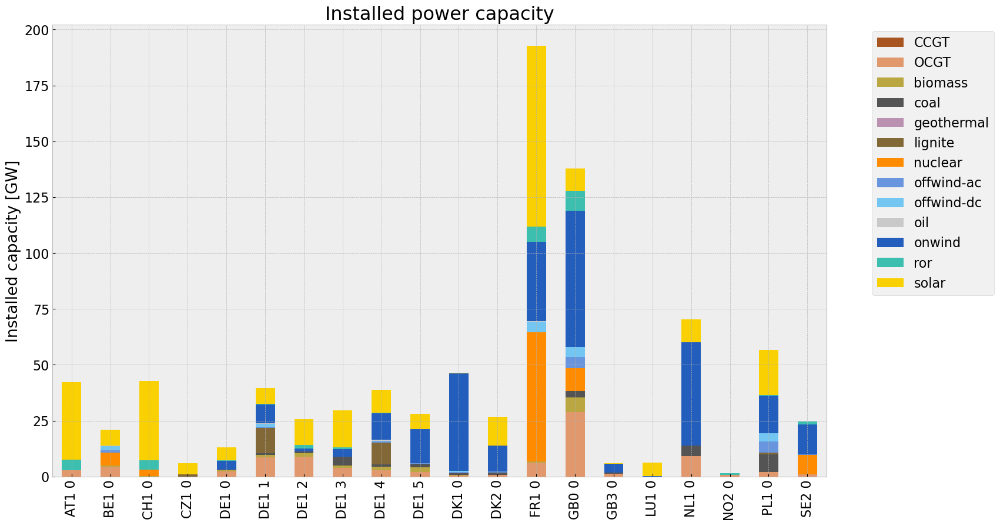

<Figure size 640x480 with 0 Axes>

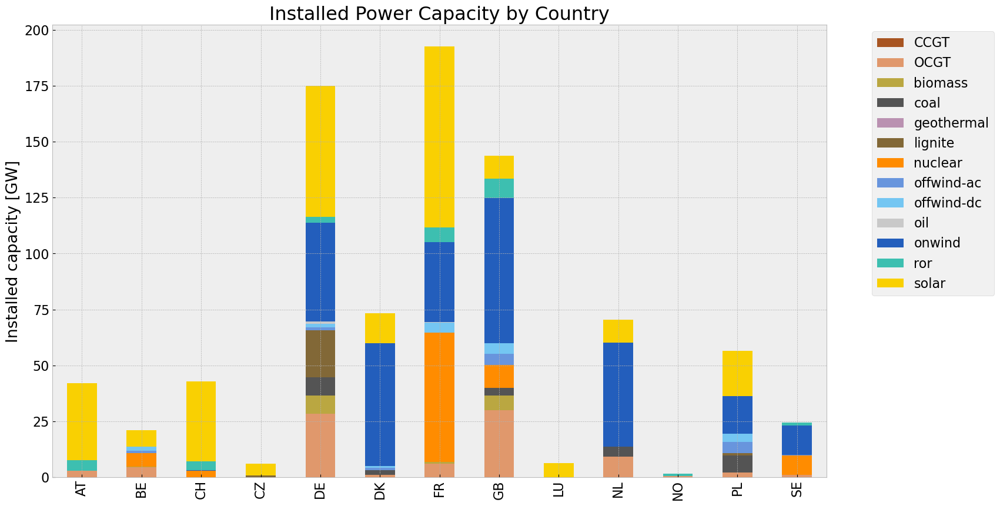

<Figure size 640x480 with 0 Axes>

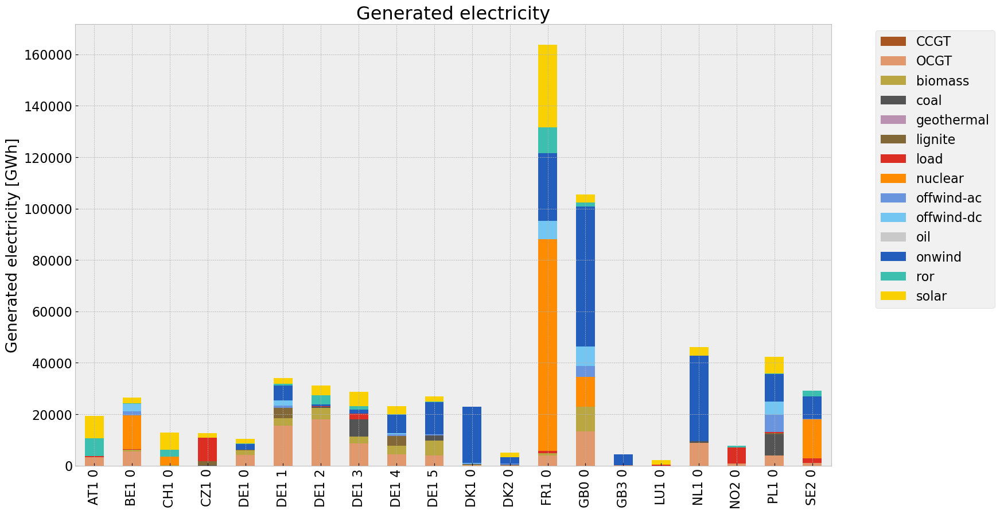

<Figure size 640x480 with 0 Axes>

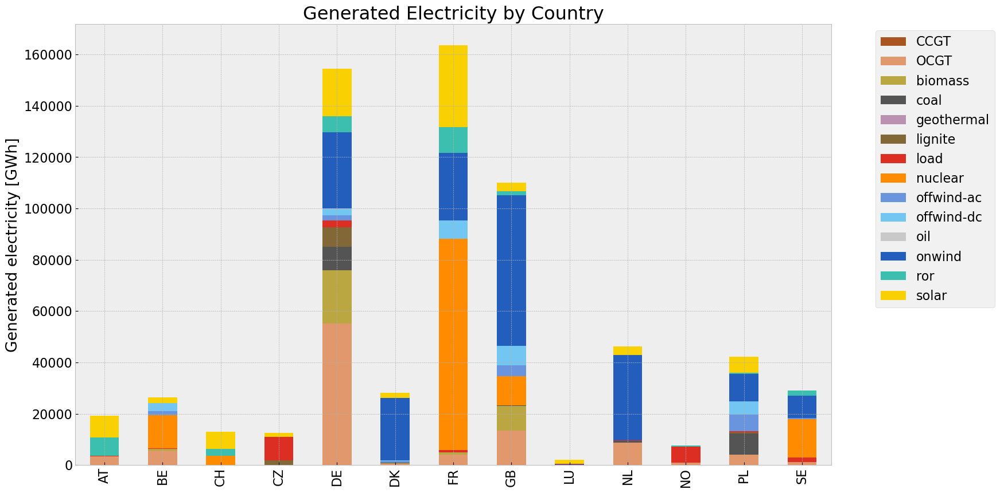

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\2572686274.py:23: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = p_country.groupby(n.generators.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\2572686274.py:40: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = sto_ctr.groupby(n.storage_units.carrier, axis=1).sum() #MW
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\2572686274.py:45: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\2572686274.py:51: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, freq='3H')
c:\Users\Jere

,Generation in MWh,efficiency,emissions in Tonnes CO2/MWh,emissions in Tonnes CO2
carrier,,,,
CCGT,0.000000e+00,0.580000,0.1980,0.000000e+00
OCGT,9.665147e+07,0.451621,0.1980,4.237402e+07
biomass,3.230939e+07,0.468000,0.0000,0.000000e+00
coal,1.854864e+07,0.329908,0.3361,1.889678e+07
geothermal,0.000000e+00,1.000000,0.1200,0.000000e+00
lignite,9.803536e+06,0.337285,0.4069,1.182698e+07
load,2.225433e+07,1.000000,0.0000,0.000000e+00
nuclear,1.253780e+08,0.326600,0.0000,0.000000e+00
offwind-ac,1.518040e+07,1.000000,0.0000,0.000000e+00


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


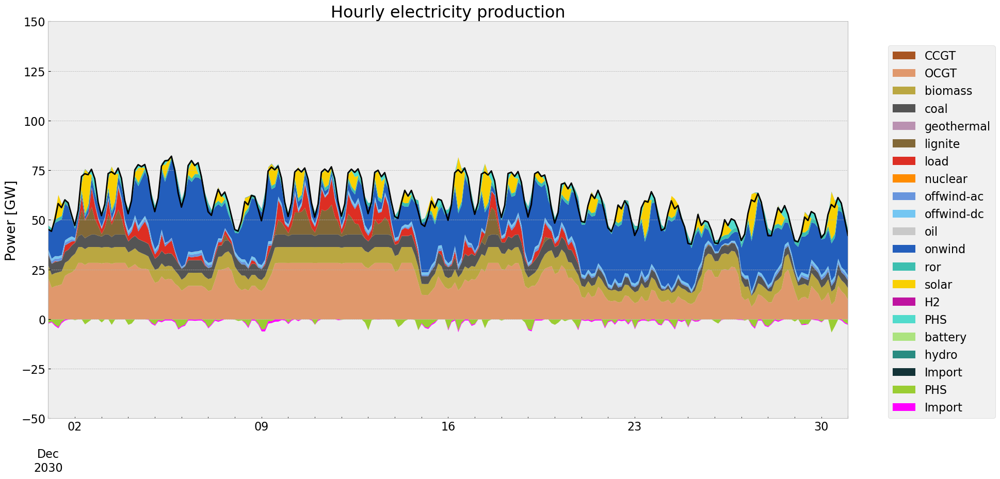

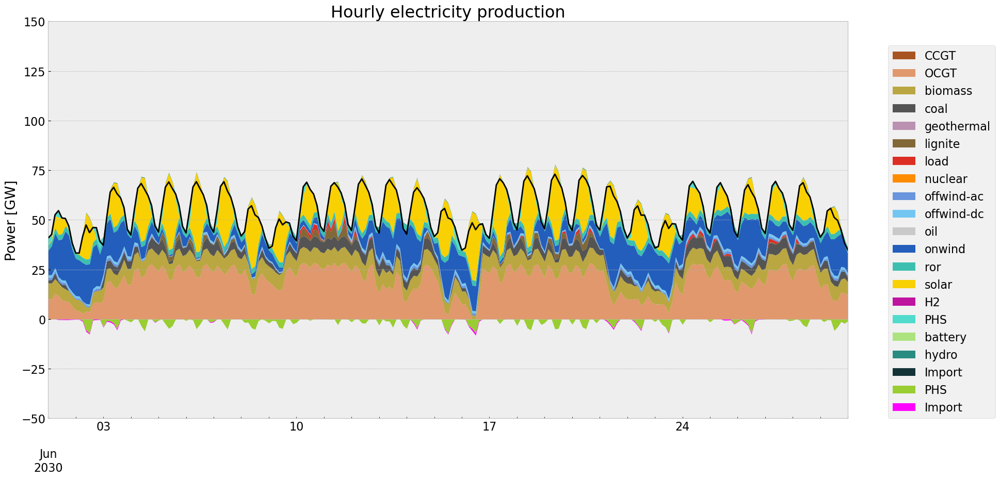

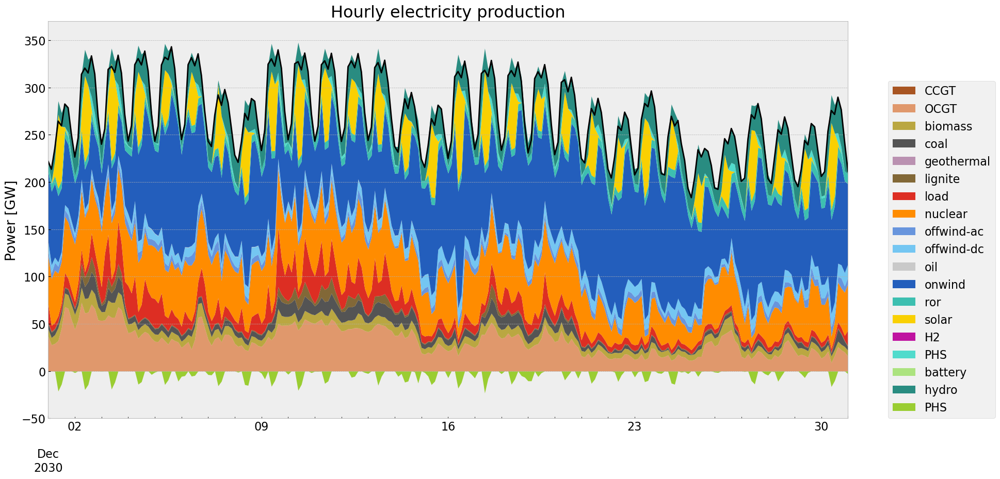

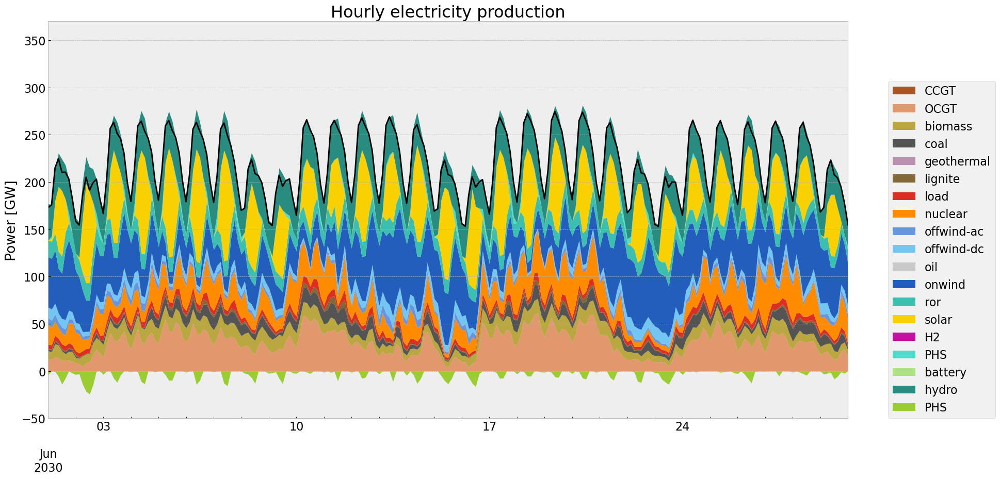

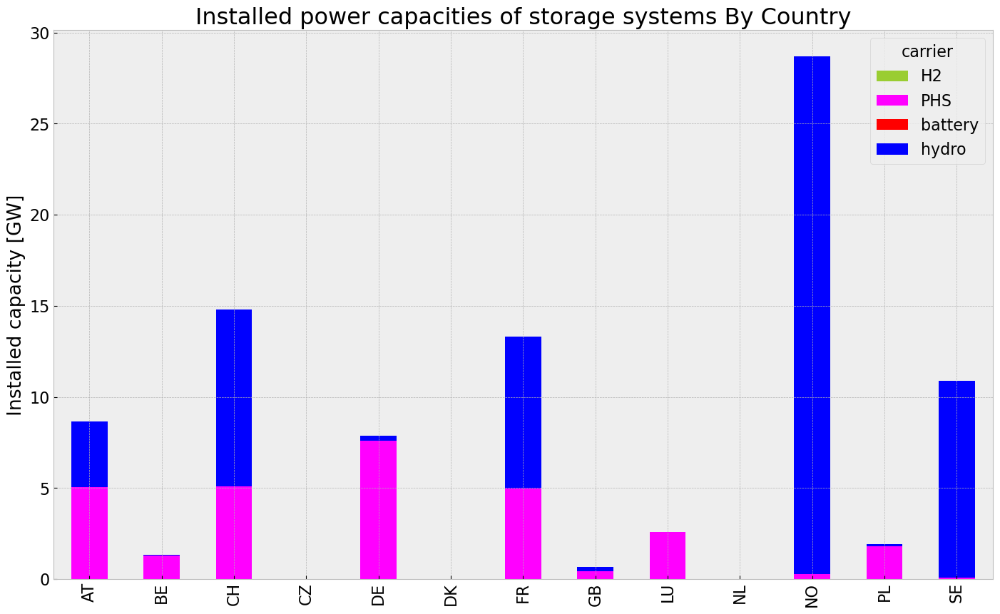

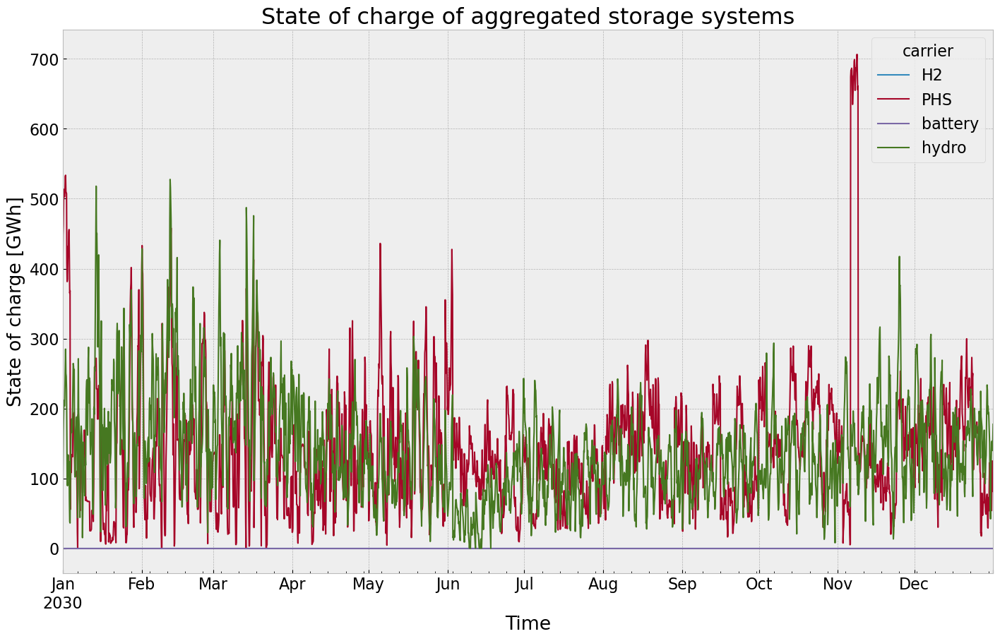

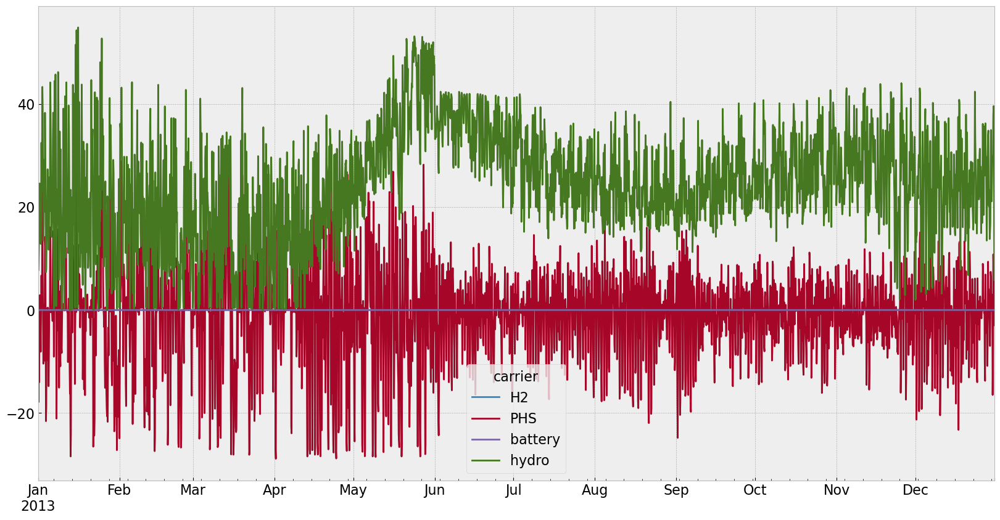

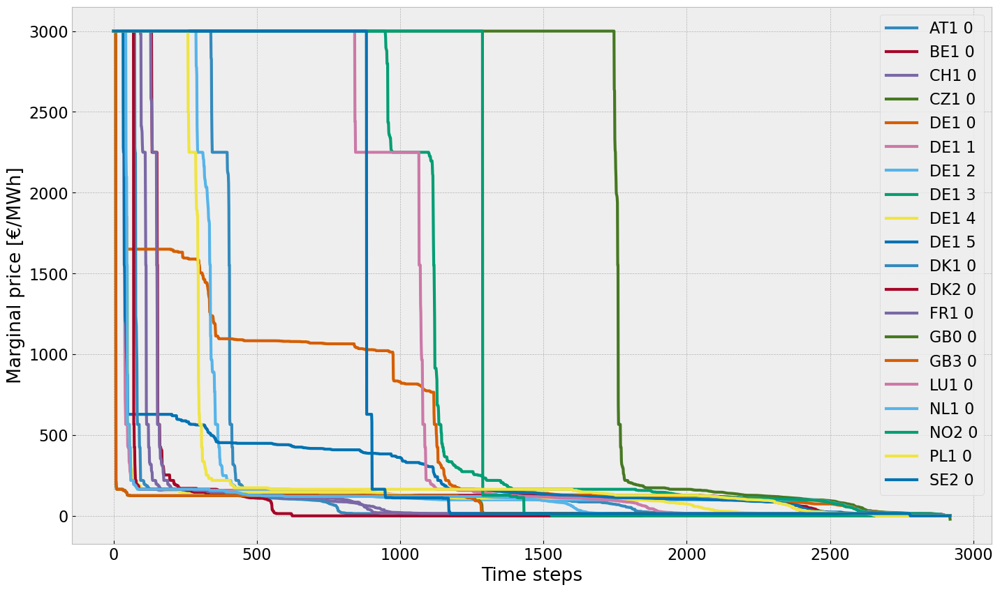

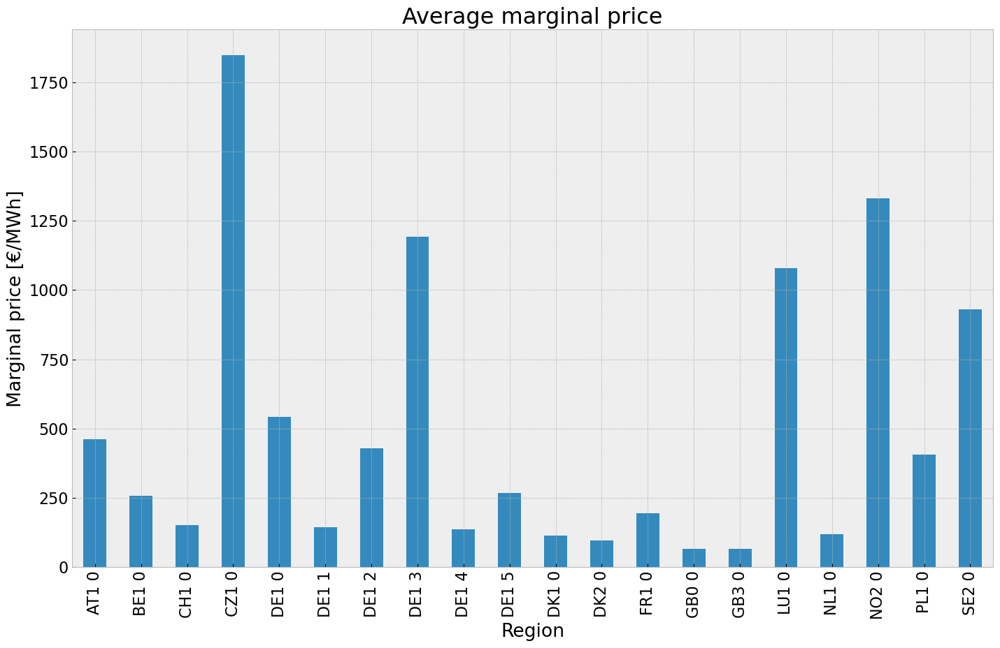

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


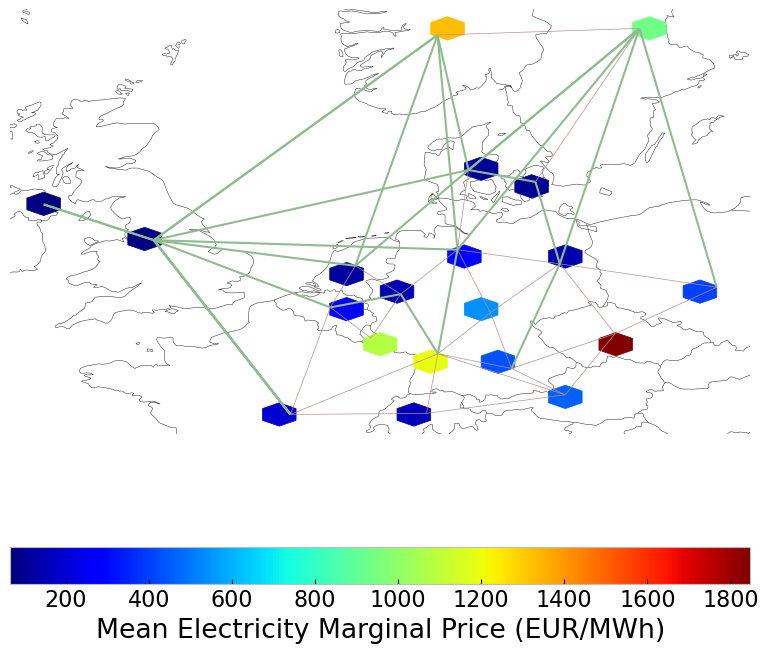

In [107]:
# Plotting
#installed cap
#capacities_noinv_roll = n3.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
#capacities_noinv_roll.fillna(0, inplace=True)
#gen = (capacities_noinv_roll.unstack()/1000).drop(columns=['load'],inplace=False)


capacities_noinv_roll = inst_cap_table(n3, color_cap)
cap_noinv_roll_country = inst_cap_table_country(n3, color_cap)

#Generation table
# consolidated generation table
#carrier = n3.generators.carrier.unique()
#df_tot_generation = n3.generators_t.p.sum()

#generations = pd.Series(index = n3.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

#for r in region:
    #for tech in carrier:
       # key = f"{r} {tech}"
        #if key in df_tot_generation.index:
            #try:
               # generations.loc[r, tech] = df_tot_generation[key]
                #print(generations.loc[r, tech])
            #except KeyError:
                #print('error')
#generations.fillna(0, inplace=True)

#gen_noinv_roll =(generations.unstack()/1000)#GWh

gen_noinv_roll  = gen_power_table(n3,colors_gen_table)
gen_noinv_roll_country = gen_power_table_country(n3,colors_gen_table)

#Snapshot Summer and Winter
#p = n3.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
#sto = n3.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)    

gen_curve(n3, '2030-12-01', '2030-12-31', colors_gen,'DE')
gen_curve(n3, '2030-06-01', '2030-06-30', colors_gen,'DE')
#generation curve all countries
#winter
gen_curve_tot(n3, '2030-12-01', '2030-12-31', colors_gen)
#summer
gen_curve_tot(n3, '2030-06-01', '2030-06-30', colors_gen)

#installed storage unit & stores
store_noinv_roll = inst_store_table(n3)

#State of Charge Storage unit
state_of_charge_plot(n3)
n3.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3).loc[pd.date_range(start="2013-01-01", end="2013-12-31",freq='3H')].plot(figsize=(20,10))


#Electricitty Price duration curve
price_dur_curve_plot(n3)

#avg electricity price
price_regions_table(n3)
price_regions(n3)

#Emission
em_noinv_roll =em_table(n3)
em_noinv_roll

In [108]:
e_balance = n3.statistics.energy_balance(aggregate_time=False, aggregate_bus=False).loc[:, :, "AC", :]
#e_balance.head()
e_balance.to_csv('energy_balance_DE_offwind.csv', sep=',', index=True, header=True, encoding='utf-8')

# Scenario Analysis

## Installed Capacity

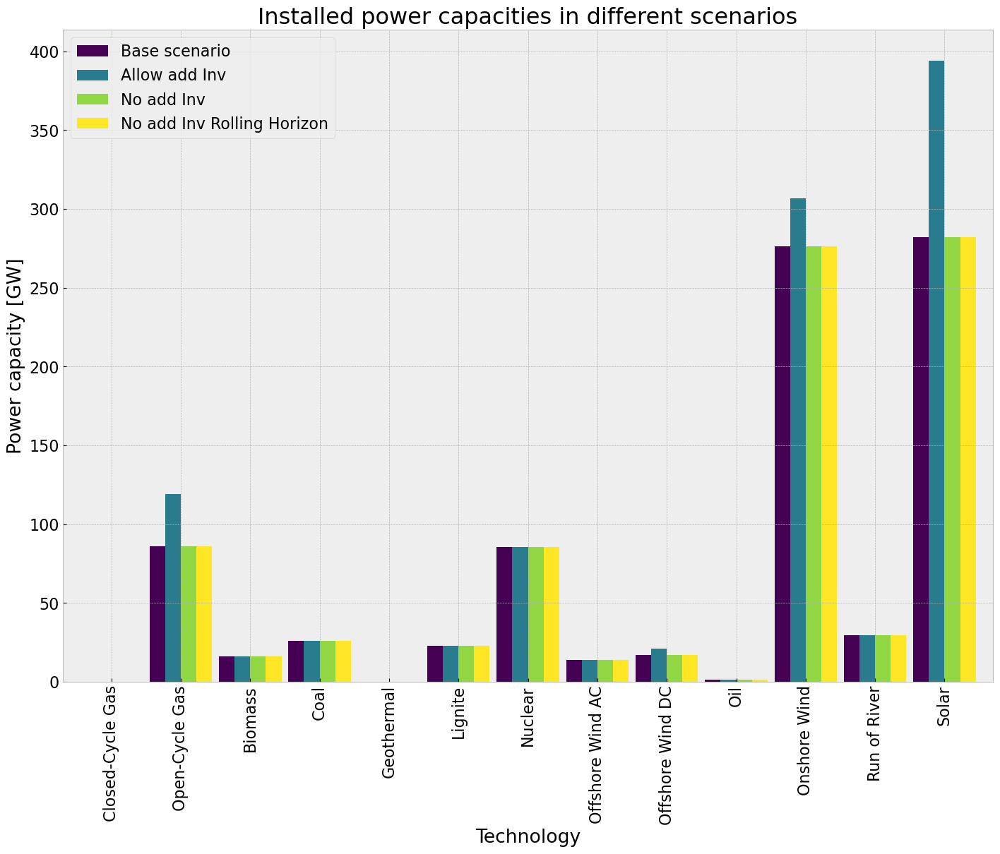

In [109]:
comp_inst_cap = pd.DataFrame(index=capacities_base.unstack().drop(columns=['load'],inplace=False).columns)

comp_inst_cap["Base scenario"] = capacities_base.groupby("carrier").sum().div(1e3).drop(index="load")
comp_inst_cap["Allow add Inv"] = capacities_inv.groupby("carrier").sum().div(1e3).drop(index="load")
comp_inst_cap["No add Inv"] = capacities_noinv.groupby("carrier").sum().div(1e3).drop(index="load")
comp_inst_cap["No add Inv Rolling Horizon"] = capacities_noinv_roll.groupby("carrier").sum().div(1e3).drop(index="load")

comp_inst_cap.rename(index = {"coal": "Coal"}, inplace=True)
comp_inst_cap.rename(index = {"OCGT": "Open-Cycle Gas"}, inplace=True)
comp_inst_cap.rename(index = {"CCGT": "Closed-Cycle Gas"}, inplace=True)
comp_inst_cap.rename(index = {"ror": "Run of River"}, inplace=True)
comp_inst_cap.rename(index = {"offwind-ac": "Offshore Wind AC"}, inplace=True)
comp_inst_cap.rename(index = {"offwind-dc": "Offshore Wind DC"}, inplace=True)
comp_inst_cap.rename(index = {"onwind": "Onshore Wind"}, inplace=True)
comp_inst_cap.rename(index = {"solar": "Solar"}, inplace=True)
comp_inst_cap.rename(index = {"oil": "Oil"}, inplace=True)
comp_inst_cap.rename(index = {"geothermal": "Geothermal"}, inplace=True)
comp_inst_cap.rename(index = {"nuclear": "Nuclear"}, inplace=True)
comp_inst_cap.rename(index = {"biomass": "Biomass"}, inplace=True)
comp_inst_cap.rename(index = {"lignite": "Lignite"}, inplace=True)

comp_inst_cap.fillna(0, inplace=True)

comp_inst_cap.plot.bar(figsize=(17,12),
                        color=cm.viridis(np.linspace(0, 5, len(comp_inst_cap))),
                        grid=True,
                        xlabel="Technology",
                        ylabel="Power capacity [GW]",
                        title=f"Installed power capacities in different scenarios",
                        #ylim=[0,350],
                        width=0.9
)
plt.show()

In [110]:
comp_inst_cap

,Base scenario,Allow add Inv,No add Inv,No add Inv Rolling Horizon
carrier,,,,
Closed-Cycle Gas,0.000000,0.000000,0.000000,0.000000
Open-Cycle Gas,85.854585,119.121498,85.854585,85.854585
Biomass,15.977059,15.977059,15.977059,15.977059
Coal,25.968677,25.968677,25.968677,25.968677
Geothermal,0.000000,0.000000,0.000000,0.000000
Lignite,22.848983,22.848983,22.848983,22.848983
Nuclear,85.354000,85.354000,85.354000,85.354000
Offshore Wind AC,13.835970,13.835970,13.835970,13.835970
Offshore Wind DC,16.947674,21.031615,16.947674,16.947674


## Power Generation

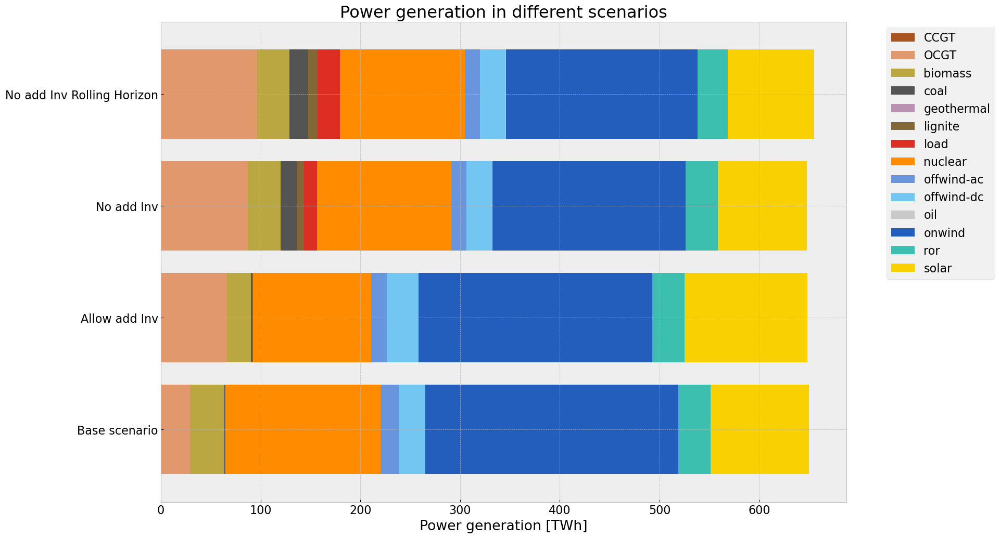

In [111]:
comp_gen_electr = pd.DataFrame(index = ["Base scenario", "Allow add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns = tech_list_gen_table)

comp_gen_electr.loc["Base scenario"] = gen_base.sum().div(1e3) # TWh/a
comp_gen_electr.loc["Allow add Inv"] = gen_inv.sum().div(1e3) # TWh/a
comp_gen_electr.loc["No add Inv"] = gen_noinv.sum().div(1e3) # TWh/a
comp_gen_electr.loc["No add Inv Rolling Horizon"] = gen_noinv_roll.sum().div(1e3) # TWh/a


#comp_gen_electr.rename(columns = {"coal": "Coal"}, inplace=True)
#comp_gen_electr.rename(columns = {"gas": "Gas"}, inplace=True)
#comp_gen_electr.rename(columns = {"hydro": "Hydro"}, inplace=True)
#comp_gen_electr.rename(columns = {"offwind": "Offshore Wind"}, inplace=True)
#comp_gen_electr.rename(columns = {"onwind": "Onshore Wind"}, inplace=True)
#comp_gen_electr.rename(columns = {"solar": "Solar"}, inplace=True)
#comp_gen_electr.rename(columns = {"oil": "Oil"}, inplace=True)
#comp_gen_electr.rename(columns = {"geothermal": "Geothermal"}, inplace=True)
#comp_gen_electr.rename(columns = {"nuclear": "Nuclear"}, inplace=True)

comp_gen_electr.fillna(0, inplace=True)
comp_gen_electr.plot.barh(figsize=(17,12),
                        color=colors_gen_table,
                        grid=True,
                        stacked=True, 
                        ylabel="",
                        xlabel="Power generation [TWh]",
                        title=f"Power generation in different scenarios",
                        #xlim=[0,200],
                        width=0.8
)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

## Installed Storage Capacities

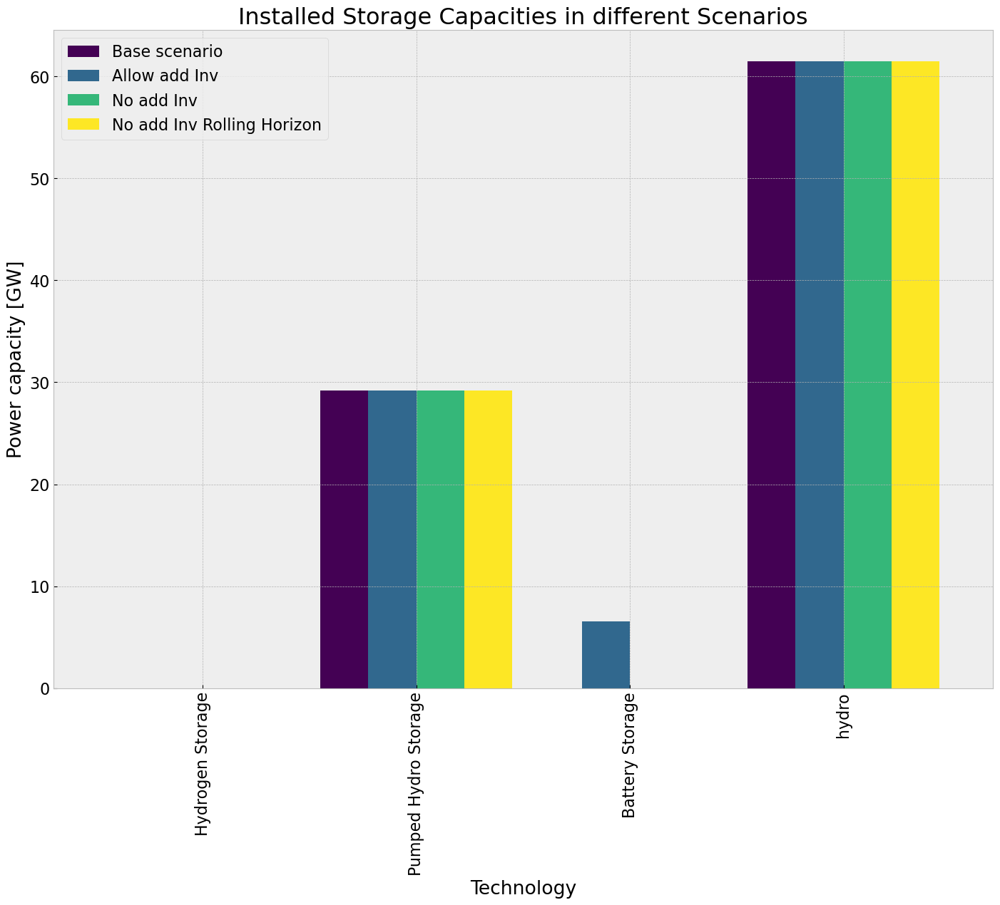

In [112]:
comp_inst_store = pd.DataFrame(index=store_base.unstack().columns)

comp_inst_store["Base scenario"] = store_base.groupby("carrier").sum()
comp_inst_store["Allow add Inv"] = store_inv.groupby("carrier").sum()
comp_inst_store["No add Inv"] = store_noinv.groupby("carrier").sum()
comp_inst_store["No add Inv Rolling Horizon"] = store_noinv_roll.groupby("carrier").sum()

comp_inst_store.rename(index = {"battery": "Battery Storage"}, inplace=True)
comp_inst_store.rename(index = {"H2": "Hydrogen Storage"}, inplace=True)
comp_inst_store.rename(index = {"Hydro": "Reservoir & Dam"}, inplace=True)
comp_inst_store.rename(index = {"PHS": "Pumped Hydro Storage"}, inplace=True)


comp_inst_store.fillna(0, inplace=True)

comp_inst_store.plot.bar(figsize=(17,12),
                        color=cm.viridis(np.linspace(0, 1, len(comp_inst_store))),
                        grid=True,
                        xlabel="Technology",
                        ylabel="Power capacity [GW]",
                        title=f"Installed Storage Capacities in different Scenarios",
                        #ylim=[0,350],
                        width=0.9
)
plt.show()

## System Cost

In [113]:
tech_comp = system_cost_base.index.tolist()
comp_system_cost = pd.DataFrame(index = ["Base scenario", "Allowed add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns =tech_comp)

#demand = n.snapshot_weightings.generators @ n.loads_t.p_set.sum(axis=1) # the same in each scenario

comp_system_cost.loc["Base scenario"] = system_cost_base # Million €/a
comp_system_cost.loc["Allowed add Inv"] = system_cost_inv # Million €/a
#if tot_cost_0_PV > 0: 
#    comp_system_cost.loc["0% PV potential"] = system_cost_0_PV # Million €/a
#else: comp_system_cost.loc["0% PV potential"] = 0.0
#if tot_cost_20_PV > 0: 
#    comp_system_cost.loc["20% PV potential"] = system_cost_20_PV # Million €/a
#else: comp_system_cost.loc["20% PV potential"] = 0.0
comp_system_cost.loc["No add Inv"] = system_cost_noinv # Million €/a
comp_system_cost.loc["No add Inv Rolling Horizon"] = system_cost_noinv_roll # Million €/a

#if 'AC' in system_cost_base:
#   comp_system_cost.AC = comp_system_cost.AC-system_cost_base.AC # expenditure for already existing transmission lines

#comp_system_cost[comp_system_cost<0] = 0 # since we subtact the AC cost (for the 0% or 20%) 
comp_system_cost.drop('-', axis=1, inplace=True)
#comp_system_cost.iloc[0,0] = system_cost_base.AC


#comp_system_cost = comp_system_cost   #Million eur0/

#comp_system_cost.rename(columns = {"battery storage": "Battery storage"}, inplace=True)
#comp_system_cost.rename(columns = {"hydrogen storage underground": "Hydrogen storage underground"}, inplace=True)

comp_system_cost.fillna(0, inplace=True)
comp_system_cost = comp_system_cost.div(1e3) # Billion €

#move load shedding to the last col
# Specify the column name to move
column_to_move = 'Load shedding'

# Create a new list of column names without the column to move
new_columns = [col for col in comp_system_cost.columns if col != column_to_move]

# Append the column to move to the end
new_columns.append(column_to_move)

# Reorder the columns
comp_system_cost = comp_system_cost[new_columns]


C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\1871120118.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if comp_system_cost.columns[i] == n.carriers.nice_name[j]:
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\1871120118.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_comp.append(n.carriers.color[j])


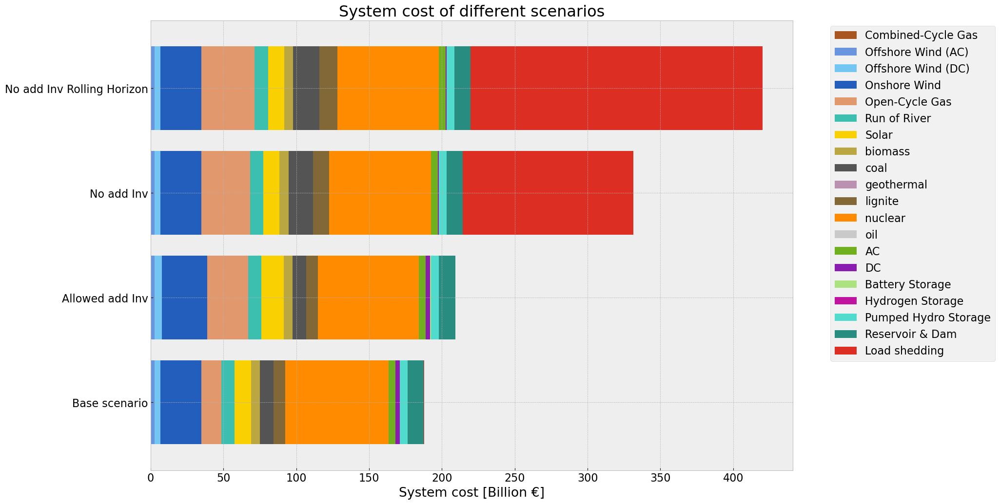

In [114]:
colors_comp = []

for i in range(len(comp_system_cost.columns)):
    for j in range(len(n.carriers.nice_name)):
        if comp_system_cost.columns[i] == n.carriers.nice_name[j]:
            colors_comp.append(n.carriers.color[j])
            #print(n.carriers.nice_name[j],comp_system_cost.columns[i],n.carriers.color[j])
            break  # break the inner loop once a match is found  



comp_system_cost.plot.barh(figsize=(17,12),
                        color=colors_comp,
                        grid=True,
                        stacked=True,
                        ylabel="",
                        xlabel="System cost [Billion €]",
                        title=f"System cost of different scenarios",
                        #xlim=[0,100],
                        width=0.8
)
# Move legend outside of the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

## Curtailment

In [115]:
comp_curtailment = pd.DataFrame(index = ["Base scenario", "Allow add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns = stat_base.loc["Generator"].index)

comp_curtailment.loc["Base scenario"] = stat_base.loc["Generator"].Curtailment.div(1e6) # TWh
comp_curtailment.loc["Allow add Inv"] = stat_inv.loc["Generator"].Curtailment.div(1e6) # TWh
comp_curtailment.loc["No add Inv"] = stat_noinv.loc["Generator"].Curtailment.div(1e6) # TWh
comp_curtailment.loc["No add Inv Rolling Horizon"] = stat_noinv_roll.loc["Generator"].Curtailment.div(1e6) # TWh

comp_curtailment.fillna(0, inplace=True)

In [116]:
color_curtailment=[]

for i in range(len(comp_curtailment.columns)):
    for j in range(len(n.carriers.nice_name)):
        if comp_curtailment.columns[i] == n.carriers.nice_name[j]:
            color_curtailment.append(n.carriers.color[j])
            #print(n.carriers.nice_name[j],comp_system_cost.columns[i],n.carriers.color[j])
            break  # break the inner loop once a match is found 

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\3109801822.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if comp_curtailment.columns[i] == n.carriers.nice_name[j]:
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\3109801822.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  color_curtailment.append(n.carriers.color[j])


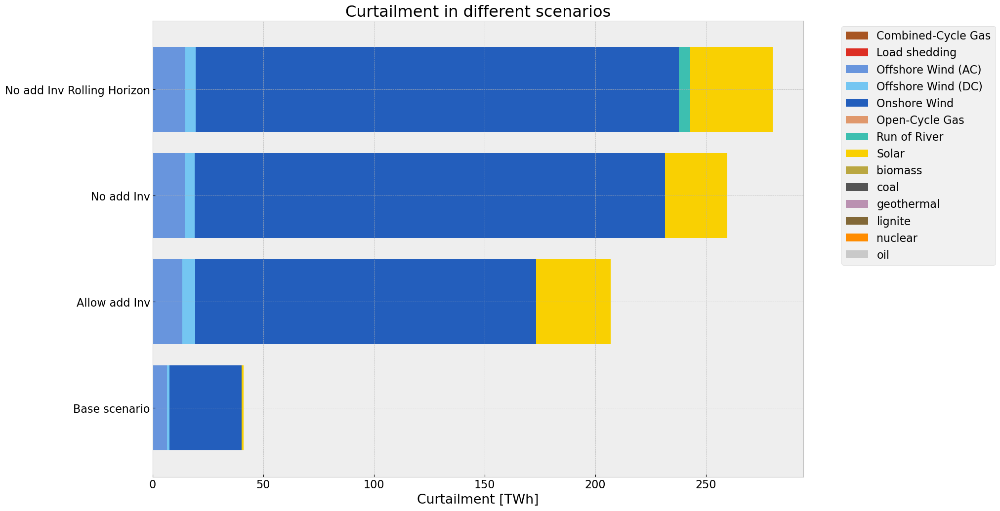

In [117]:
comp_curtailment.plot.barh(figsize=(17,12),
                        color=color_curtailment,
                        grid=True,
                        stacked=True, 
                        ylabel="",
                        xlabel="Curtailment [TWh]",
                        title=f"Curtailment in different scenarios",
                        #xlim=[0,120],
                        width=0.8
)
# Move legend outside of the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

## Emission

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_8104\189732353.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_comp.append(n.carriers.color[j])


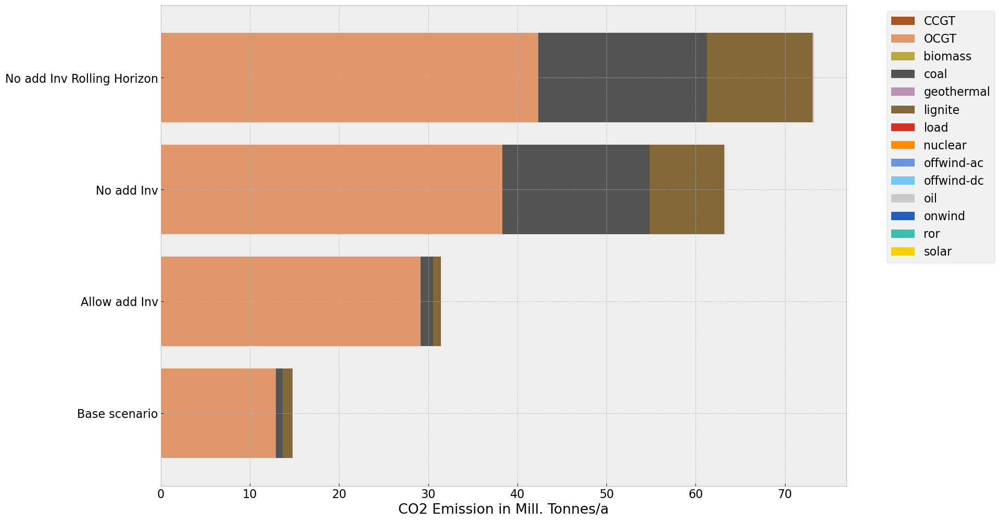

In [118]:
tech_comp = em_base.index.tolist()
comp_system_em = pd.DataFrame(index = ["Base scenario", "Allow add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns =tech_comp)

#demand = n.snapshot_weightings.generators @ n.loads_t.p_set.sum(axis=1) # the same in each scenario

comp_system_em.loc["Base scenario"] = em_base['emissions in Tonnes CO2']/1e6 # Mill. Tonnes CO2 /a
comp_system_em.loc["Allow add Inv"] = em_inv['emissions in Tonnes CO2'] /1e6 # Mill. Tonnes CO2 /a
comp_system_em.loc["No add Inv"] = em_noinv['emissions in Tonnes CO2'] /1e6 # Mill. Tonnes CO2 /a
comp_system_em.loc["No add Inv Rolling Horizon"] = em_noinv_roll['emissions in Tonnes CO2'] /1e6 # Mill. Tonnes CO2 /a

comp_system_em.fillna(0, inplace=True)

colors_comp = []

for i in range(len(comp_system_em.columns)):
    for j in range(len(n.carriers.index)):
        if comp_system_em.columns[i] == n.carriers.index[j]:
            colors_comp.append(n.carriers.color[j])
            #print(n.carriers.nice_name[j],comp_system_cost.columns[i],n.carriers.color[j])
            break  # break the inner loop once a match is found  



comp_system_em.plot.barh(figsize=(17,12),
                        color=colors_comp,
                        grid=True,
                        stacked=True,
                        ylabel="",
                        xlabel="CO2 Emission in Mill. Tonnes/a",
                        #title=f"Average system cost in different scenarios",
                        #xlim=[0,100],
                        width=0.8
)
#global_constraint
#plt.axvline(x=n.global_constraints.loc['CO2Limit','constant']/1e6, color='r', linestyle='-', linewidth=2, label='CO2 cap')
# Move legend outside of the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()